In [1]:
import torch
import torch.nn as nn

from pandas import read_csv
from sklearn.model_selection import train_test_split

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 15
fig_size[1] = 5
plt.rcParams["figure.figsize"] = fig_size

In [3]:
def prepare_data(df, num_elements=50):
    new_data = []
    length = df.shape[0]
    current_index = 0
    step = int(0.2 * num_elements)
    while(current_index <= length - num_elements):
        new_data.append(df[current_index:current_index+num_elements])
        current_index += step
    return new_data

In [4]:
class LSTM(nn.Module):
    def __init__(self, input_size=1, hidden_layer_size=100, output_size=10):
        super().__init__()
        self.hidden_layer_size = hidden_layer_size

        self.lstm = nn.LSTM(input_size, hidden_layer_size)

        self.linear = nn.Linear(hidden_layer_size, output_size)

        self.hidden_cell = (torch.zeros(1,1,self.hidden_layer_size),
                            torch.zeros(1,1,self.hidden_layer_size))

    def forward(self, input_seq):
        lstm_out, self.hidden_cell = self.lstm(input_seq.view(len(input_seq) ,1, -1), self.hidden_cell)
        predictions = self.linear(lstm_out.view(len(input_seq), -1))
        return predictions[-1]

In [5]:
def evaluate(model, X_test, y_test):
    predictions = []
    model.eval()
    with torch.no_grad():
        predictions = [best_model(seq) for (seq, labels) in zip(X_test, y_test)]
    pred = [torch.cat((i, j)) for (i, j) in zip(X_test, predictions)]
    actual_predictions = np.array([np.array(i) for i in pred])
    mape = [np.mean(np.abs(actual_predictions[i] - y_test[i])/np.abs(y_test[i])) for i in range(len(y_test))]
    print(sum(mape) / len(mape))
    rmse = [np.mean((actual_predictions[i] - y_test[i])**2)**.5 for i in range(len(y_test))]
    print(sum(rmse) / len(rmse))

In [6]:
def learn(num, count, data_len, lr=0.01):
    num = [str(i) for i in range(num)]
    p1 = [read_csv('ics_data_preprocessed/06_Smart_Meter_45/P1/' + str(count) + '/' + n + '.csv', squeeze=True, parse_dates=['ts'], index_col='ts') for n in num]
    
    p1 = [prepare_data(df, data_len) for df in p1]
    p1 = sum(p1, [])
    p1 = [df.values.tolist() for df in p1]
    
    train, test = train_test_split(p1, test_size=0.2, random_state=42)
    train_data_normalized = train
    test_data_normalized = test
    
    train_data, val_data = train_test_split(train_data_normalized, test_size=0.15, random_state=42)
    train_data = torch.FloatTensor(train_data)
    val_data = torch.FloatTensor(val_data)
    test_data = torch.FloatTensor(test_data_normalized)
    
    X_train = train_data[:, :-10]
    y_train = train_data[:, -10:]
    X_val = val_data[:, :-10]
    y_val = val_data[:, -10:]
    X_test = test_data[:, :-10]
    y_test = test_data[:, -10:]
    
    print("Data is ready")
    
    best_model = LSTM()
    loss_function = nn.MSELoss()
    
    best_hidden_layer_size = 50
    
    for hidden_layer_size in [50, 100, 200, 250]:
        losses = []
        val_losses = []
    
        model = LSTM(hidden_layer_size=hidden_layer_size)
        optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    
        epochs = 20
        
        for i in range(epochs):
            if i%5 != 1:
                print("epoch:", i)
            model.train()
            
            losses_tmp = []
            for (seq, labels) in zip(X_train, y_train):
                optimizer.zero_grad()
                model.hidden_cell = (torch.zeros(1, 1, model.hidden_layer_size),
                                     torch.zeros(1, 1, model.hidden_layer_size))

                y_pred = model(seq)

                single_loss = loss_function(y_pred, labels)
                losses_tmp.append(single_loss)
                single_loss.backward()
                optimizer.step()
            
            losses.append(sum(losses_tmp) / len(losses_tmp))
            
            model.eval()

            with torch.no_grad():
                val_lo = []
                for (seq, labels) in zip(X_val, y_val):
                    y_pred = model(seq)

                    single_loss = loss_function(y_pred, labels)
                    val_lo.append(single_loss)

                if (len(val_losses) == 0) or ((sum(val_lo) / len(val_lo)) < min(val_losses)):
                    best_hidden_layer_size = hidden_layer_size
                    best_model = model
                
                val_losses.append(sum(val_lo) / len(val_lo))
            
            if (len(val_losses) > 0 and i%5 == 1):
                print(val_losses[-1], min(val_losses))
            if (len(val_losses) > 1) and (val_losses[-1] != min(val_losses)) and ((abs(val_losses[-1] - min(val_losses)) < 0.01) or (val_losses[-1] > min(val_losses))):
                break

        print(f'epoch: {i:3} loss: {single_loss.item():10.10f}')
        
        print("tmp best model hidden size:", best_hidden_layer_size)
    
        predictions = []
        best_model.eval()
        with torch.no_grad():
            predictions = [best_model(seq) for (seq, labels) in zip(X_test, y_test)]
        pred = [torch.cat((i, j)) for (i, j) in zip(X_test, predictions)]
        actual_predictions = np.array([np.array(i) for i in pred])
        mape = [np.mean(np.abs(actual_predictions[i] - test[i])/np.abs(test[i])) for i in range(len(test))]
        print(sum(mape) / len(mape))
        rmse = [np.mean((actual_predictions[i] - test[i])**2)**.5 for i in range(len(test))]
        print(sum(rmse) / len(rmse))
        
        plt.figure()
        plt.plot(losses)
        plt.figure()
        plt.plot(val_losses)
        
    print("best model hidden size:", best_hidden_layer_size)
    
    predictions = []
    best_model.eval()
    with torch.no_grad():
        predictions = [best_model(seq) for (seq, labels) in zip(X_test, y_test)]
    pred = [torch.cat((i, j)) for (i, j) in zip(X_test, predictions)]
    actual_predictions = np.array([np.array(i) for i in pred])
    mape = [np.mean(np.abs(actual_predictions[i] - test[i])/np.abs(test[i])) for i in range(len(test))]
    print(sum(mape) / len(mape))
    rmse = [np.mean((actual_predictions[i] - test[i])**2)**.5 for i in range(len(test))]
    print(sum(rmse) / len(rmse))
    
#     predictions = []
#     model.eval()
#     with torch.no_grad():
#         predictions = [best_model(seq) for (seq, labels) in zip(X_test, y_test)]
#         pred = [torch.cat((i, j)) for (i, j) in zip(X_test, predictions)]
#         actual_predictions = np.array([np.array(i) for i in pred])
#     mape = [np.mean(np.abs(actual_predictions[i] - y_test[i])/np.abs(y_test[i])) for i in range(len(y_test))]
#     print(sum(mape) / len(mape))
#     rmse = [np.mean((actual_predictions[i] - y_test[i])**2)**.5 for i in range(len(y_test))]
#     print(sum(rmse) / len(rmse))
    
    return best_model
     

In [37]:
# best_model = LSTM()
# loss_function = nn.MSELoss()

# 1s

Data is ready
epoch: 0
tensor(235617.3438) tensor(235617.3438)
epoch: 2
epoch: 3
epoch:   3 loss: 30669.1894531250
epoch: 0
tensor(238662.8281) tensor(238297.7031)
epoch:   1 loss: 22244.2167968750
epoch: 0
tensor(242927.2812) tensor(242663.1406)
epoch:   1 loss: 15398.1542968750
epoch: 0
tensor(243331.1406) tensor(243126.0625)
epoch:   1 loss: 14894.4599609375
epoch: 0
tensor(243371.1094) tensor(243371.1094)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(243326.8125) tensor(243326.8125)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(243320.2969) tensor(243320.2969)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(243318.2031) tensor(243318.2031)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 14911.2089843750
best model hidden size: 300
0.16872256742647934
73.16427022289214


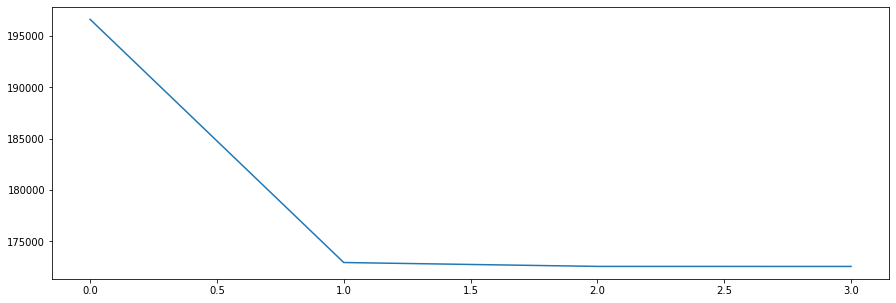

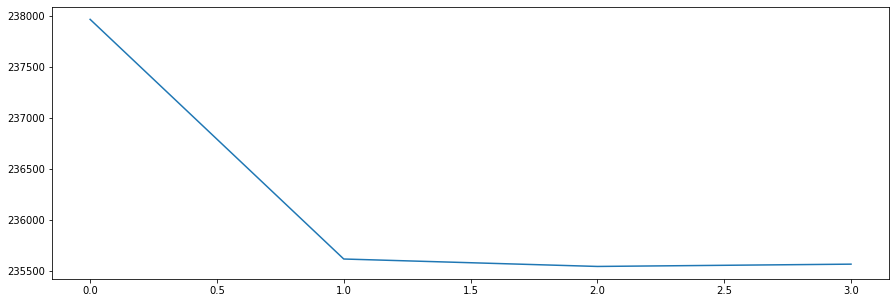

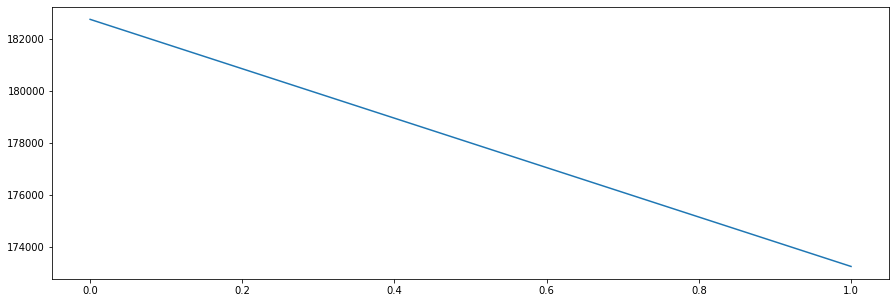

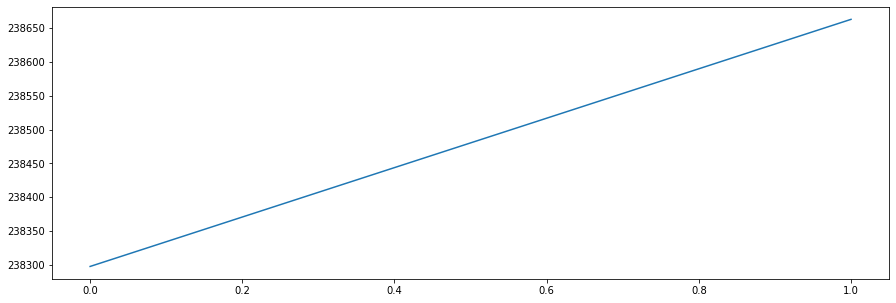

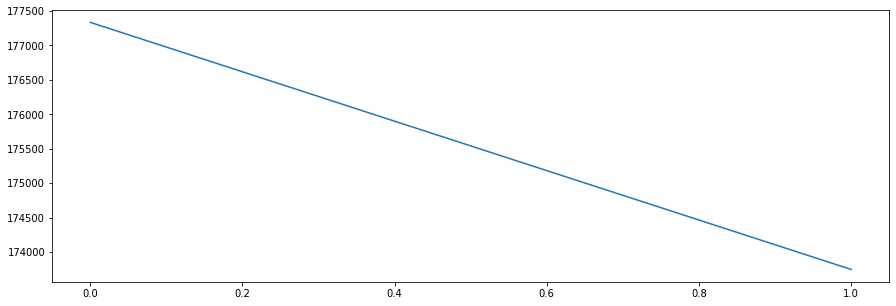

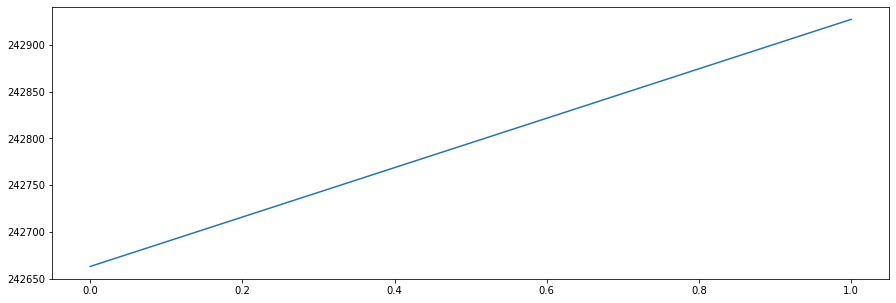

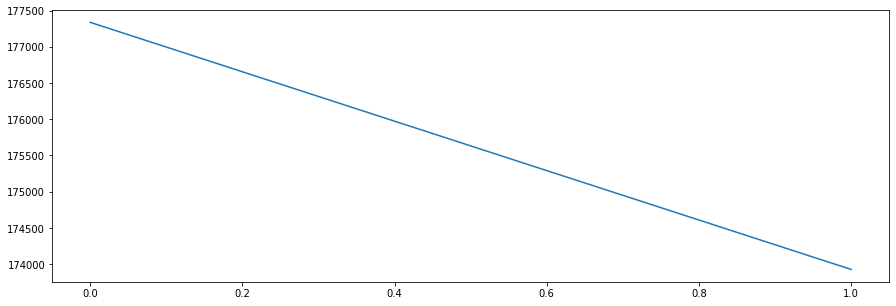

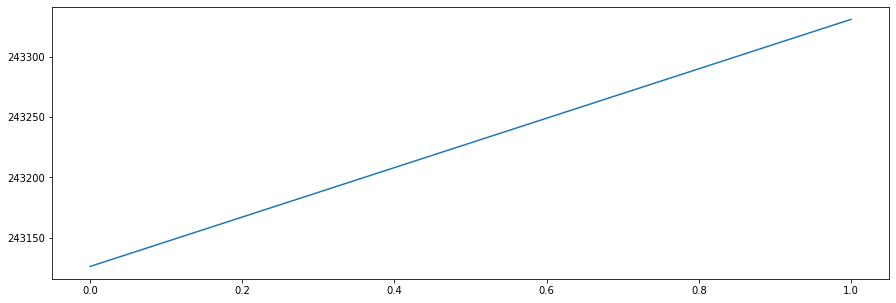

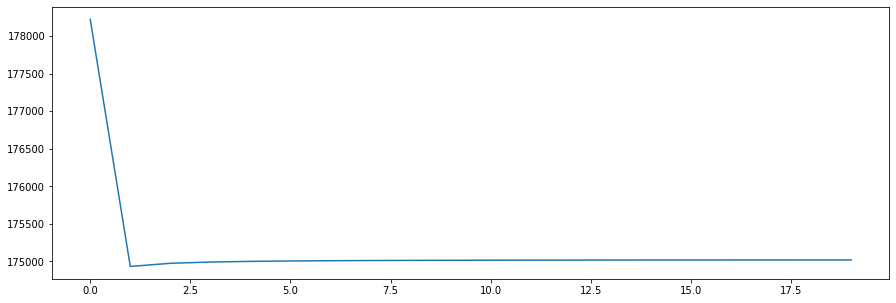

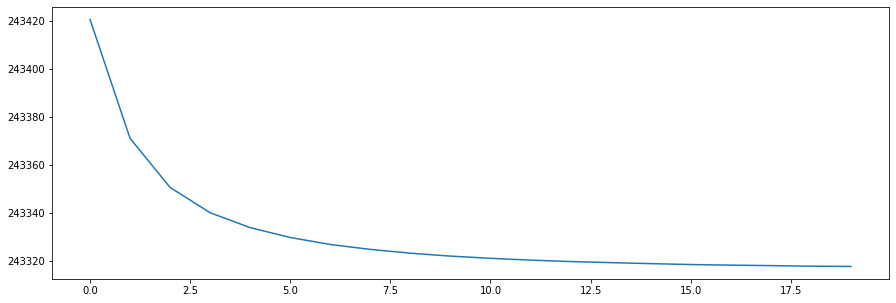

In [7]:
new_model = learn(22, 1000, 50, 0.2)

Data is ready
epoch: 0
tensor(389250.3125) tensor(389250.3125)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(348212.9688) tensor(348212.9688)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(347121.0938) tensor(347121.0938)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(347056.4375) tensor(347056.4375)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 47811.4218750000
epoch: 0
tensor(358127.8125) tensor(358127.8125)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(347970.1875) tensor(347970.1875)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(347939.5625) tensor(347939.5625)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(347937.1562) tensor(347937.1562)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 43320.1445312500
epoch: 0
tensor(350958.1875) tensor(350958.1875)
epoch: 2
epoch: 3
epoch: 4
epoch:   4 loss: 35297.8554687500
epoch: 0
tensor(351635.1250) tensor(351635.1250)
epoch: 2
epoch:   2 loss: 31734.4101562500
epoch: 0
tensor(354464.5625) tensor(354464.5625)
epoch: 2
epoch:   2 loss: 25730.0664062500


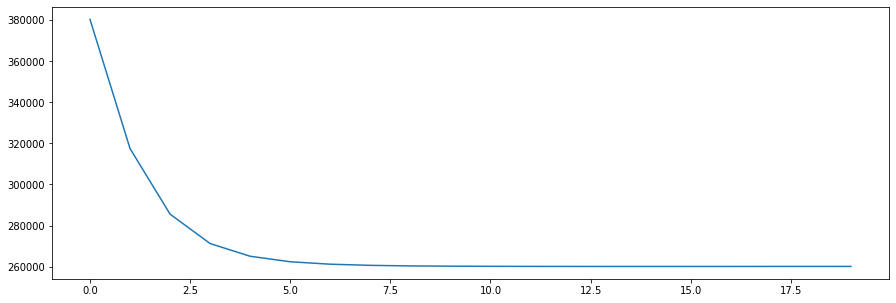

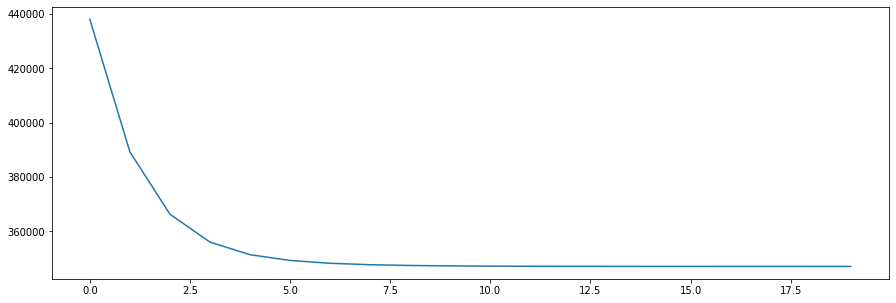

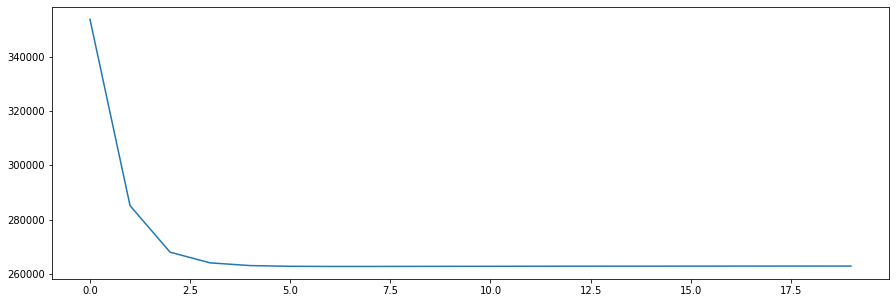

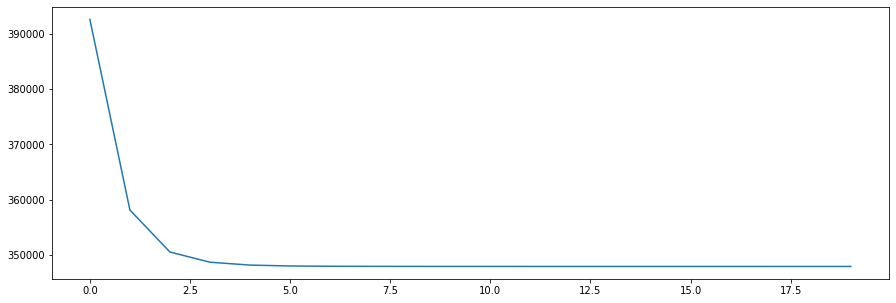

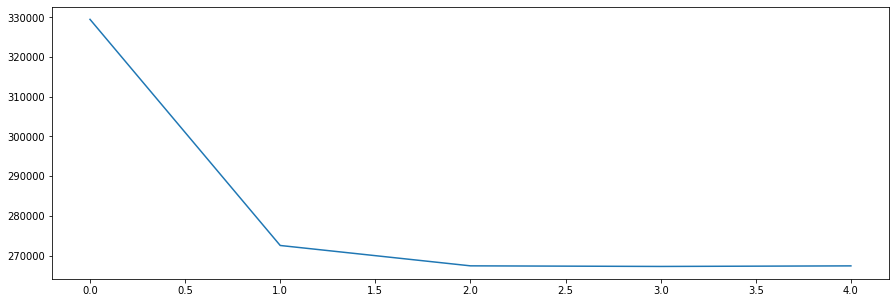

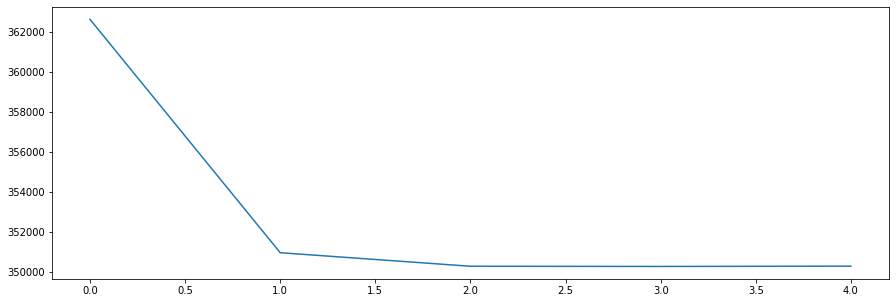

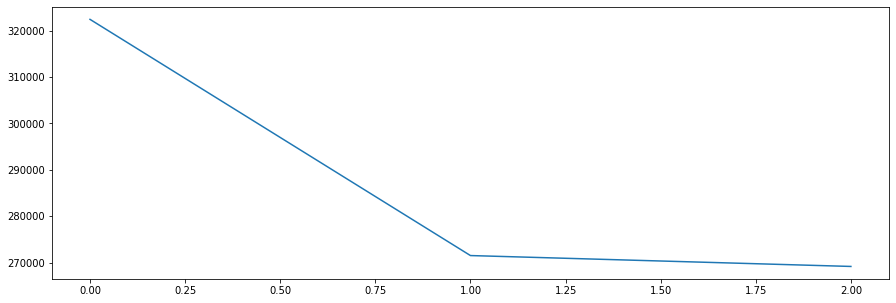

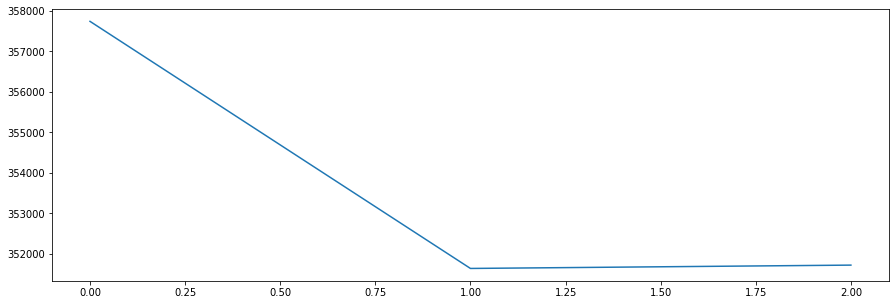

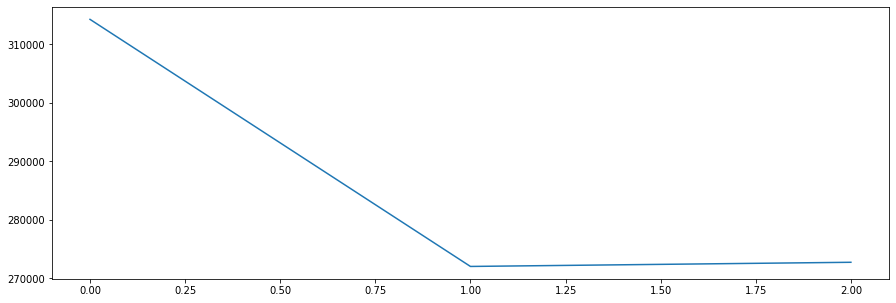

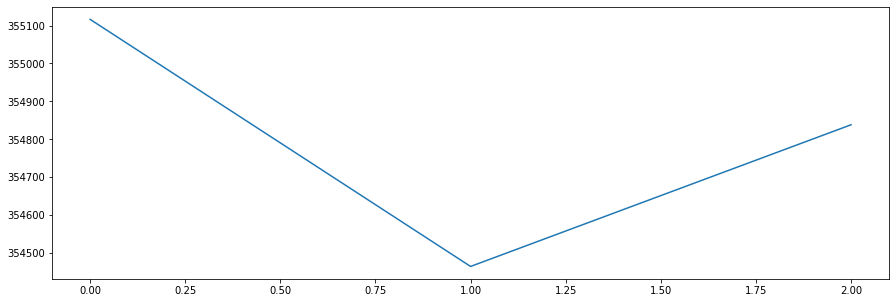

In [8]:
new_model = learn(22, 1000, 100, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(64234.0312) tensor(64234.0312)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
epoch:   5 loss: 37932.7031250000
epoch: 0
tensor(47671.7344) tensor(47671.7344)
epoch: 2
epoch:   2 loss: 38846.1875000000
epoch: 0
tensor(57076.5156) tensor(47252.4219)
epoch:   1 loss: 68400.4140625000
epoch: 0
tensor(64660.8555) tensor(46676.8008)
epoch:   1 loss: 86060.7265625000
epoch: 0
tensor(72615.8516) tensor(49747.4570)
epoch:   1 loss: 102426.5703125000
best model hidden size: 300
0.14178089586366135
69.49690131823058


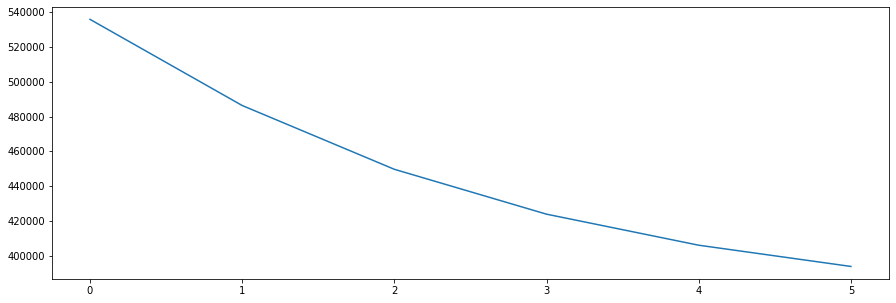

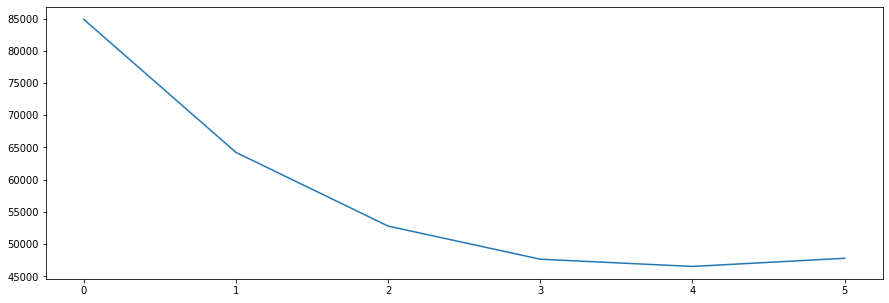

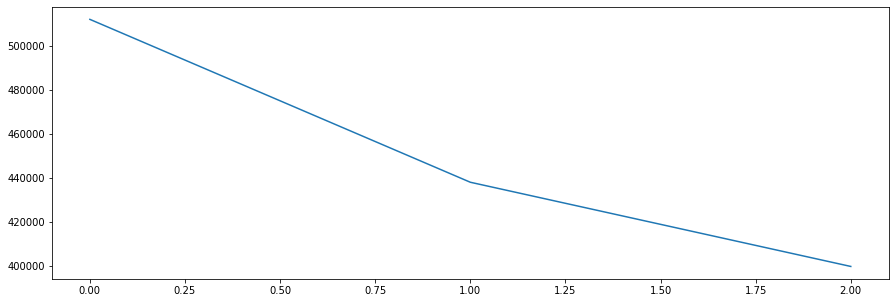

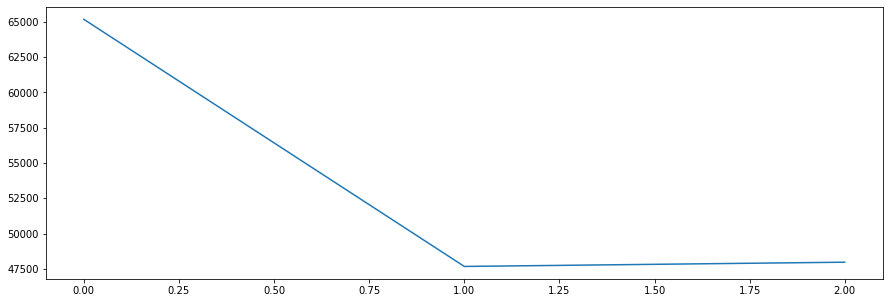

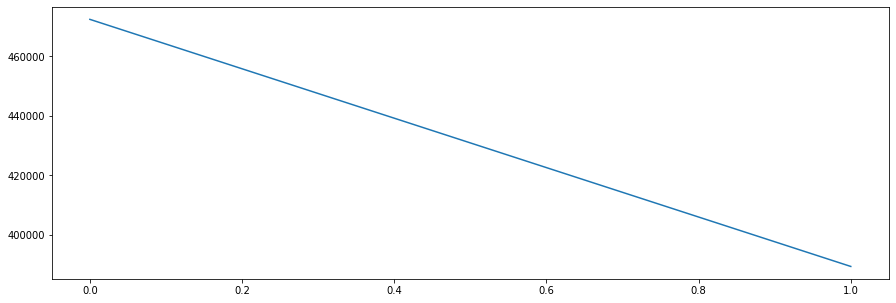

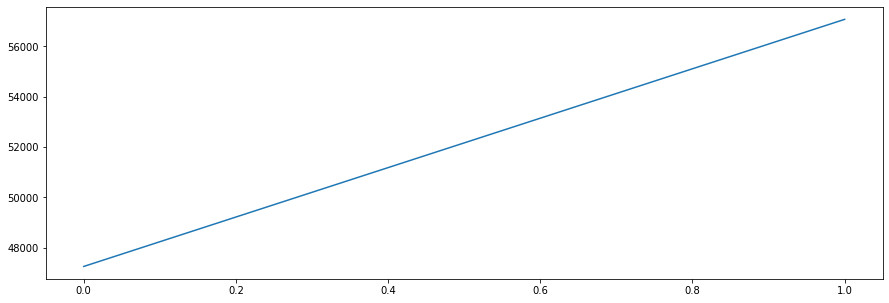

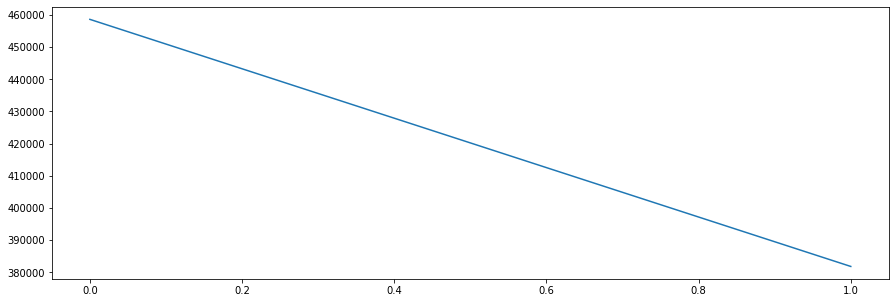

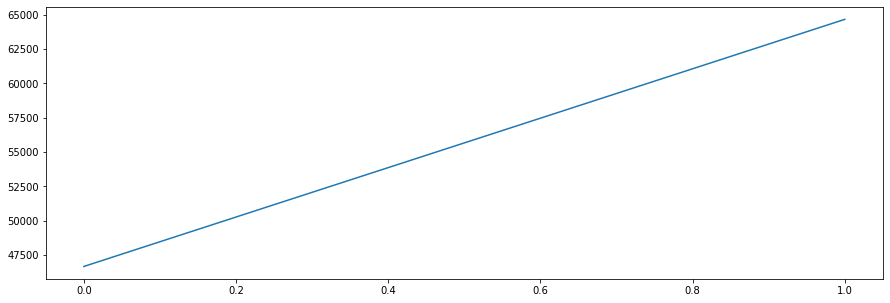

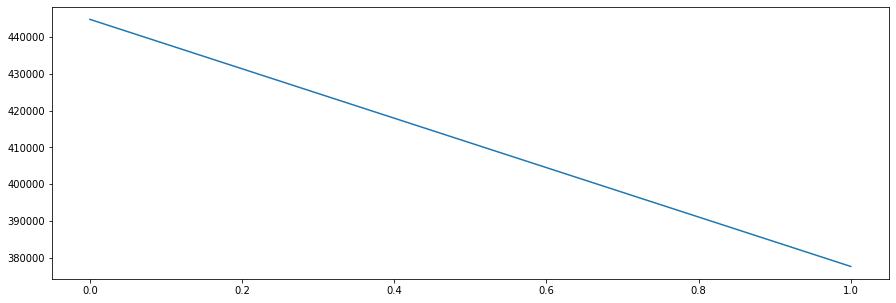

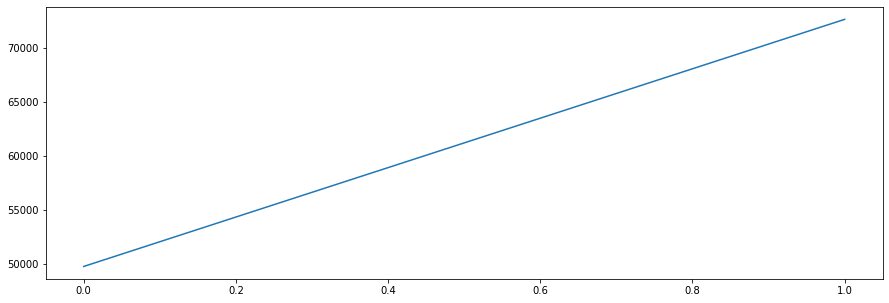

In [9]:
new_model = learn(22, 1000, 150, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(1114512.3750) tensor(1114512.3750)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(943386.1875) tensor(943386.1875)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(851592.) tensor(851592.)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(800884.9375) tensor(800884.9375)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 68893.0312500000
epoch: 0
tensor(942578.8750) tensor(942578.8750)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(760510.) tensor(760510.)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(736099.) tensor(736099.)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(732333.8125) tensor(732333.8125)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 105250.4687500000
epoch: 0
tensor(825432.9375) tensor(825432.9375)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(731747.0625) tensor(731747.0625)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(731106.6875) tensor(731106.6875)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(730983.5000) tensor(730983.5000)
epoch: 17
epoch: 18
epoch: 19
epo

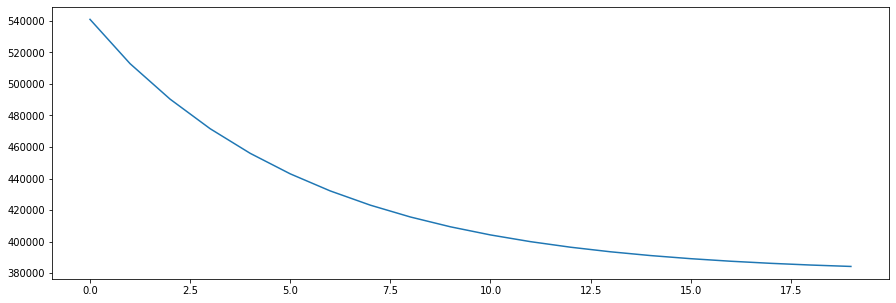

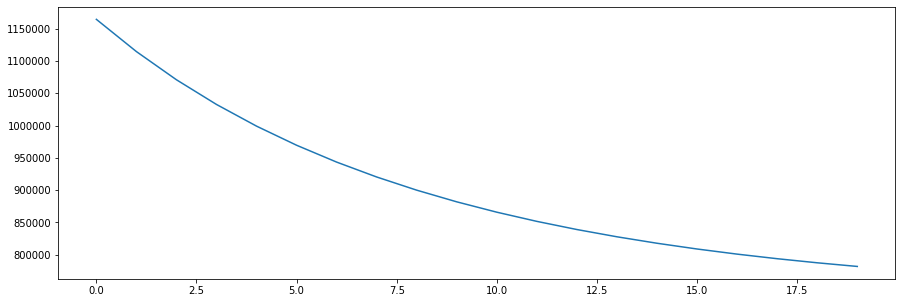

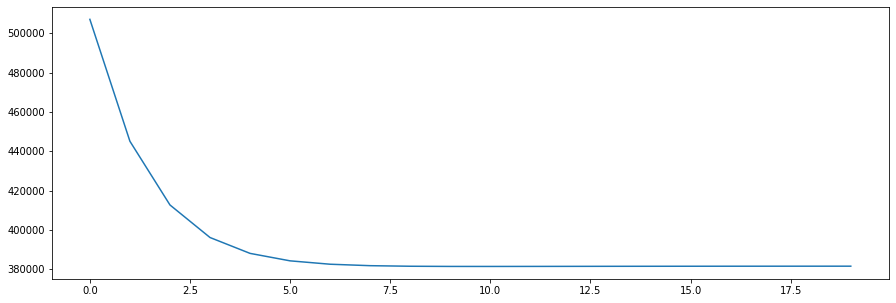

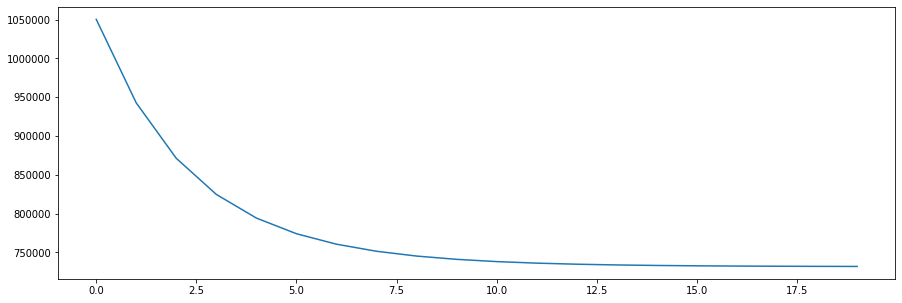

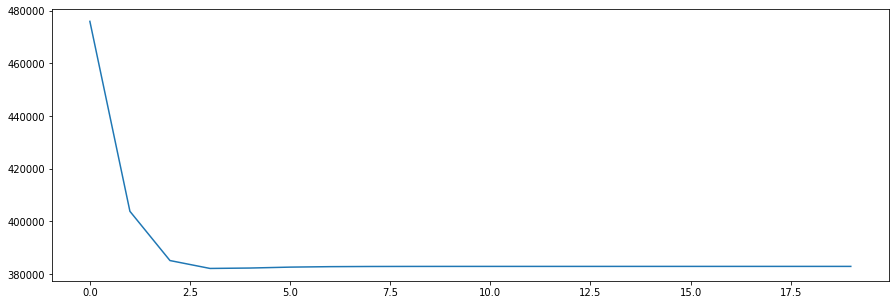

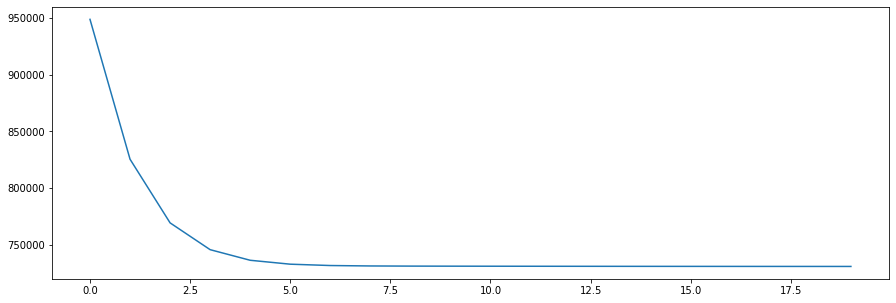

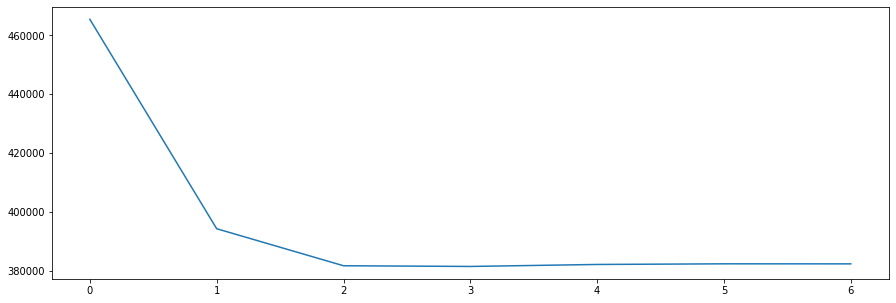

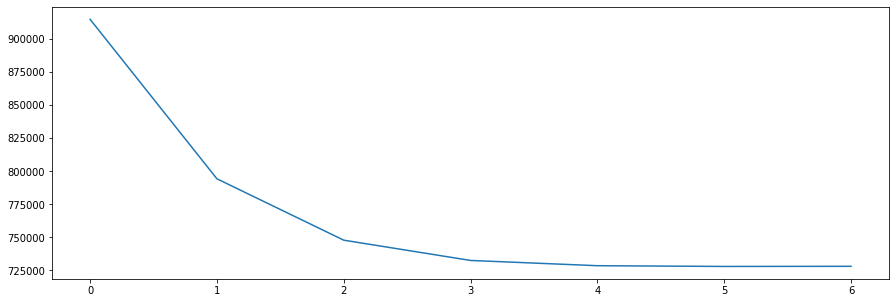

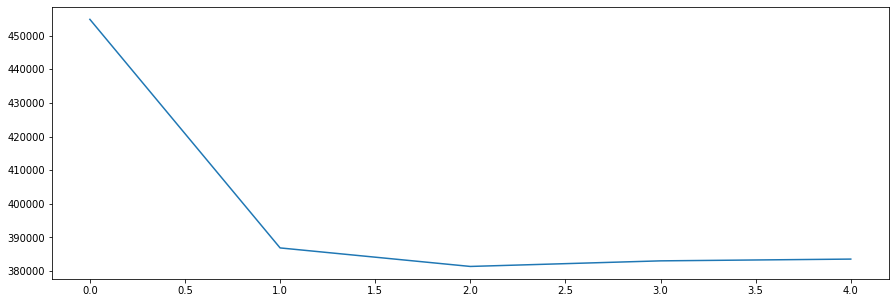

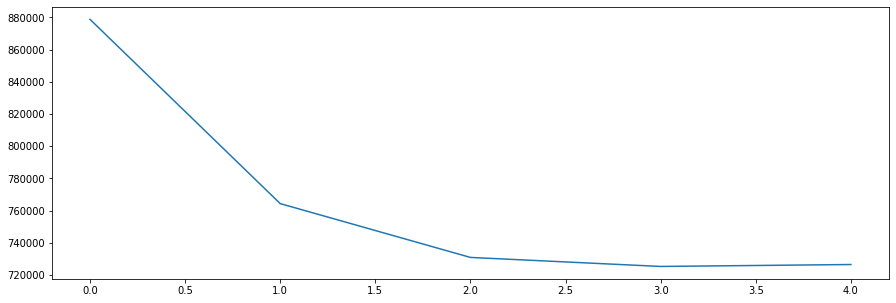

In [10]:
new_model = learn(22, 1000, 200, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(987.2682) tensor(987.2682)
epoch: 2
epoch: 3
epoch:   3 loss: 1035.0354003906
epoch: 0
tensor(2330.0989) tensor(395.9743)
epoch:   1 loss: 2355.9677734375
epoch: 0
tensor(36103.9922) tensor(4605.7363)
epoch:   1 loss: 36183.6015625000
epoch: 0
tensor(67247.5703) tensor(13351.1104)
epoch:   1 loss: 67353.4140625000
epoch: 0
tensor(76954.1172) tensor(16110.6357)
epoch:   1 loss: 77066.0234375000
best model hidden size: 300
0.06284730614187017
38.032884252687396


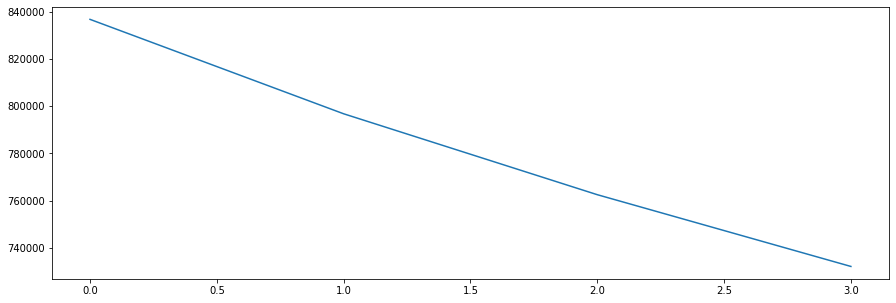

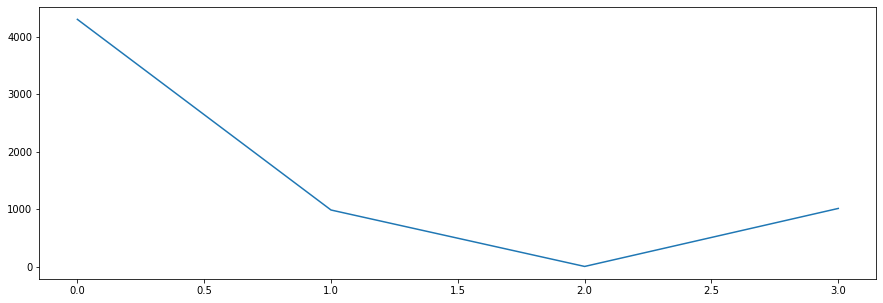

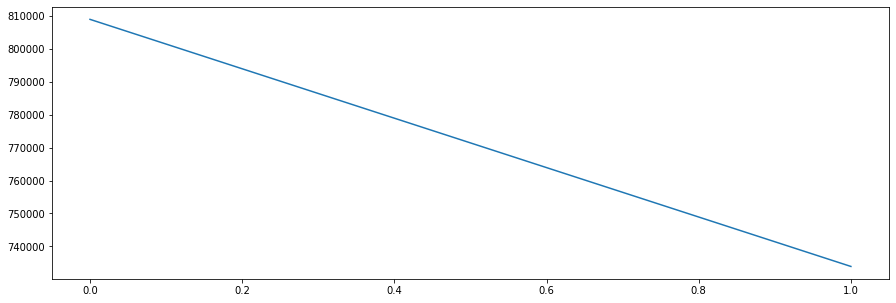

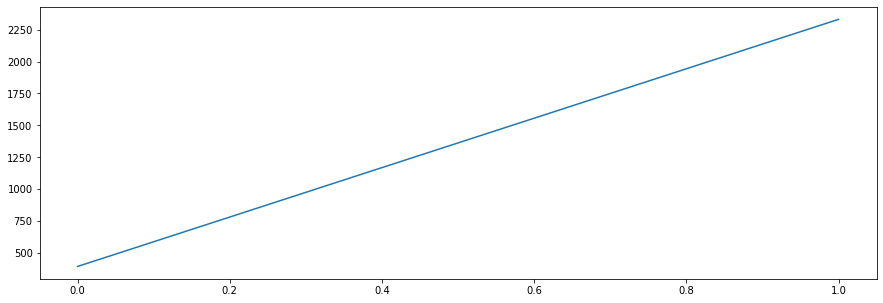

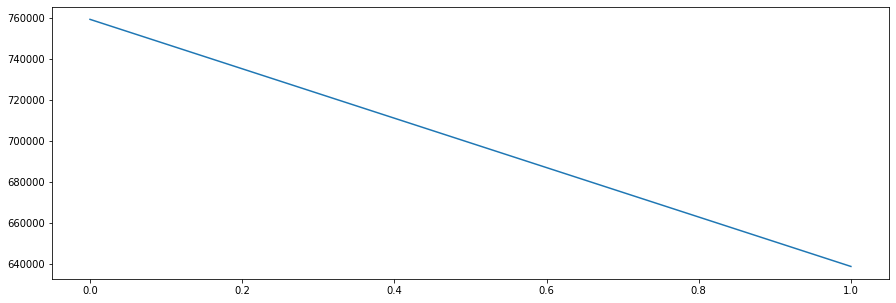

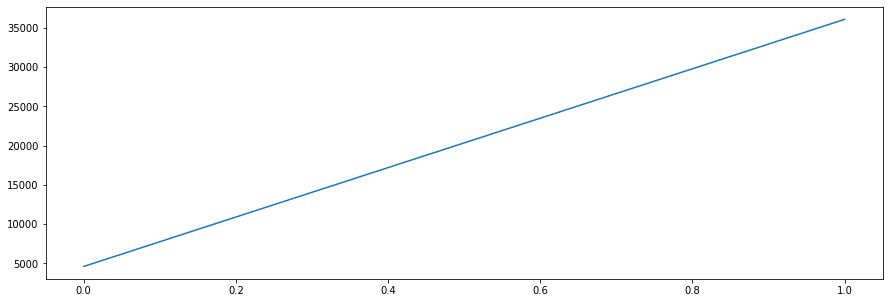

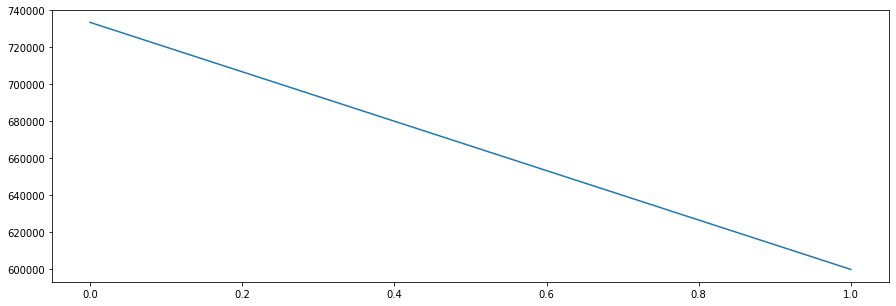

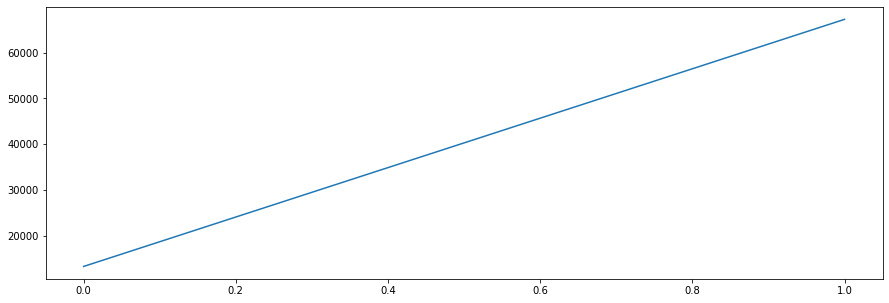

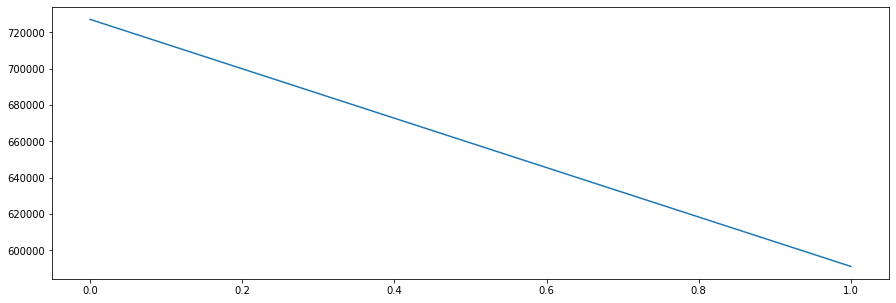

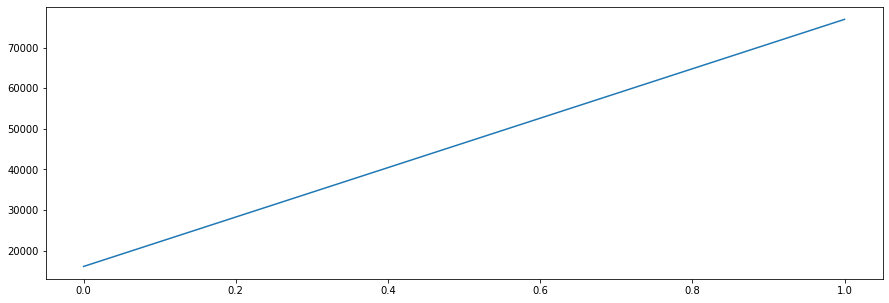

In [11]:
new_model = learn(22, 1000, 250, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(222207.7656) tensor(222207.7656)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(198466.1719) tensor(198466.1719)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
epoch:  10 loss: 373835.3750000000
epoch: 0
tensor(214173.8906) tensor(214173.8906)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(195959.7188) tensor(195959.7188)
epoch: 7
epoch:   7 loss: 370987.6250000000
epoch: 0
tensor(200428.5000) tensor(200428.5000)
epoch: 2
epoch: 3
epoch:   3 loss: 371037.8750000000
epoch: 0
tensor(196089.6250) tensor(196089.6250)
epoch: 2
epoch:   2 loss: 367649.3750000000
epoch: 0
tensor(195983.8125) tensor(195983.8125)
epoch: 2
epoch:   2 loss: 365875.0000000000
best model hidden size: 300
0.03314412492024444
41.73013742153199


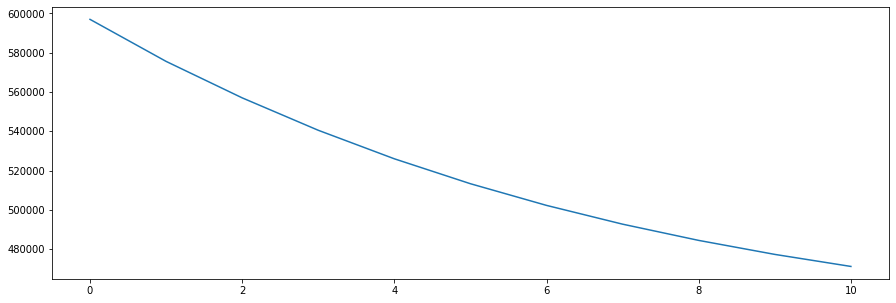

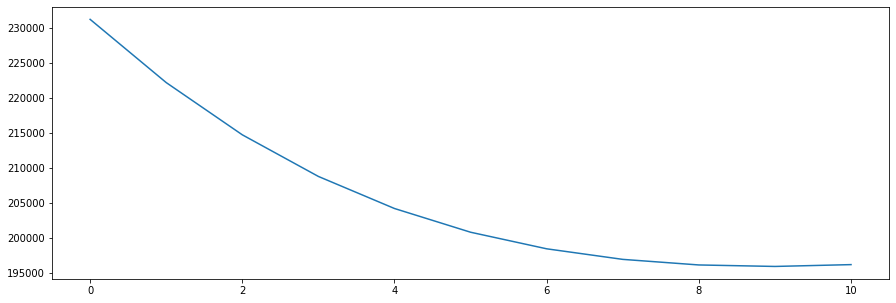

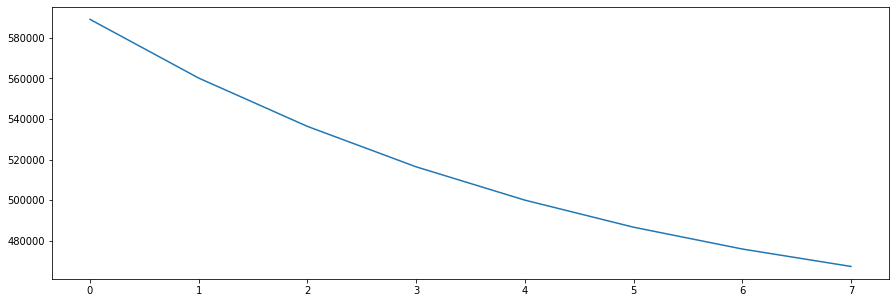

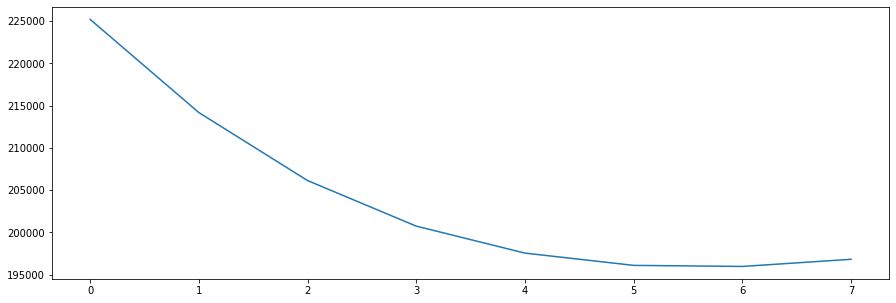

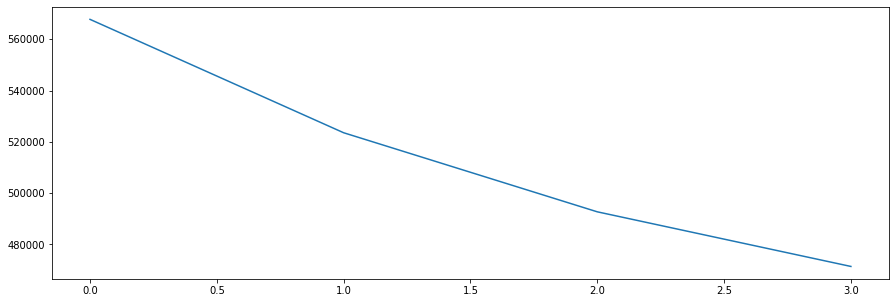

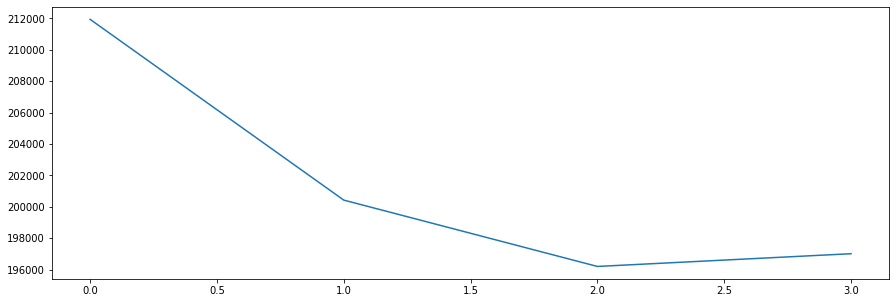

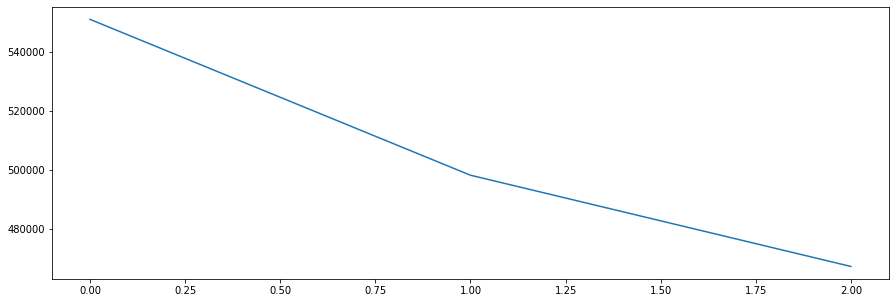

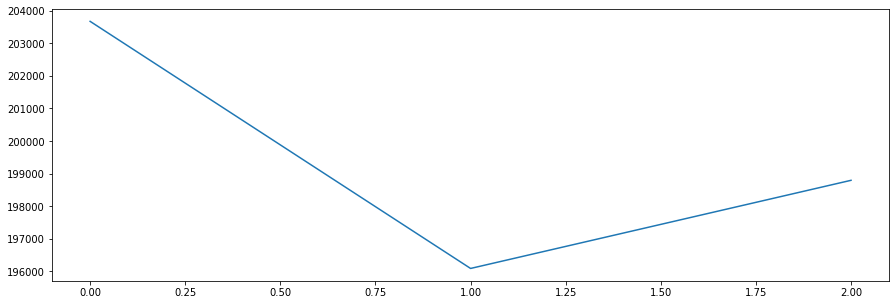

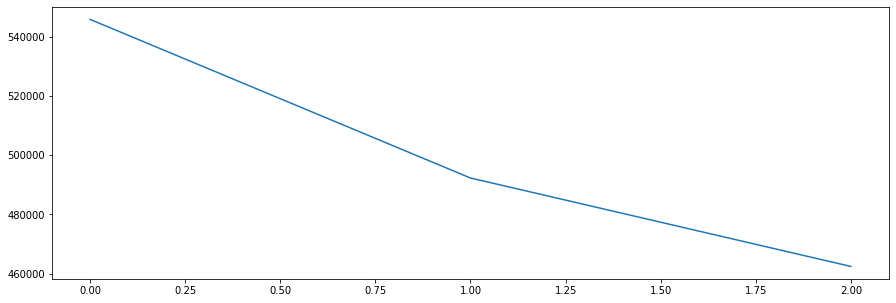

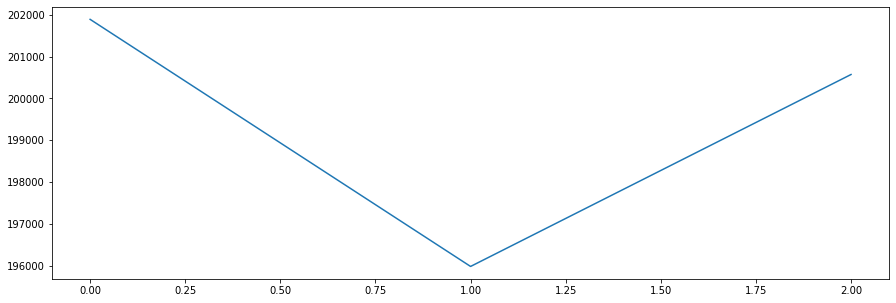

In [12]:
new_model = learn(22, 1000, 300, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(2076958.3750) tensor(2076958.3750)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(1865812.) tensor(1865812.)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(1711002.1250) tensor(1711002.1250)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(1599521.3750) tensor(1599521.3750)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 3044974.5000000000
epoch: 0
tensor(2044486.2500) tensor(2044486.2500)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(1794791.7500) tensor(1794791.7500)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(1627221.8750) tensor(1627221.8750)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(1517312.) tensor(1517312.)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 2862548.7500000000
epoch: 0
tensor(1904879.7500) tensor(1904879.7500)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(1533405.7500) tensor(1533405.7500)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(1382995.2500) tensor(1382995.2500)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(1327400.3750) tensor(1327400.3750)


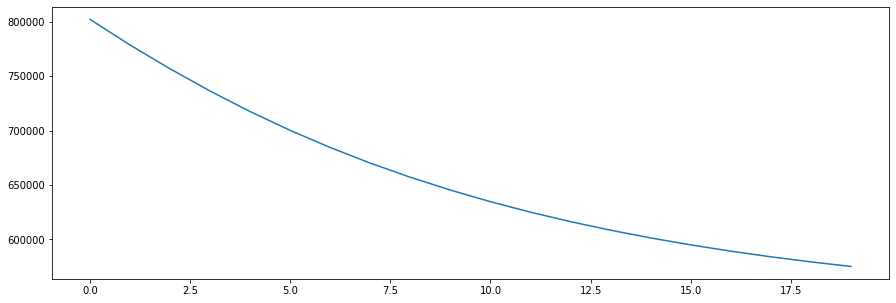

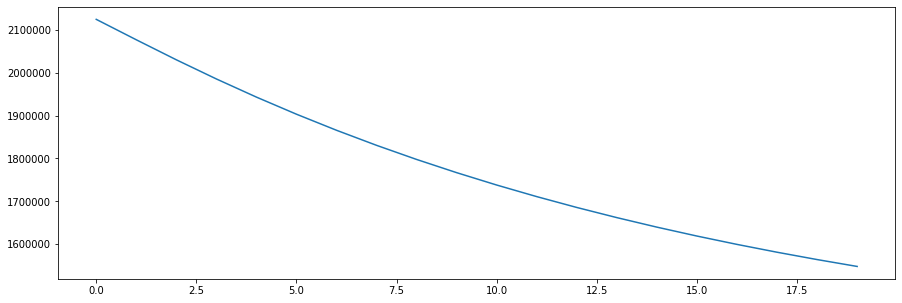

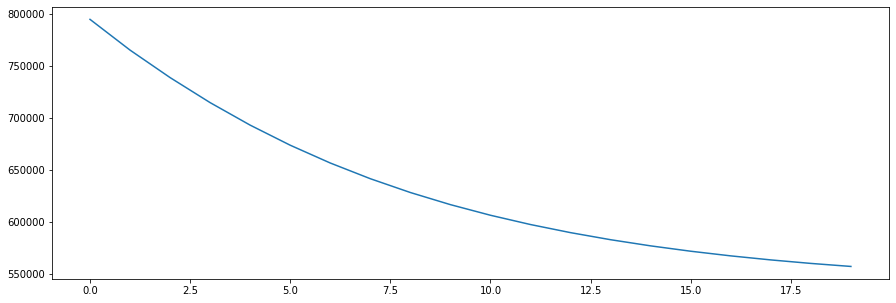

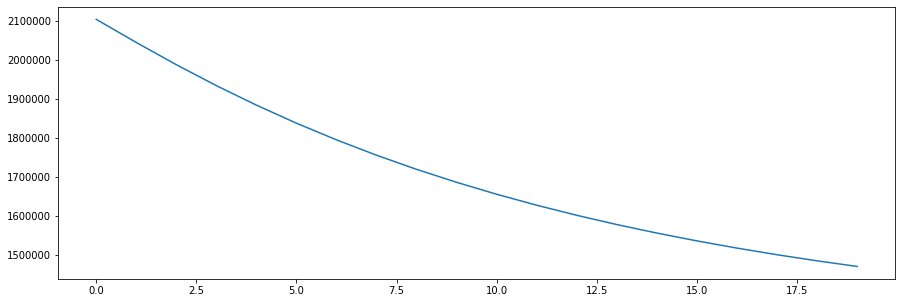

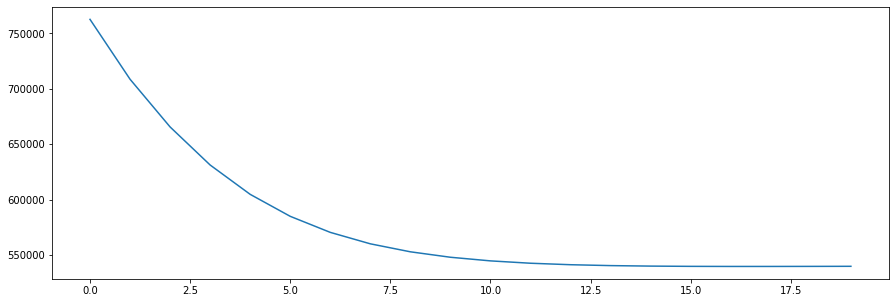

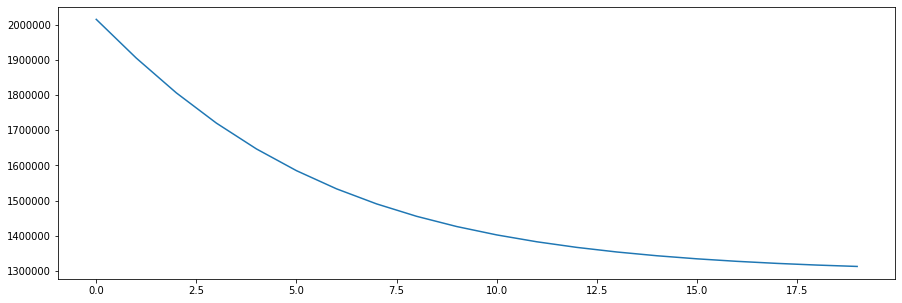

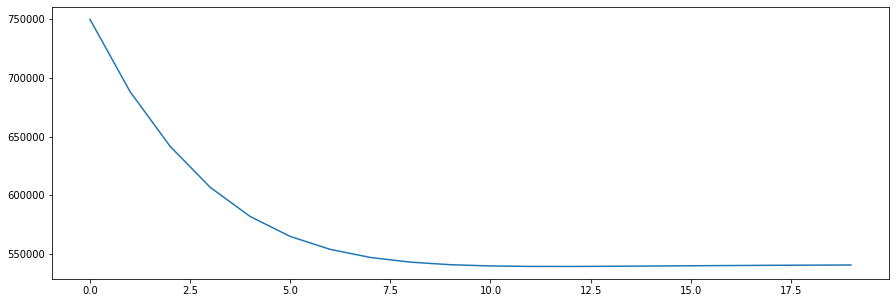

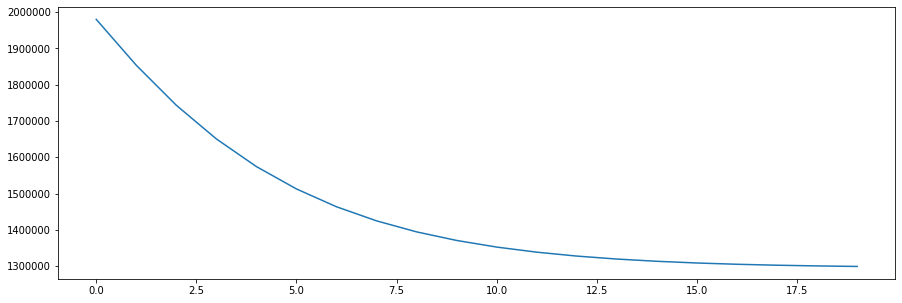

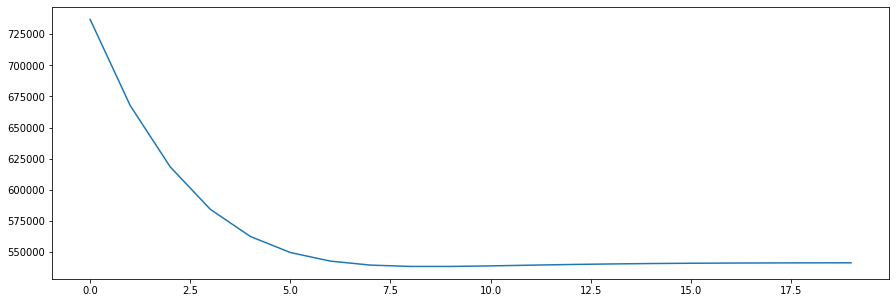

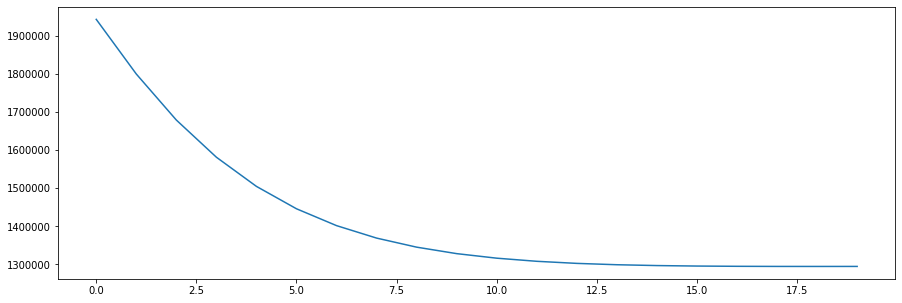

In [13]:
new_model = learn(22, 1000, 350, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(5128.2827) tensor(5128.2827)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(294.4863) tensor(1.6912)
epoch:   6 loss: 294.4863281250
epoch: 0
tensor(1166.4906) tensor(1166.4906)
epoch: 2
epoch: 3
epoch:   3 loss: 1556.9609375000
epoch: 0
tensor(333.2641) tensor(333.2641)
epoch: 2
epoch:   2 loss: 6579.8769531250
epoch: 0
tensor(2134.9485) tensor(1015.3651)
epoch:   1 loss: 2134.9484863281
epoch: 0
tensor(8285.3555) tensor(79.6657)
epoch:   1 loss: 8285.3554687500
best model hidden size: 300
0.022904644051812355
14.99398126129395


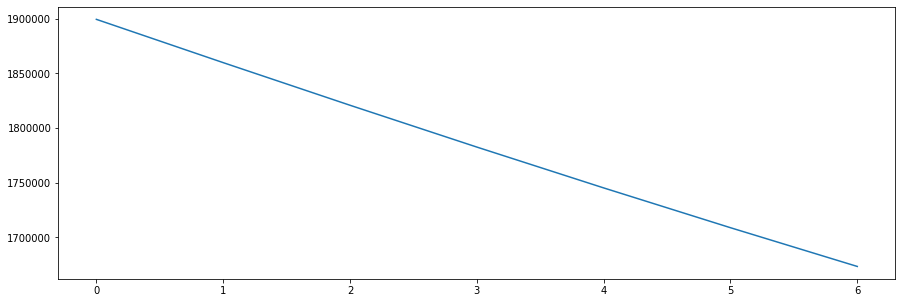

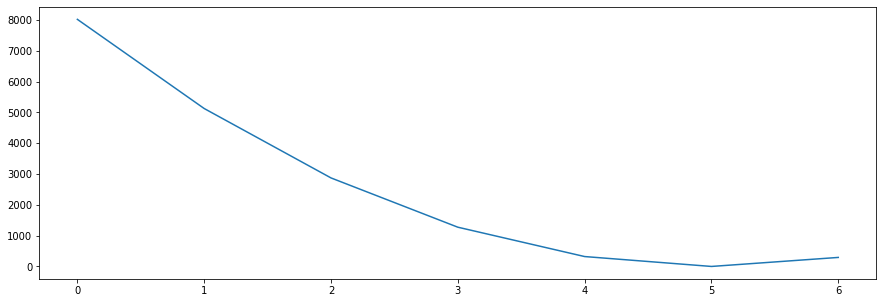

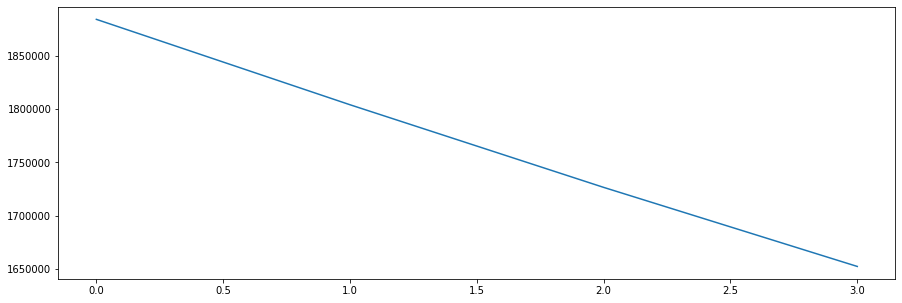

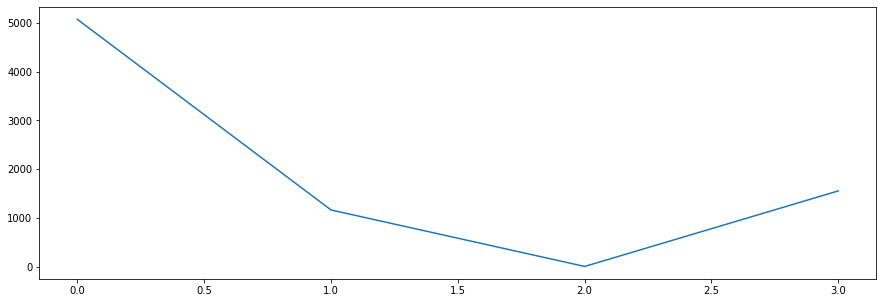

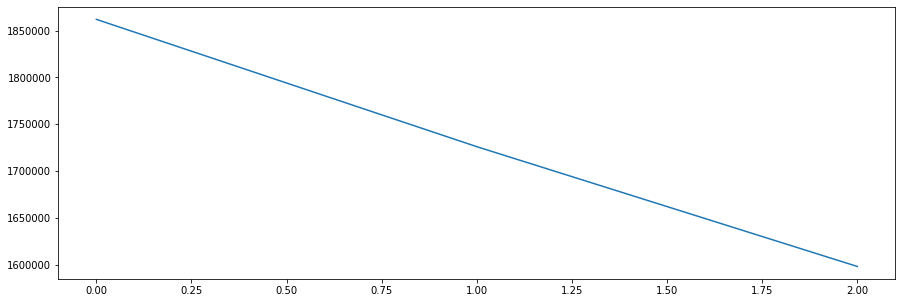

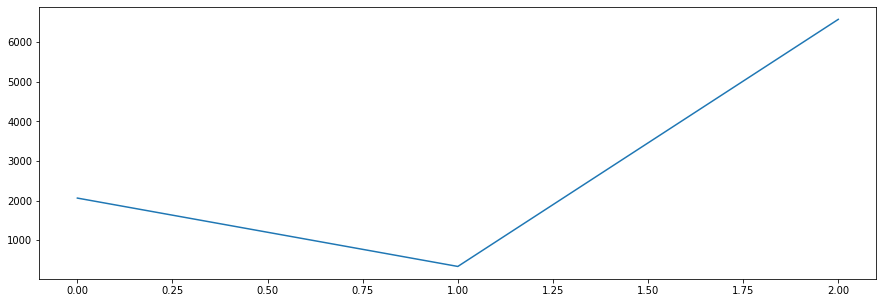

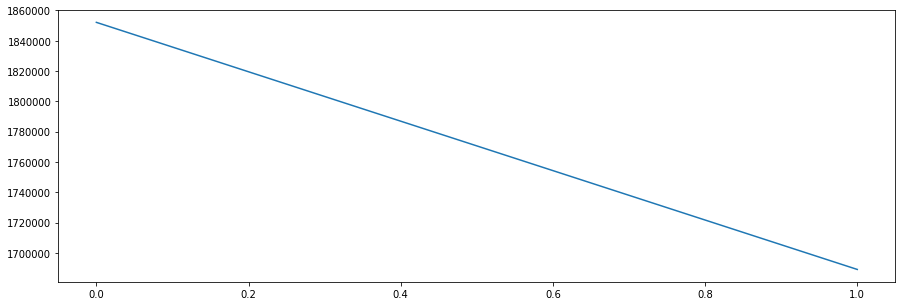

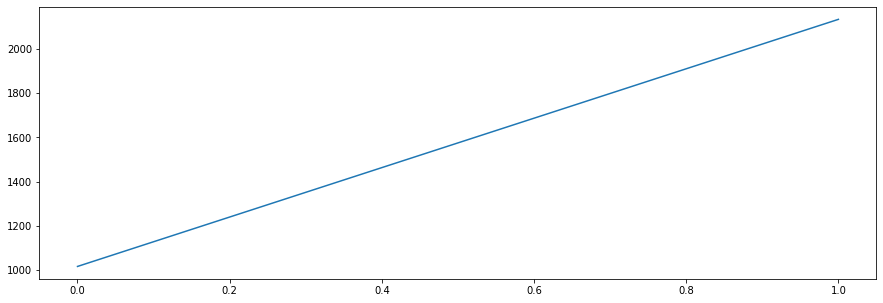

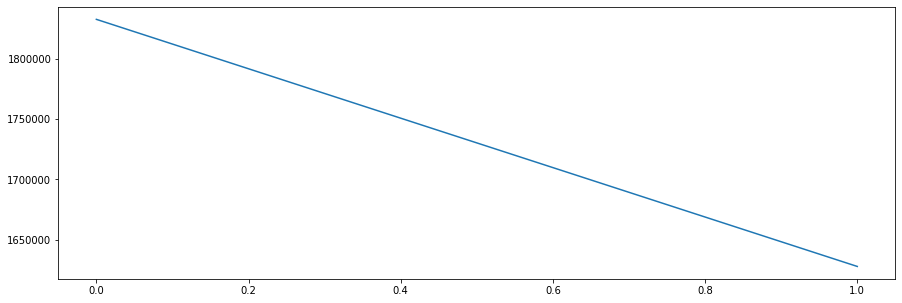

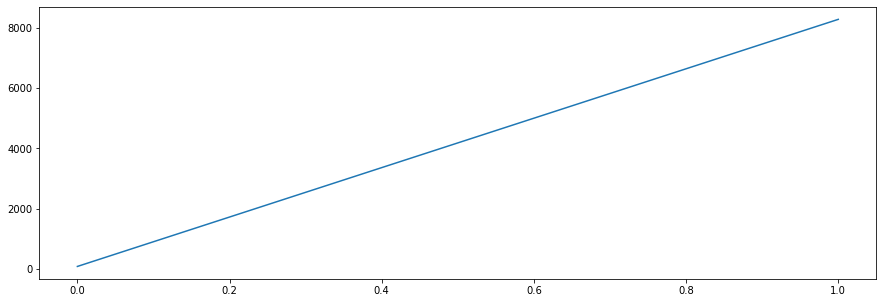

In [14]:
new_model = learn(22, 1000, 400, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(4248309.5000) tensor(4248309.5000)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(3942695.2500) tensor(3942695.2500)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(3685936.) tensor(3685936.)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(3481245.) tensor(3481245.)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 3380958.5000000000
epoch: 0
tensor(4183157.7500) tensor(4183157.7500)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(3735962.2500) tensor(3735962.2500)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(3441319.) tensor(3441319.)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(3209956.) tensor(3209956.)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 3113646.2500000000
epoch: 0
tensor(3908432.2500) tensor(3908432.2500)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(3063166.7500) tensor(3063166.7500)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(2817515.2500) tensor(2817515.2500)
epoch: 12
epoch: 13
epoch:  13 loss: 2813071.0000000000
epoch: 0
tensor(3866144.) tensor(3866144.)

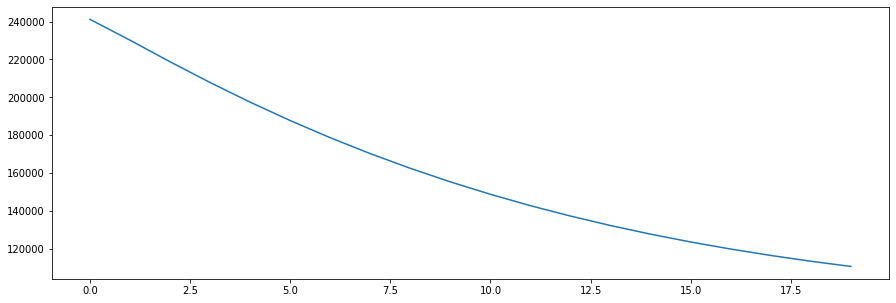

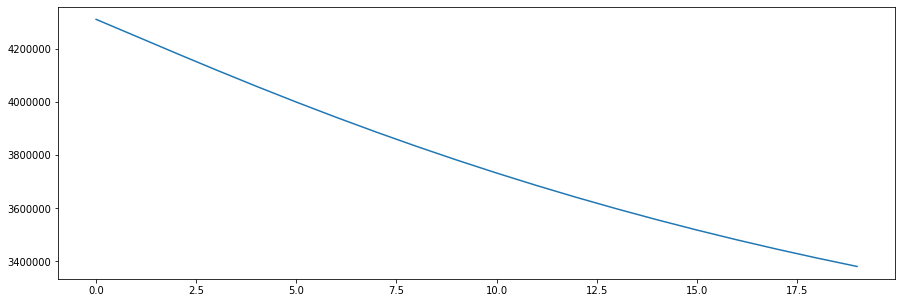

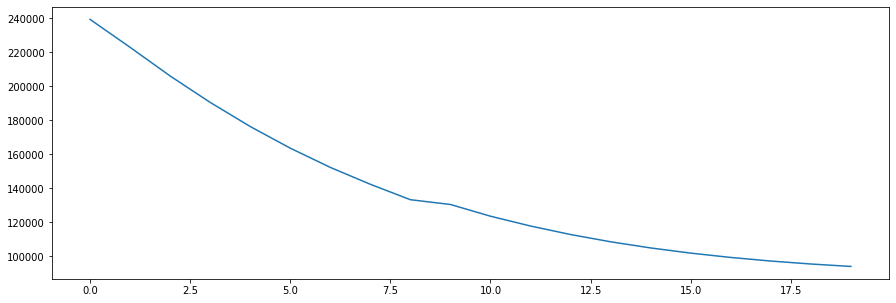

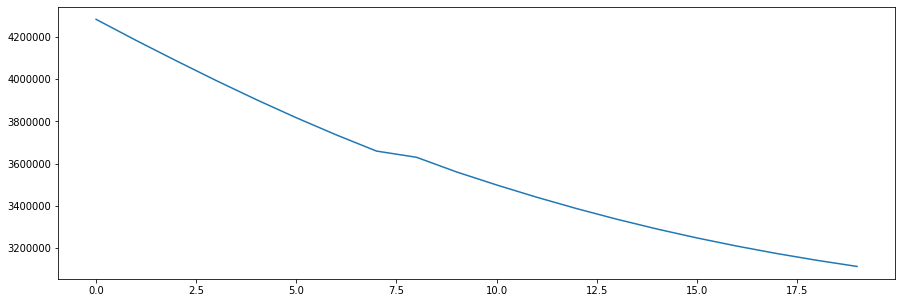

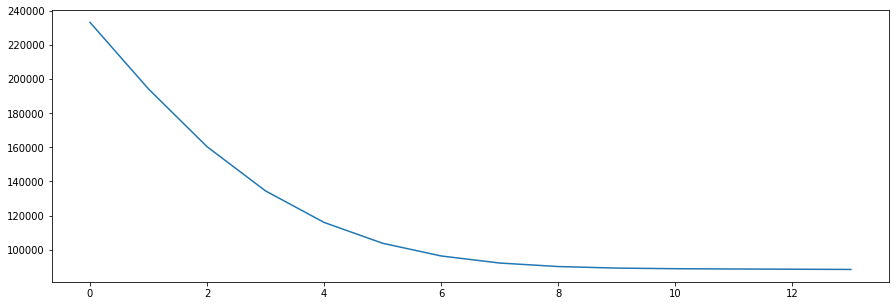

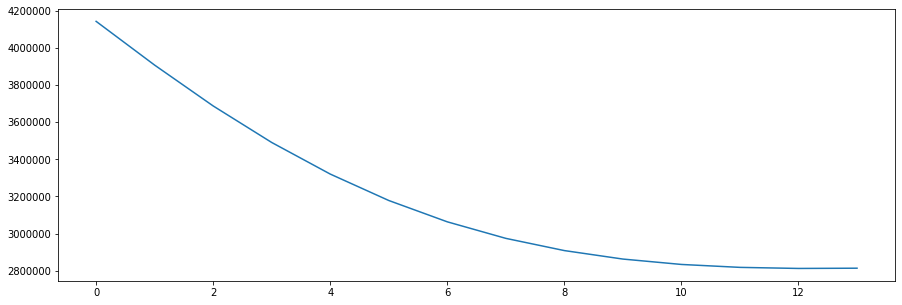

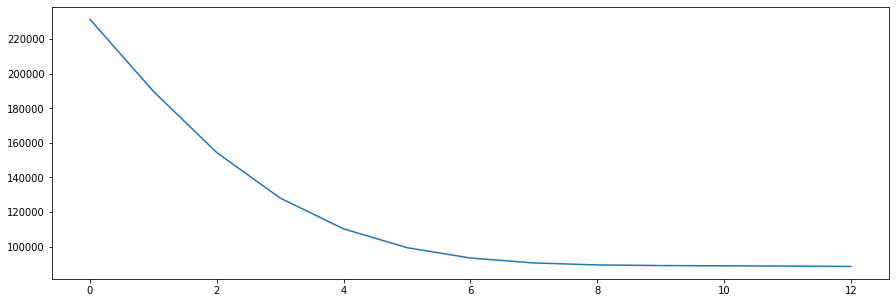

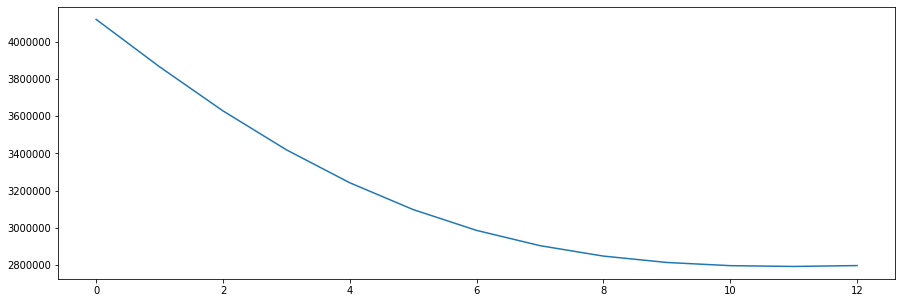

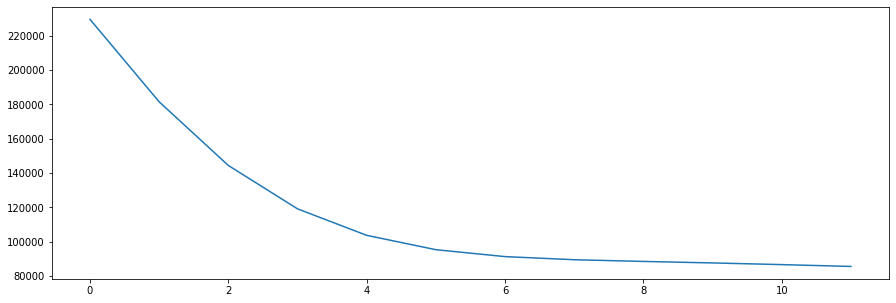

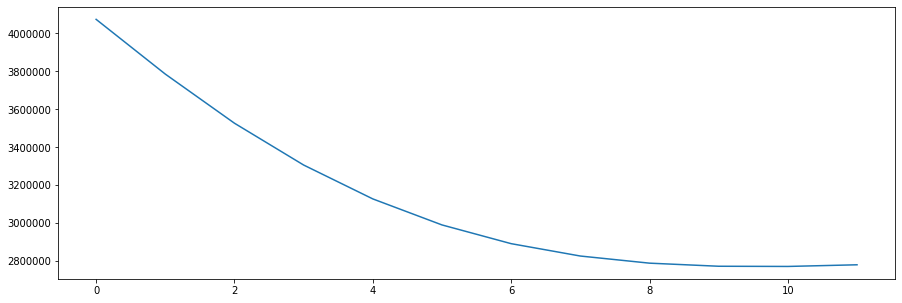

In [15]:
new_model = learn(22, 1000, 450, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(5271.5044) tensor(5271.5044)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(43.5999) tensor(43.5999)
epoch: 7
epoch: 8
epoch:   8 loss: 359.6514892578
epoch: 0
tensor(2238.6765) tensor(2238.6765)
epoch: 2
epoch: 3
epoch: 4
epoch:   4 loss: 739.5946655273
epoch: 0
tensor(132.7753) tensor(132.7753)
epoch: 2
epoch:   2 loss: 917.7783813477
epoch: 0
tensor(418.1248) tensor(418.1248)
epoch: 2
epoch:   2 loss: 5856.2275390625
epoch: 0
tensor(3458.5845) tensor(253.0579)
epoch:   1 loss: 3458.5844726562
best model hidden size: 300
0.01390908318347643
140.43131064455991


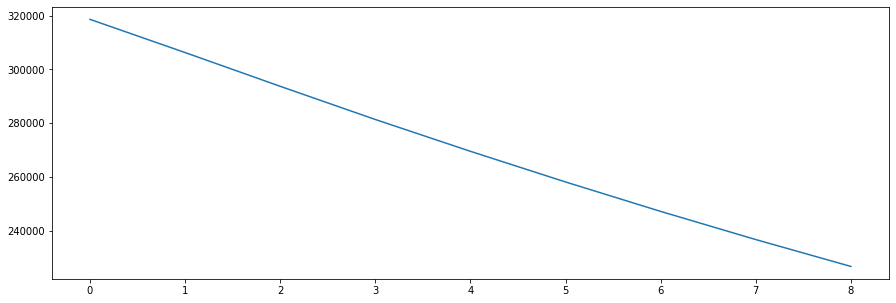

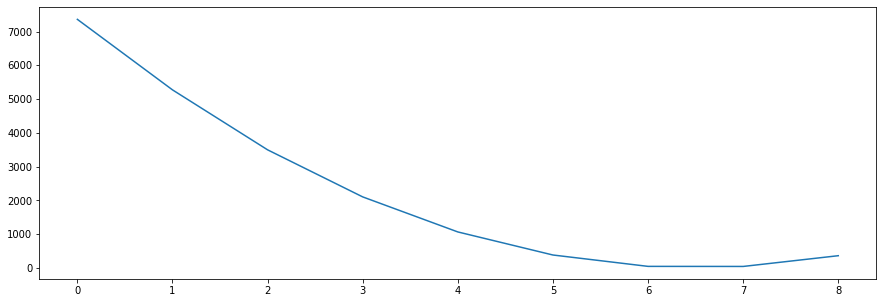

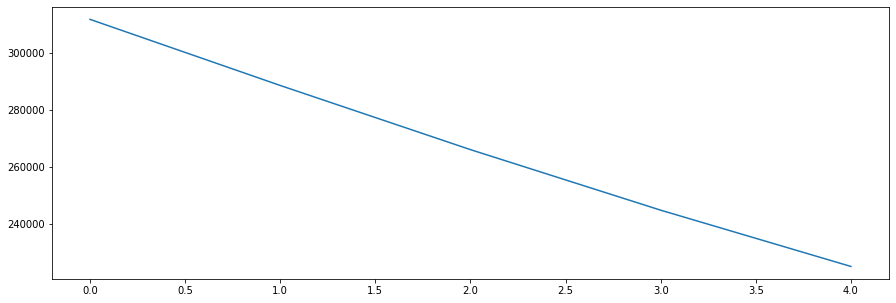

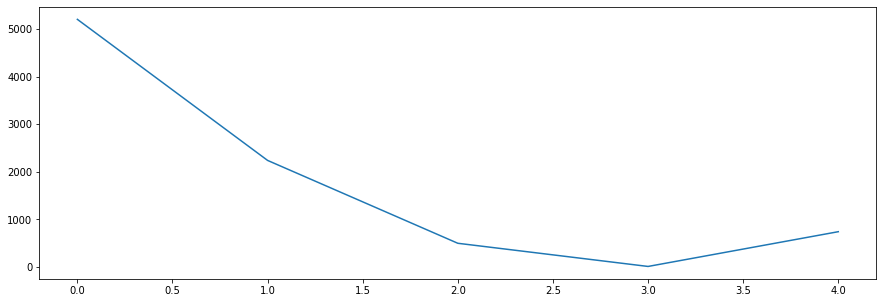

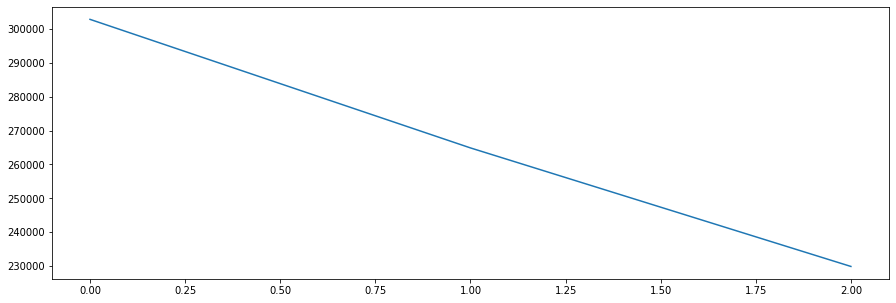

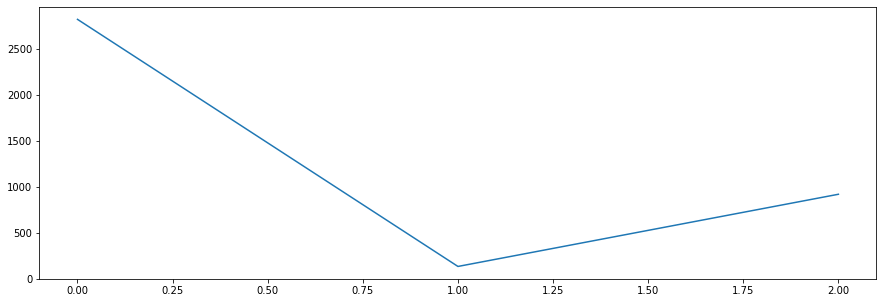

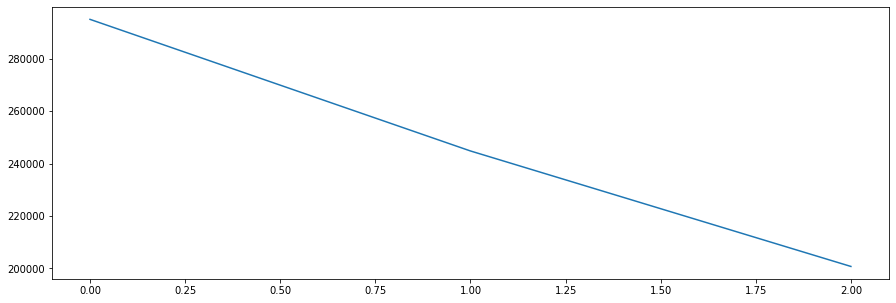

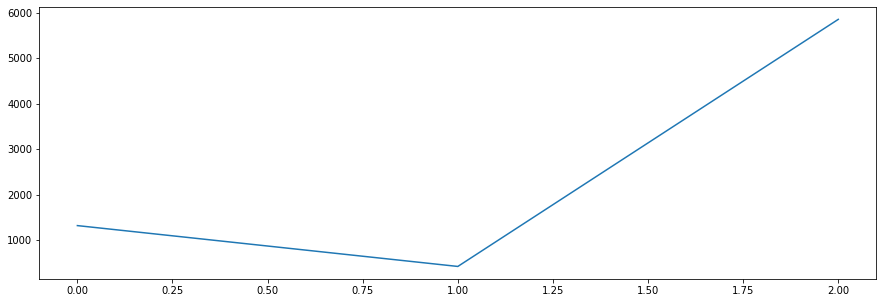

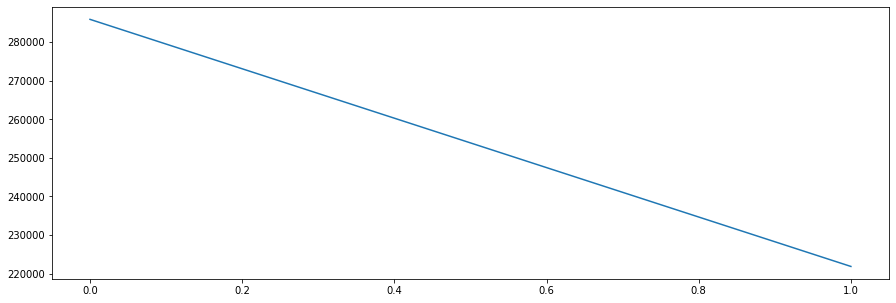

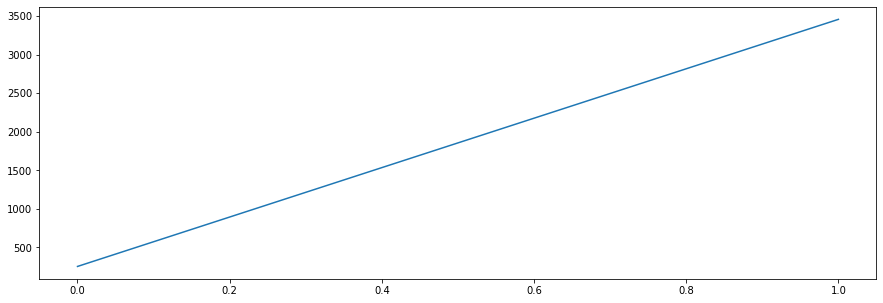

In [16]:
new_model = learn(22, 1000, 500, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(5973.0981) tensor(5973.0981)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(348.8422) tensor(348.8422)
epoch: 7
epoch: 8
epoch: 9
epoch:   9 loss: 268.5916748047
epoch: 0
tensor(2968.0427) tensor(2968.0427)
epoch: 2
epoch: 3
epoch: 4
epoch:   4 loss: 286.3487243652
epoch: 0
tensor(722.4045) tensor(722.4045)
epoch: 2
epoch: 3
epoch:   3 loss: 2585.8776855469
epoch: 0
tensor(330.0007) tensor(330.0007)
epoch: 2
epoch:   2 loss: 6250.5795898438
epoch: 0
tensor(303.5490) tensor(303.5490)
epoch: 2
epoch:   2 loss: 6006.4702148438
best model hidden size: 300
0.014241087523443467
10.449415404850624


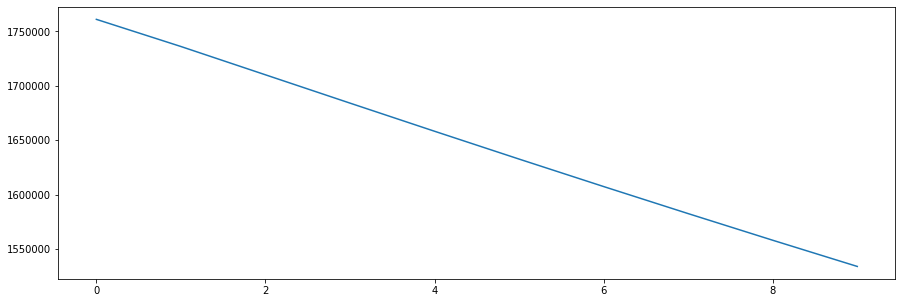

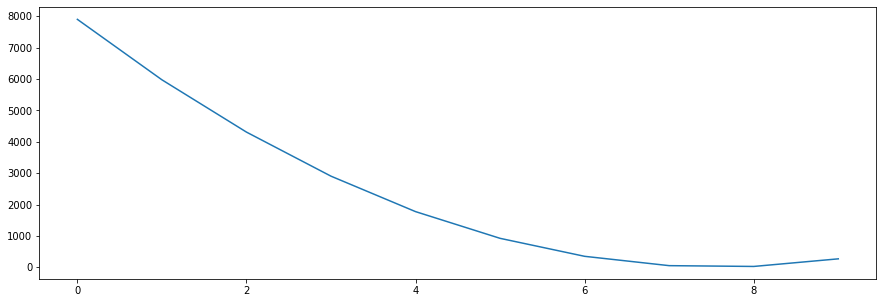

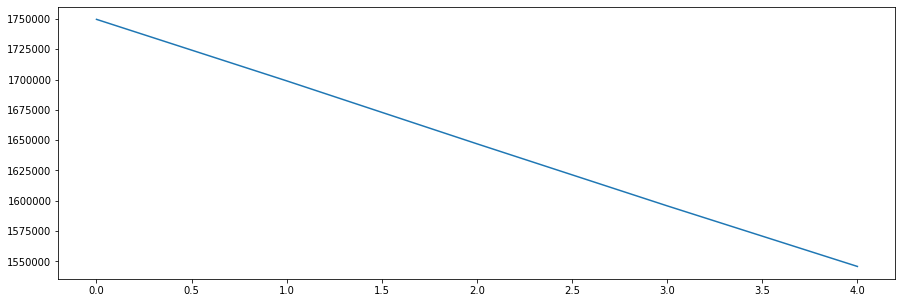

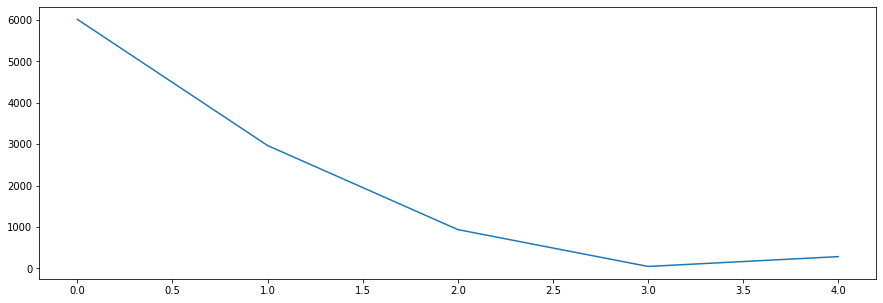

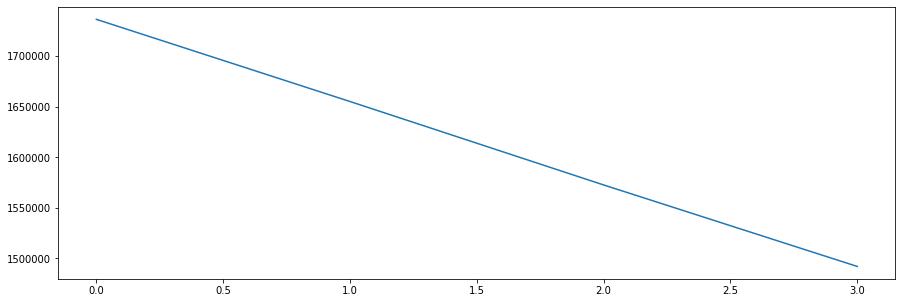

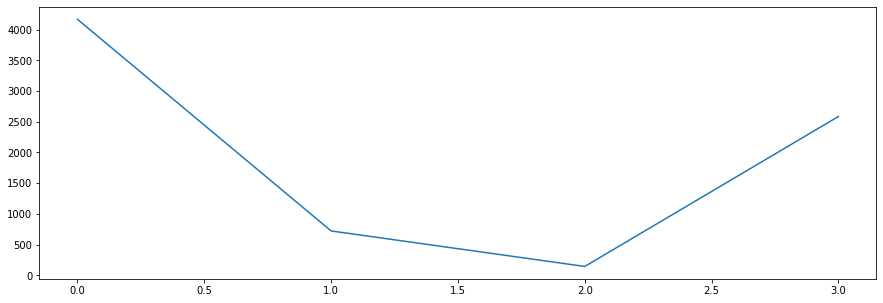

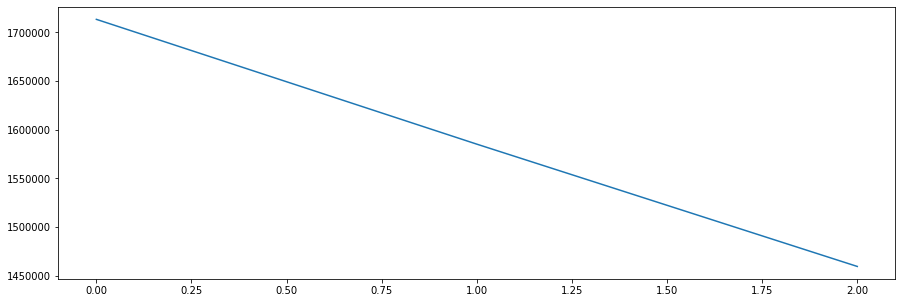

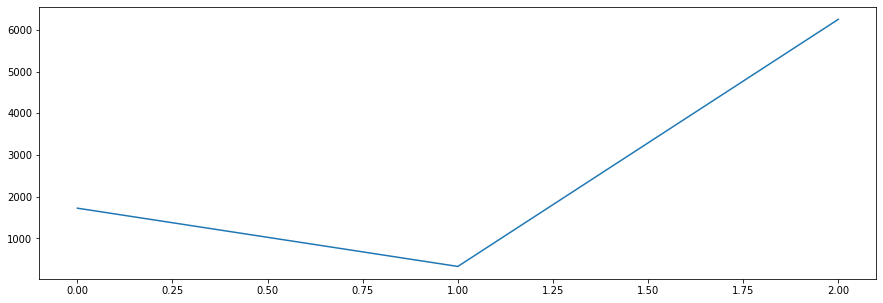

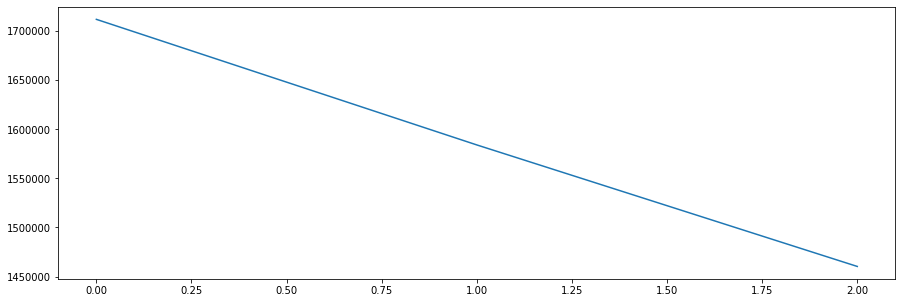

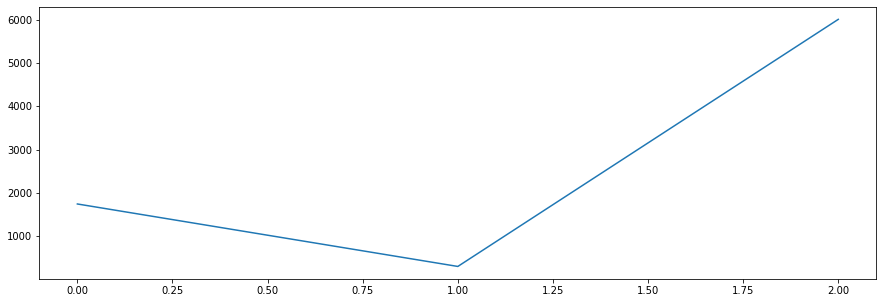

In [17]:
new_model = learn(22, 1000, 550, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(466606.3438) tensor(466606.3438)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(415829.5938) tensor(415829.5938)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(368160.9375) tensor(368160.9375)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(324206.1562) tensor(324206.1562)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 299659.8750000000
epoch: 0
tensor(460344.2500) tensor(460344.2500)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(389263.9688) tensor(389263.9688)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(323962.1250) tensor(323962.1250)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(267471.7812) tensor(267471.7812)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 236672.4062500000
epoch: 0
tensor(422815.6250) tensor(422815.6250)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(271149.2812) tensor(271149.2812)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(156755.6250) tensor(156755.6250)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(79192.8750) tensor(79192.8750)
epoch: 17
ep

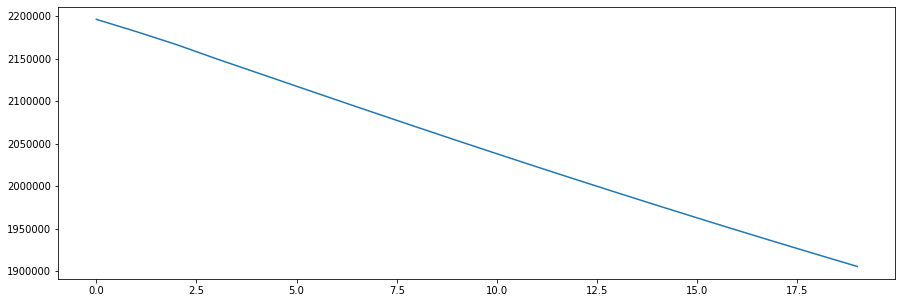

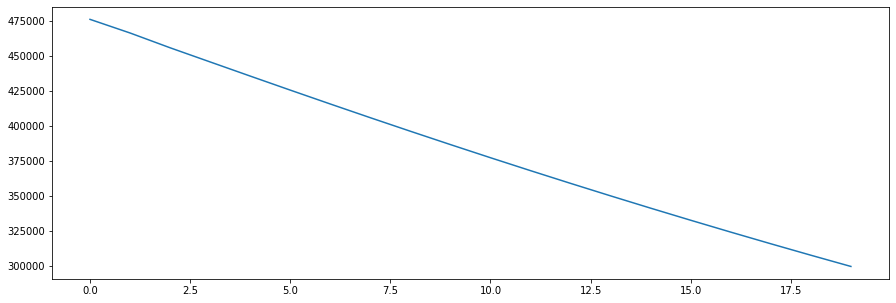

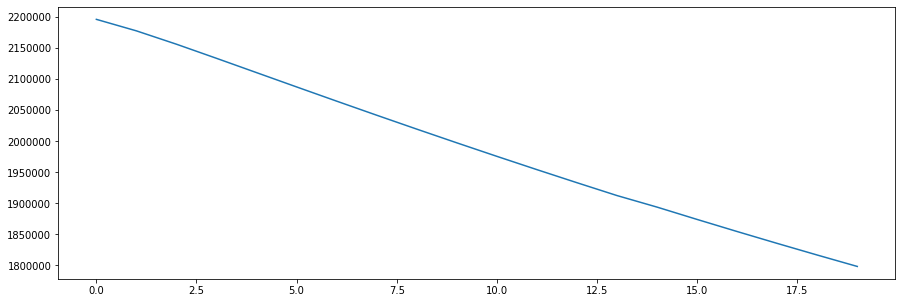

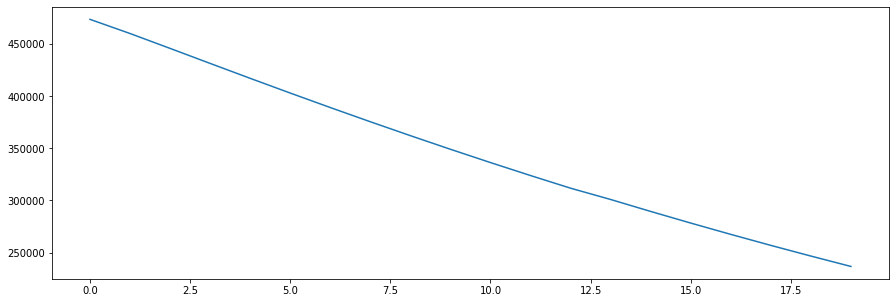

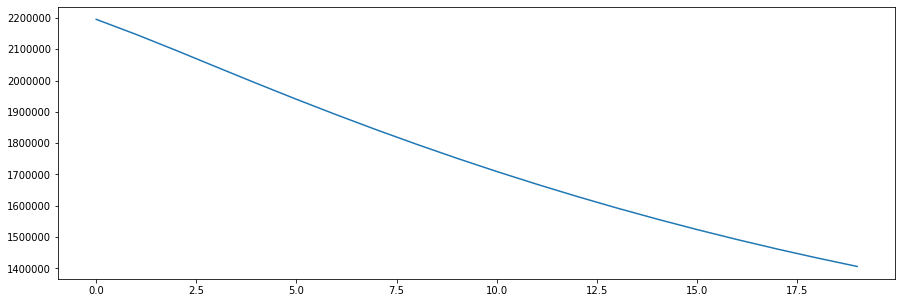

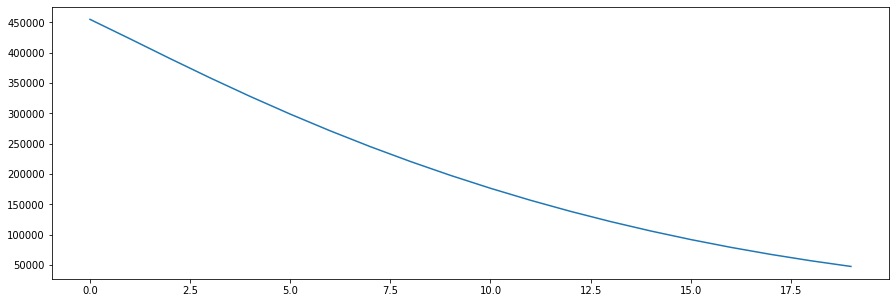

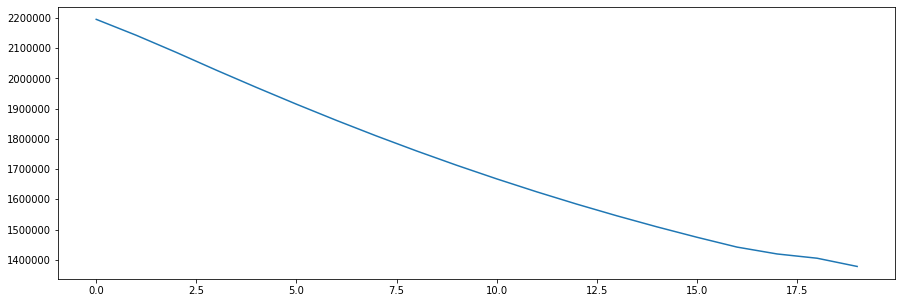

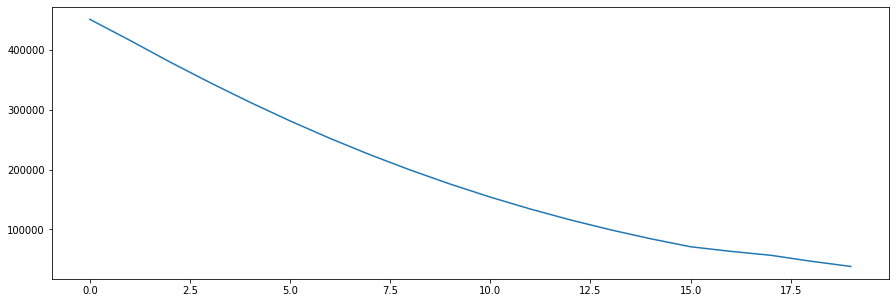

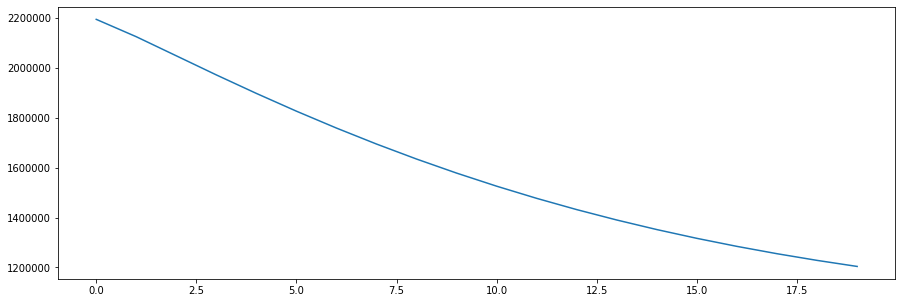

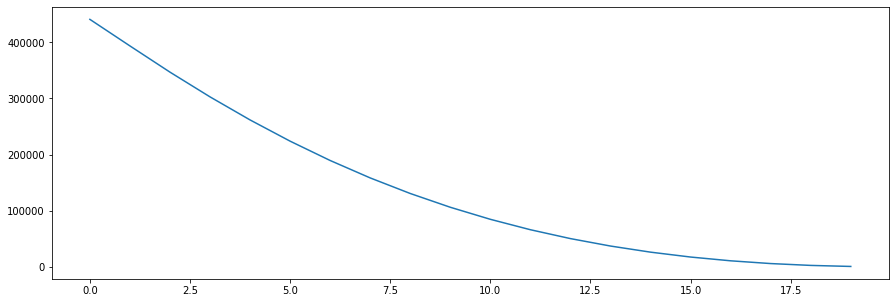

In [18]:
new_model = learn(22, 1000, 600, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(451734.6875) tensor(451734.6875)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(410816.) tensor(410816.)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(373435.8125) tensor(373435.8125)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(343282.5625) tensor(343282.5625)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 329878.8125000000
epoch: 0
tensor(446487.3438) tensor(446487.3438)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(393591.7500) tensor(393591.7500)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(347806.7188) tensor(347806.7188)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(317403.8438) tensor(317403.8438)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 308356.3125000000
epoch: 0
tensor(428828.9062) tensor(428828.9062)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(341599.5625) tensor(341599.5625)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(295728.1562) tensor(295728.1562)
epoch: 12
epoch: 13
epoch: 14
epoch:  14 loss: 295006.3750000000
epoch: 0
tensor(411520.8125) tens

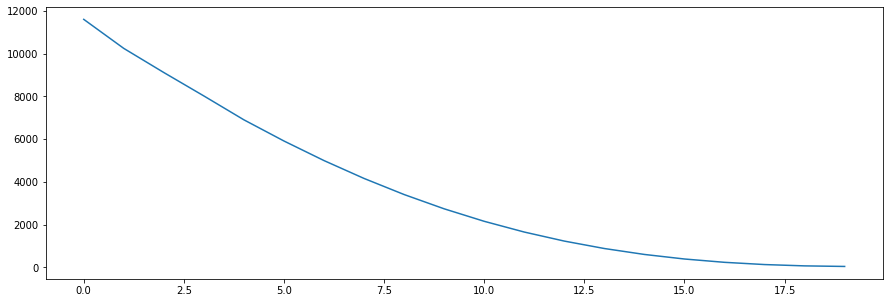

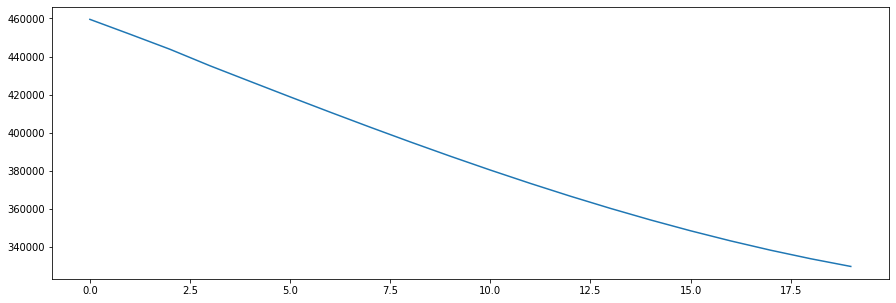

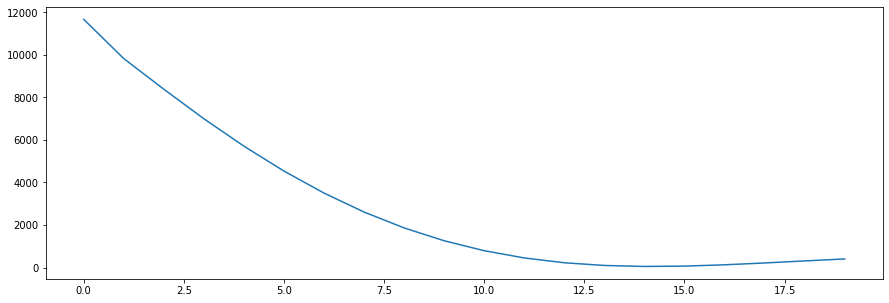

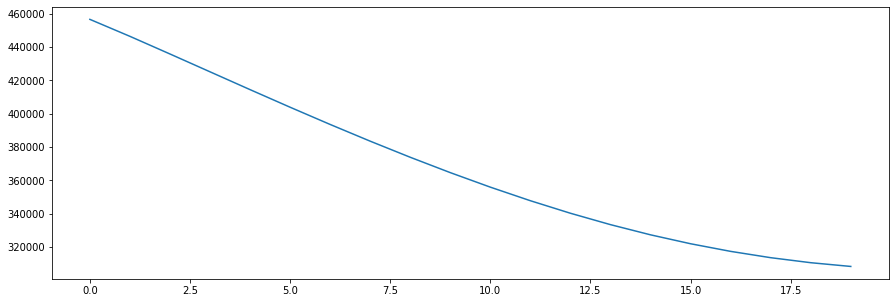

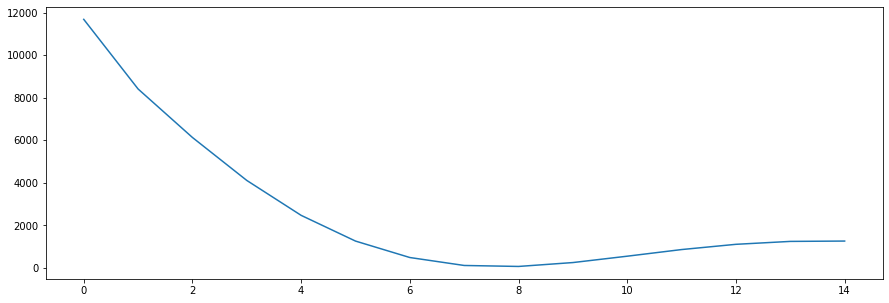

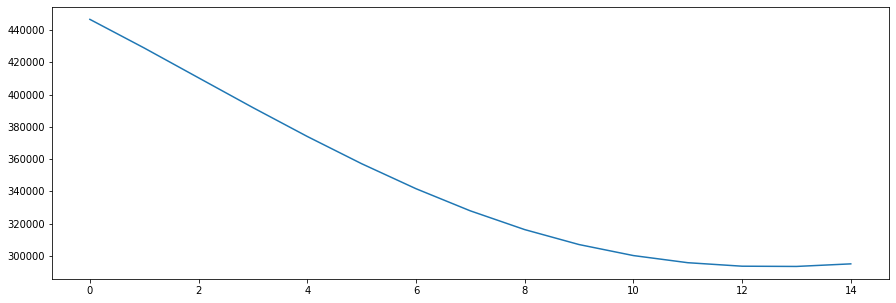

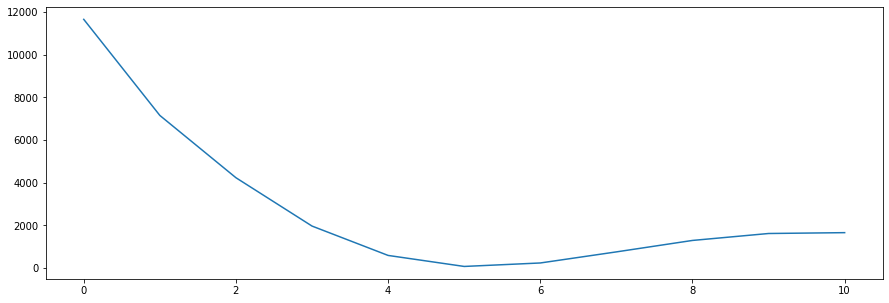

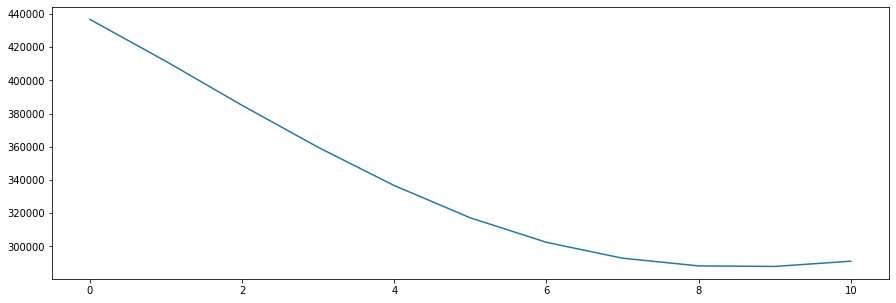

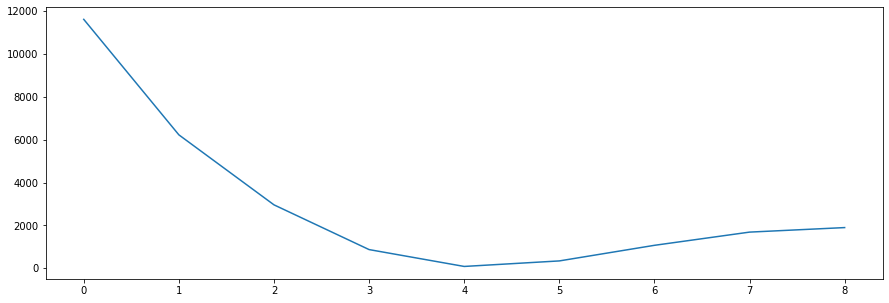

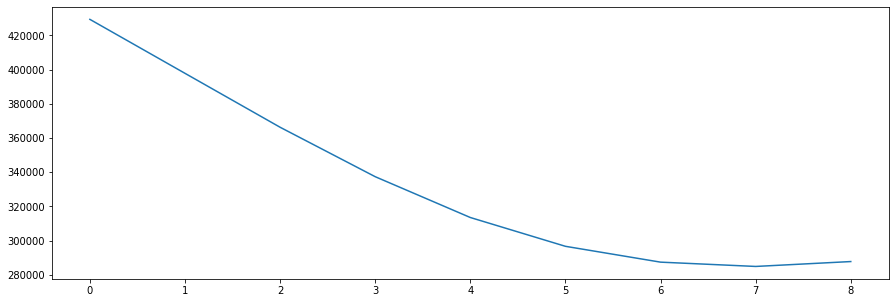

In [19]:
new_model = learn(22, 1000, 650, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(481902.9688) tensor(481902.9688)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(447890.3750) tensor(447890.3750)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(414152.8438) tensor(414152.8438)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(385502.2500) tensor(385502.2500)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 371803.3125000000
epoch: 0
tensor(474055.7812) tensor(474055.7812)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(417980.2188) tensor(417980.2188)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(370262.0312) tensor(370262.0312)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(342219.2812) tensor(342219.2812)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 336665.9687500000
epoch: 0
tensor(453447.4375) tensor(453447.4375)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(360649.5938) tensor(360649.5938)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(324600.8750) tensor(324600.8750)
epoch: 12
epoch:  12 loss: 325688.2812500000
epoch: 0
tensor(436252.9062) tensor(436252.90

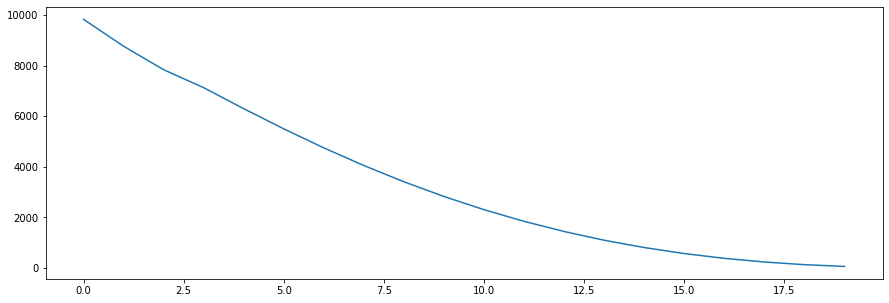

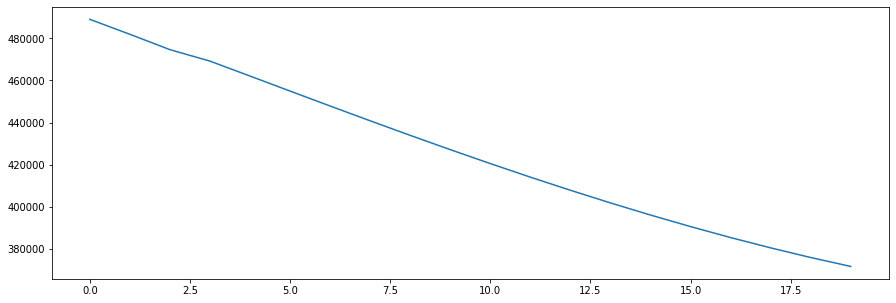

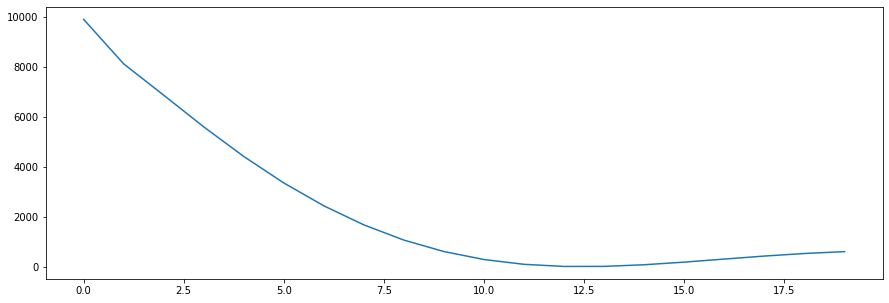

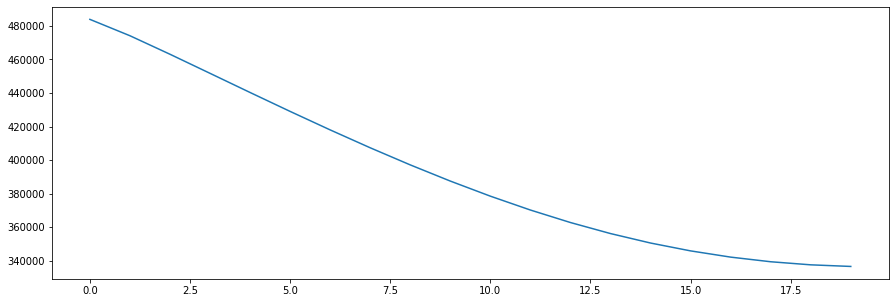

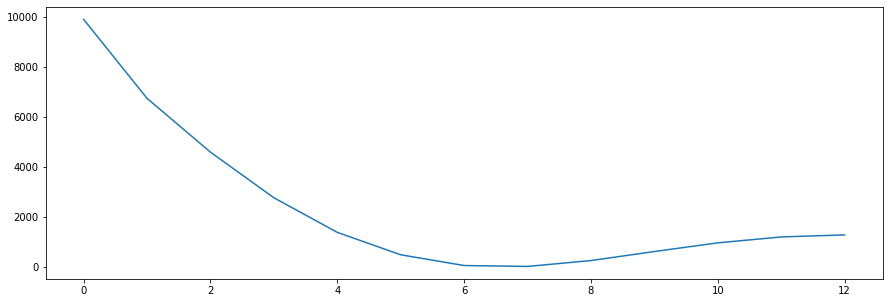

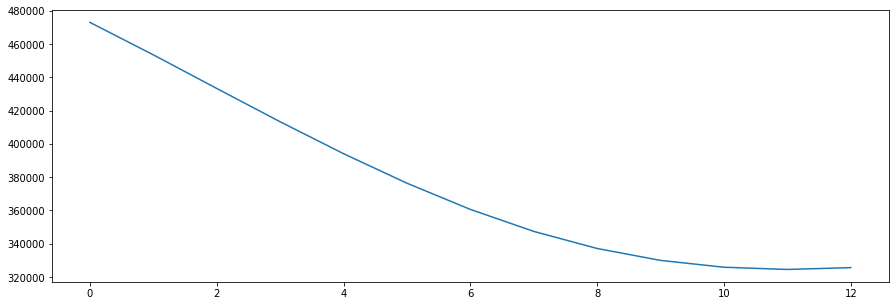

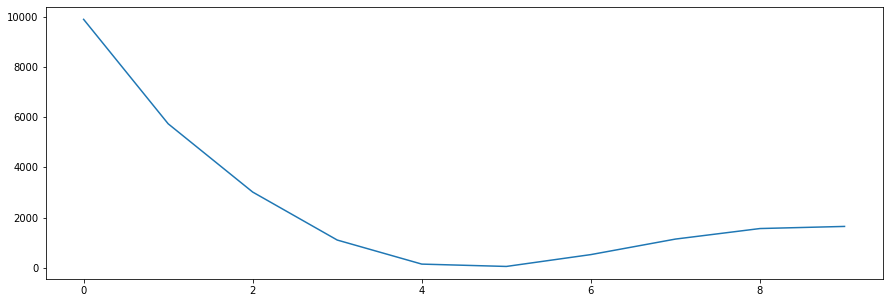

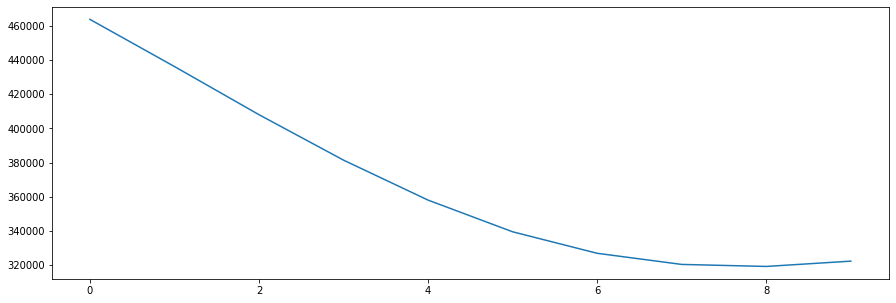

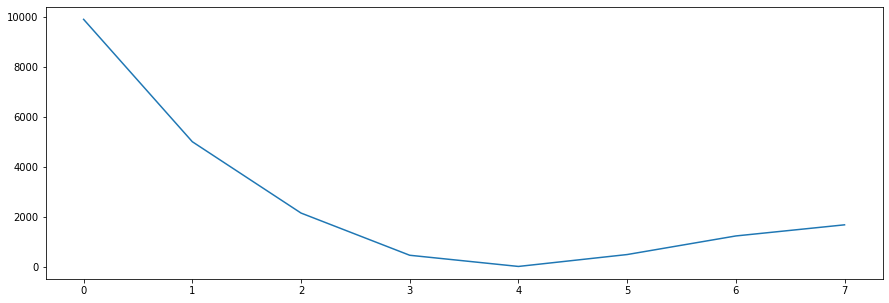

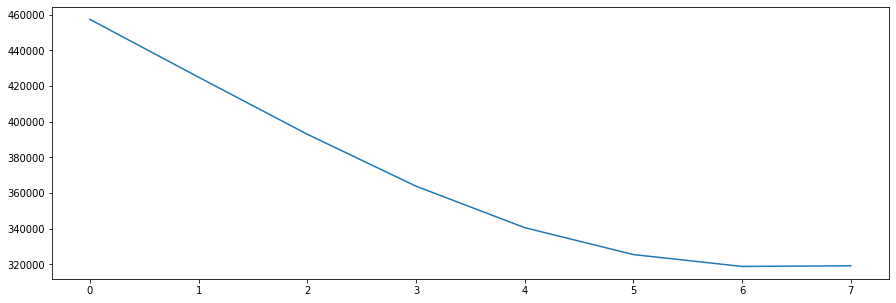

In [20]:
new_model = learn(22, 1000, 700, 0.2)
# evaluate(new_model)

# 1500

Data is ready
epoch: 0
tensor(610323.8125) tensor(610302.8750)
epoch:   1 loss: 616356.5625000000
epoch: 0
tensor(612206.4375) tensor(612160.8125)
epoch:   1 loss: 664205.6875000000
epoch: 0
tensor(614231.3750) tensor(614155.)
epoch:   1 loss: 693544.5625000000
epoch: 0
tensor(615845.7500) tensor(615748.0625)
epoch:   1 loss: 712091.8125000000
epoch: 0
tensor(615966.6250) tensor(615910.5625)
epoch:   1 loss: 713360.1250000000
best model hidden size: 300
0.15368513822839572
292.6488329902594


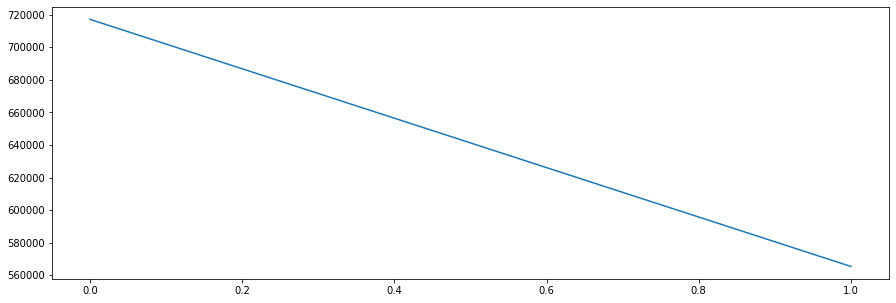

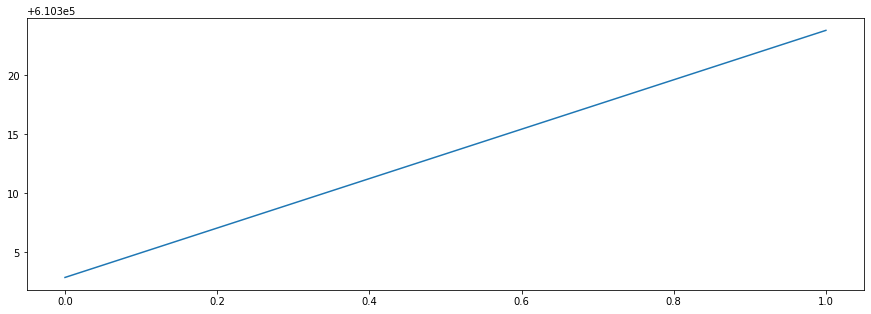

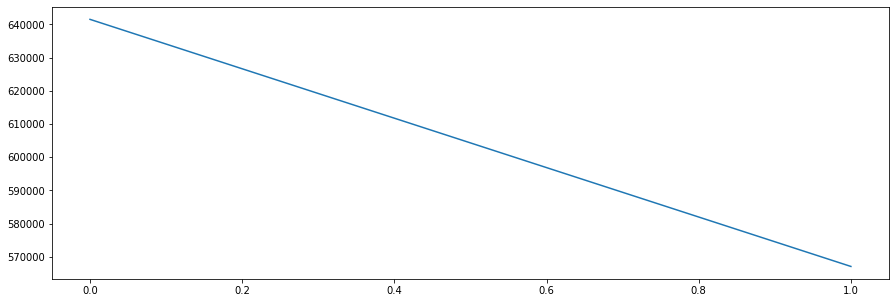

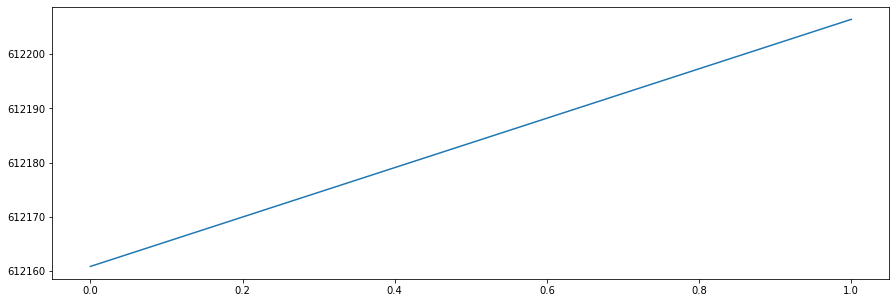

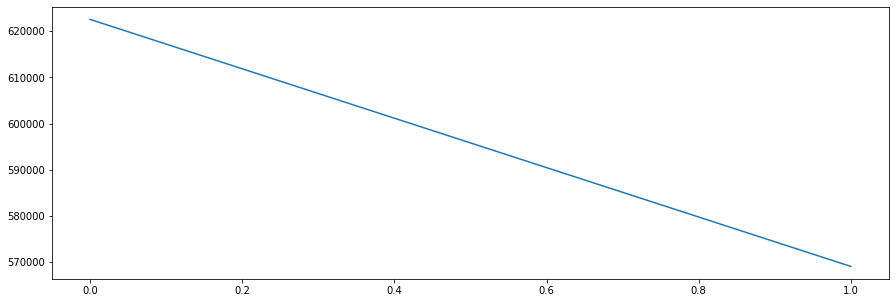

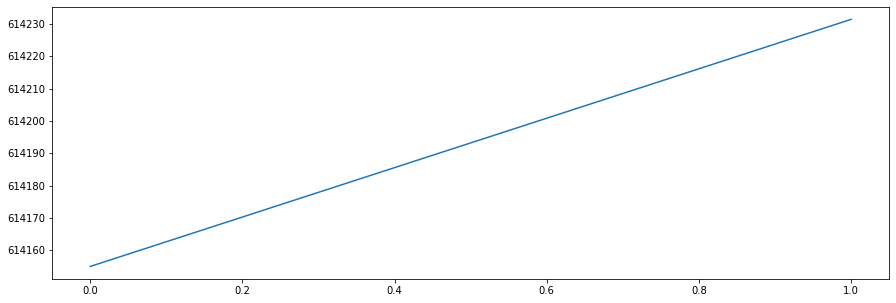

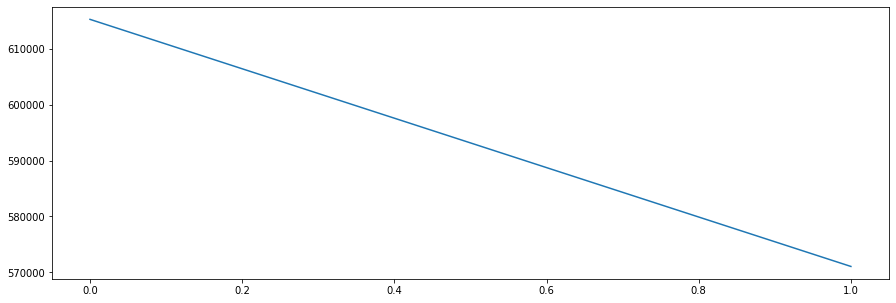

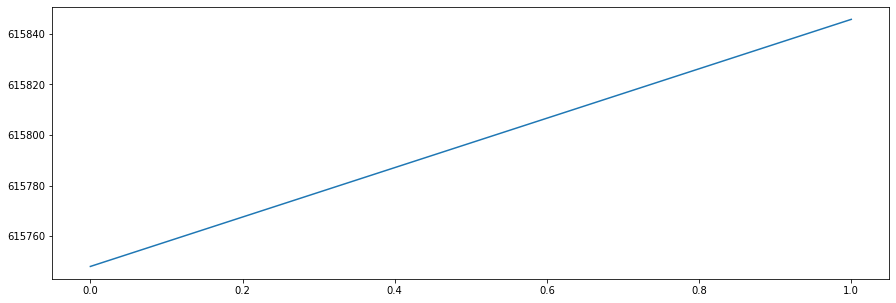

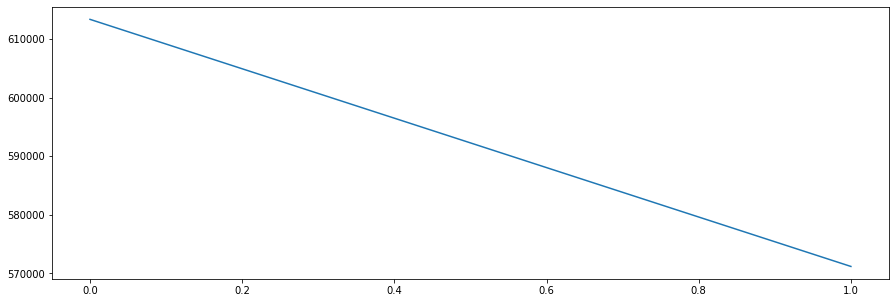

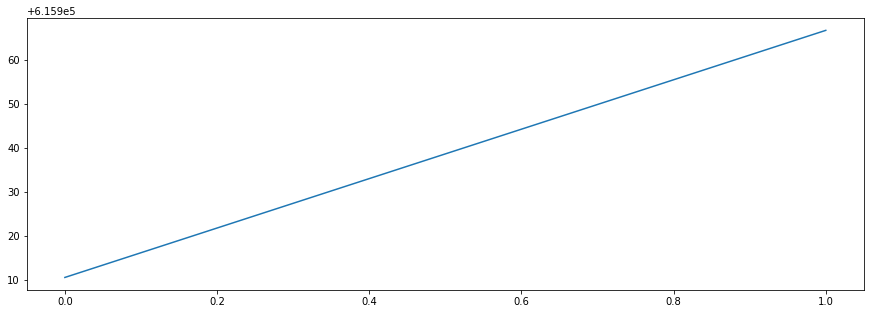

In [21]:
new_model = learn(141, 1500, 50, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(700426.8125) tensor(700426.8125)
epoch: 2
epoch: 3
epoch: 4
epoch:   4 loss: 53593.1015625000
epoch: 0
tensor(696495.0625) tensor(696495.0625)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(696268.0625) tensor(696268.0625)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(696258.7500) tensor(696258.7500)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
epoch:  15 loss: 43746.1015625000
epoch: 0
tensor(693319.2500) tensor(693319.2500)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(693297.6250) tensor(693297.6250)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(693296.8750) tensor(693296.8750)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
epoch:  15 loss: 25586.6601562500
epoch: 0
tensor(693696.) tensor(693613.5000)
epoch:   1 loss: 18106.8378906250
epoch: 0
tensor(694375.0625) tensor(694212.1875)
epoch:   1 loss: 14902.4980468750
best model hidden size: 300
0.08345905734428057
199.6620543434575


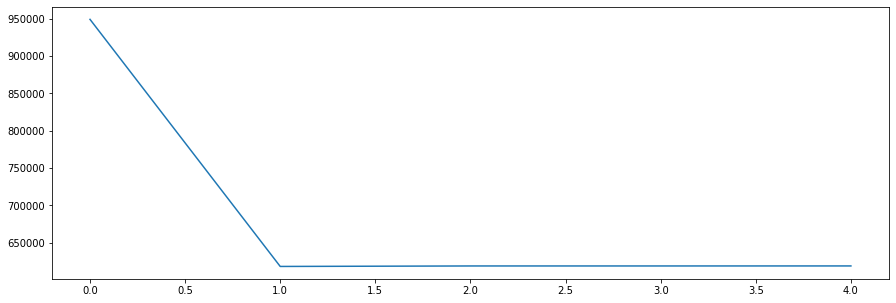

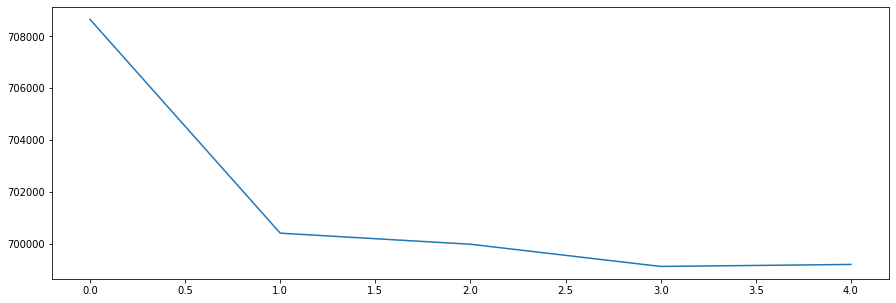

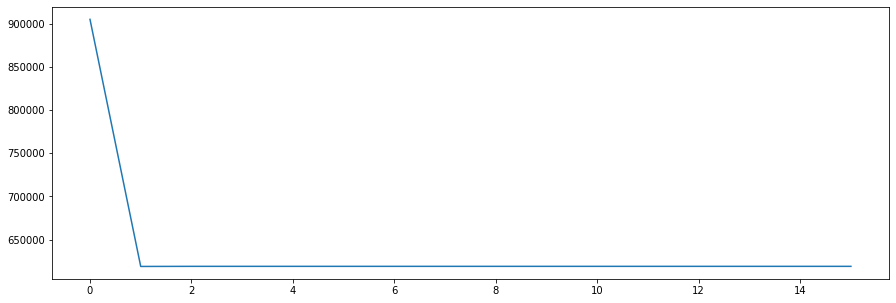

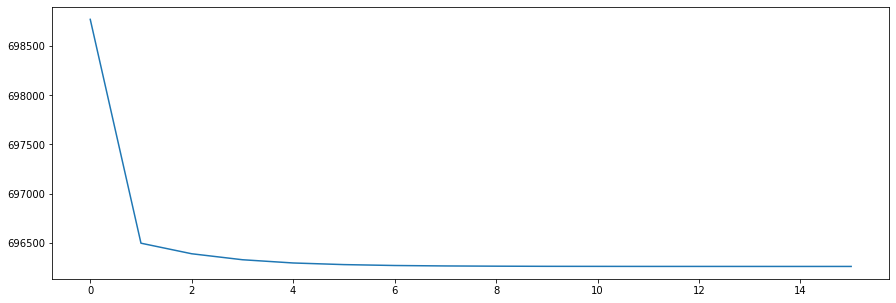

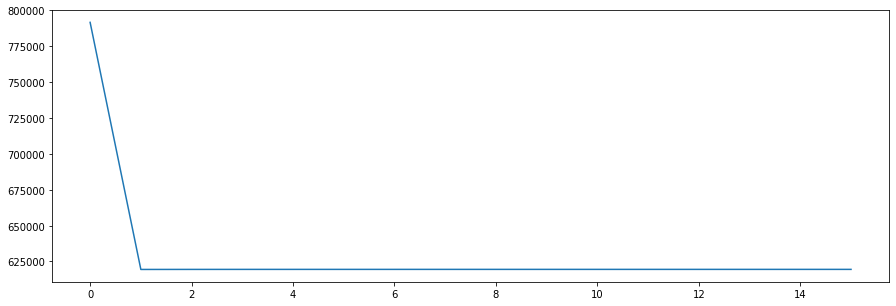

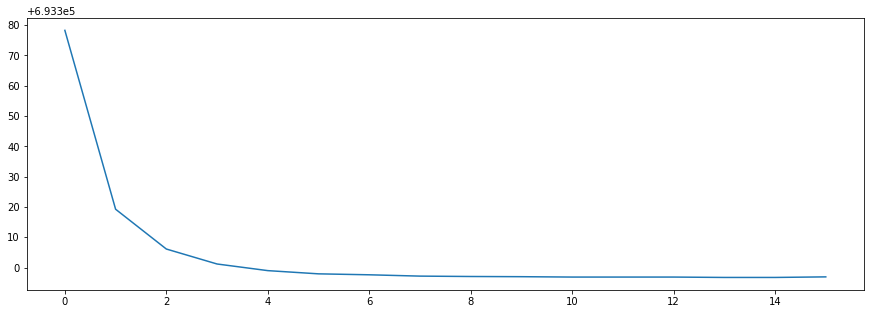

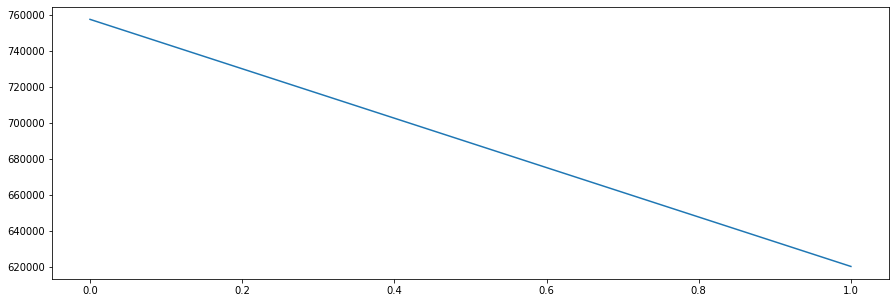

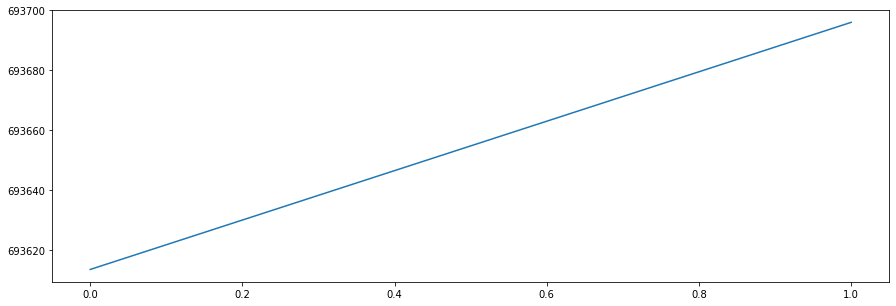

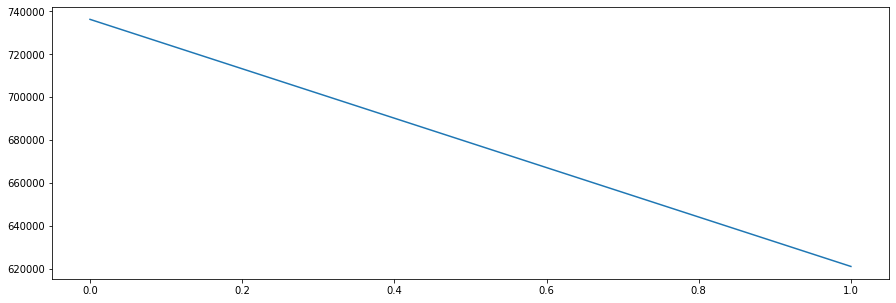

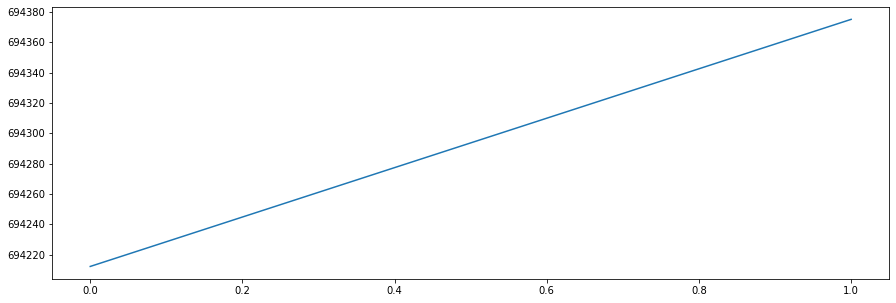

In [22]:
new_model = learn(141, 1500, 100, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(745005.8125) tensor(745005.8125)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(740180.0625) tensor(740180.0625)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(740178.) tensor(740178.)
epoch: 12
epoch: 13
epoch: 14
epoch:  14 loss: 1115343.3750000000
epoch: 0
tensor(740279.9375) tensor(740279.9375)
epoch: 2
epoch: 3
epoch:   3 loss: 1117336.7500000000
epoch: 0
tensor(739733.6875) tensor(739733.6875)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(739691.) tensor(739691.)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(739686.7500) tensor(739686.7500)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(739685.8125) tensor(739685.8125)
epoch: 17
epoch:  17 loss: 1096743.5000000000
epoch: 0
tensor(739641.4375) tensor(739641.4375)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(739530.3750) tensor(739530.3750)
epoch: 7
epoch:   7 loss: 1089034.3750000000
epoch: 0
tensor(739433.1875) tensor(739378.5625)
epoch:   1 loss: 1027938.6250000000
best model hidden size: 300
0.04358604535813957


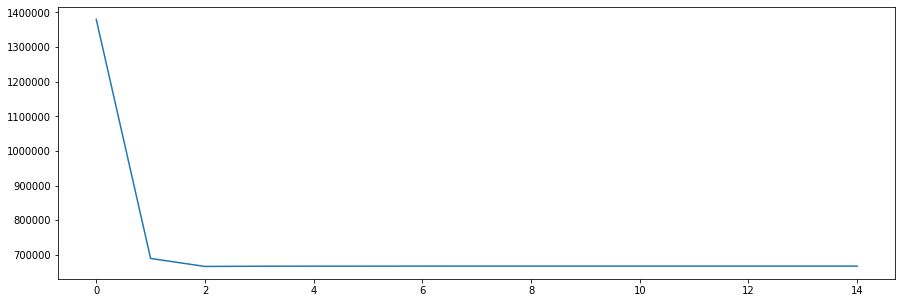

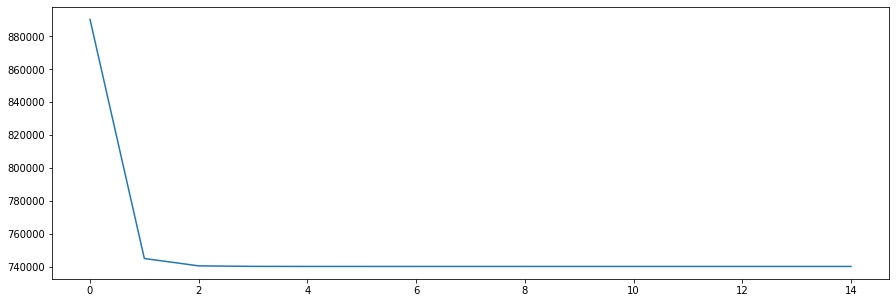

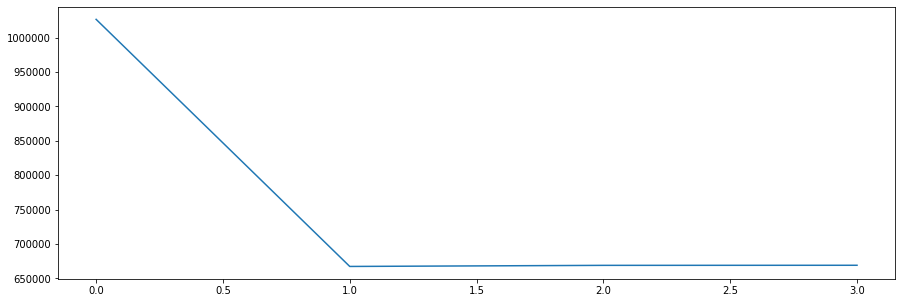

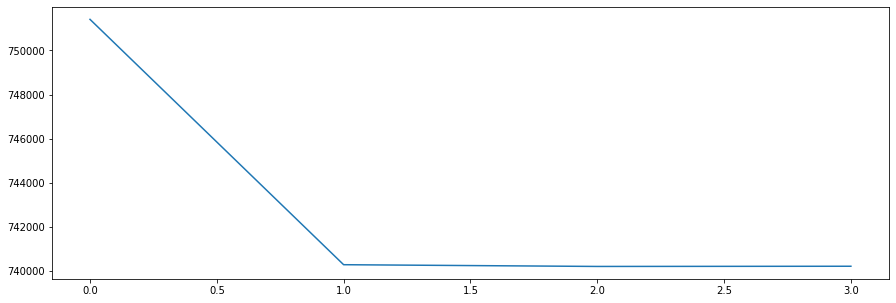

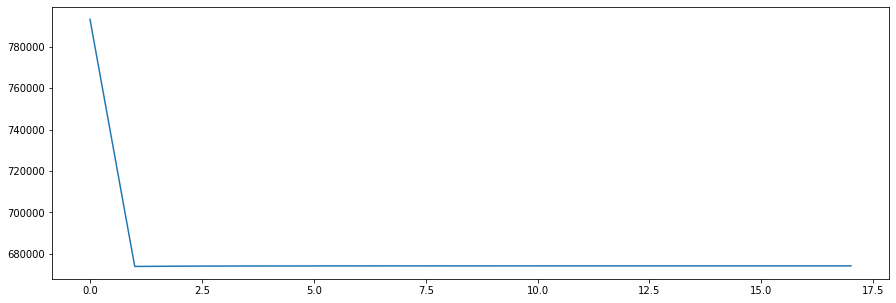

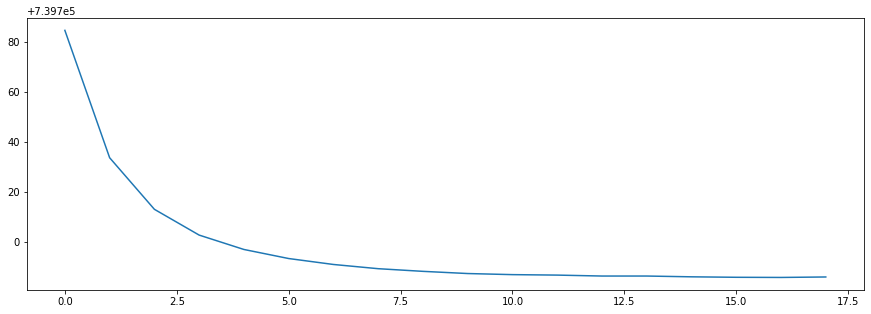

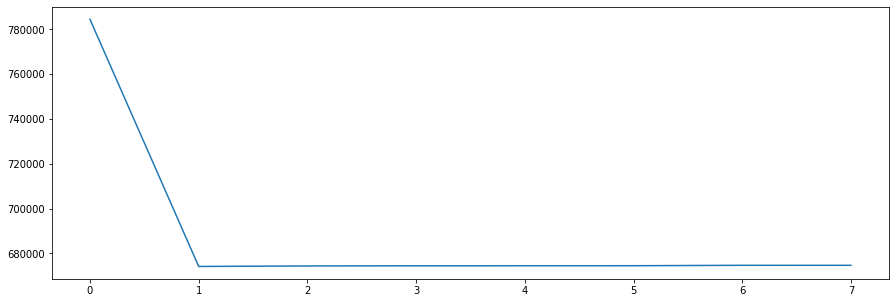

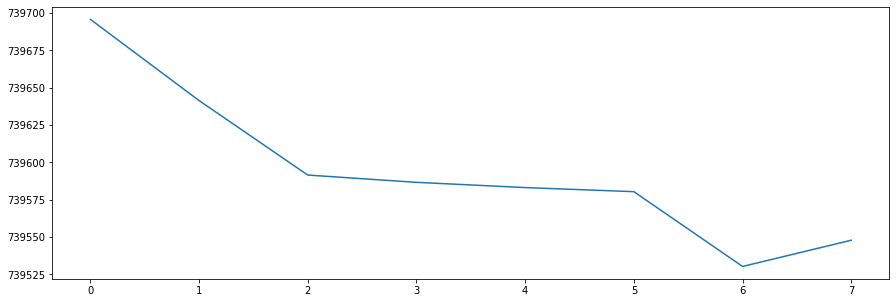

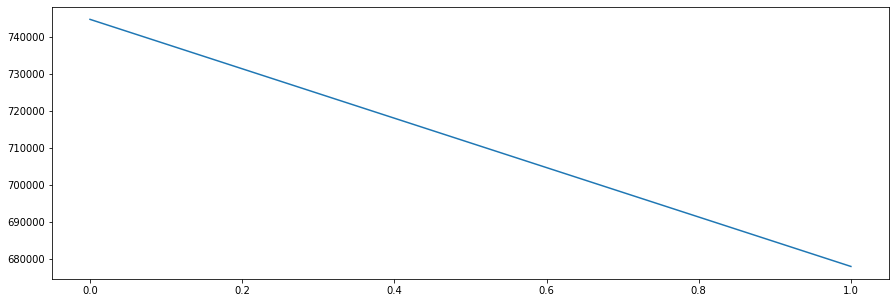

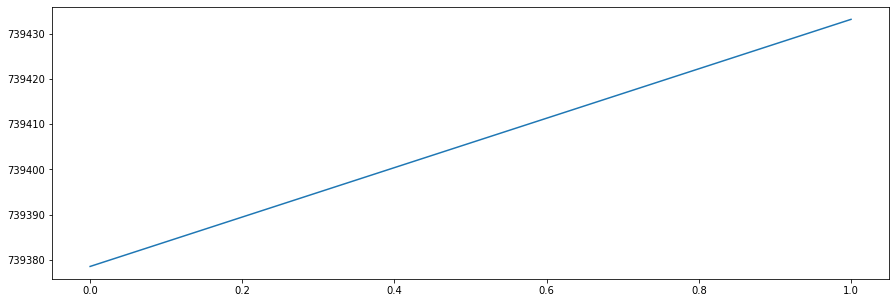

In [23]:
new_model = learn(141, 1500, 150, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(532611.2500) tensor(532611.2500)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(412069.2188) tensor(412069.2188)
epoch: 7
epoch:   7 loss: 107119.7500000000
epoch: 0
tensor(422206.8125) tensor(422206.8125)
epoch: 2
epoch: 3
epoch: 4
epoch:   4 loss: 129434.9296875000
epoch: 0
tensor(420926.5000) tensor(420926.5000)
epoch: 2
epoch: 3
epoch:   3 loss: 133170.0625000000
epoch: 0
tensor(421747.4062) tensor(421747.4062)
epoch: 2
epoch: 3
epoch:   3 loss: 139059.8125000000
epoch: 0
tensor(426708.3125) tensor(426708.3125)
epoch: 2
epoch:   2 loss: 152589.6250000000
best model hidden size: 300
0.031862930351046446
172.88395189007866


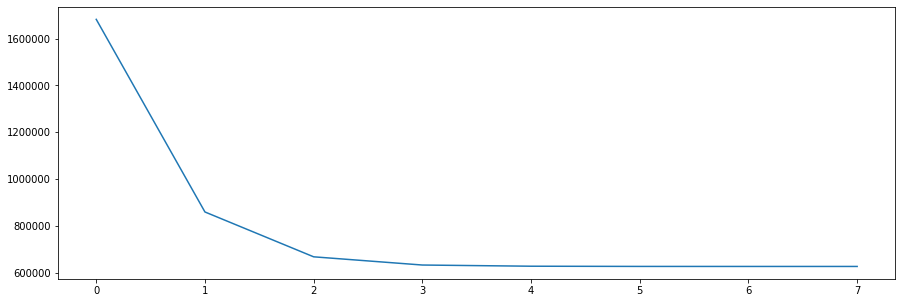

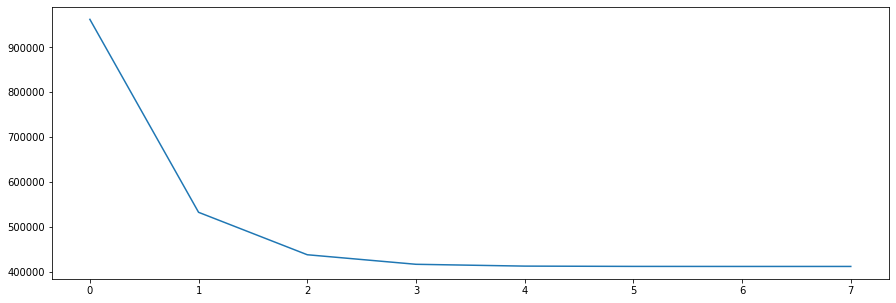

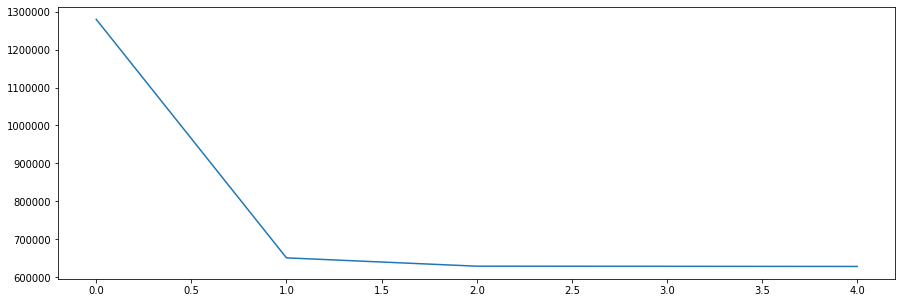

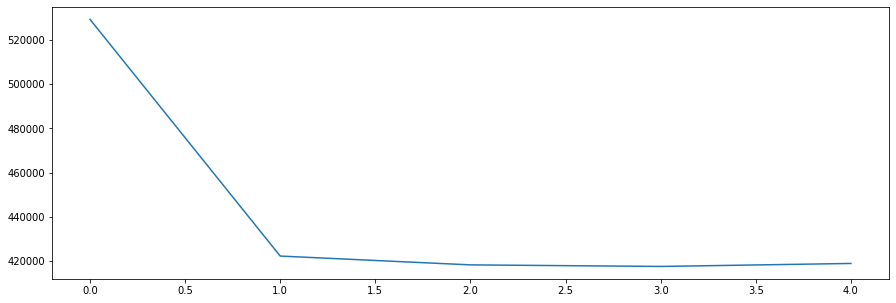

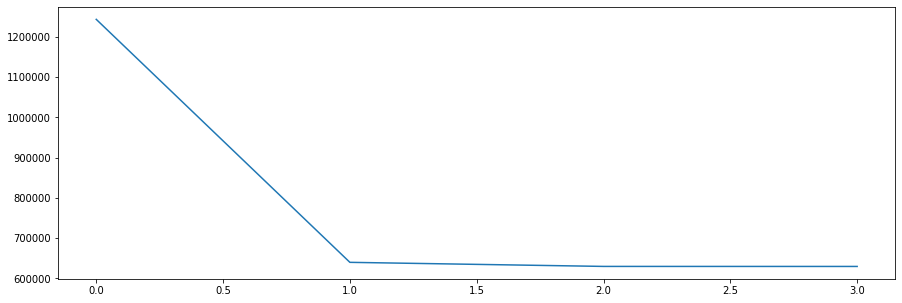

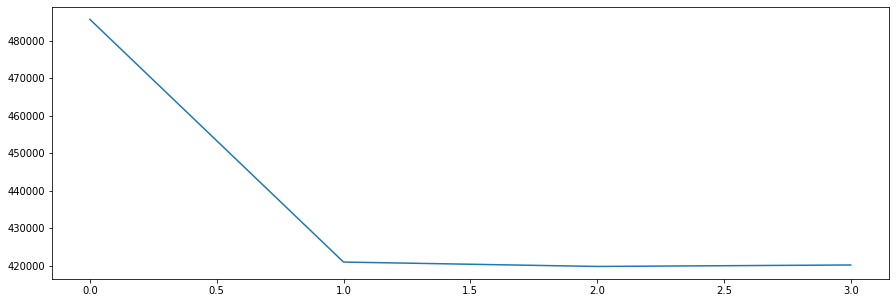

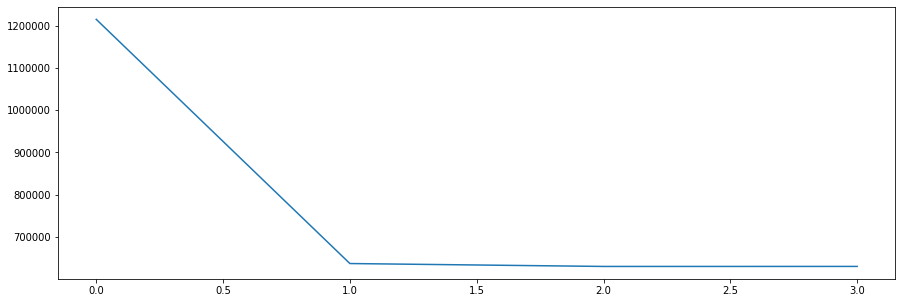

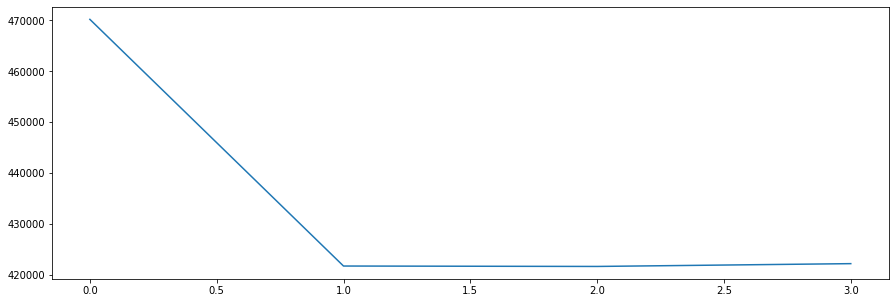

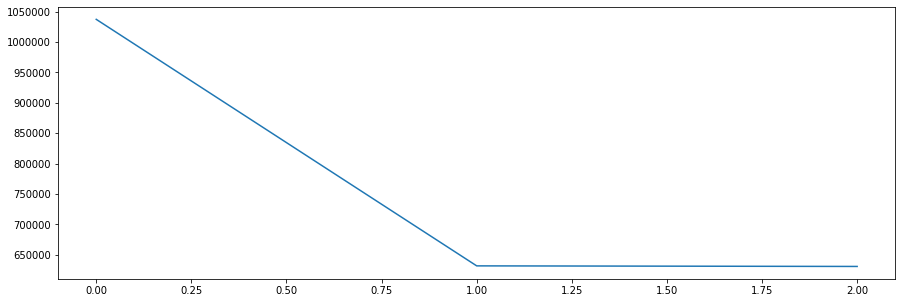

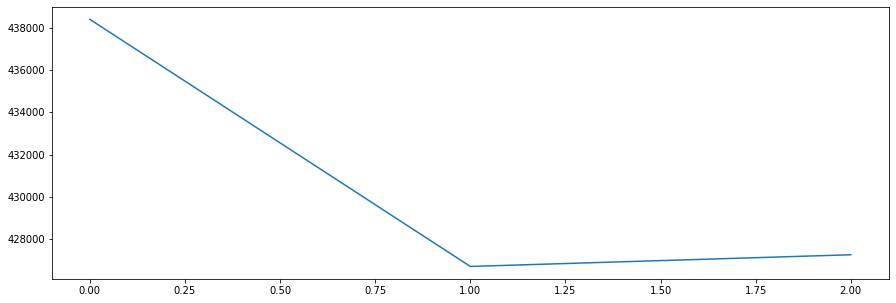

In [24]:
new_model = learn(141, 1500, 200, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(1855487.1250) tensor(1855487.1250)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(1327227.8750) tensor(1327227.8750)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(1319709.7500) tensor(1319709.7500)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(1319571.1250) tensor(1319571.1250)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 546.1335449219
epoch: 0
tensor(1402395.6250) tensor(1402395.6250)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(1318944.6250) tensor(1318944.6250)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(1318862.8750) tensor(1318862.8750)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(1318836.8750) tensor(1318836.8750)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 484.2618713379
epoch: 0
tensor(1345504.) tensor(1345504.)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(1318333.5000) tensor(1318333.5000)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(1318256.6250) tensor(1318256.6250)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(1318227.7500) tensor(1318227.7500)


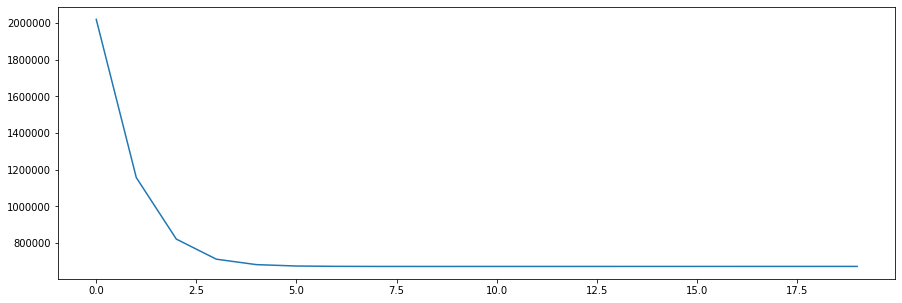

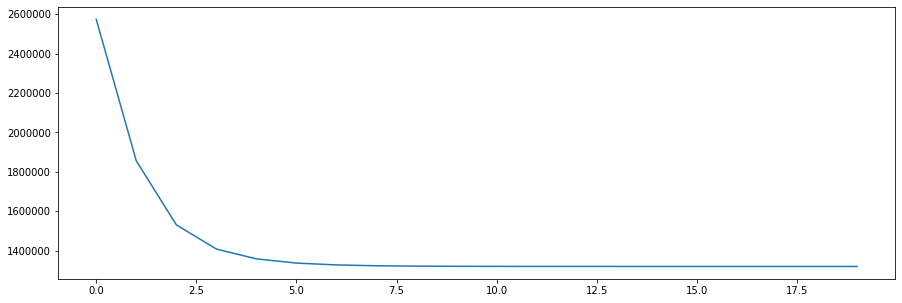

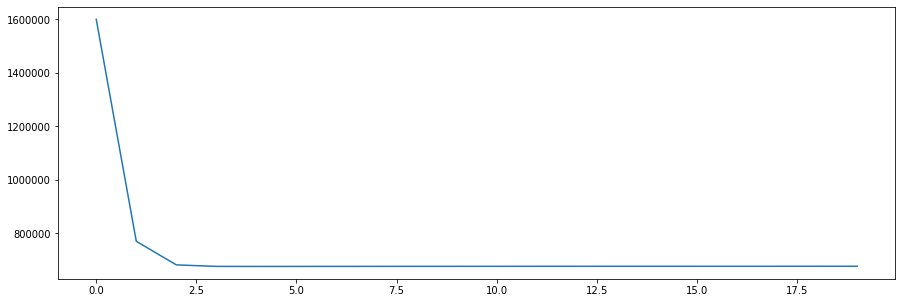

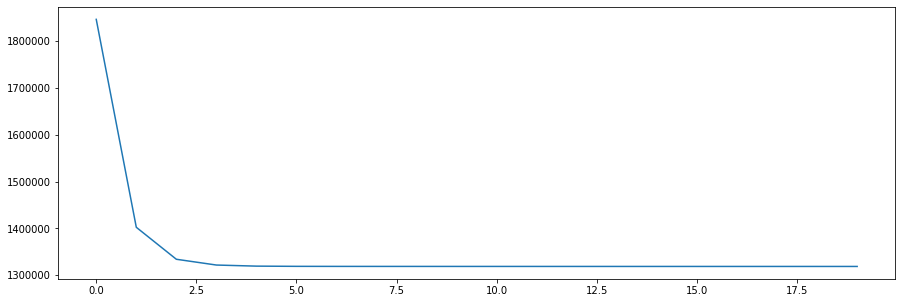

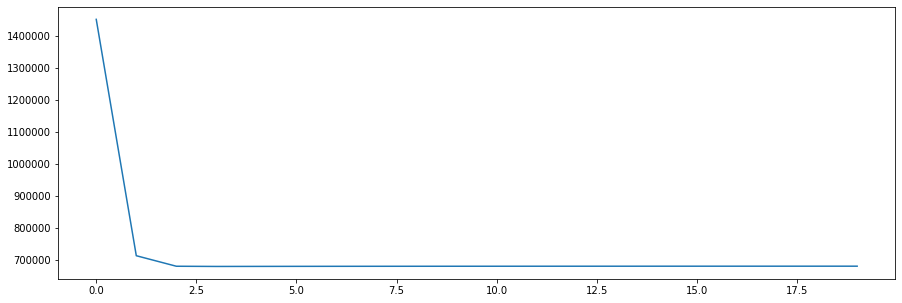

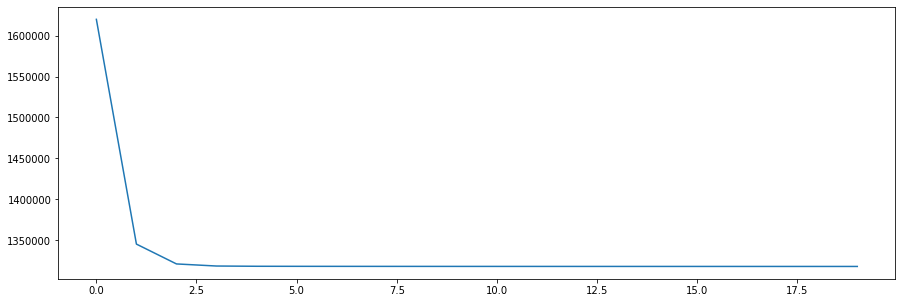

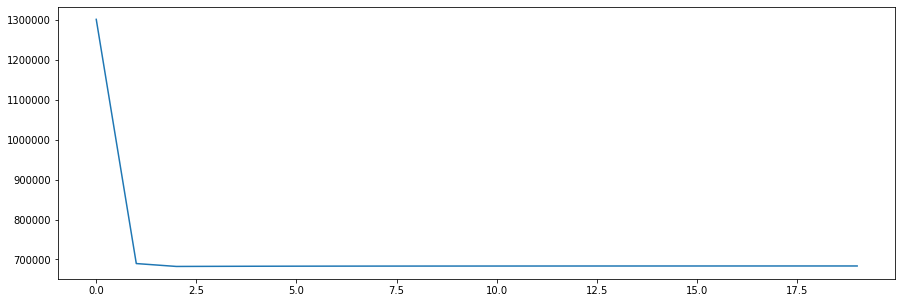

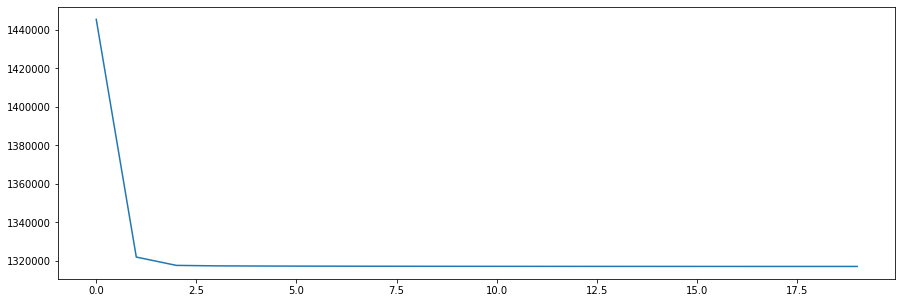

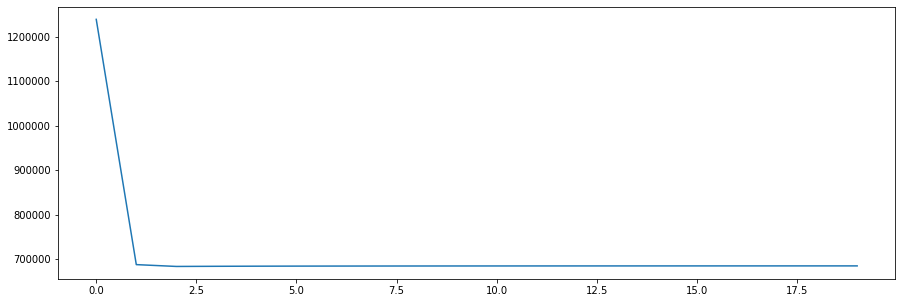

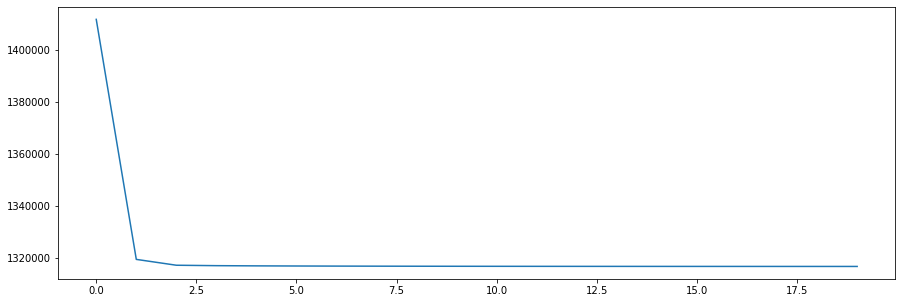

In [25]:
new_model = learn(141, 1500, 250, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(609845.5625) tensor(609845.5625)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
epoch:   5 loss: 143604.0156250000
epoch: 0
tensor(358270.5938) tensor(358270.5938)
epoch: 2
epoch: 3
epoch:   3 loss: 253143.7812500000
epoch: 0
tensor(339075.3438) tensor(339075.3438)
epoch: 2
epoch:   2 loss: 241827.1406250000
epoch: 0
tensor(423214.1562) tensor(395411.4062)
epoch:   1 loss: 236534.4375000000
epoch: 0
tensor(503508.4375) tensor(343706.7188)
epoch:   1 loss: 361442.7500000000
best model hidden size: 300
0.04137270787735615
161.79892451407494


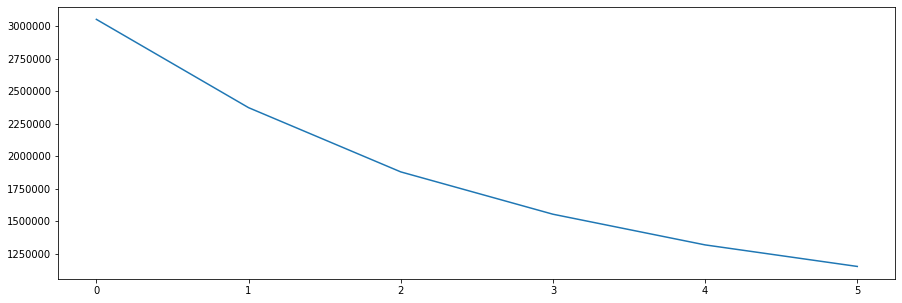

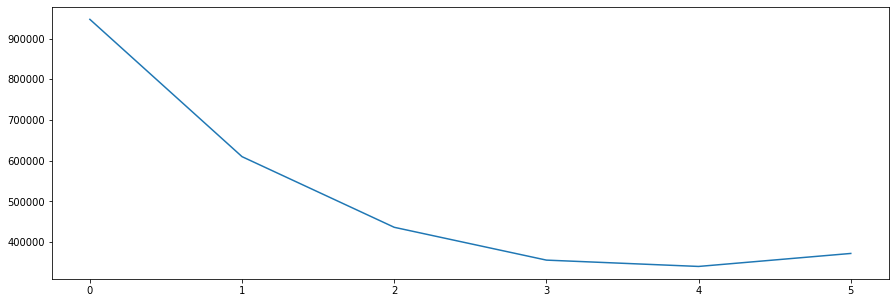

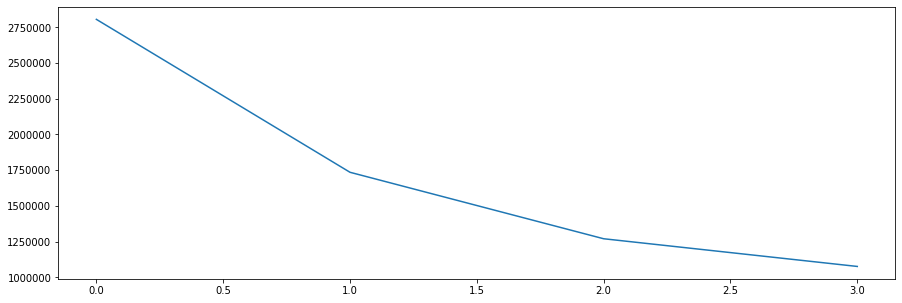

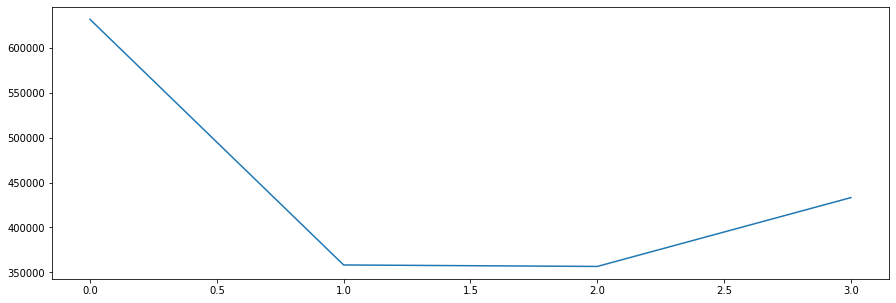

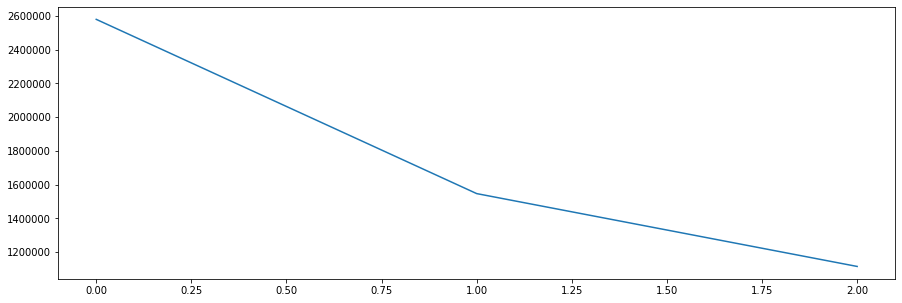

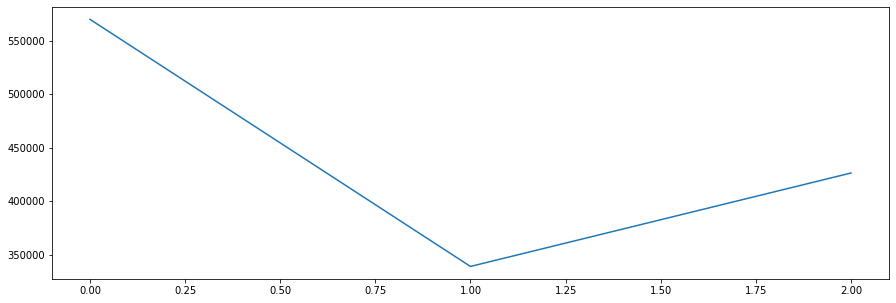

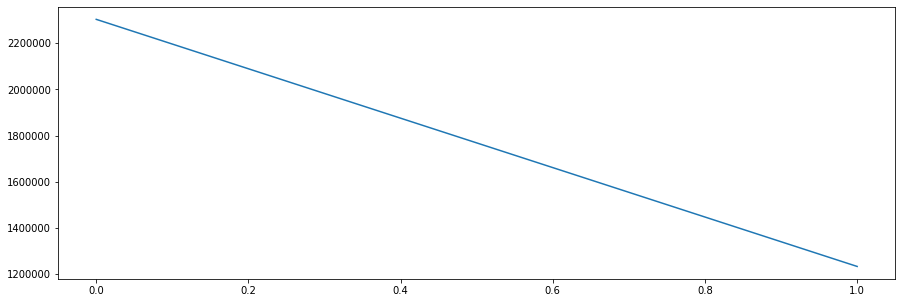

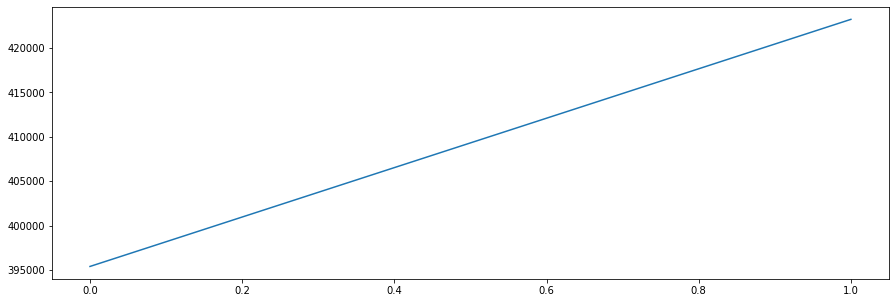

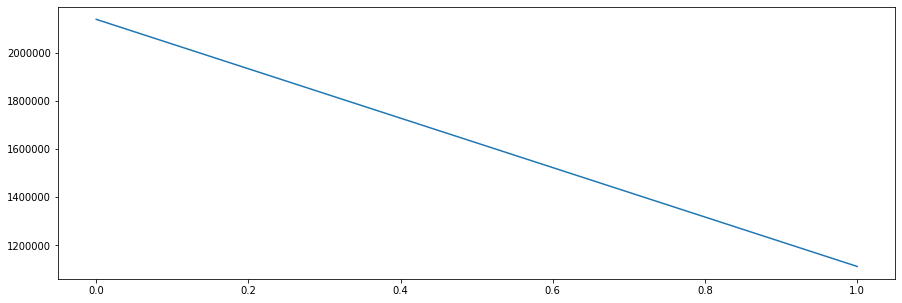

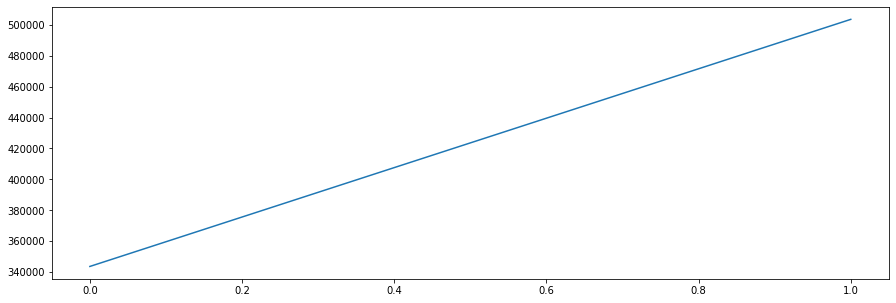

In [26]:
new_model = learn(141, 1500, 300, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(2970693.) tensor(2970693.)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(1627842.8750) tensor(1627842.8750)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(1289529.2500) tensor(1289529.2500)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(1207690.6250) tensor(1207690.6250)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 1003705.6250000000
epoch: 0
tensor(2161779.2500) tensor(2161779.2500)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(1233158.1250) tensor(1233158.1250)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(1183012.6250) tensor(1183012.6250)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(1179490.5000) tensor(1179490.5000)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 960012.6250000000
epoch: 0
tensor(1448310.5000) tensor(1448310.5000)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(1187997.3750) tensor(1187997.3750)
epoch: 7
epoch: 8
epoch: 9
epoch:   9 loss: 985741.1250000000
epoch: 0
tensor(1315706.6250) tensor(1315706.6250)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tenso

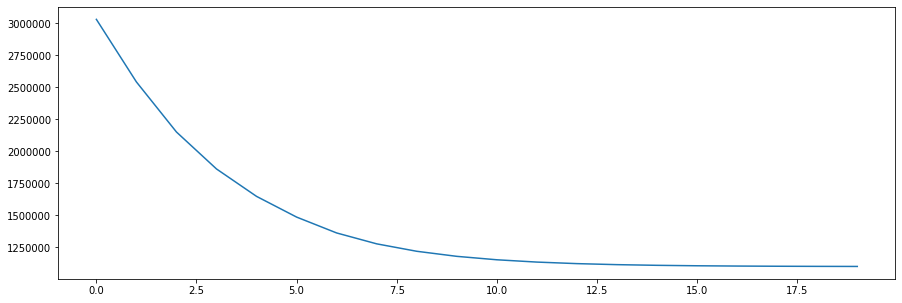

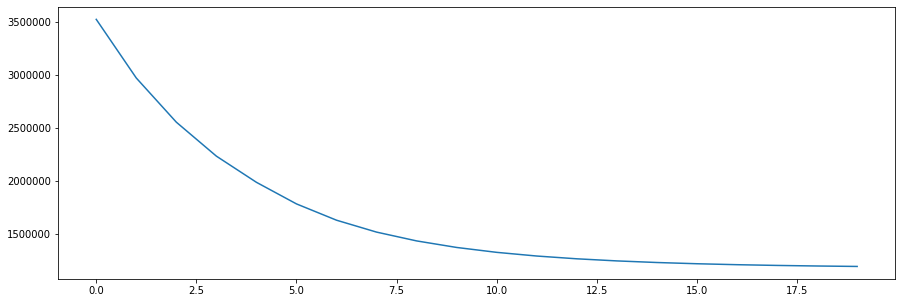

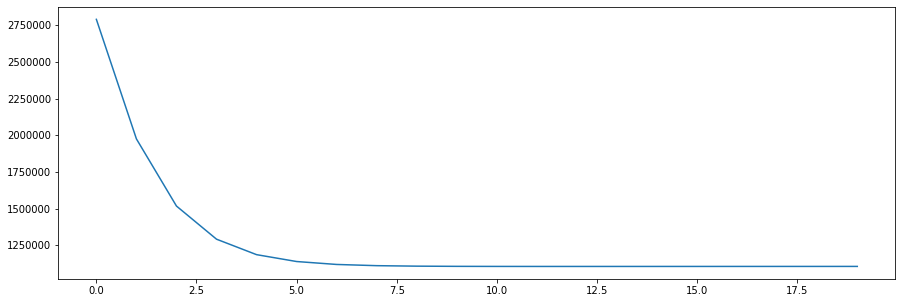

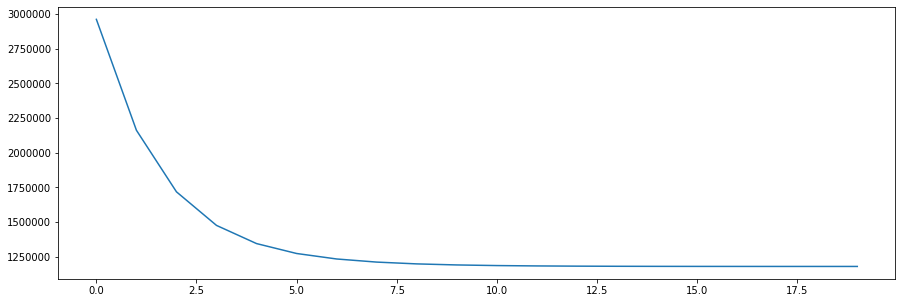

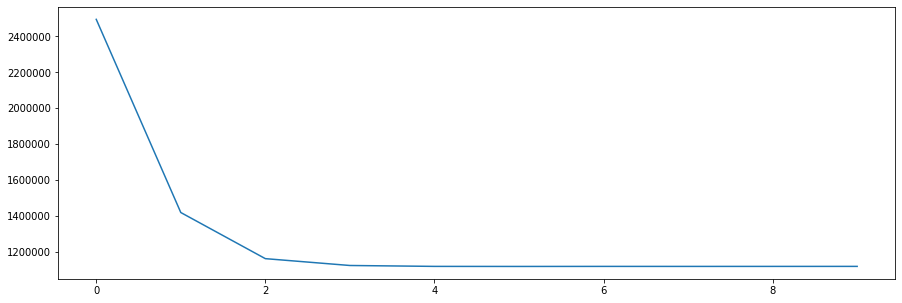

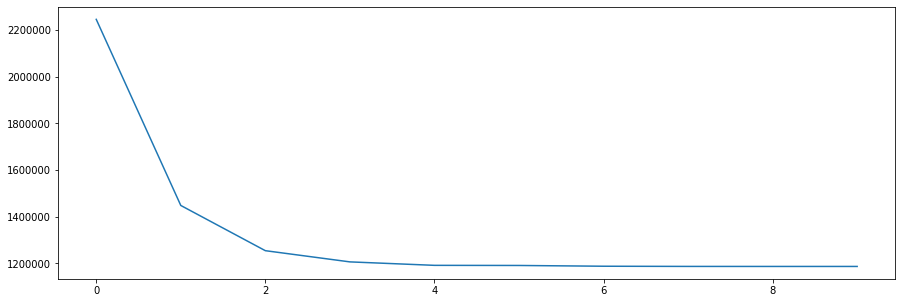

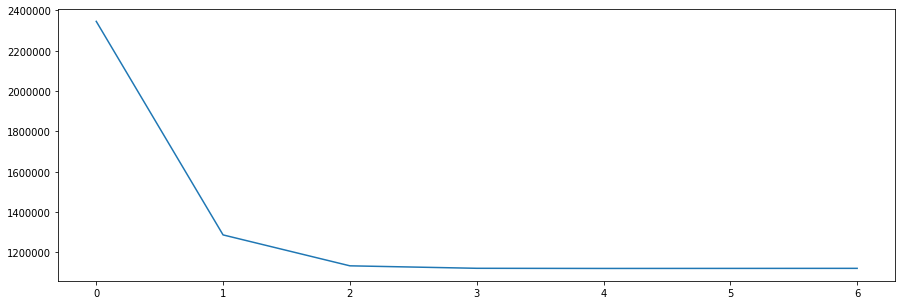

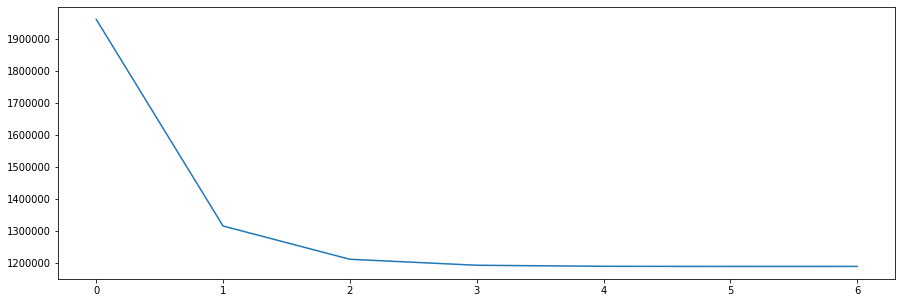

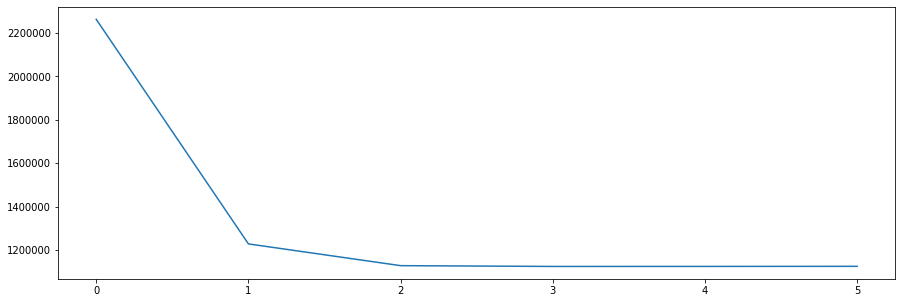

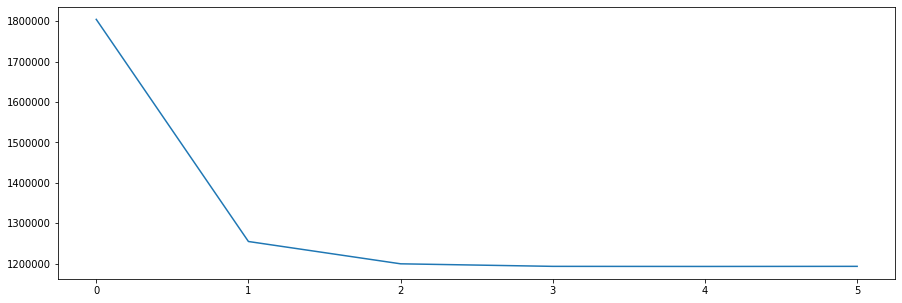

In [27]:
new_model = learn(141, 1500, 350, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(3513225.2500) tensor(3513225.2500)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(2559602.7500) tensor(2559602.7500)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(2136537.2500) tensor(2136537.2500)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(1953070.1250) tensor(1953070.1250)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 18659.7031250000
epoch: 0
tensor(3117251.) tensor(3117251.)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(2087150.5000) tensor(2087150.5000)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(1896140.6250) tensor(1896140.6250)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(1867856.3750) tensor(1867856.3750)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 1324.2220458984
epoch: 0
tensor(2277729.) tensor(2277729.)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(1866468.3750) tensor(1866468.3750)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(1863603.) tensor(1863603.)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(1863539.6250) tensor(1863539.6250)
epoch: 17
epo

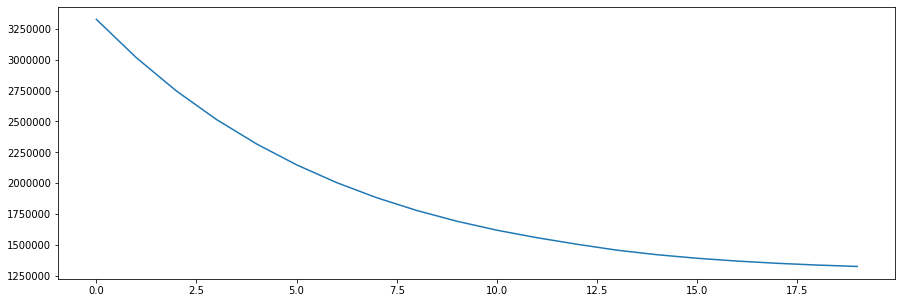

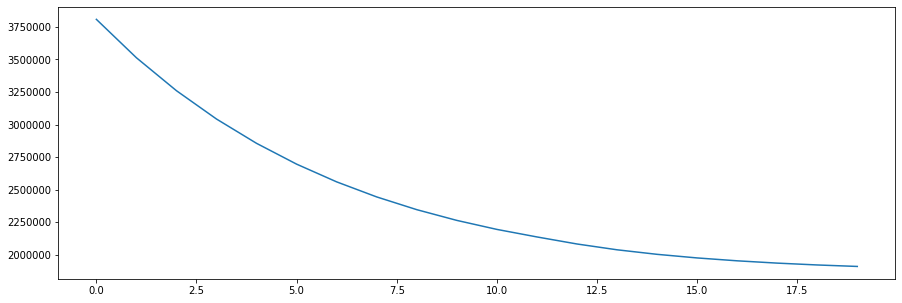

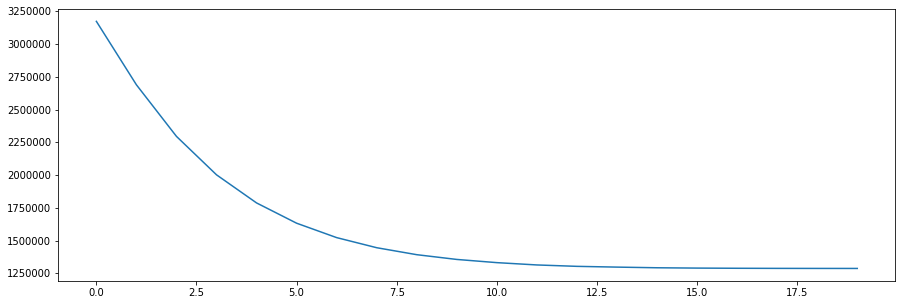

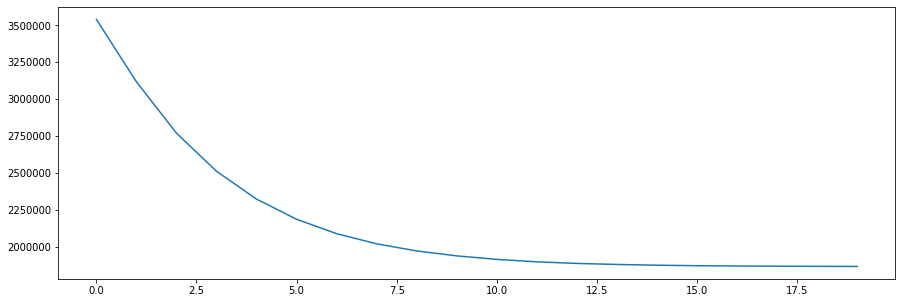

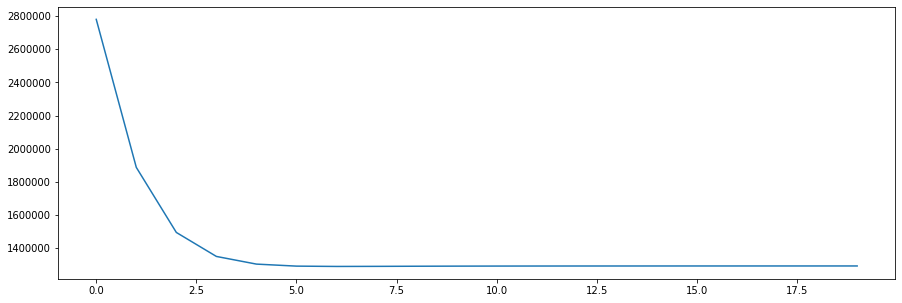

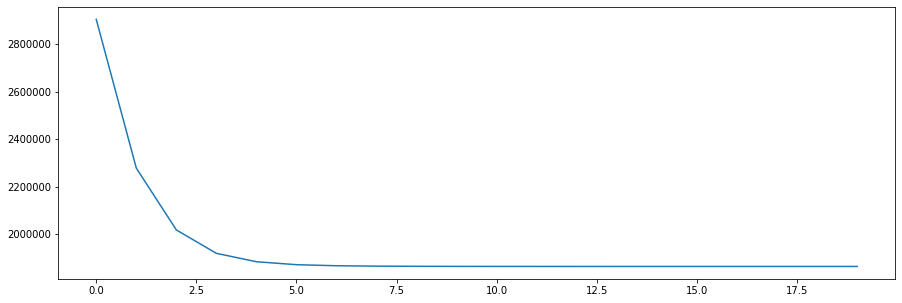

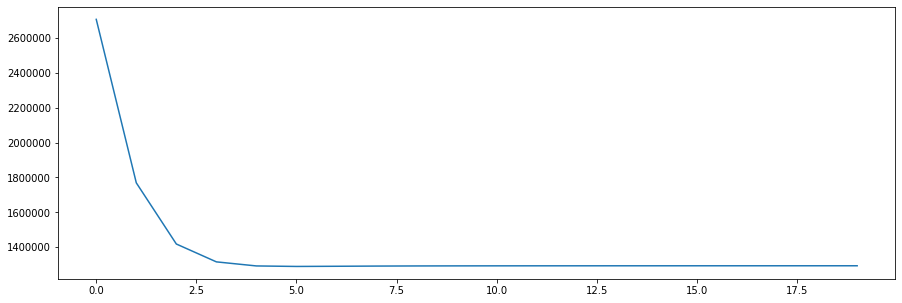

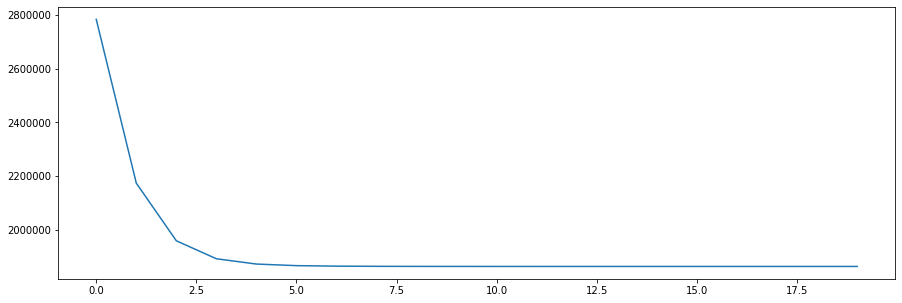

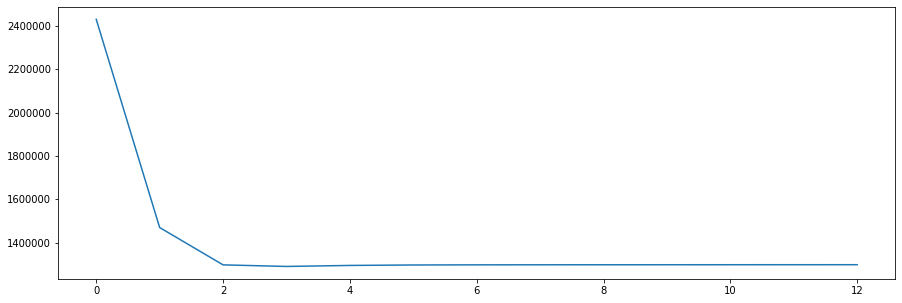

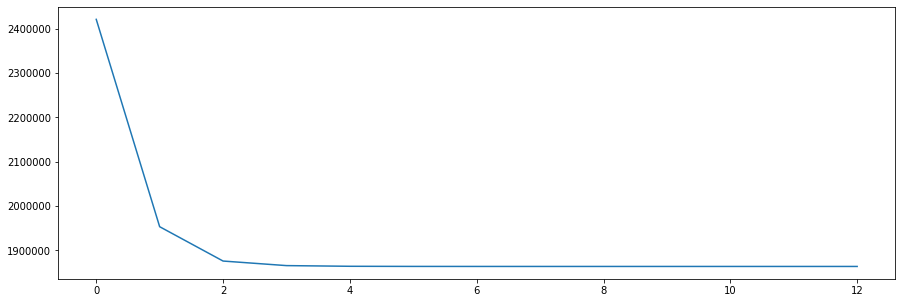

In [28]:
new_model = learn(141, 1500, 400, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(1076239.5000) tensor(1076239.5000)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(675621.8750) tensor(675621.8750)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(458881.7500) tensor(458881.7500)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(362540.8750) tensor(362540.8750)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 228447.3906250000
epoch: 0
tensor(943952.1250) tensor(943952.1250)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(454198.4062) tensor(454198.4062)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(340065.3125) tensor(340065.3125)
epoch: 12
epoch: 13
epoch:  13 loss: 128684.9687500000
epoch: 0
tensor(596101.3750) tensor(596101.3750)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
epoch:   5 loss: 85750.7421875000
epoch: 0
tensor(464444.3750) tensor(464444.3750)
epoch: 2
epoch: 3
epoch: 4
epoch:   4 loss: 47753.8085937500
epoch: 0
tensor(393914.2812) tensor(393914.2812)
epoch: 2
epoch: 3
epoch:   3 loss: 42986.7734375000
best model hidden size: 300
0.009873750830931673
8

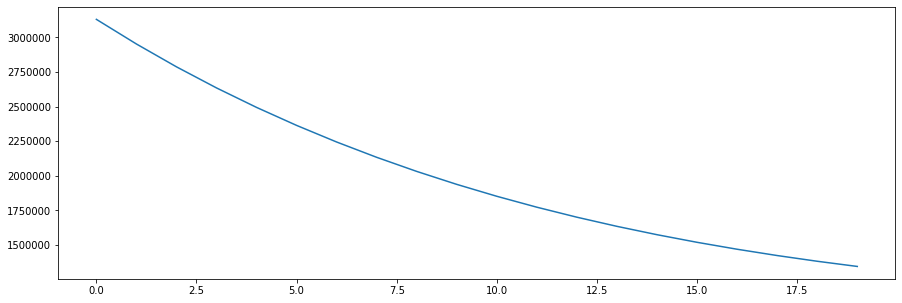

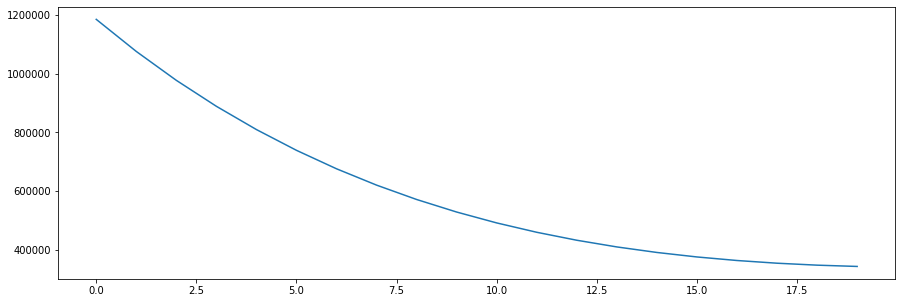

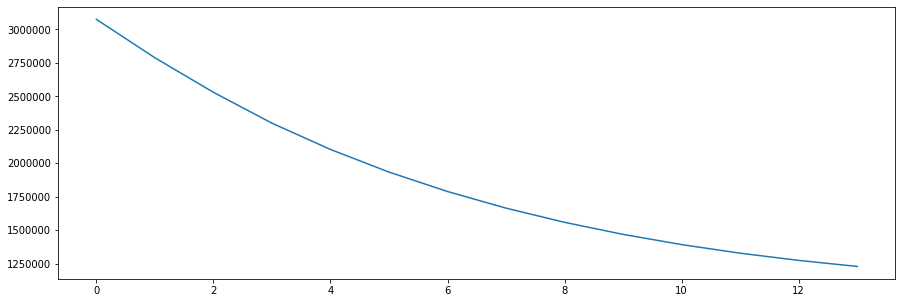

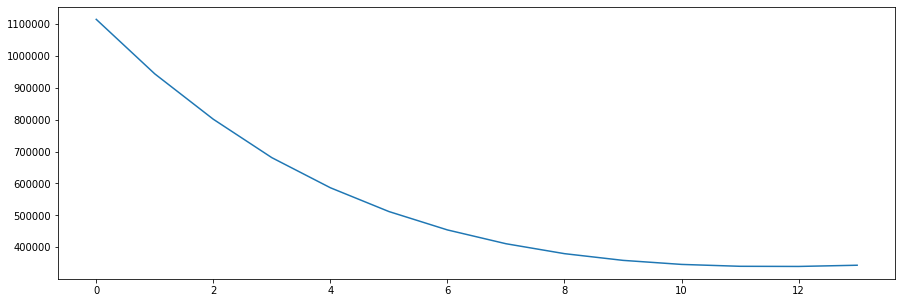

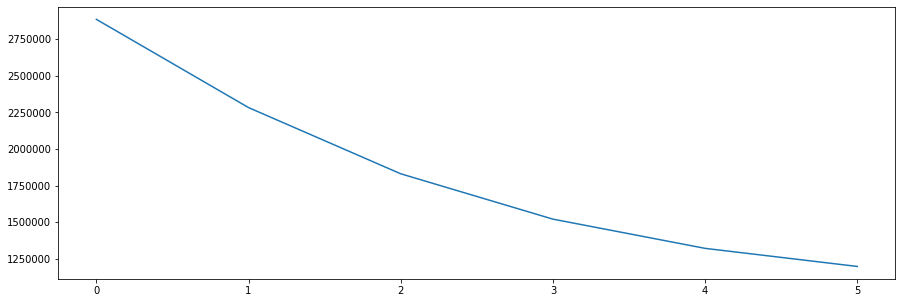

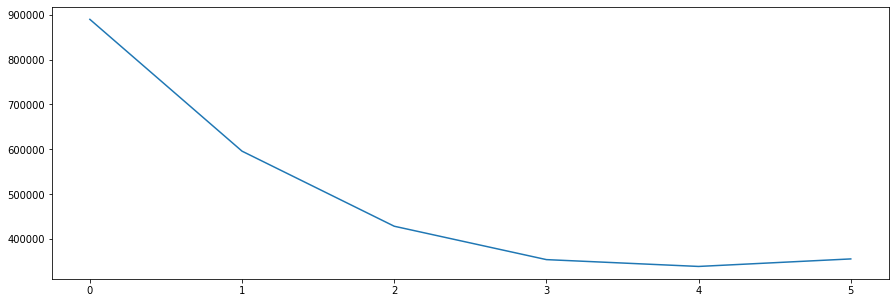

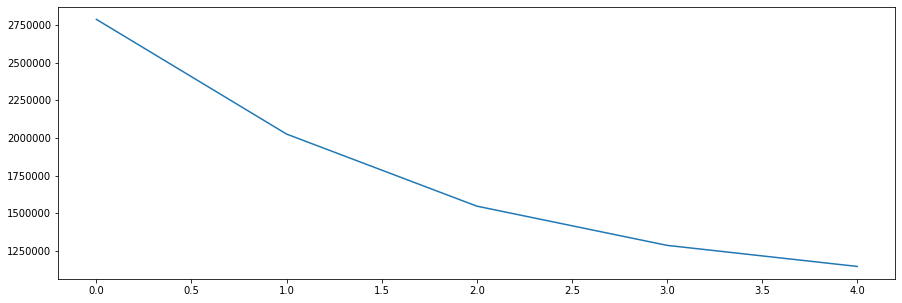

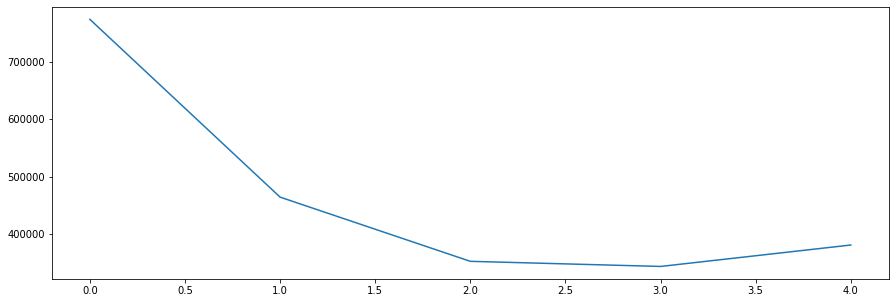

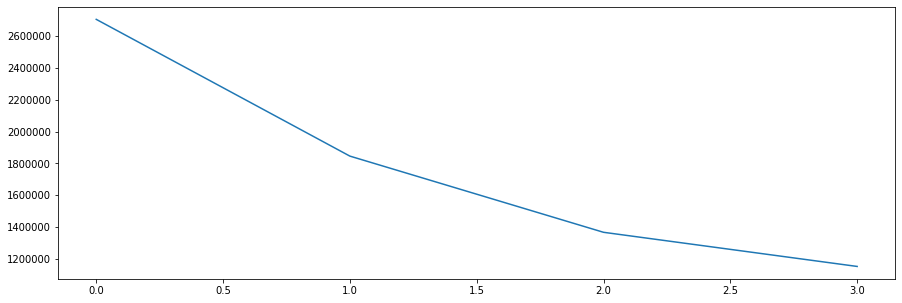

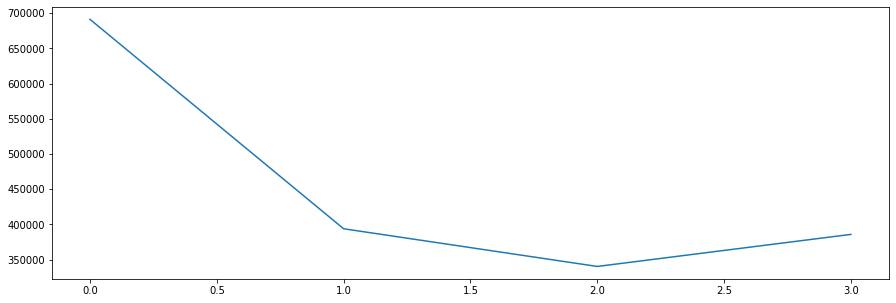

In [29]:
new_model = learn(141, 1500, 450, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(7042279.5000) tensor(7042279.5000)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(6444220.) tensor(6444220.)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(5917488.5000) tensor(5917488.5000)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(5454833.) tensor(5454833.)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 11117.1064453125
epoch: 0
tensor(6674032.) tensor(6674032.)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(5374709.5000) tensor(5374709.5000)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(4432870.) tensor(4432870.)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(3780448.2500) tensor(3780448.2500)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 279694.1562500000
epoch: 0
tensor(6023698.) tensor(6023698.)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(3939922.7500) tensor(3939922.7500)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(3074938.7500) tensor(3074938.7500)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(2743315.7500) tensor(2743315.7500)
epoch: 17
epoch: 18
epoch: 

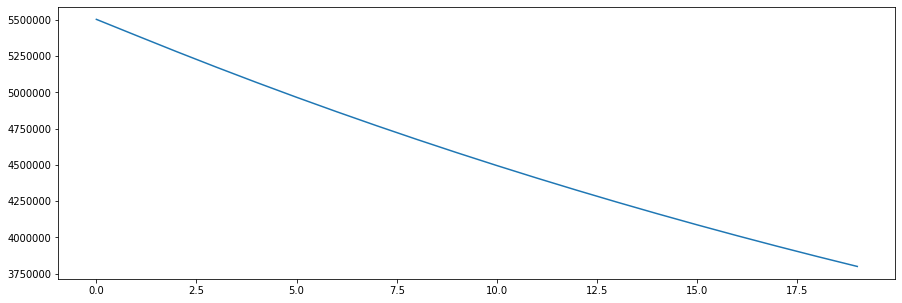

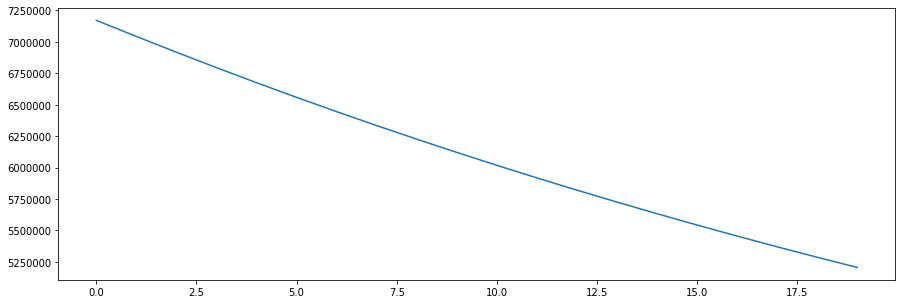

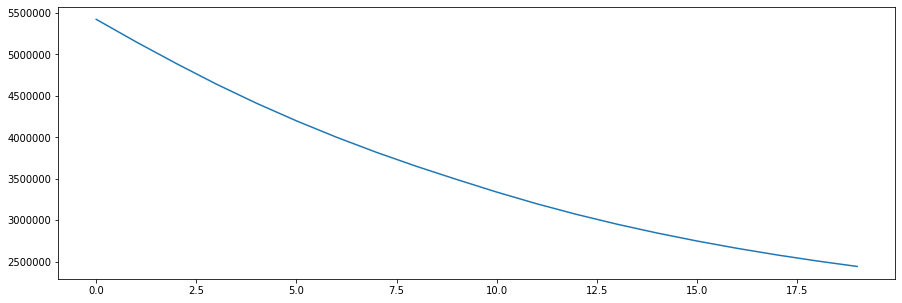

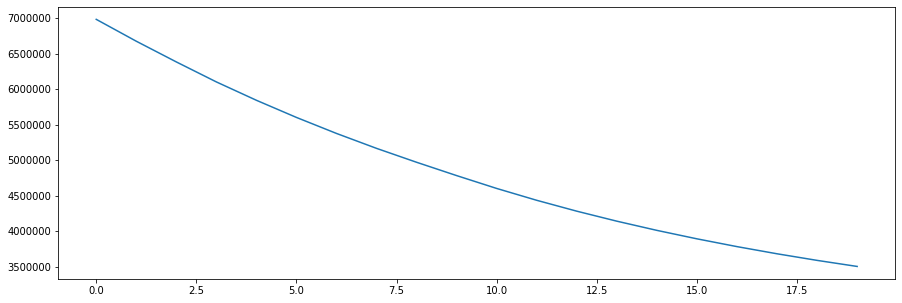

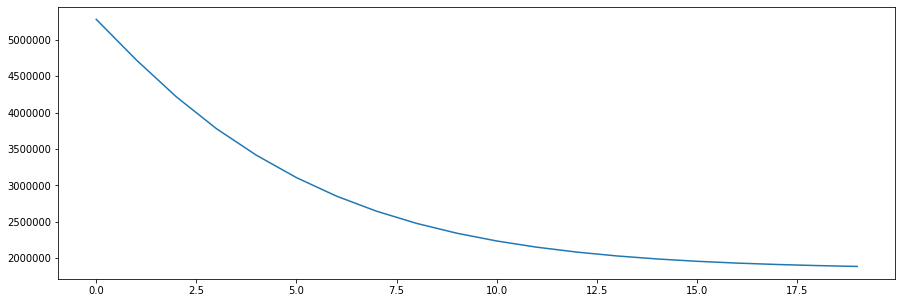

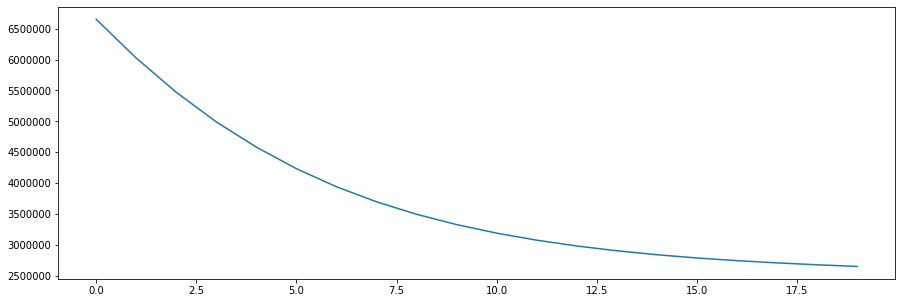

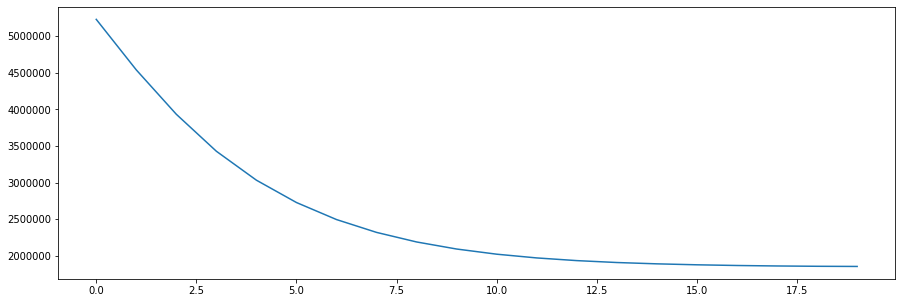

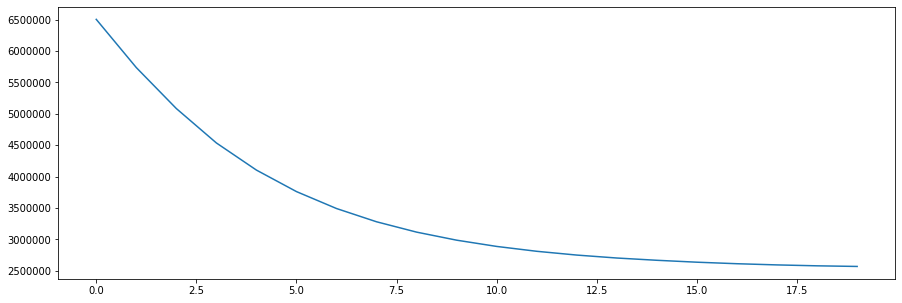

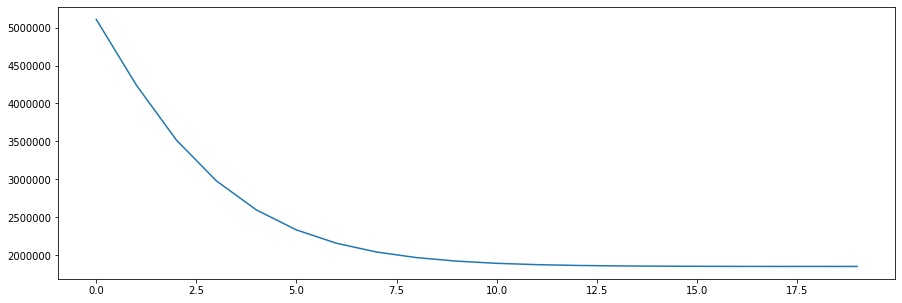

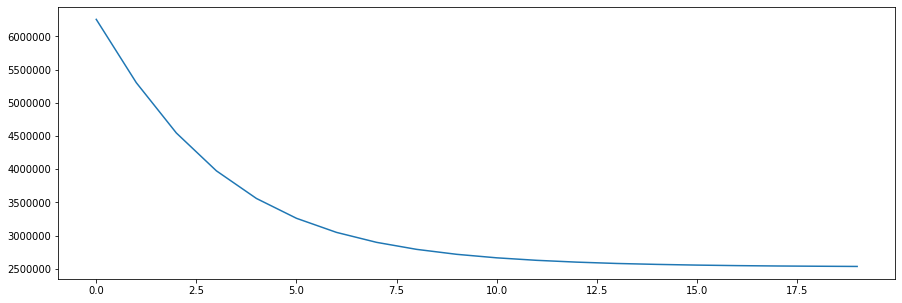

In [30]:
new_model = learn(141, 1500, 500, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(499685.1562) tensor(499685.1562)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(402594.1875) tensor(402594.1875)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(318329.5625) tensor(318329.5625)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(246100.0625) tensor(246100.0625)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 133307.9375000000
epoch: 0
tensor(439193.9688) tensor(439193.9688)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(220584.2500) tensor(220584.2500)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(84388.7969) tensor(84388.7969)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(19198.4902) tensor(19198.4902)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 5024.6298828125
epoch: 0
tensor(362651.6250) tensor(362651.6250)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(55109.2695) tensor(55109.2695)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
epoch:  10 loss: 21881.4726562500
epoch: 0
tensor(322786.1562) tensor(322786.1562)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(16693.1250) 

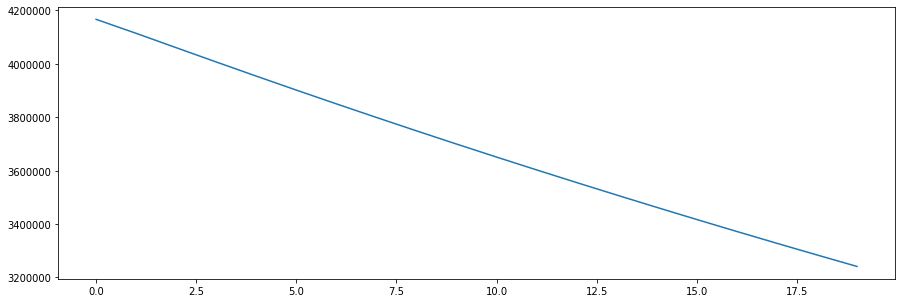

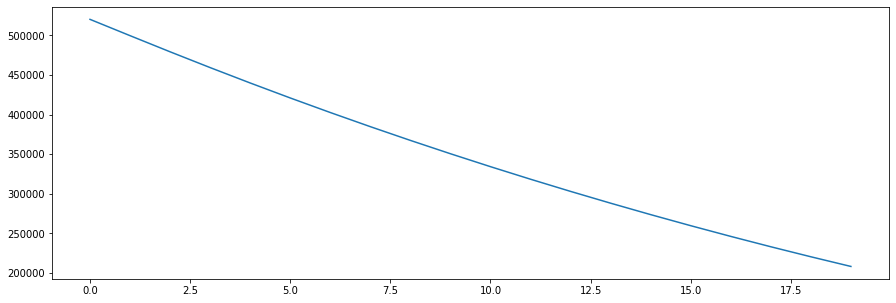

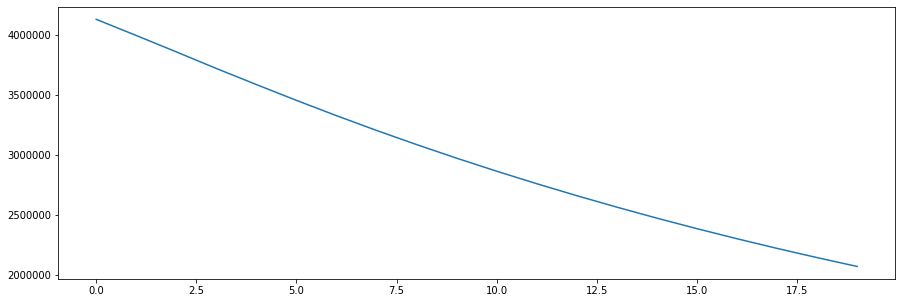

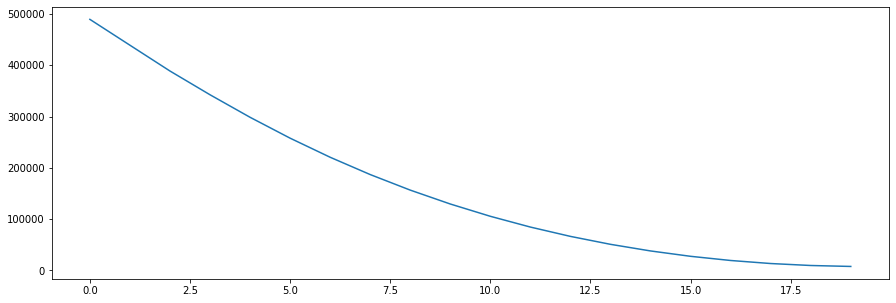

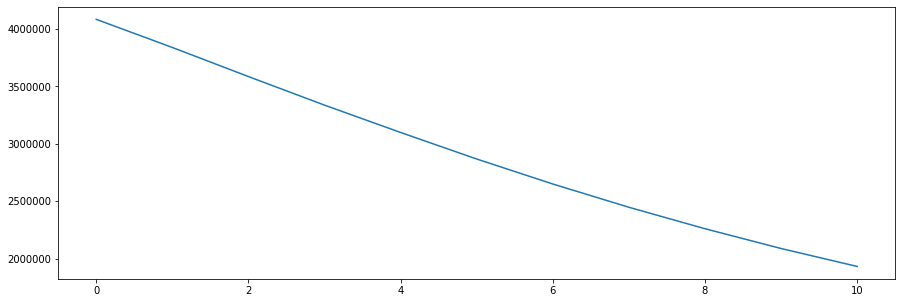

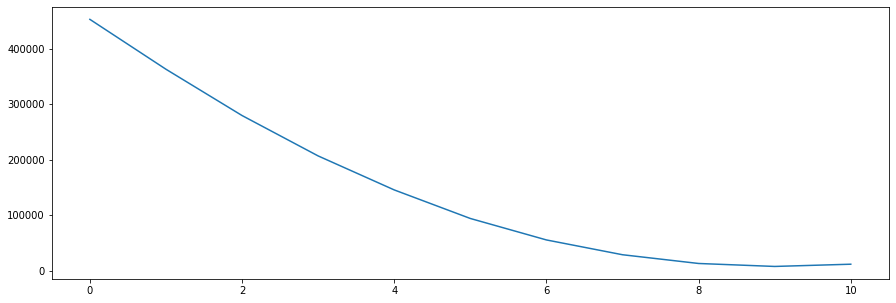

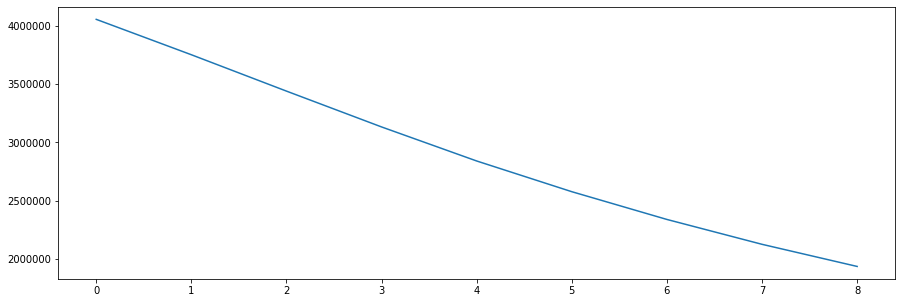

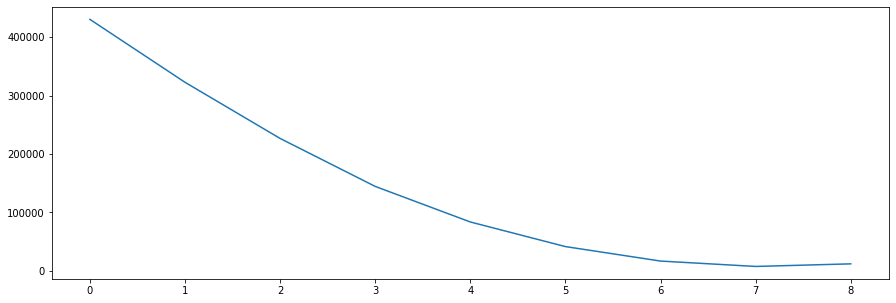

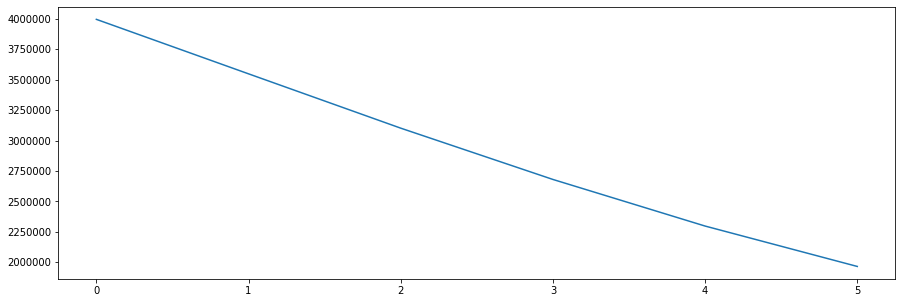

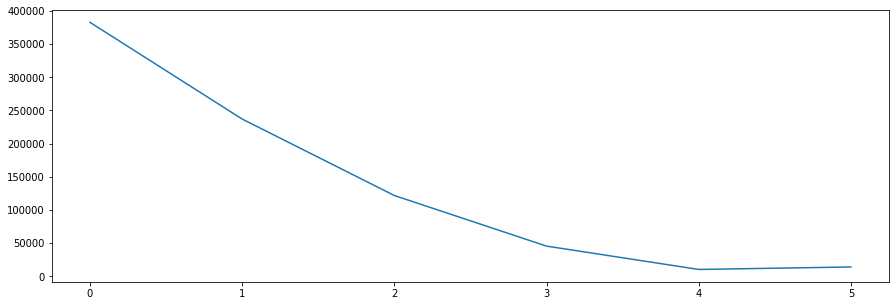

In [31]:
new_model = learn(141, 1500, 550, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(18677502.) tensor(18677502.)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(18240610.) tensor(18240610.)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(17814480.) tensor(17814480.)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(17402678.) tensor(17402678.)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 17162844.0000000000
epoch: 0
tensor(18542338.) tensor(18542338.)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(17697868.) tensor(17697868.)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(16875566.) tensor(16875566.)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(16115247.) tensor(16115247.)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 15687531.0000000000
epoch: 0
tensor(18266910.) tensor(18266910.)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(16569410.) tensor(16569410.)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(14969020.) tensor(14969020.)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(13627488.) tensor(13627488.)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 1295124

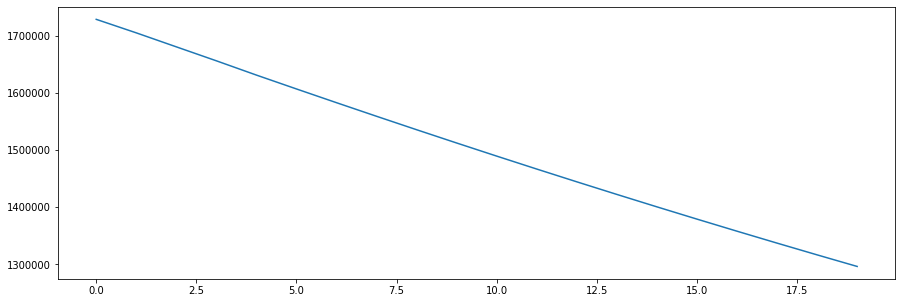

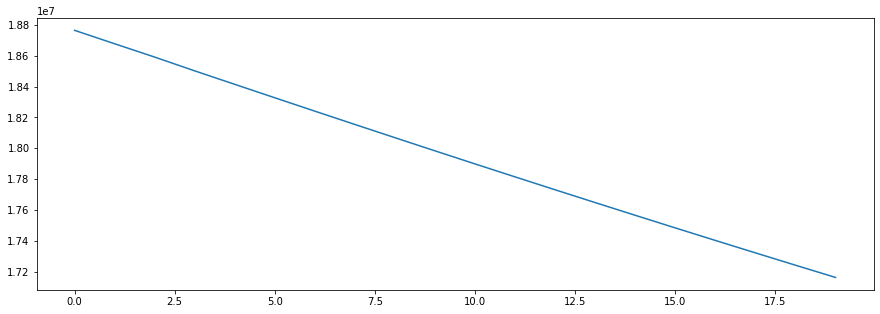

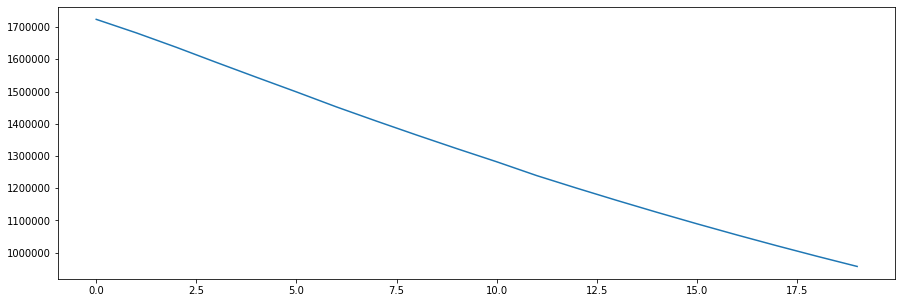

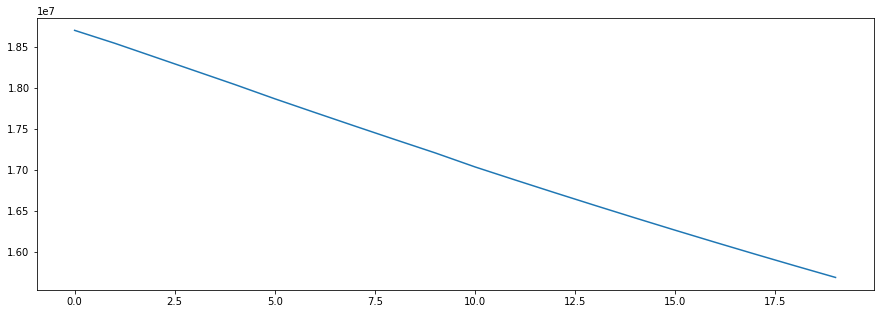

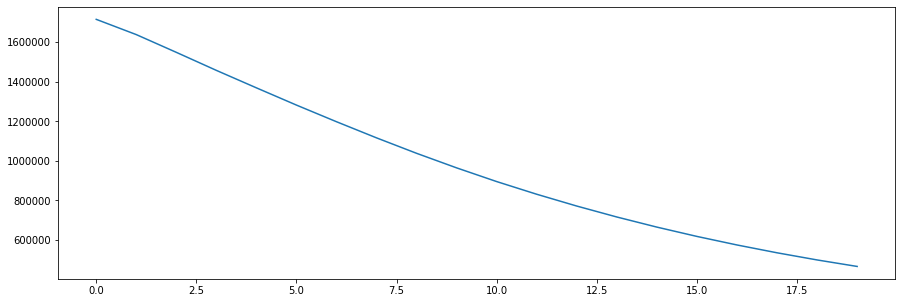

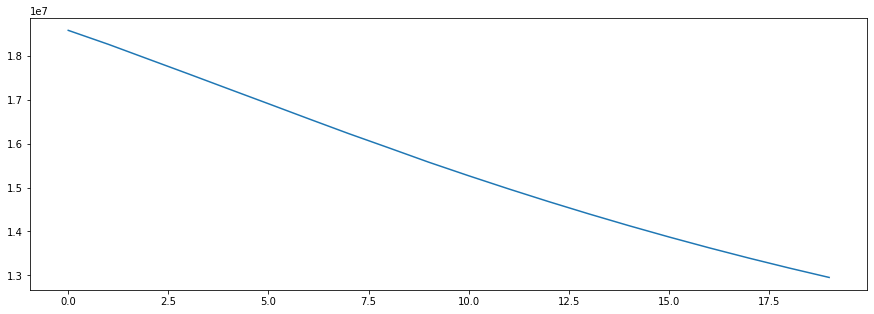

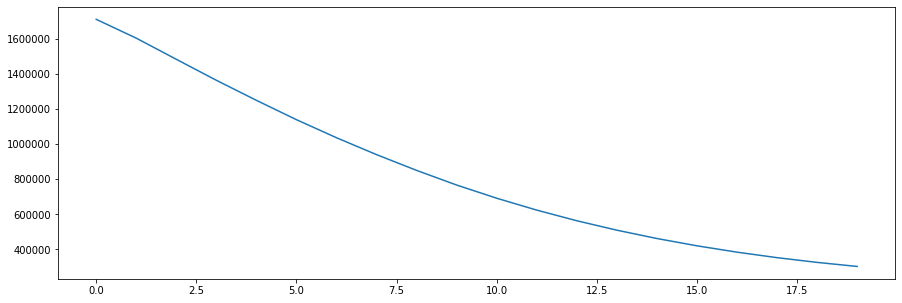

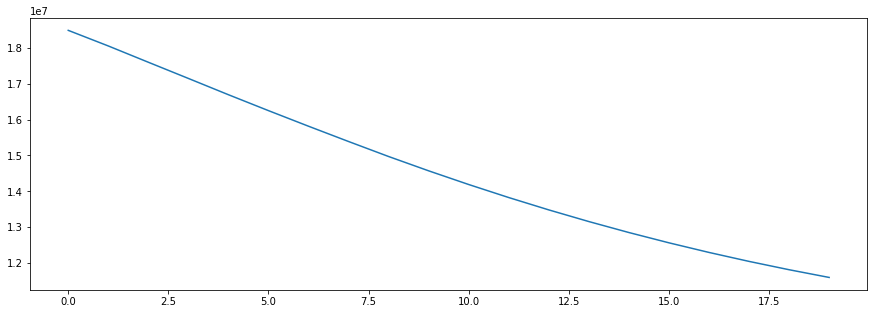

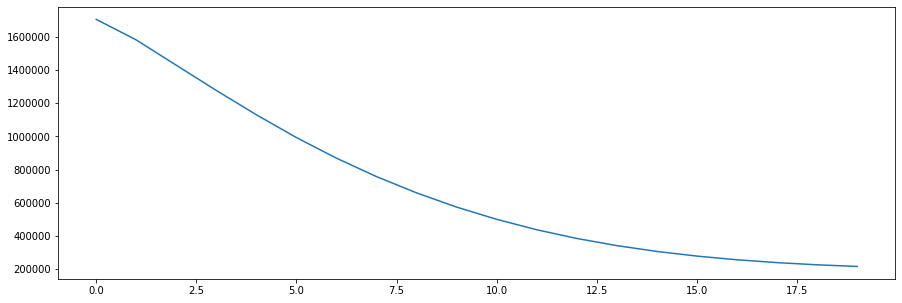

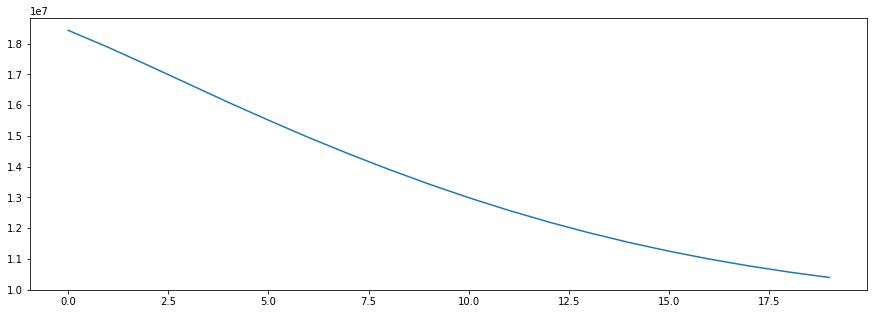

In [32]:
new_model = learn(141, 1500, 600, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(7584248.5000) tensor(7584248.5000)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(7371987.) tensor(7371987.)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(7165139.5000) tensor(7165139.5000)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(6965709.) tensor(6965709.)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 6849757.5000000000
epoch: 0
tensor(7486503.5000) tensor(7486503.5000)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(6973720.) tensor(6973720.)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(6467967.) tensor(6467967.)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(6000061.) tensor(6000061.)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 5748576.0000000000
epoch: 0
tensor(7262235.) tensor(7262235.)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(6209043.5000) tensor(6209043.5000)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(5302997.) tensor(5302997.)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(4596769.) tensor(4596769.)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 4

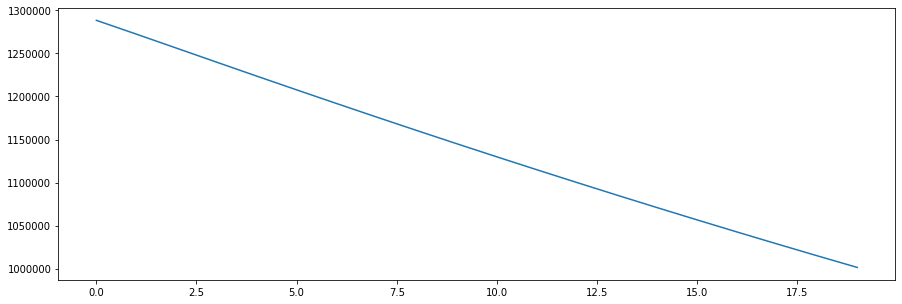

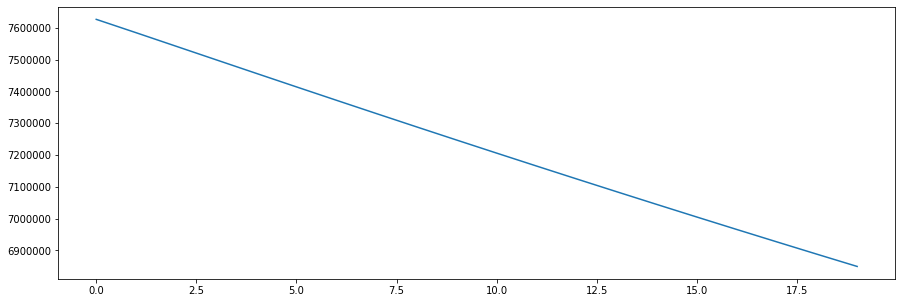

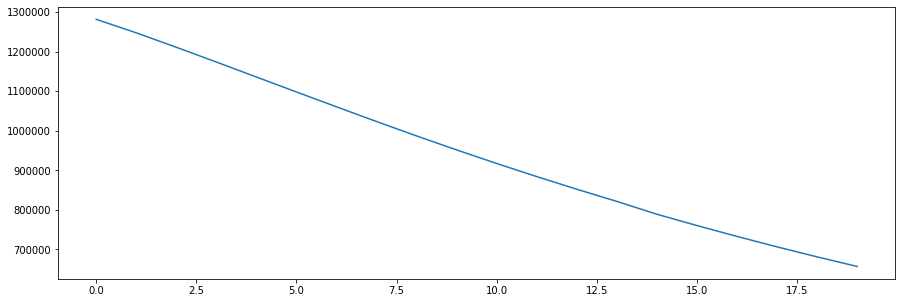

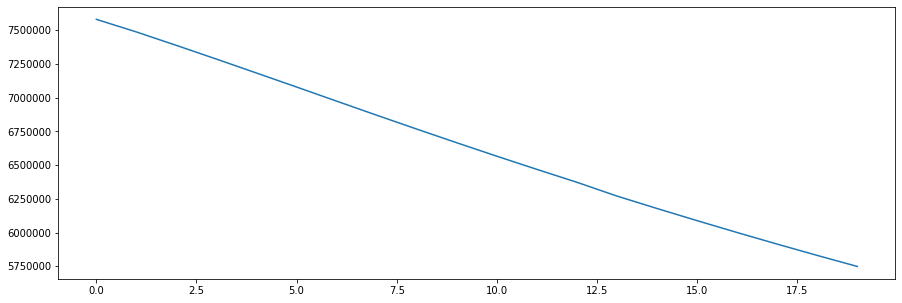

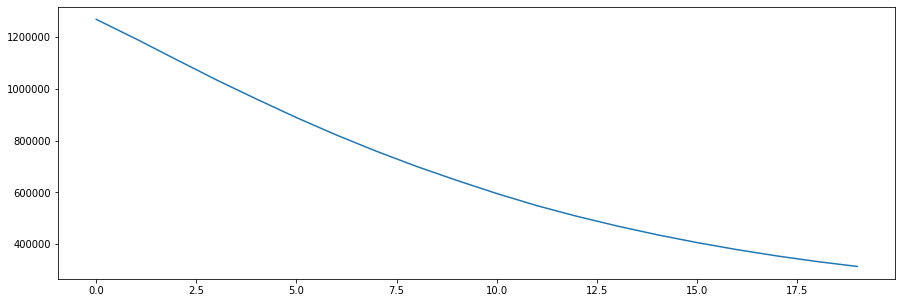

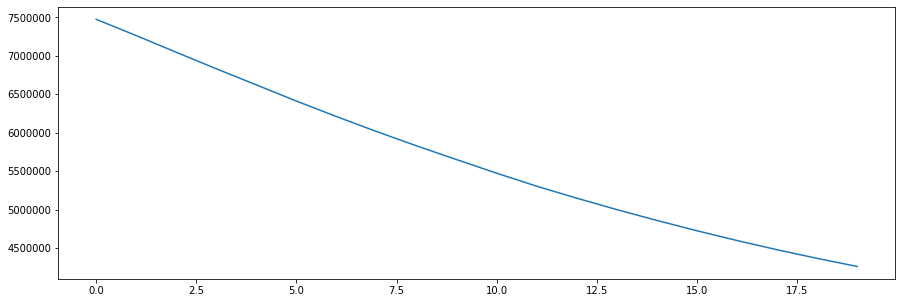

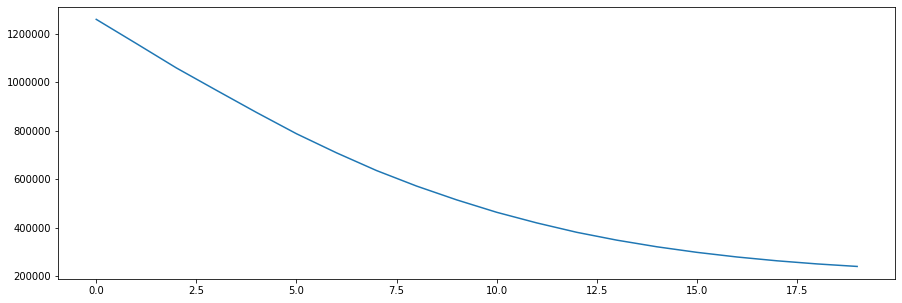

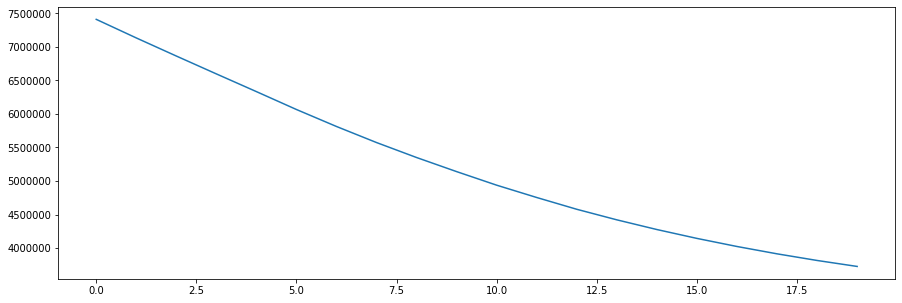

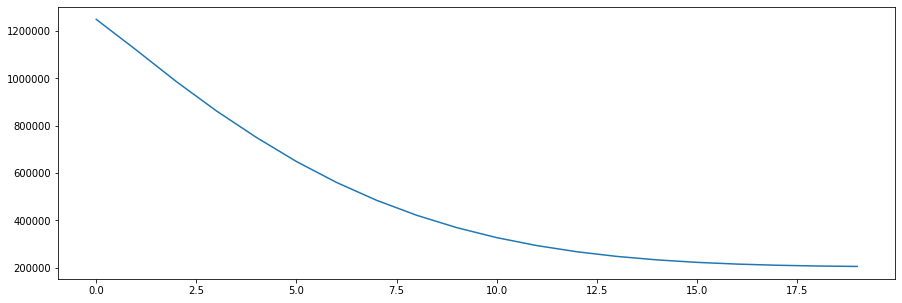

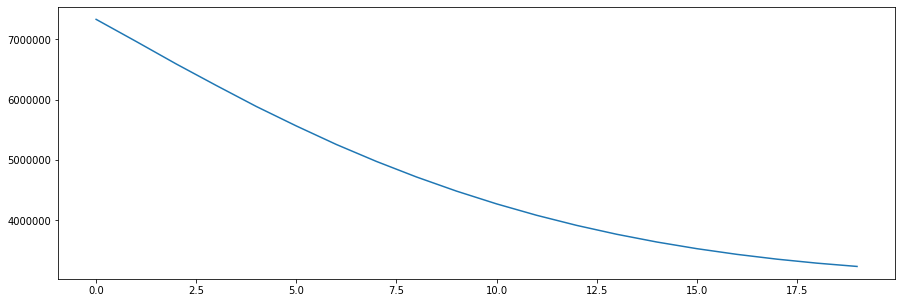

In [33]:
new_model = learn(141, 1500, 650, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(2784968.7500) tensor(2784968.7500)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(2701048.) tensor(2701048.)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(2617659.) tensor(2617659.)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(2535562.7500) tensor(2535562.7500)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 2487010.2500000000
epoch: 0
tensor(2764629.2500) tensor(2764629.2500)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(2628814.7500) tensor(2628814.7500)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(2495491.) tensor(2495491.)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(2362919.5000) tensor(2362919.5000)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 2284829.2500000000
epoch: 0
tensor(2725988.7500) tensor(2725988.7500)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(2469676.2500) tensor(2469676.2500)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(2215789.5000) tensor(2215789.5000)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(1976662.6250) tensor(1976662.6250)
epoch: 1

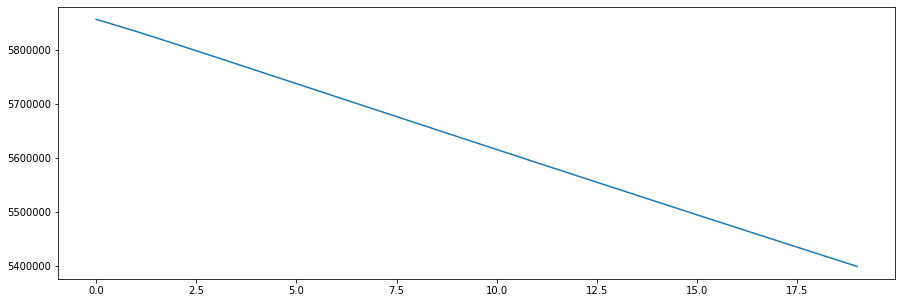

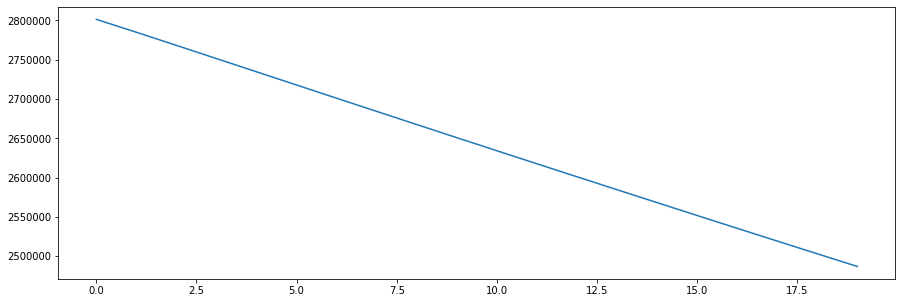

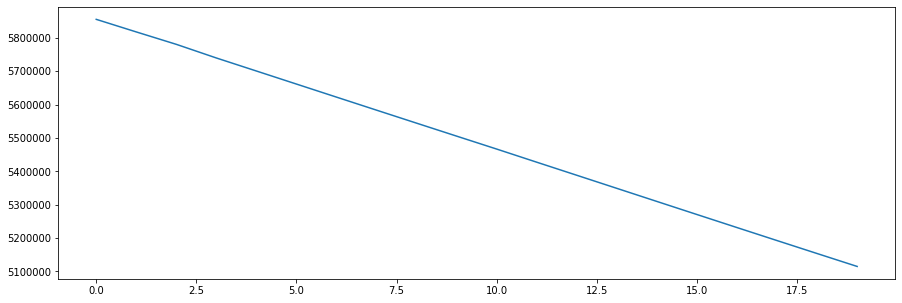

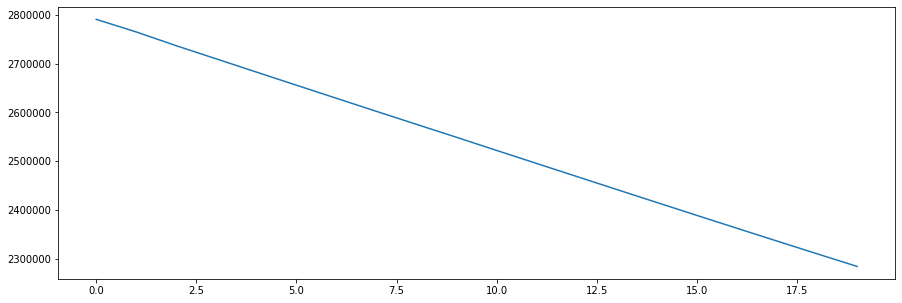

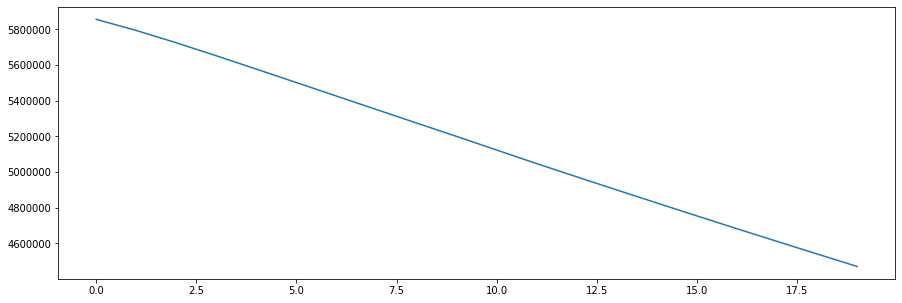

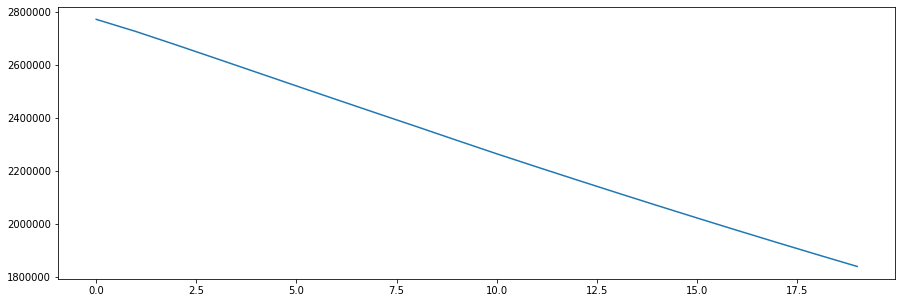

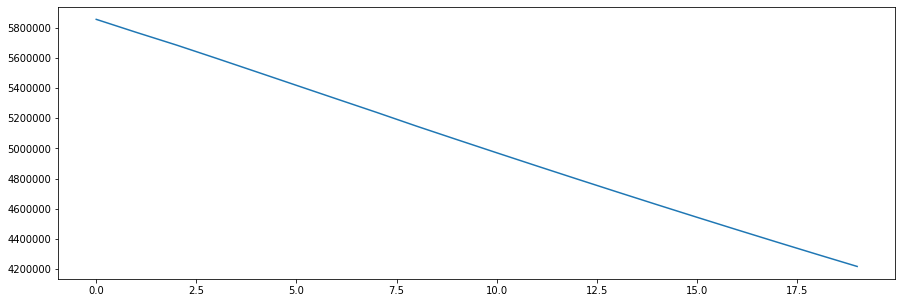

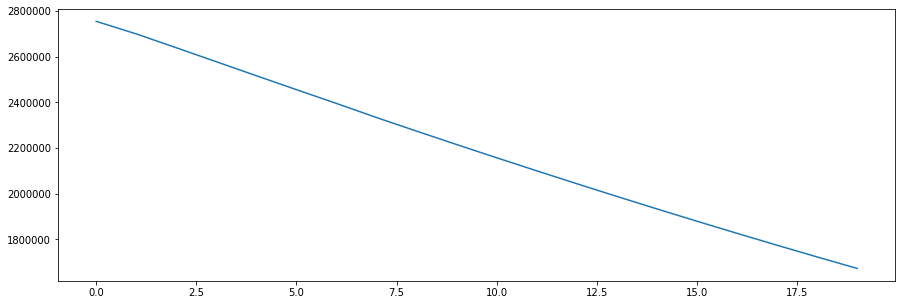

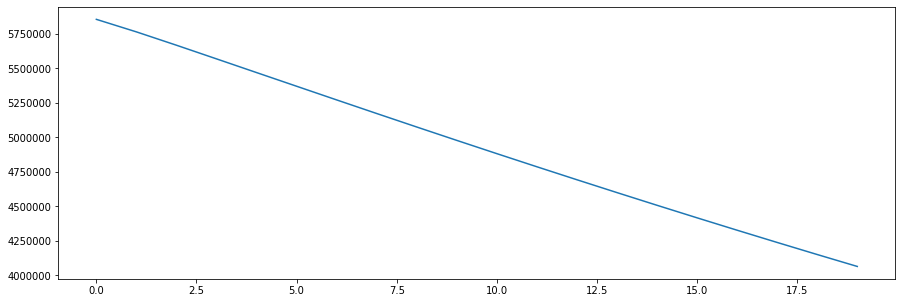

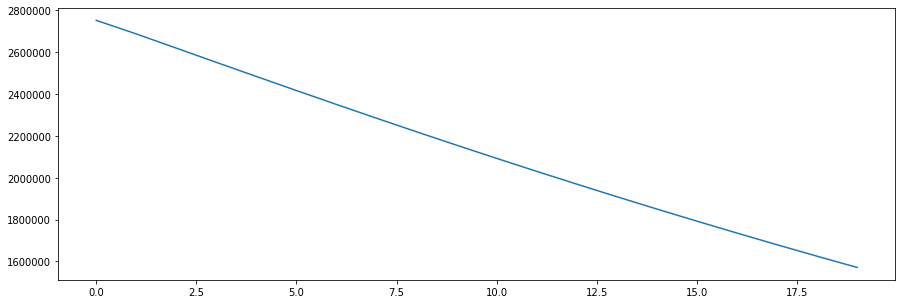

In [35]:
new_model = learn(141, 1500, 700, 0.3)
# evaluate(new_model)

# 2s

In [ ]:
new_model = learn(902, 2000, 50, 0.1)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(286456.5000) tensor(286448.3125)
epoch:   1 loss: 82147.7734375000
tmp best model hidden size: 50
0.7876013582500303
138.9815088485471
epoch: 0
tensor(286233.3750) tensor(285969.7500)
epoch:   1 loss: 78999.8671875000
tmp best model hidden size: 100
0.7728337834368203
137.18877072172356
epoch: 0
tensor(285943.2500) tensor(285943.2500)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(285943.2188) tensor(285943.2188)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(285943.2188) tensor(285943.2188)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(285943.2188) tensor(285943.2188)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 67708.5390625000
tmp best model hidden size: 200
0.7176965306915497
130.72122524840753
epoch: 0
tensor(286206.1875) tensor(286206.1875)
epoch: 2
epoch: 3
epoch: 4


Data is ready
epoch: 0
tensor(228141.6094) tensor(228141.6094)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(227015.7344) tensor(227015.7344)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(226774.8125) tensor(226774.8125)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(226717.3750) tensor(226717.3750)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 19615.3535156250
epoch: 0
tensor(233116.0938) tensor(233110.9688)
epoch:   1 loss: 11180.3105468750
epoch: 0
tensor(223117.) tensor(223117.)
epoch: 2
epoch:   2 loss: 12129.6396484375
epoch: 0
tensor(231571.9844) tensor(231571.9844)
epoch: 2
epoch:   2 loss: 23809.9628906250
epoch: 0
tensor(258303.0156) tensor(244763.4219)
epoch:   1 loss: 406.9002685547
best model hidden size: 300
0.0766827150545092
61.936596838745636


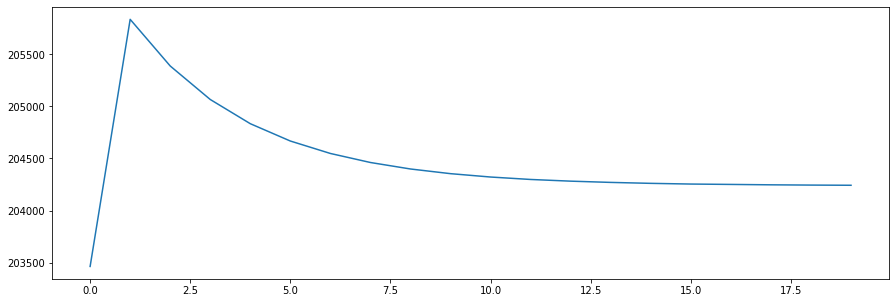

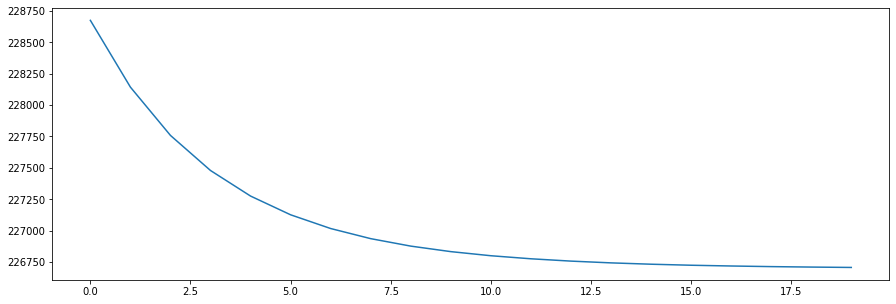

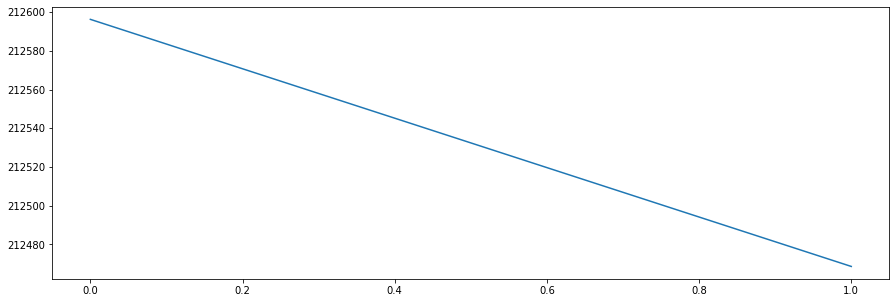

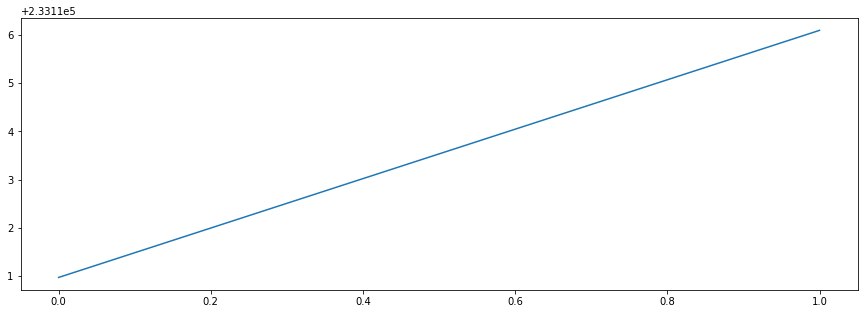

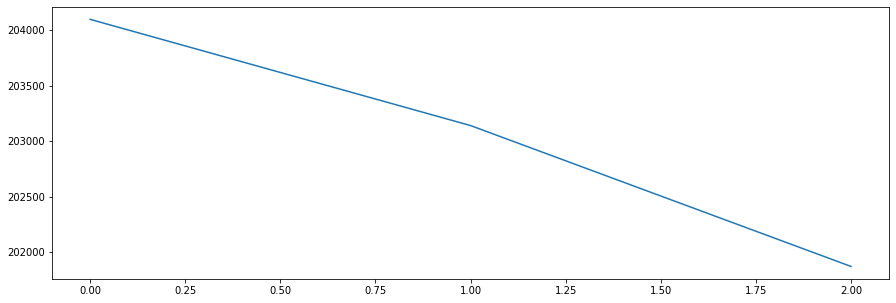

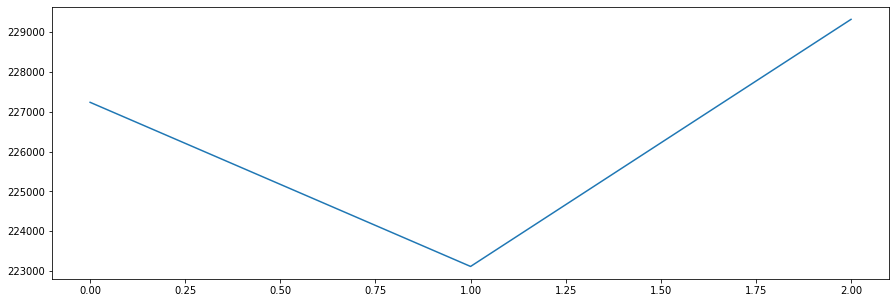

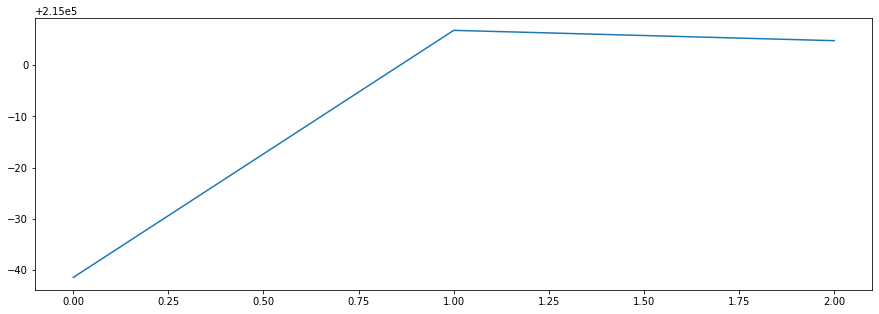

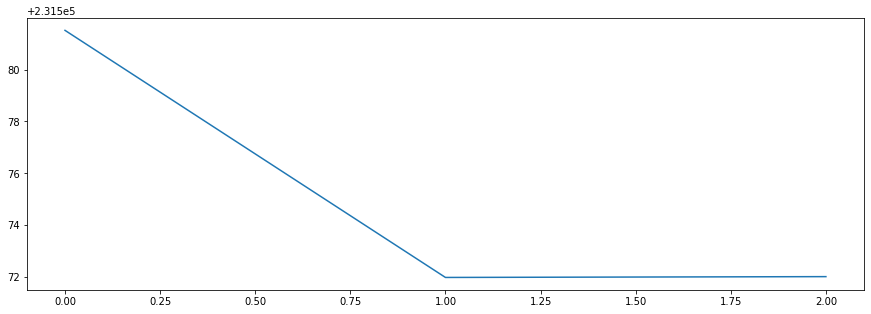

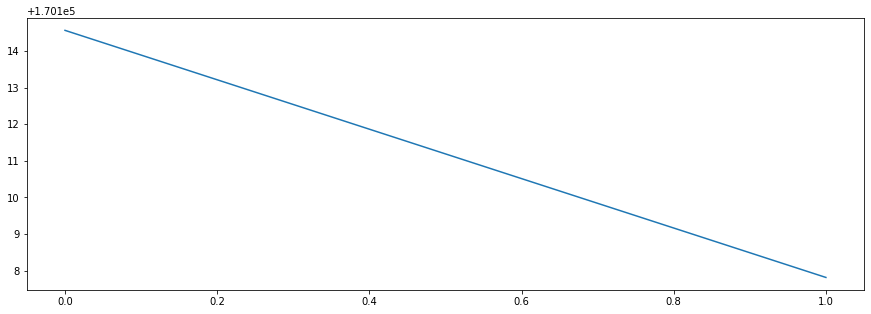

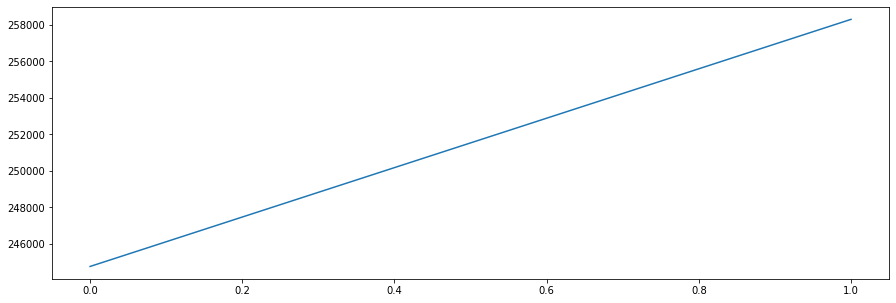

In [8]:
new_model = learn(902, 2000, 100, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(143622.4531) tensor(135423.6250)
epoch:   1 loss: 77.3476562500
tmp best model hidden size: 50
0.044211522088715
37.10456781534513
epoch: 0
tensor(128904.5234) tensor(125736.4141)
epoch:   1 loss: 9599.5341796875
tmp best model hidden size: 100
0.1302820996882041
34.68329669429417
epoch: 0
tensor(130738.6328) tensor(130738.6328)
epoch: 2
epoch:   2 loss: 8606.8613281250
tmp best model hidden size: 200
0.15513273071074532
35.24633060688266
epoch: 0
tensor(44854.2266) tensor(44854.2266)
epoch: 2
epoch: 3
epoch:   3 loss: 8192.8593750000
tmp best model hidden size: 250
0.05466104447227146
18.514269902116055
best model hidden size: 250
0.05466104447227146
18.514269902116055


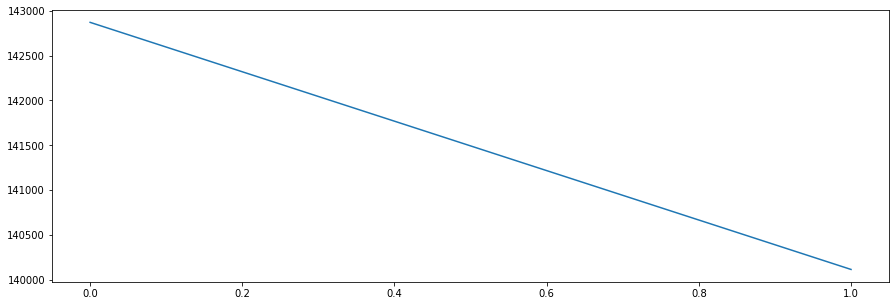

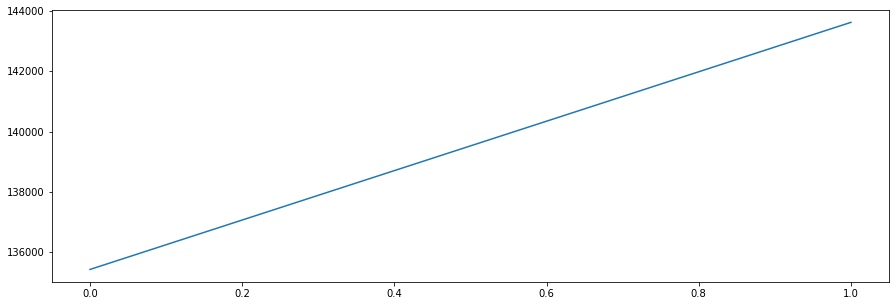

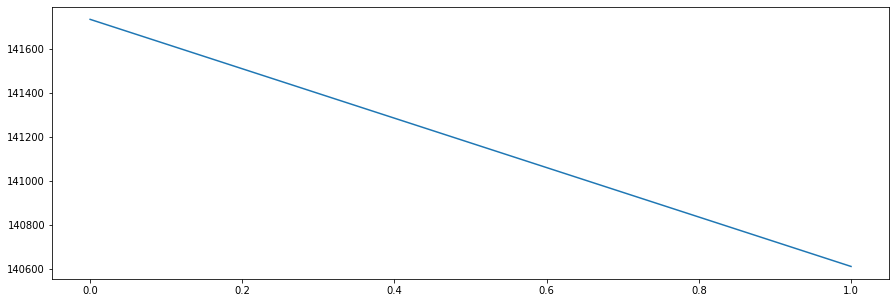

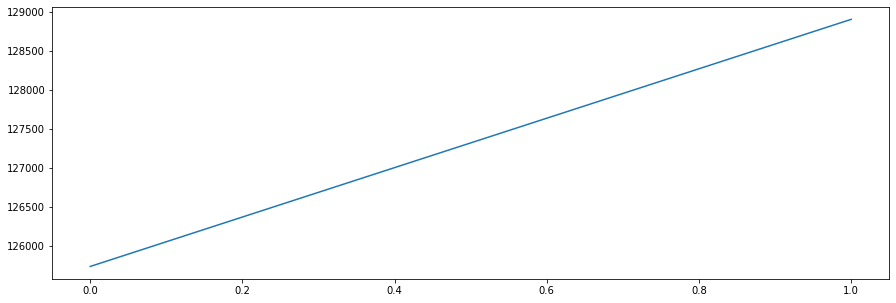

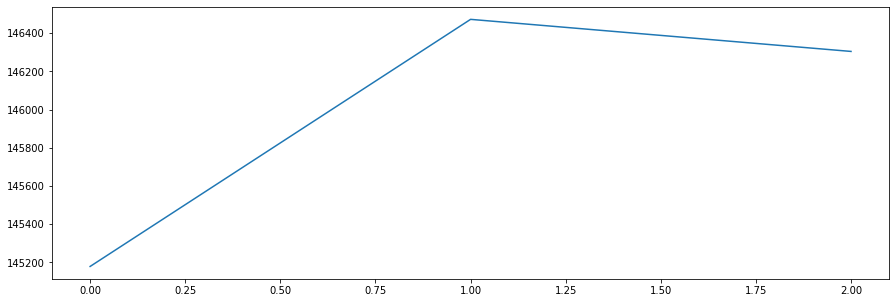

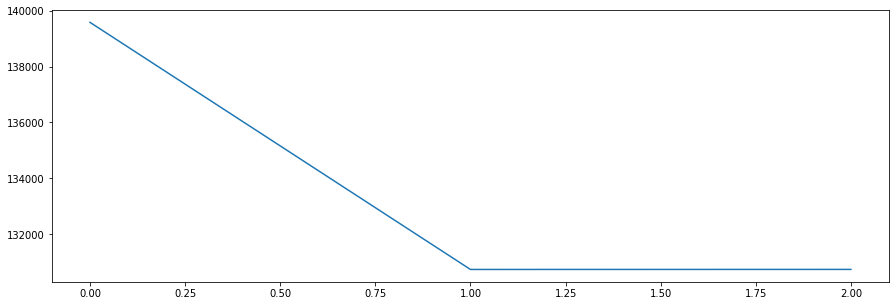

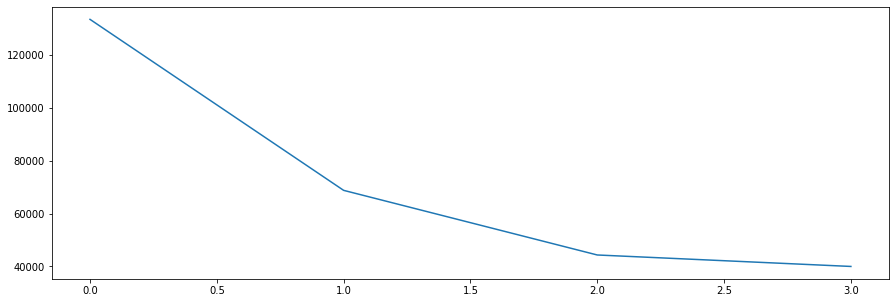

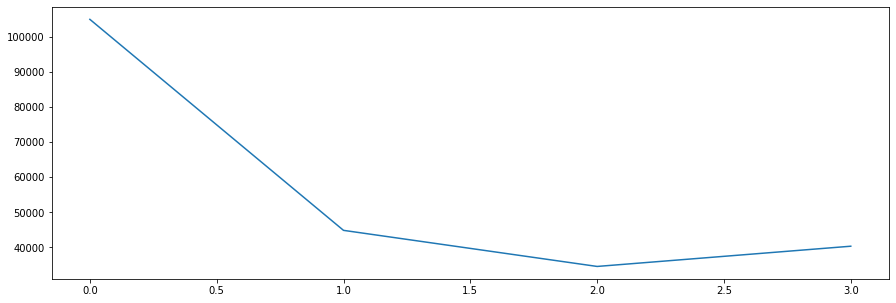

In [7]:
new_model = learn(902, 2000, 150, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(158426.3281) tensor(157609.1250)
epoch:   1 loss: 19229.9414062500
tmp best model hidden size: 50
0.06477417784562532
26.858802393078037
epoch: 0
tensor(161257.8125) tensor(161248.7344)
epoch:   1 loss: 17150.8515625000
tmp best model hidden size: 100
0.11368198456266385
28.302868742748874
epoch: 0
tensor(160808.1094) tensor(160807.8906)
epoch:   1 loss: 21101.7890625000
tmp best model hidden size: 200
0.12285024628626534
29.249747665132908
epoch: 0
tensor(160735.5938) tensor(160735.5938)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
epoch:   5 loss: 23434.5761718750
tmp best model hidden size: 250
0.12795322098275452
29.850983829154178
best model hidden size: 250
0.12795322098275452
29.850983829154178


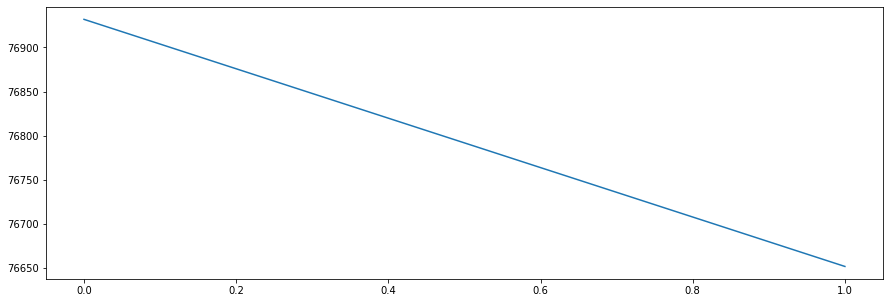

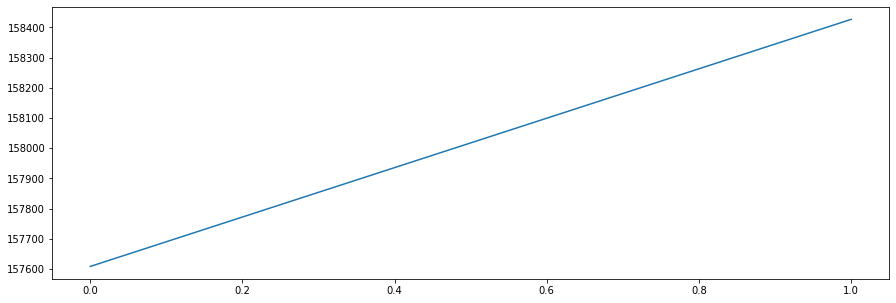

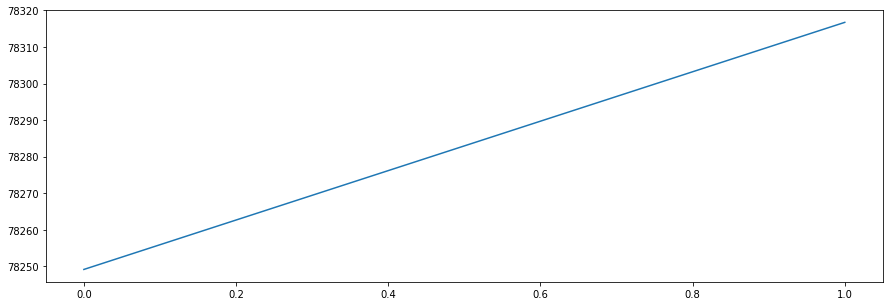

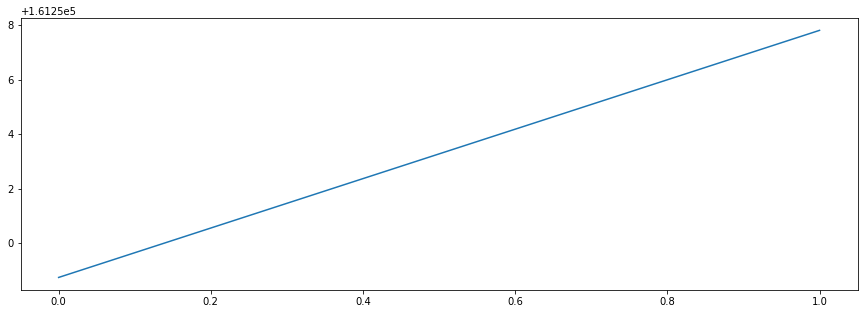

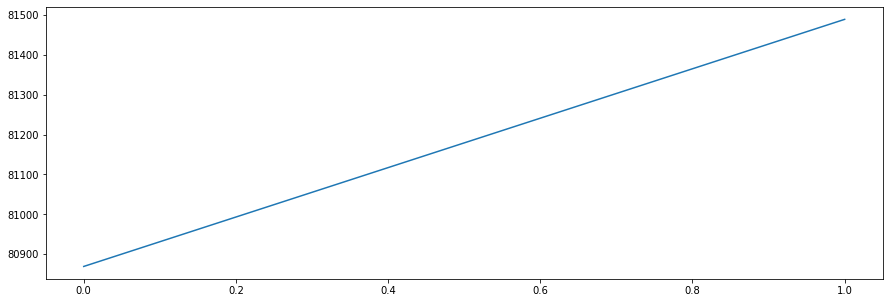

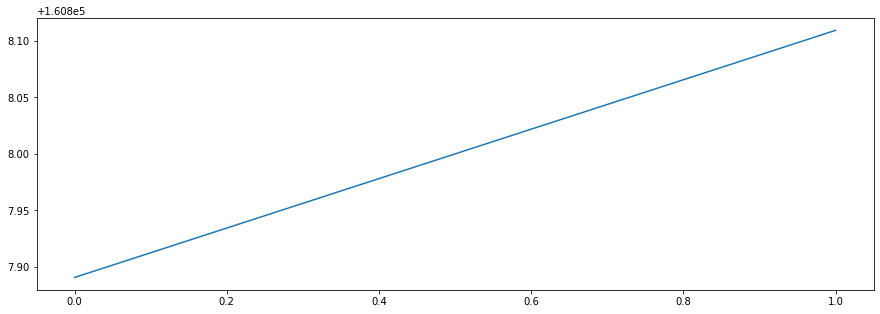

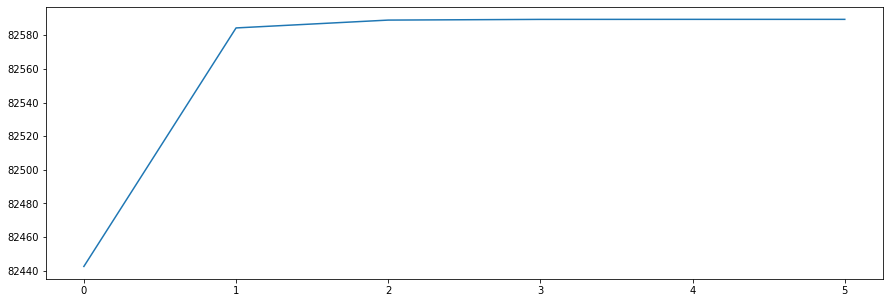

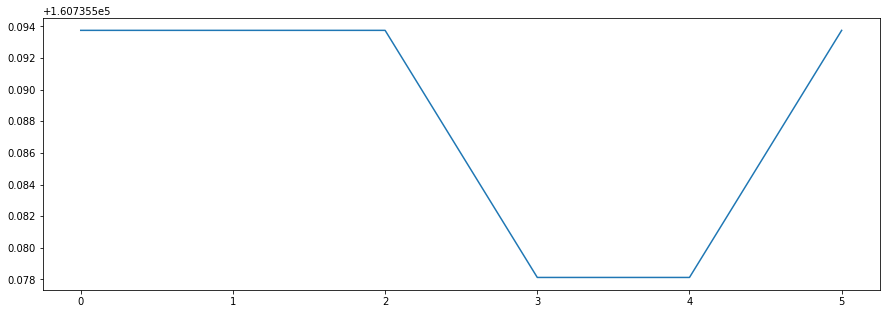

In [11]:
new_model = learn(902, 2000, 200, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(75813.4922) tensor(75813.4922)
epoch: 2
epoch: 3
epoch:   3 loss: 881.6510620117
tmp best model hidden size: 50
0.03493330259933118
21.103013442779506
epoch: 0
tensor(72098.1172) tensor(72098.1172)
epoch: 2
epoch:   2 loss: 2552.4865722656
tmp best model hidden size: 100
0.03131458353389822
21.725193754800085
epoch: 0
tensor(76726.5781) tensor(75005.4922)
epoch:   1 loss: 3675.3486328125
tmp best model hidden size: 200
0.12669893859423217
26.73425301292075
epoch: 0
tensor(70530.2500) tensor(70530.2500)
epoch: 2
epoch: 3
epoch:   3 loss: 6814.5576171875
tmp best model hidden size: 250
0.14078715369424058
29.519096936508337
best model hidden size: 250
0.14078715369424058
29.519096936508337


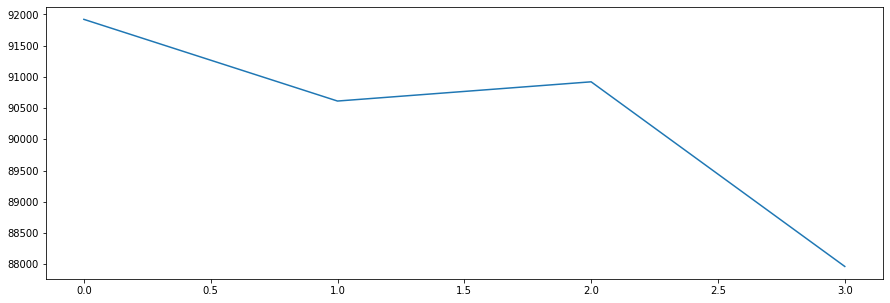

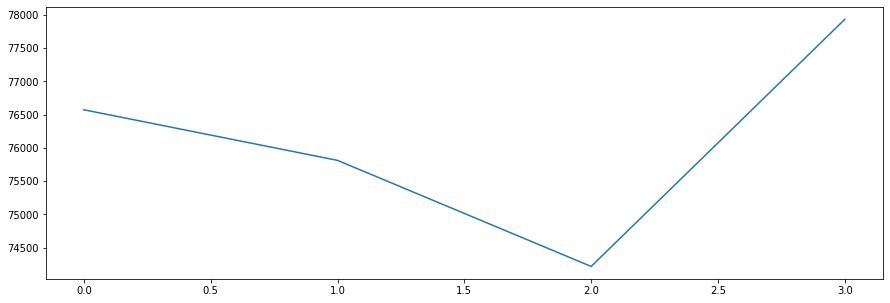

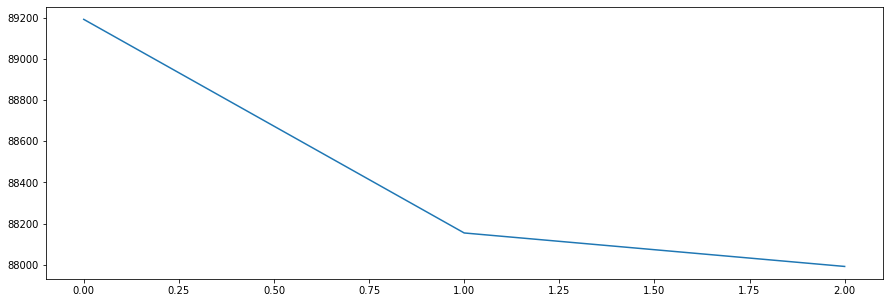

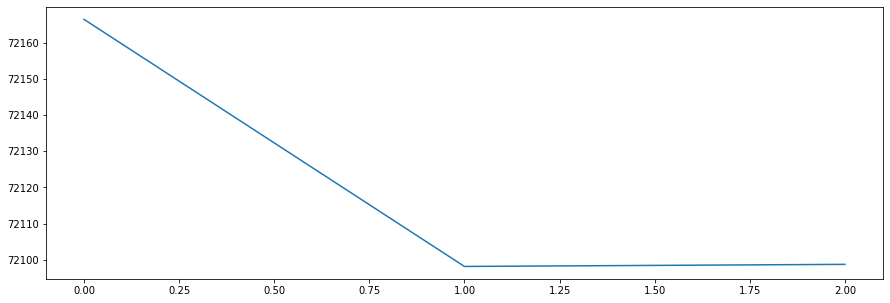

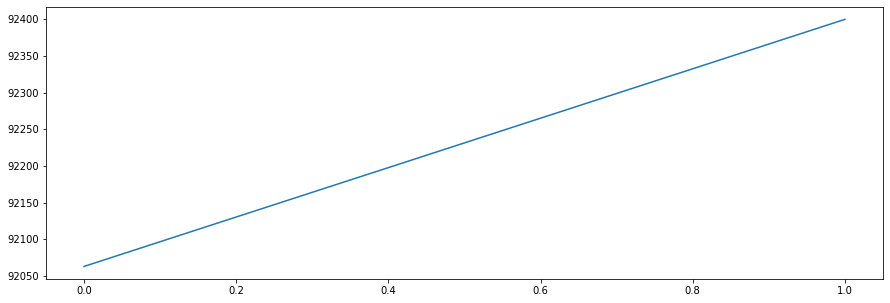

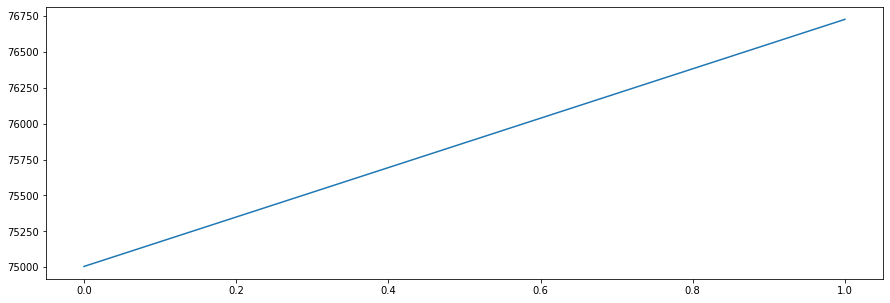

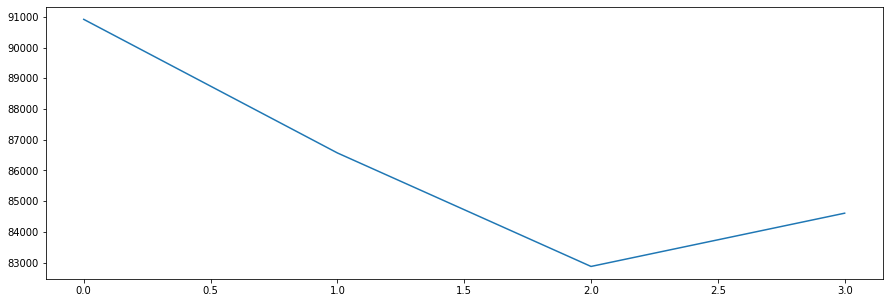

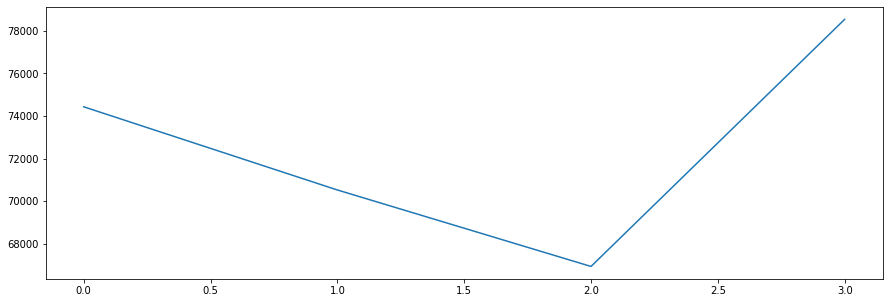

In [10]:
new_model = learn(902, 2000, 250, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(107526.1016) tensor(107526.1016)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
epoch:   5 loss: 291.0914611816
tmp best model hidden size: 50
0.08190816278183746
21.346079662026984
epoch: 0
tensor(108108.3906) tensor(108108.3906)
epoch: 2
epoch: 3
epoch:   3 loss: 220.5932922363
tmp best model hidden size: 100
0.08798639299107046
22.666797641989685
epoch: 0
tensor(110560.5781) tensor(108983.6484)
epoch:   1 loss: 1212.7990722656
tmp best model hidden size: 200
0.09884722504622741
25.791791399653523
epoch: 0
tensor(108145.2188) tensor(105946.5078)
epoch:   1 loss: 893.7479248047
tmp best model hidden size: 250
0.07972268285006798
24.167916655183458
best model hidden size: 250
0.07972268285006798
24.167916655183458


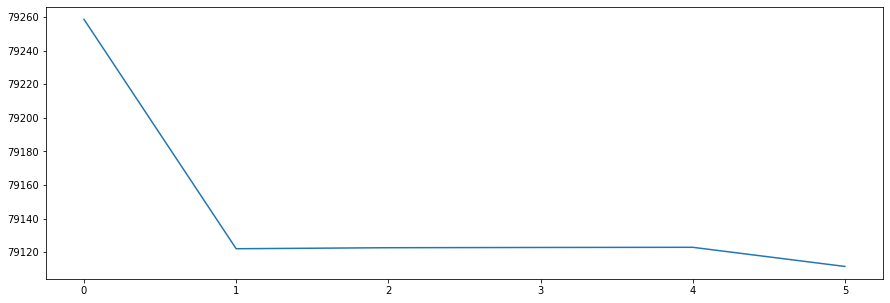

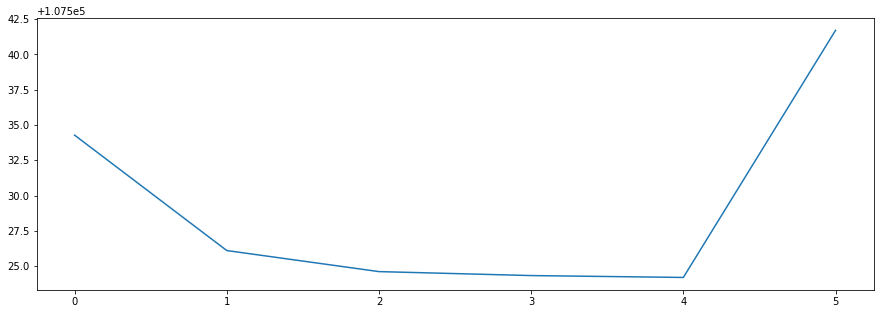

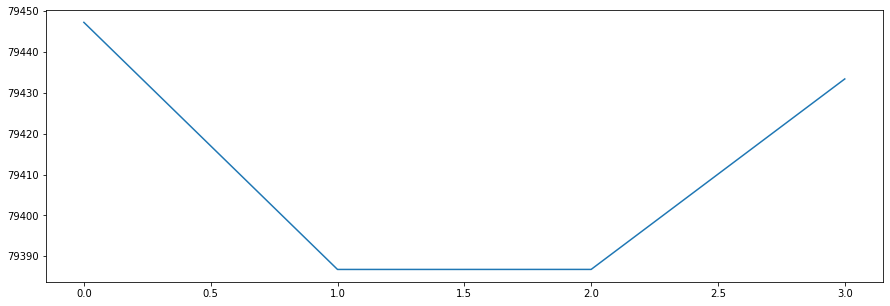

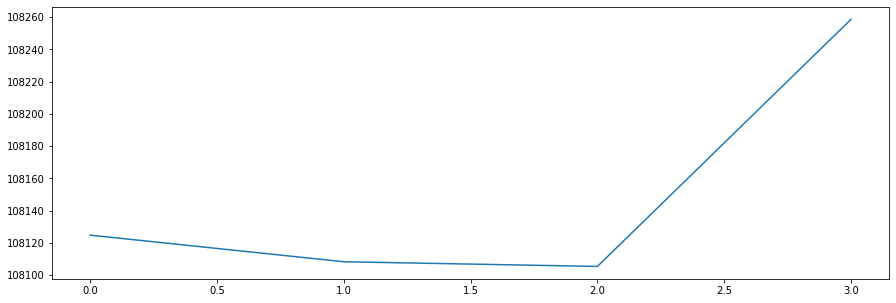

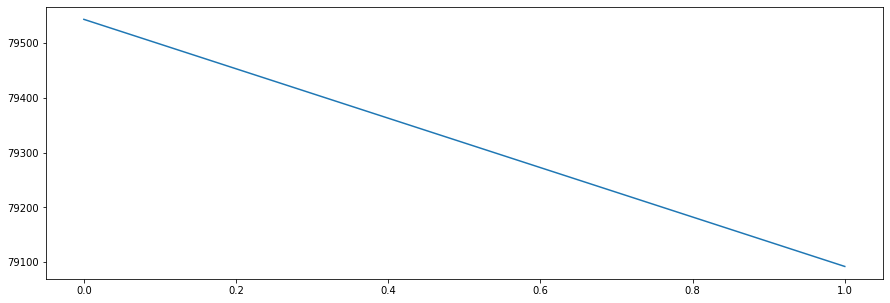

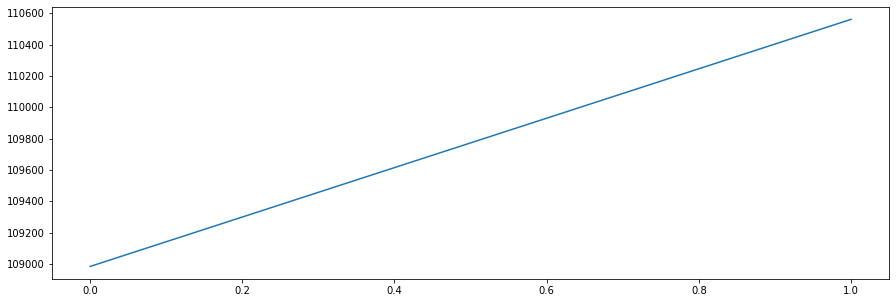

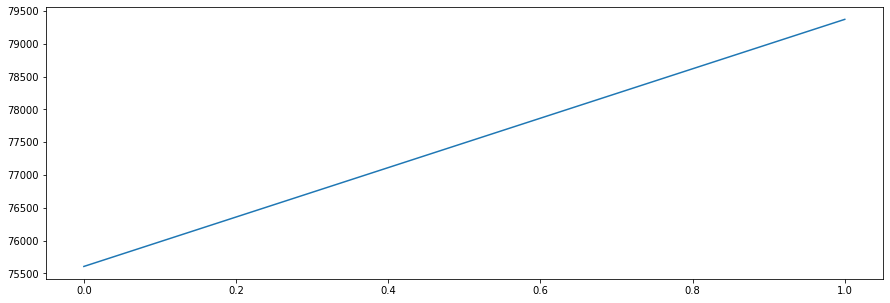

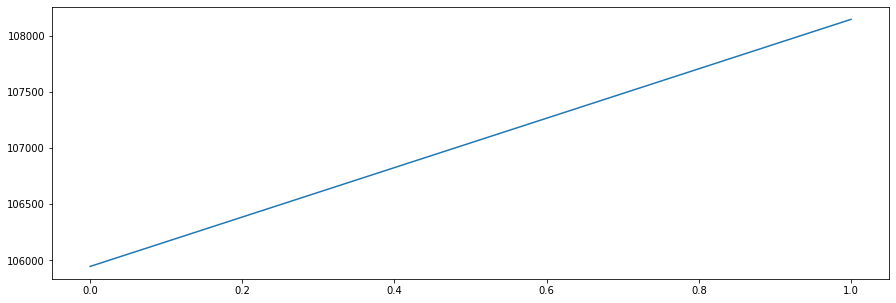

In [9]:
new_model = learn(902, 2000, 300, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(53819.1094) tensor(53813.1602)
epoch:   1 loss: 1017.1127319336
epoch: 0
tensor(53738.9492) tensor(53734.5977)
epoch:   1 loss: 937.8368530273
epoch: 0
tensor(53983.1953) tensor(53980.2656)
epoch:   1 loss: 1211.1212158203
epoch: 0
tensor(54692.1406) tensor(54667.6719)
epoch:   1 loss: 1978.3524169922
best model hidden size: 250
0.08998779807278565
21.416157672715904


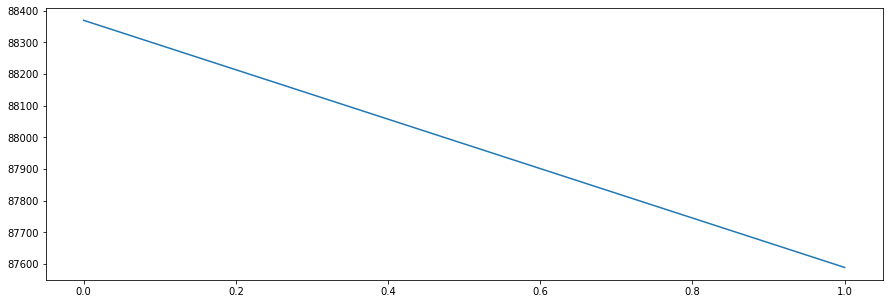

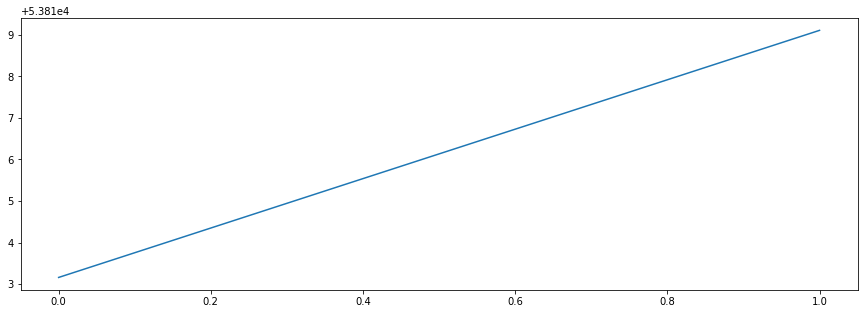

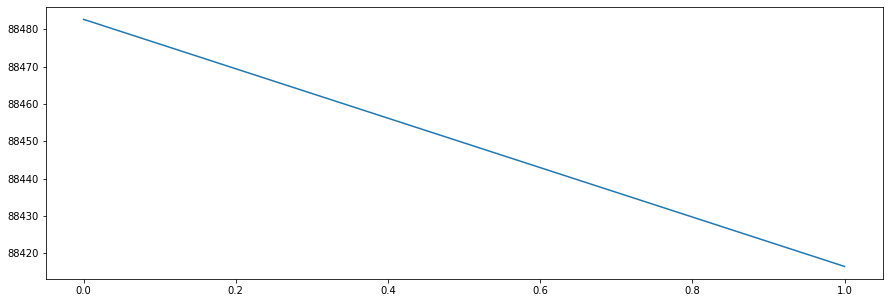

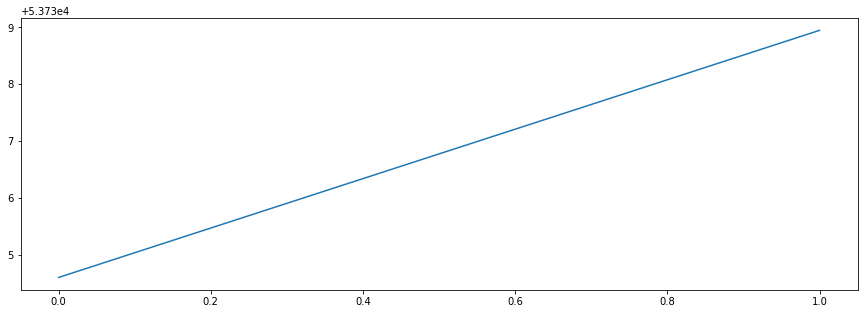

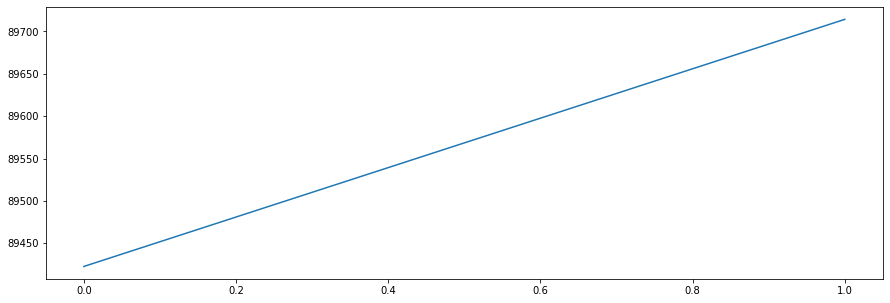

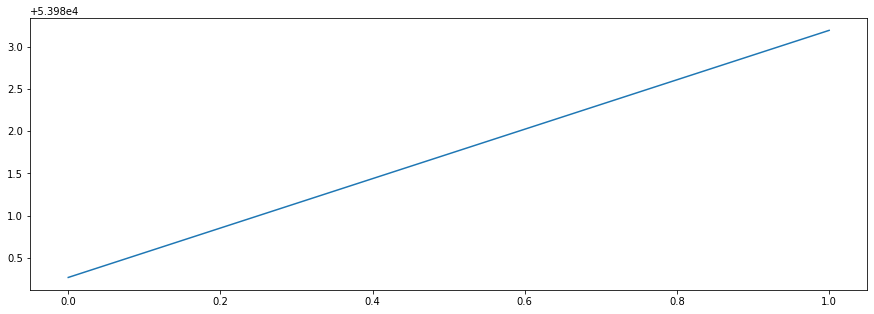

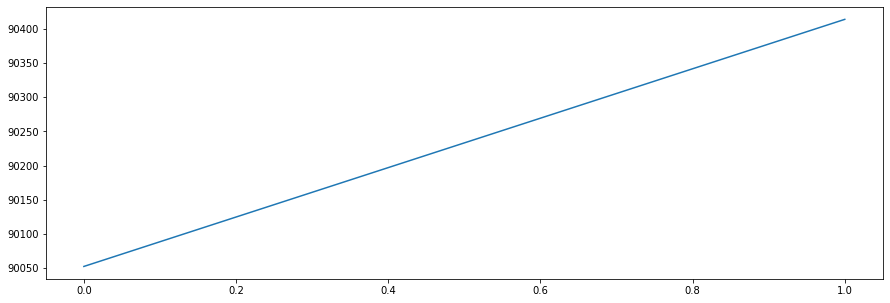

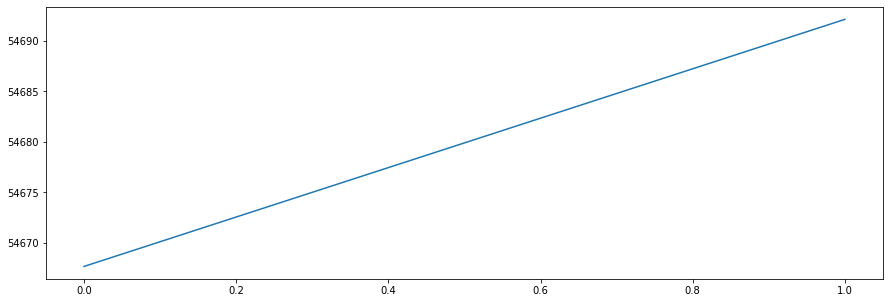

In [9]:
new_model = learn(902, 2000, 350, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(45121.9531) tensor(45121.9531)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(45082.5469) tensor(45082.5469)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
epoch:  10 loss: 10618.6796875000
epoch: 0
tensor(46377.6016) tensor(45275.8672)
epoch:   1 loss: 10933.5302734375
epoch: 0
tensor(48225.9297) tensor(48225.9297)
epoch: 2
epoch: 3
epoch:   3 loss: 11133.6318359375
epoch: 0
tensor(48364.0820) tensor(48226.3164)
epoch:   1 loss: 12866.6191406250
best model hidden size: 250
0.061581432156953636
25.19682670718578


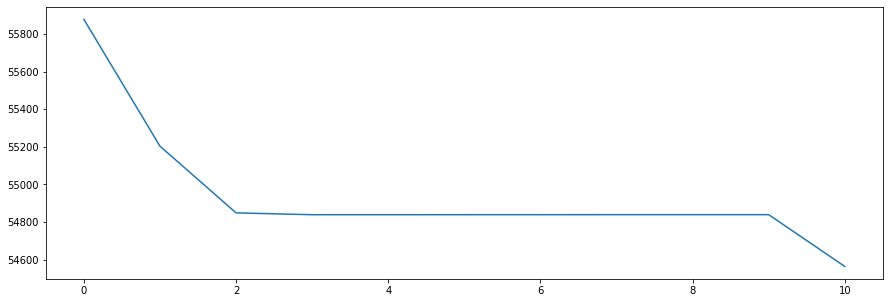

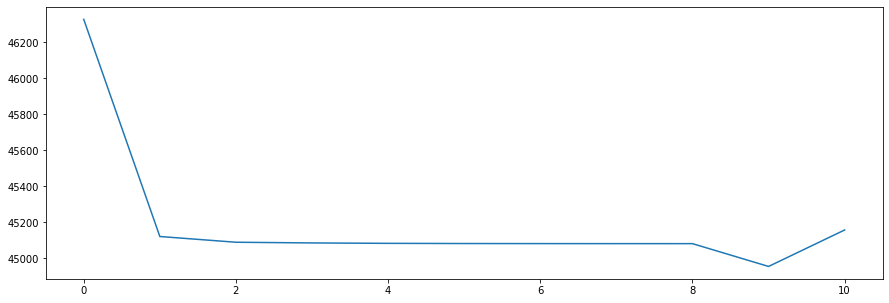

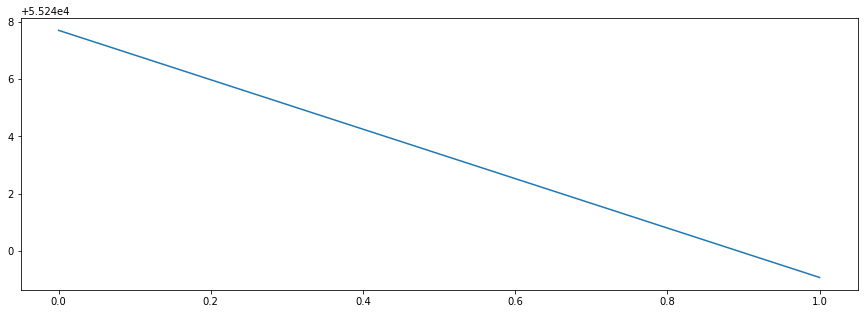

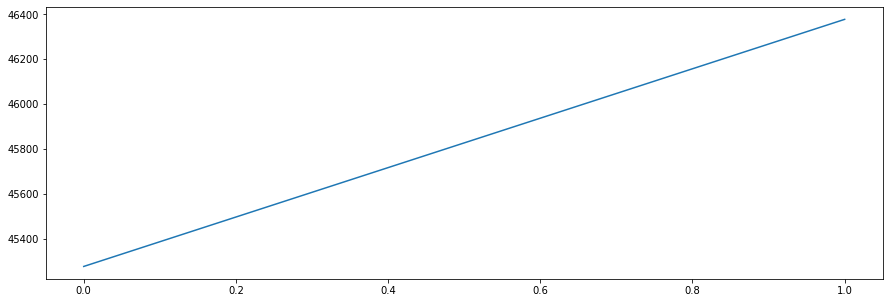

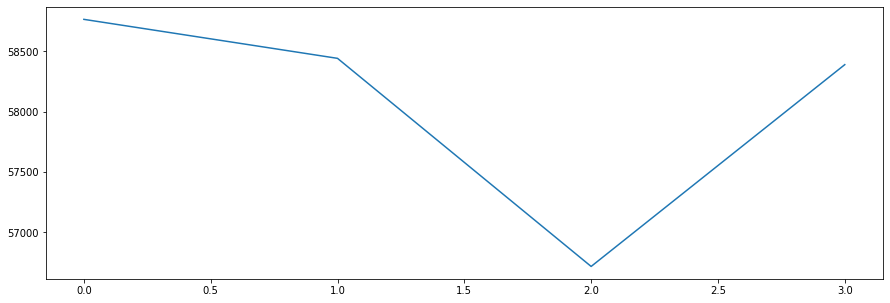

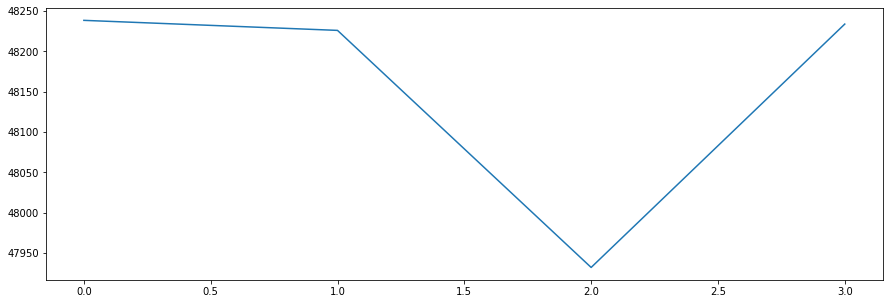

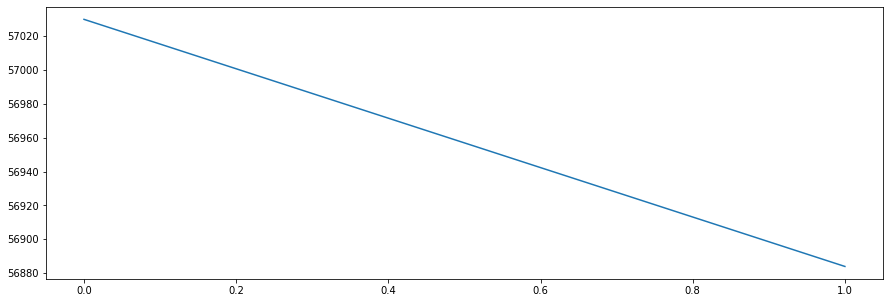

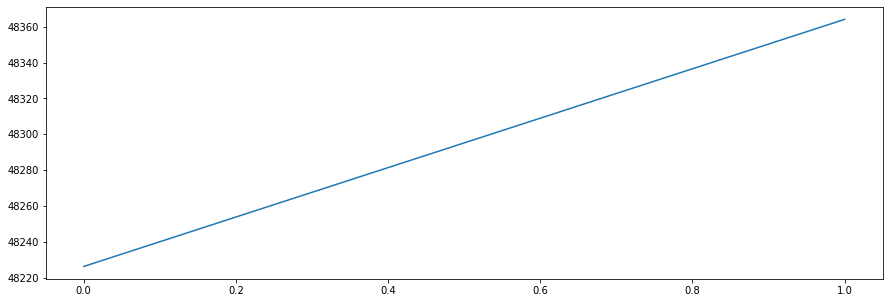

In [7]:
new_model = learn(902, 2000, 400, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(69331.2500) tensor(67765.8594)
epoch:   1 loss: 16159.4677734375
epoch: 0
tensor(69236.6250) tensor(69236.6250)
epoch: 2
epoch:   2 loss: 7013.6293945312
epoch: 0
tensor(72496.7109) tensor(72355.0781)
epoch:   1 loss: 5580.2651367188
epoch: 0
tensor(73451.4922) tensor(73432.4531)
epoch:   1 loss: 4482.1357421875
best model hidden size: 250
0.03469352611835254
15.32765323959388


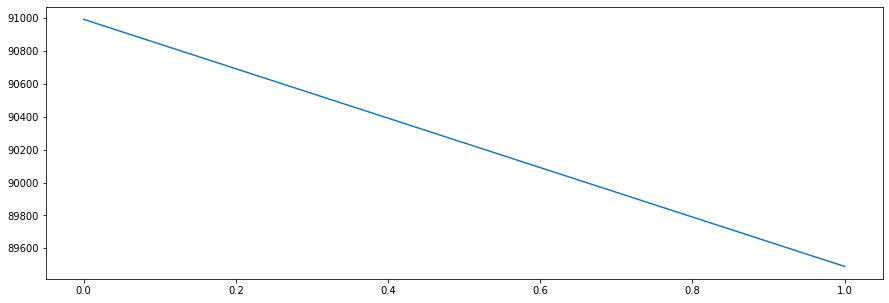

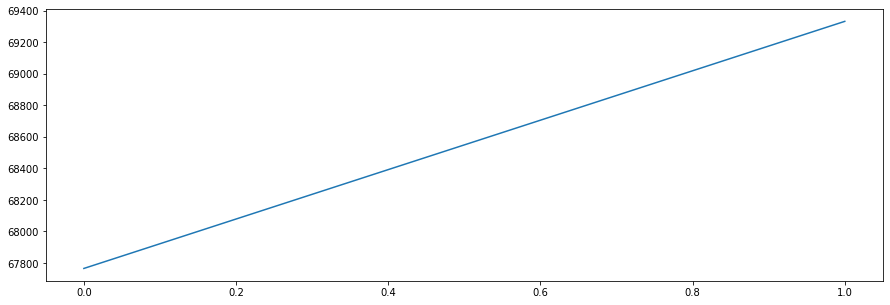

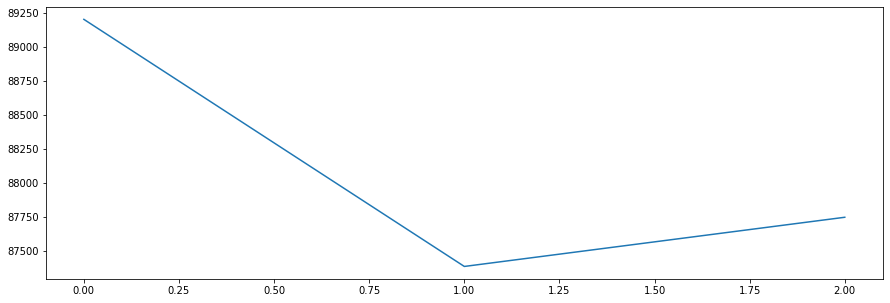

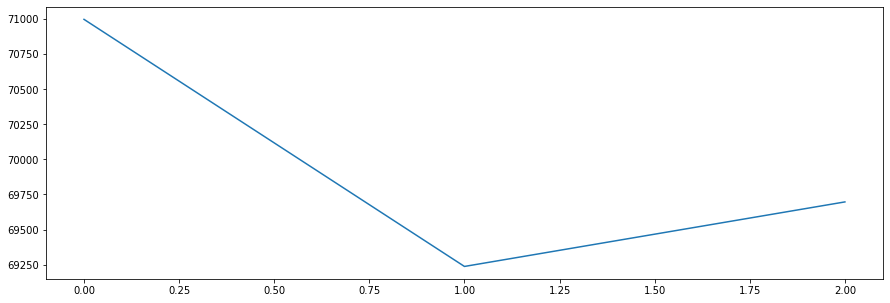

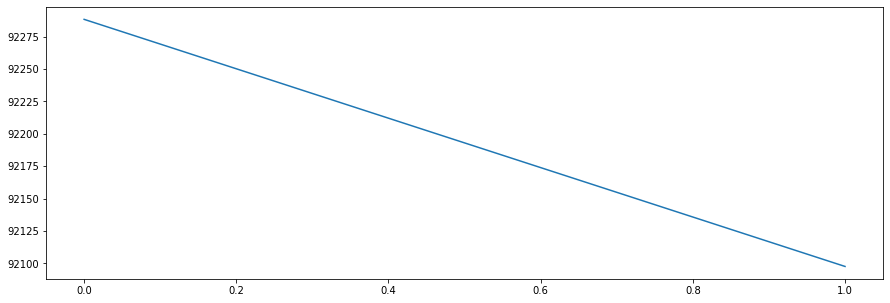

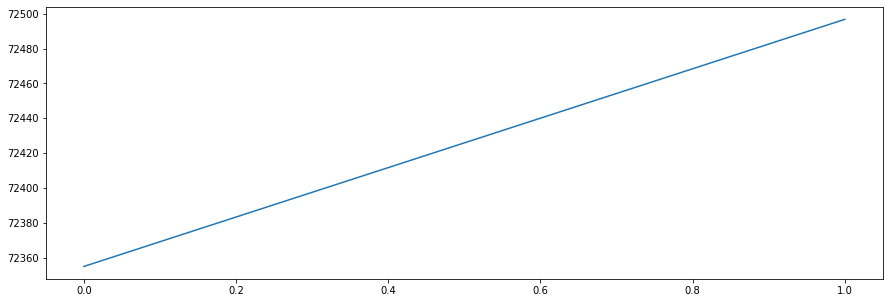

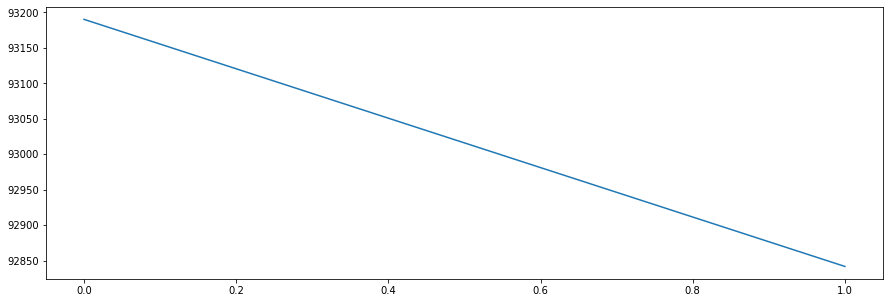

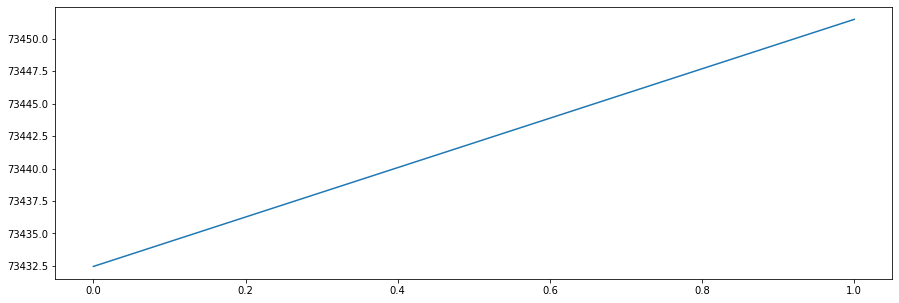

In [8]:
new_model = learn(902, 2000, 450, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(67094.9062) tensor(67094.9062)
epoch: 2
epoch:   2 loss: 3183962.5000000000
epoch: 0
tensor(67493.3359) tensor(67493.3359)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(67490.5391) tensor(67490.5391)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(67490.4609) tensor(67490.4609)
epoch: 12
epoch: 13
epoch: 14
epoch:  14 loss: 3168790.2500000000
epoch: 0
tensor(69485.0938) tensor(69485.0938)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(69479.5781) tensor(69479.5781)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(69479.4219) tensor(69479.4219)
epoch: 12
epoch: 13
epoch: 14
epoch:  14 loss: 3106022.7500000000
epoch: 0
tensor(70281.9922) tensor(70281.9922)
epoch: 2
epoch: 3
epoch: 4
epoch:   4 loss: 3088023.7500000000
best model hidden size: 250
0.04982274204538301
21.29178757036194


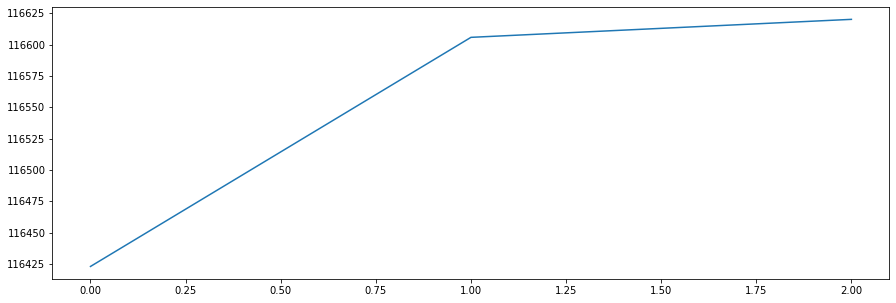

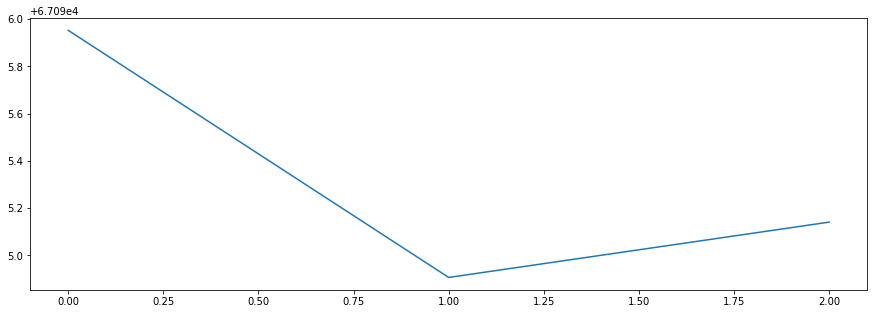

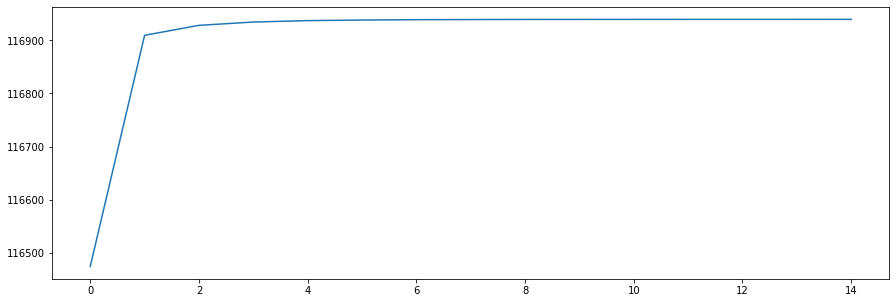

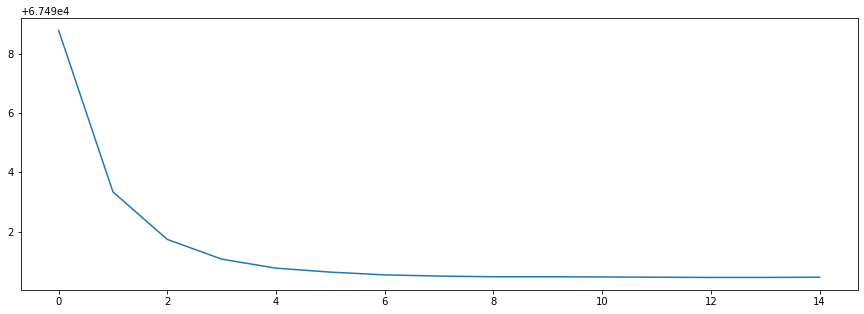

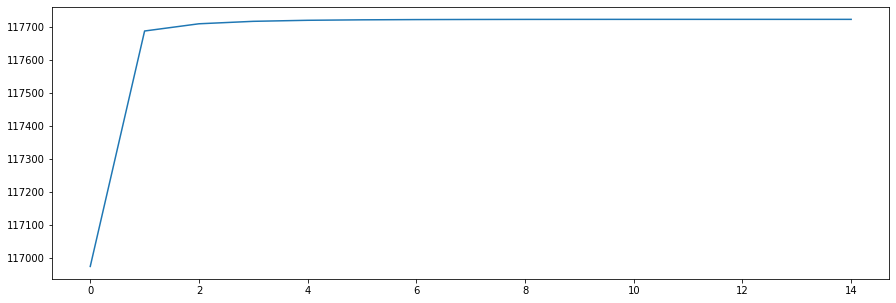

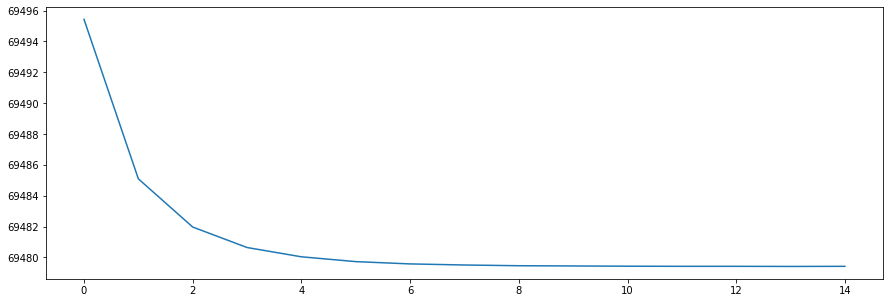

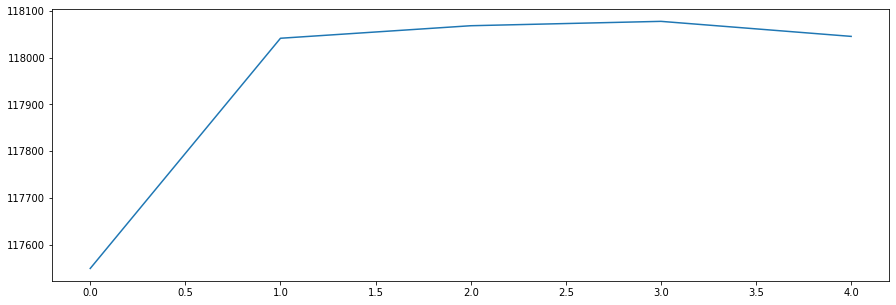

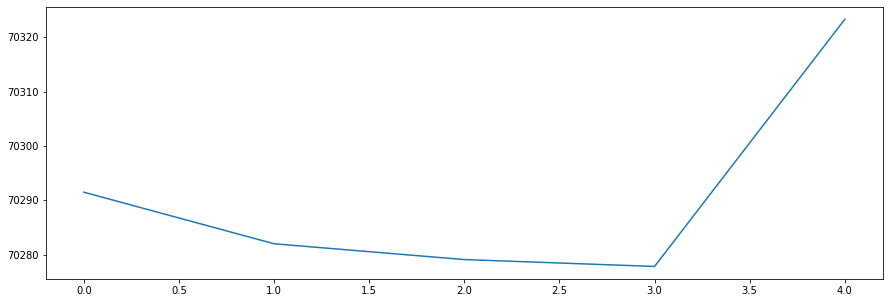

In [7]:
new_model = learn(902, 2000, 500, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(66973.6250) tensor(66973.6250)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(65684.3438) tensor(65684.3438)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(65659.0078) tensor(65658.7344)
epoch:  11 loss: 2261.6386718750
tmp best model hidden size: 50
0.013170652652658554
17.84776760405712
epoch: 0
tensor(70060.0781) tensor(70052.5547)
epoch:   1 loss: 7773.4052734375
tmp best model hidden size: 100
0.03360540850306503
18.346007425556504
epoch: 0
tensor(73622.6875) tensor(73622.6875)
epoch: 2
epoch:   2 loss: 15380.6630859375
tmp best model hidden size: 200
0.02704611542839667
19.200514035083323
epoch: 0
tensor(70132.8828) tensor(70132.8828)
epoch: 2
epoch: 3
epoch:   3 loss: 7888.0180664062
tmp best model hidden size: 250
0.033455306859915046
18.343995676000638
best model hidden size: 250
0.033455306859915046
18.343995676000638


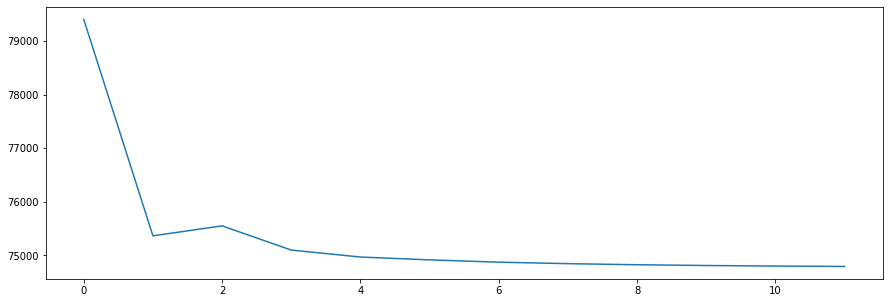

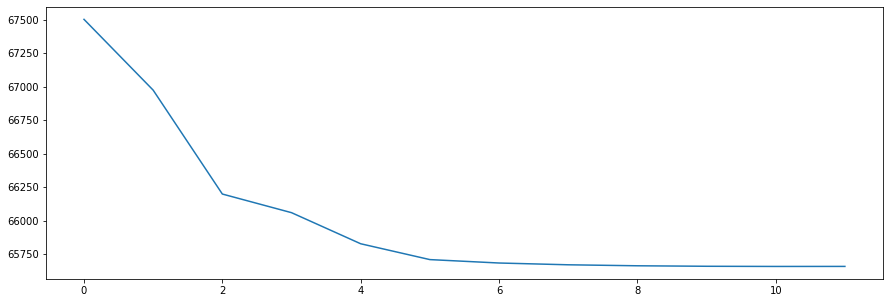

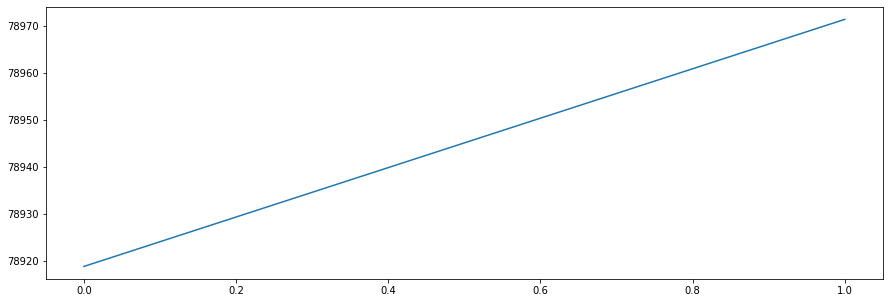

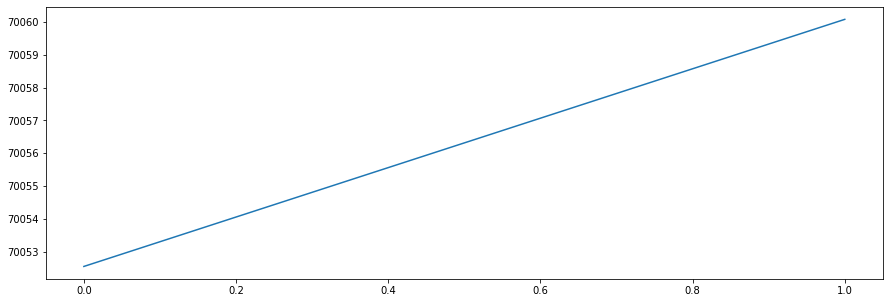

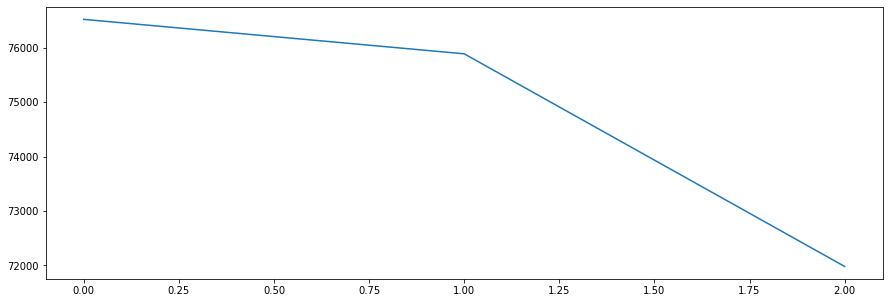

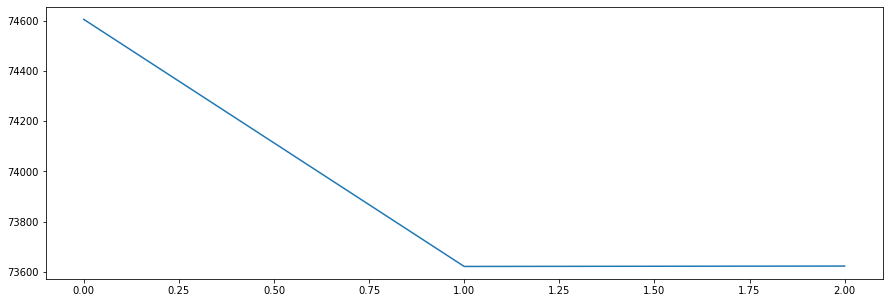

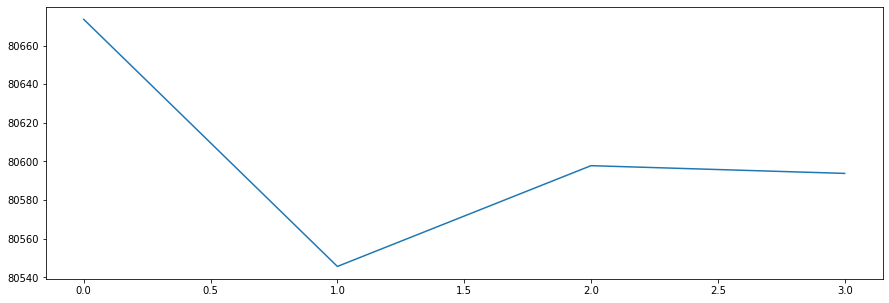

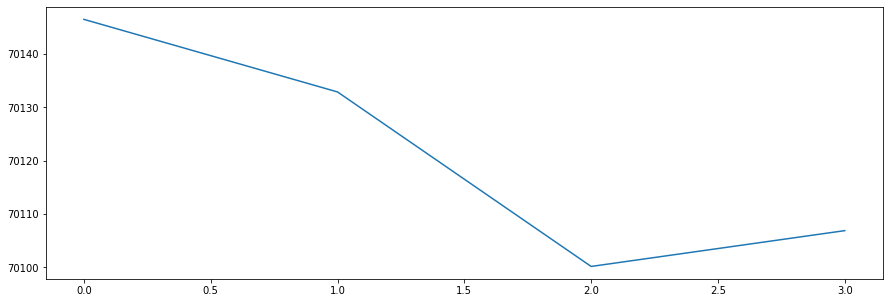

In [8]:
new_model = learn(902, 2000, 550, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(87815.4375) tensor(87815.4375)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(87810.1250) tensor(87810.1250)
epoch: 7
epoch: 8
epoch:   8 loss: 11135.0781250000
epoch: 0
tensor(85654.2500) tensor(84268.7578)
epoch:   1 loss: 8840.3300781250
epoch: 0
tensor(86881.0859) tensor(86881.0859)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(80158.1875) tensor(80158.1875)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(76554.8828) tensor(76554.8828)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(67939.0312) tensor(67939.0312)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 6210.3168945312
epoch: 0
tensor(87879.6953) tensor(87873.3828)
epoch:   1 loss: 6419.0102539062
best model hidden size: 250
0.04277030212525011
11.66289054673794


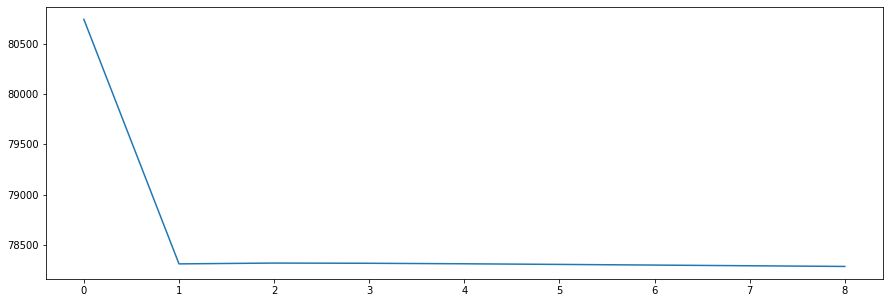

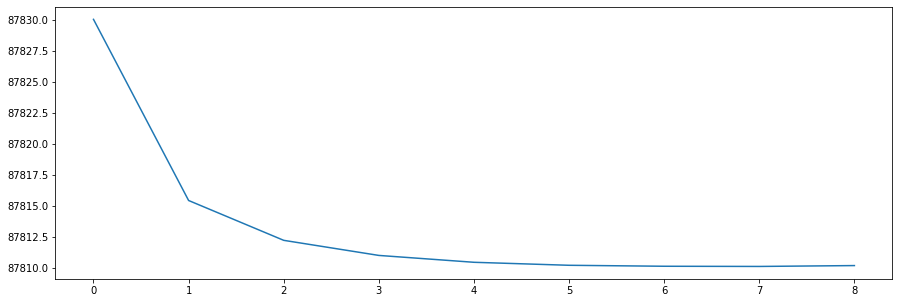

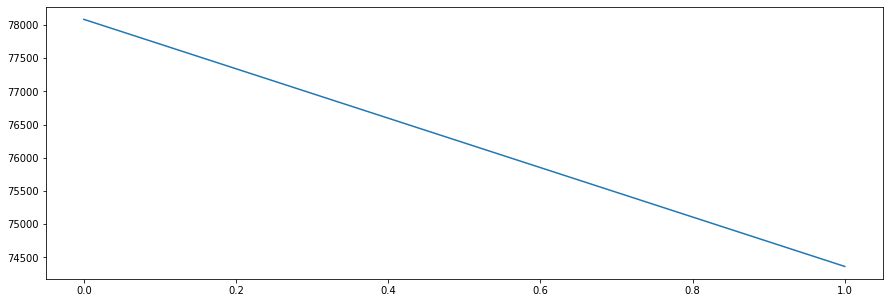

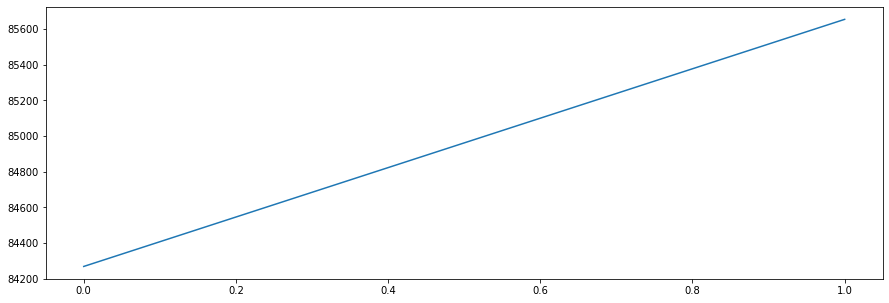

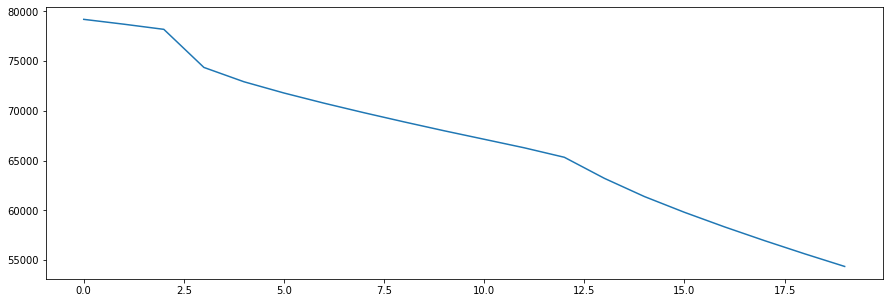

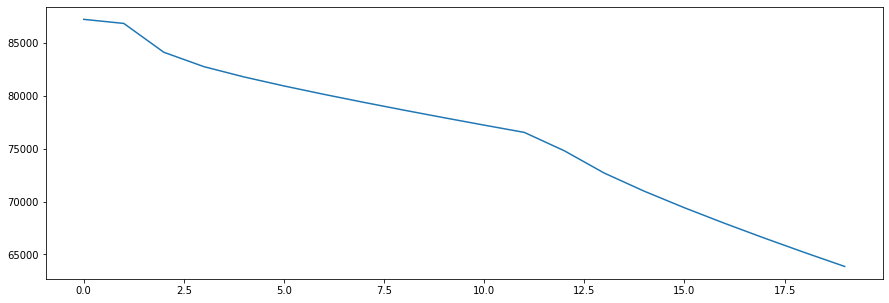

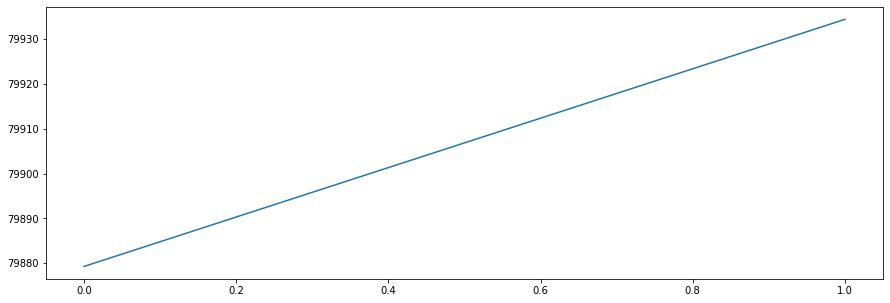

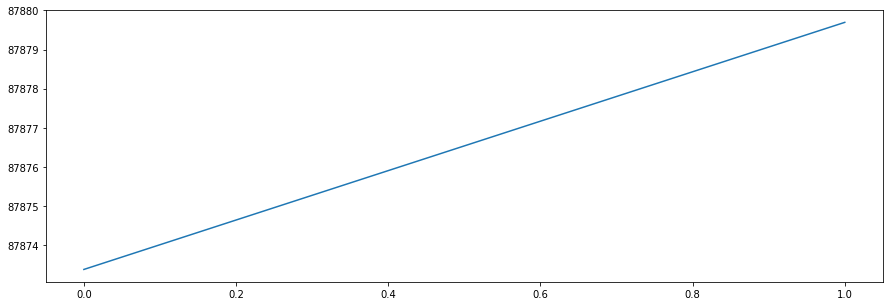

In [7]:
new_model = learn(902, 2000, 600, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(11148.2783) tensor(11148.2783)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(11144.6719) tensor(11144.6719)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(11144.4561) tensor(11144.4561)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(11144.4385) tensor(11144.4346)
epoch:  16 loss: 2574.6354980469
tmp best model hidden size: 50
0.021251602291489514
12.610736757868876
epoch: 0
tensor(13226.1367) tensor(9523.2207)
epoch:   1 loss: 1300.6702880859
tmp best model hidden size: 100
0.008118441574881003
13.480817303756949
epoch: 0
tensor(11204.3428) tensor(10781.2959)
epoch:   1 loss: 1244.0786132812
tmp best model hidden size: 200
0.01934799314187206
12.6364809999457
epoch: 0
tensor(11046.5146) tensor(10747.0205)
epoch:   1 loss: 1903.4382324219
tmp best model hidden size: 250
0.020351581421731064
12.587093310113938
best model hidden size: 250
0.020351581421731064
12.587093310113938


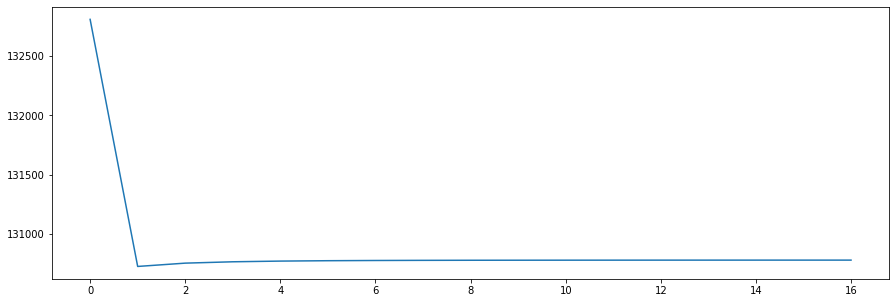

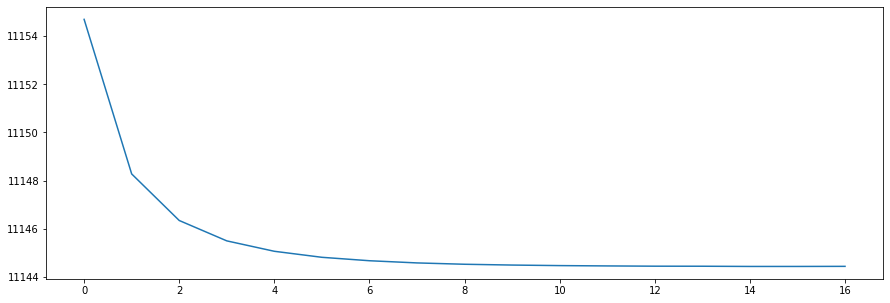

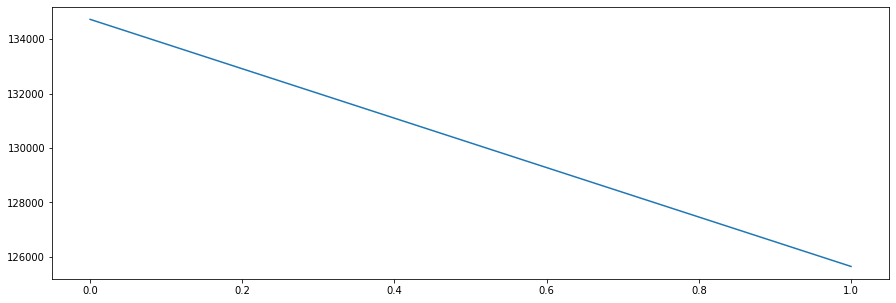

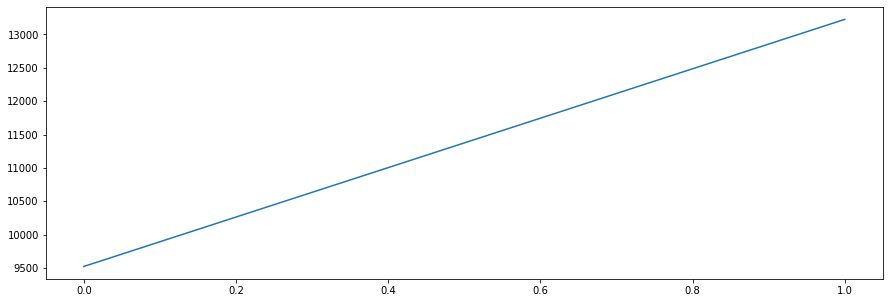

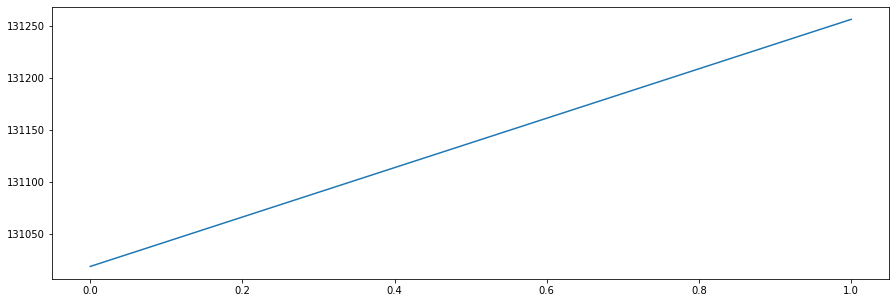

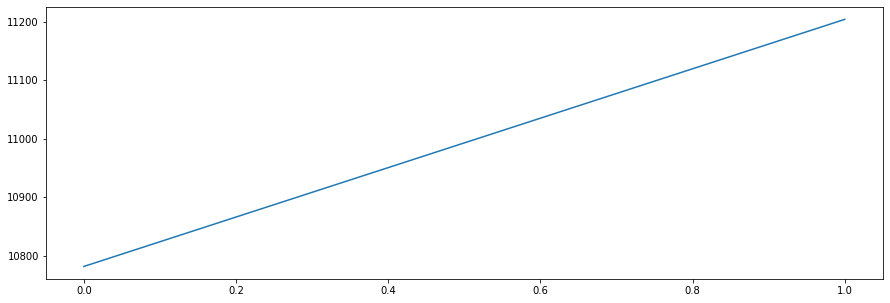

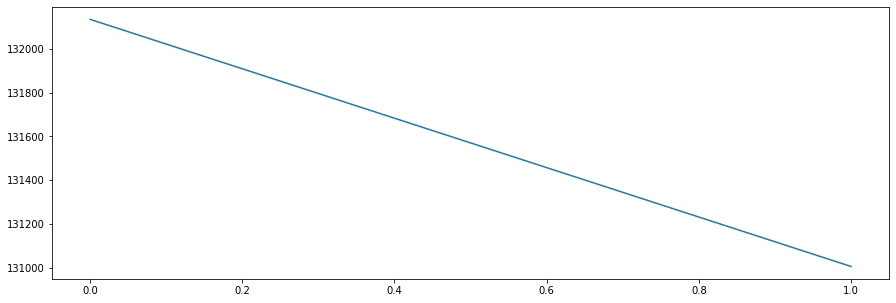

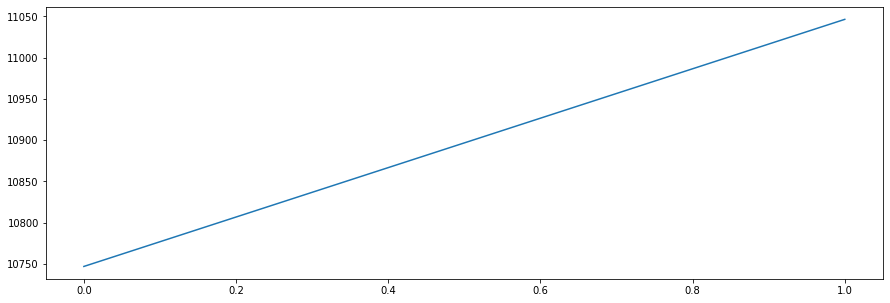

In [7]:
new_model = learn(902, 2000, 650, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(46859.4961) tensor(45558.3125)
epoch:   1 loss: 591.8795166016
epoch: 0
tensor(48011.3672) tensor(44614.7148)
epoch:   1 loss: 22.7776489258
epoch: 0
tensor(55627.8320) tensor(49659.6992)
epoch:   1 loss: 3201.2155761719
epoch: 0
tensor(54531.6094) tensor(54340.6055)
epoch:   1 loss: 1889.8520507812
best model hidden size: 250
0.04469724857265373
19.45259862556747


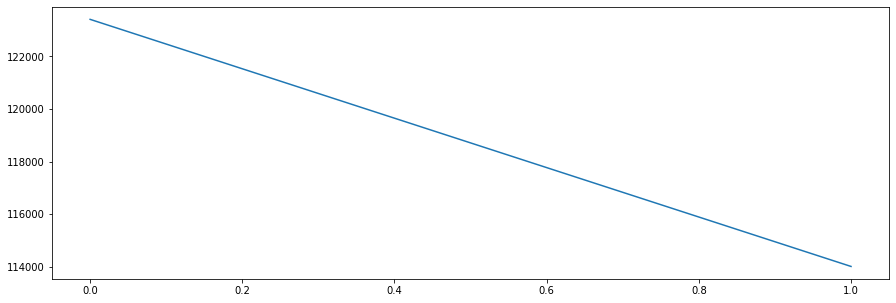

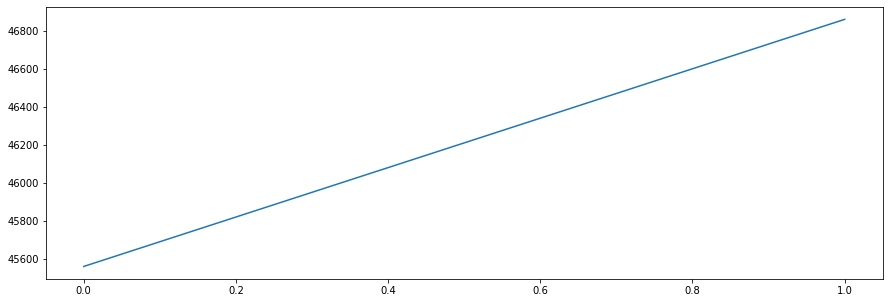

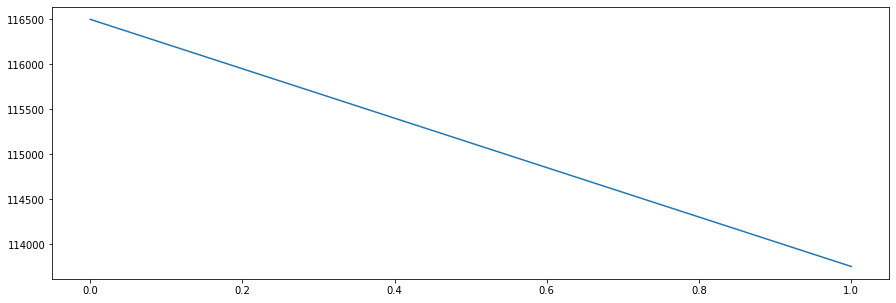

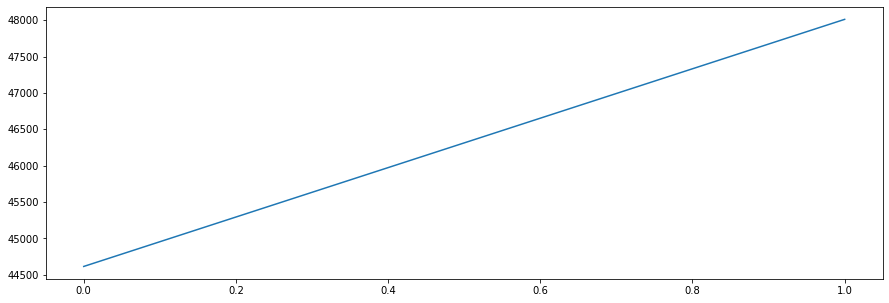

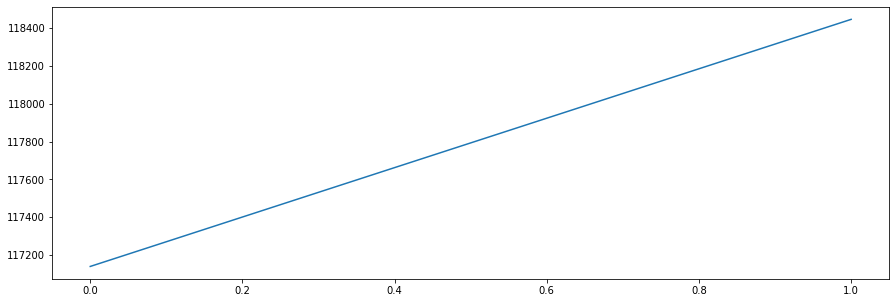

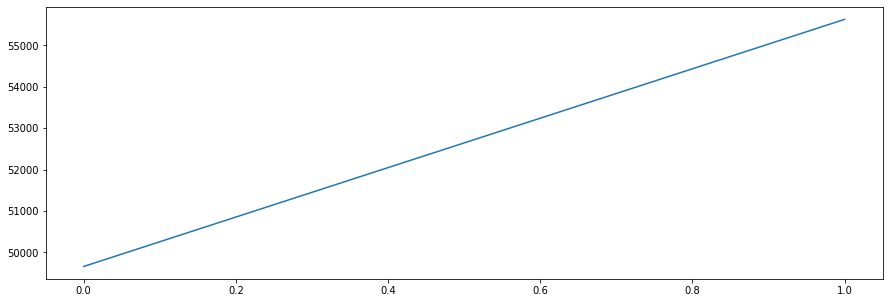

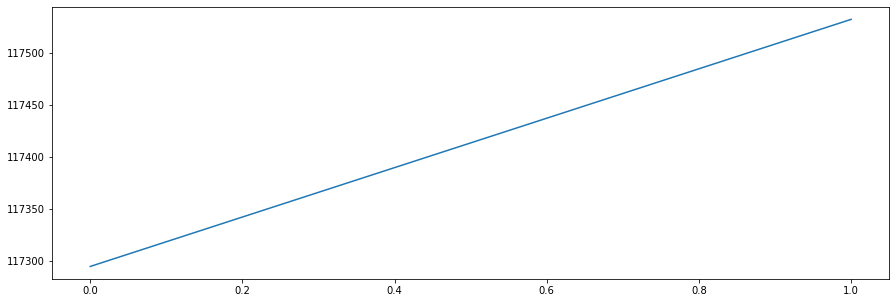

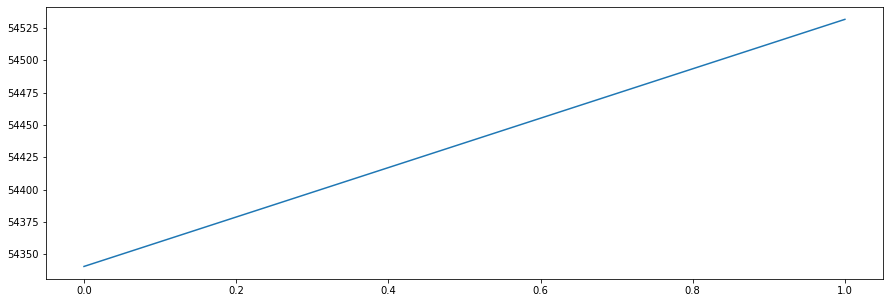

In [7]:
new_model = learn(902, 2000, 700, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(21945.3652) tensor(21945.3652)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(21941.9668) tensor(21941.9668)
epoch: 7
epoch:   7 loss: 7209.5434570312
tmp best model hidden size: 50
0.018857891381711667
20.63114241170689
epoch: 0
tensor(16422.3555) tensor(16422.3555)
epoch: 2
epoch: 3
epoch:   3 loss: 7461.4716796875
tmp best model hidden size: 100
0.011425840940975355
19.372867854181877
epoch: 0
tensor(21609.1914) tensor(21609.1914)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(21608.2422) tensor(21608.2422)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(21608.0371) tensor(21608.0371)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(21607.9238) tensor(21607.9238)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 4103.7080078125
tmp best model hidden size: 200
0.016438358918859898
20.17397073528911
epoch: 0
tensor(21566.6641) tensor(21418.8848)
epoch:   1 loss: 4222.4760742188
tmp best model hidden size: 250
0.016536827399353575
20.167578978534216
best model hidden size:

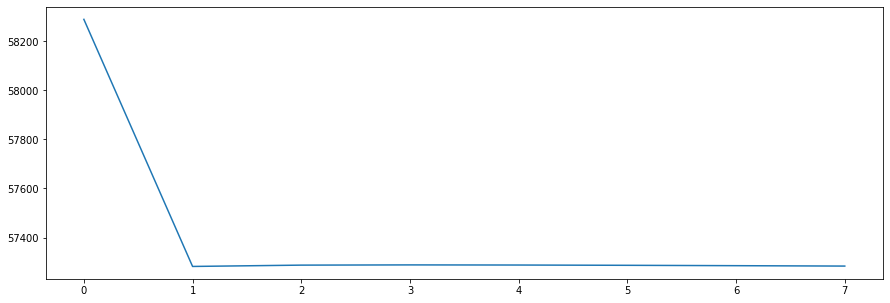

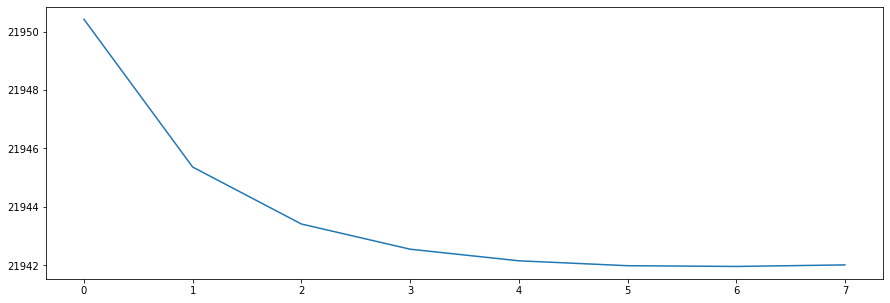

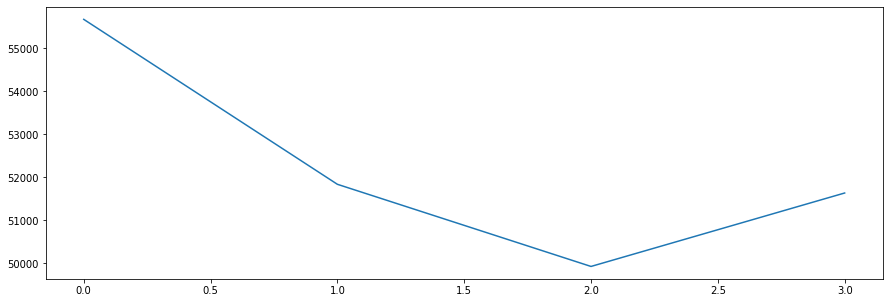

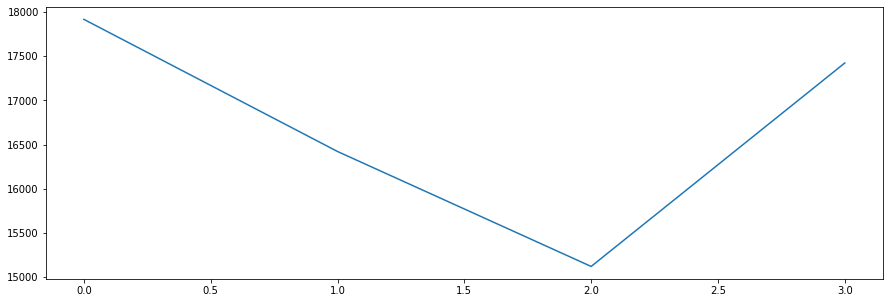

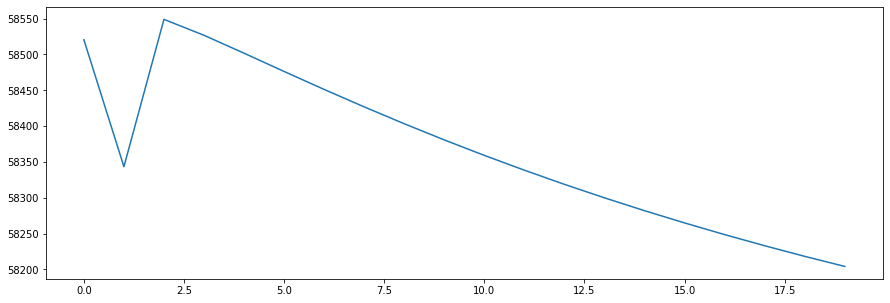

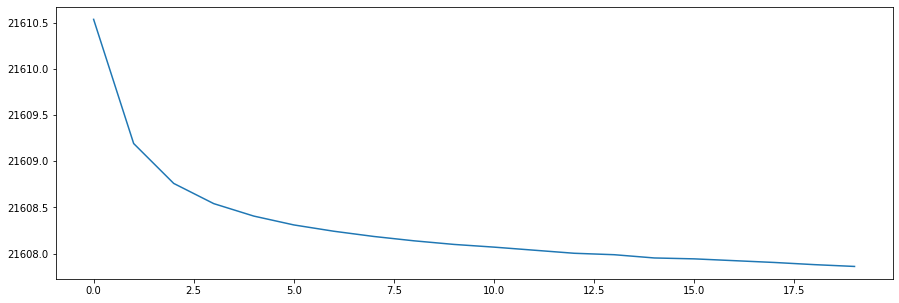

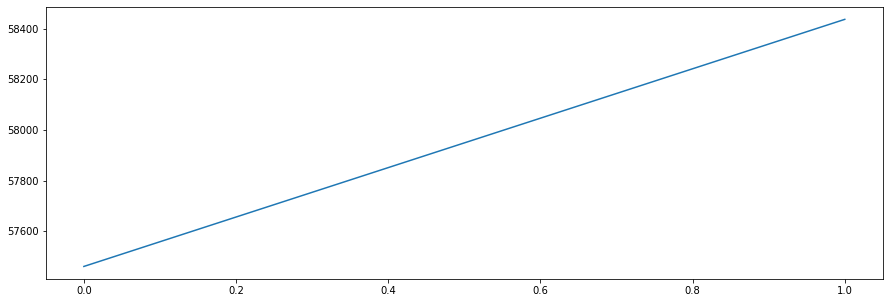

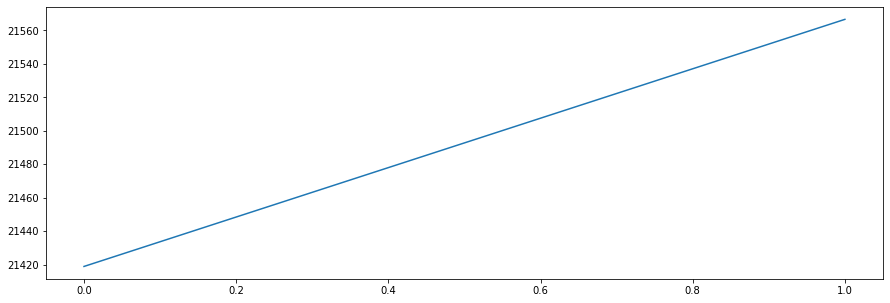

In [9]:
new_model = learn(902, 2000, 750, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(141655.0469) tensor(141655.0469)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(141185.2969) tensor(141185.2969)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(140908.4219) tensor(140908.4219)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(140661.4688) tensor(140661.4688)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 14462.2841796875
tmp best model hidden size: 50
0.012623077934575035
12.682901752214859
epoch: 0
tensor(142853.4375) tensor(142420.2812)
epoch:   1 loss: 30442.8613281250
tmp best model hidden size: 100
0.0185484044801293
16.029114094083194
epoch: 0
tensor(149310.6406) tensor(149222.7500)
epoch:   1 loss: 41933.2851562500
tmp best model hidden size: 200
0.02178157854583851
18.37845600639685
epoch: 0
tensor(150399.9531) tensor(150322.2812)
epoch:   1 loss: 44496.2382812500
tmp best model hidden size: 250
0.022406389644415346
18.869898039754773
best model hidden size: 250
0.022406389644415346
18.869898039754773


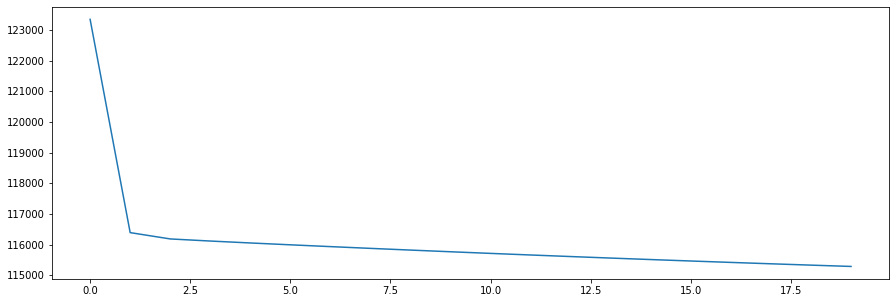

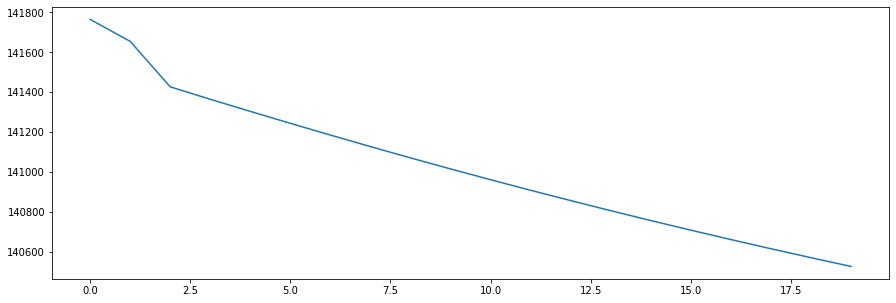

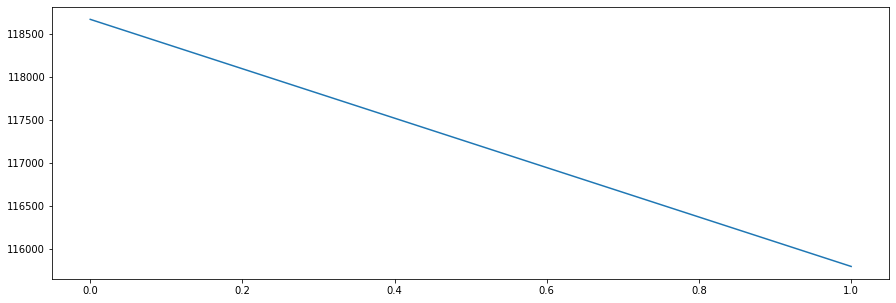

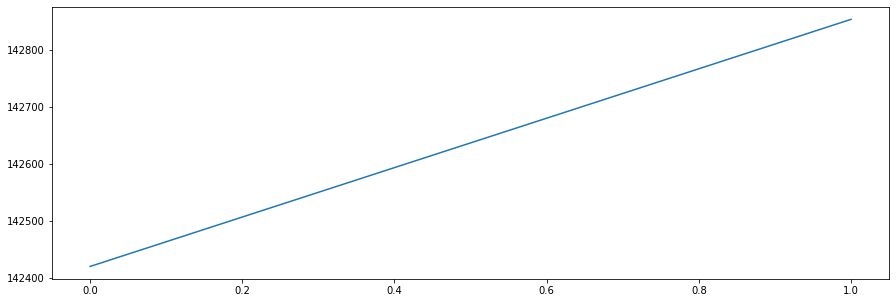

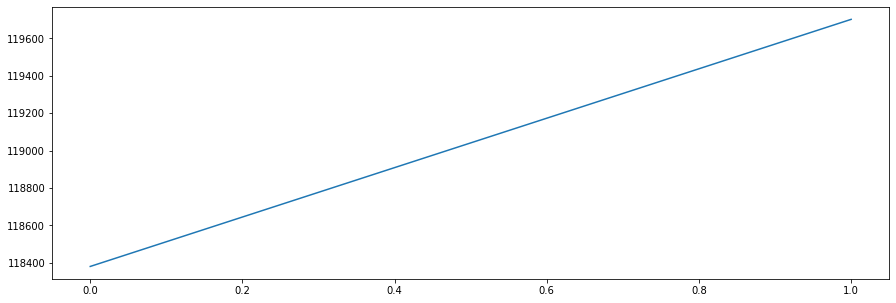

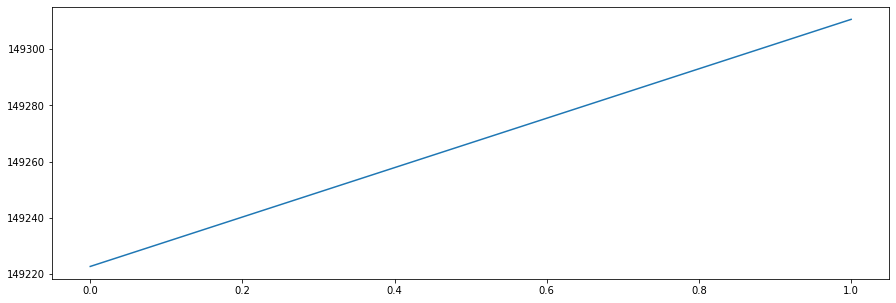

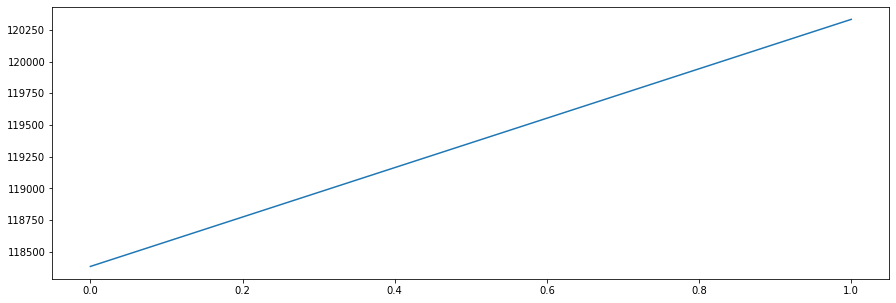

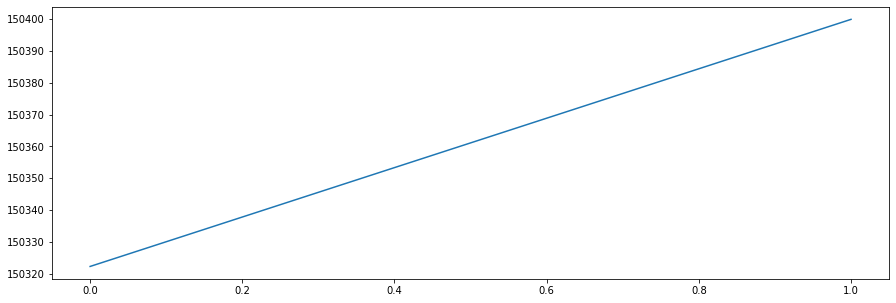

In [8]:
new_model = learn(902, 2000, 800, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(166417.1250) tensor(166417.1250)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(166409.5000) tensor(166409.5000)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(166408.7031) tensor(166408.7031)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(166408.5469) tensor(166408.5469)
epoch: 17
epoch: 18
epoch:  18 loss: 113.4634933472
epoch: 0
tensor(163423.3594) tensor(163423.3594)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(147079.7188) tensor(147079.7188)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(133131.6719) tensor(133131.6719)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(120241.7812) tensor(120241.7812)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 15890.6943359375
epoch: 0
tensor(146281.9531) tensor(146281.9531)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(134223.0469) tensor(134223.0469)
epoch: 7
epoch: 8
epoch:   8 loss: 2376.7919921875
epoch: 0
tensor(144566.7344) tensor(144566.7344)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(91727.1562) tensor(91727.1562)
epoch: 

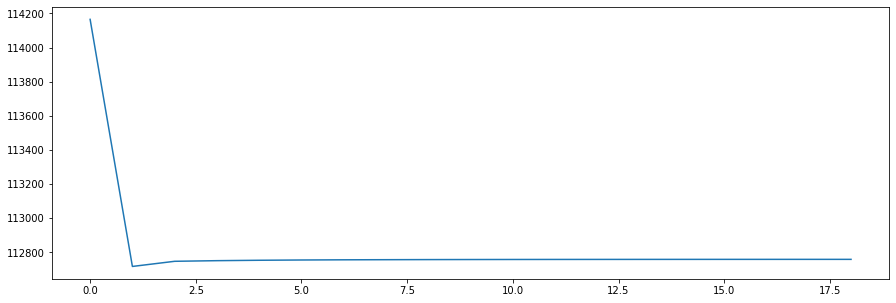

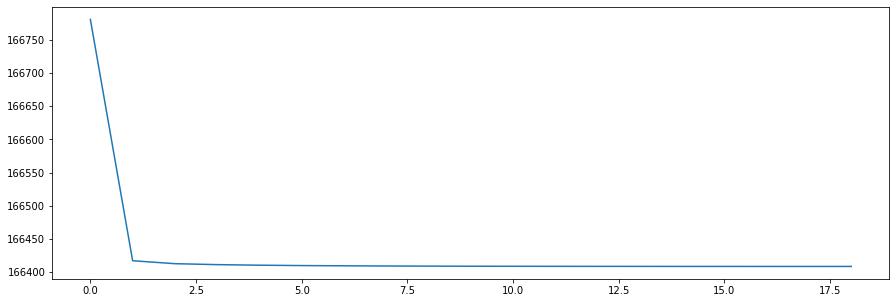

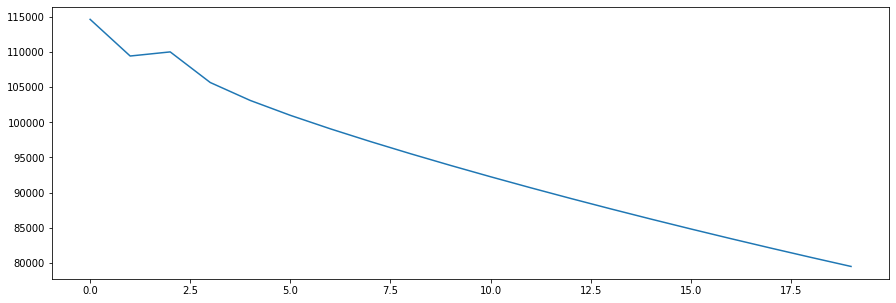

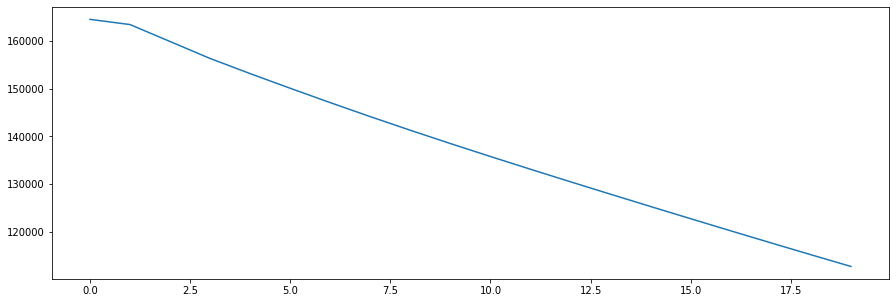

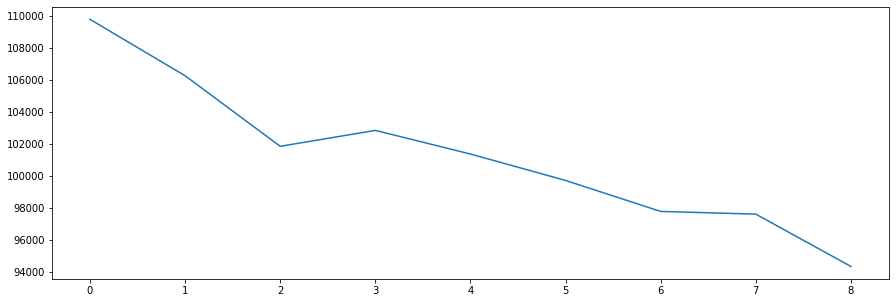

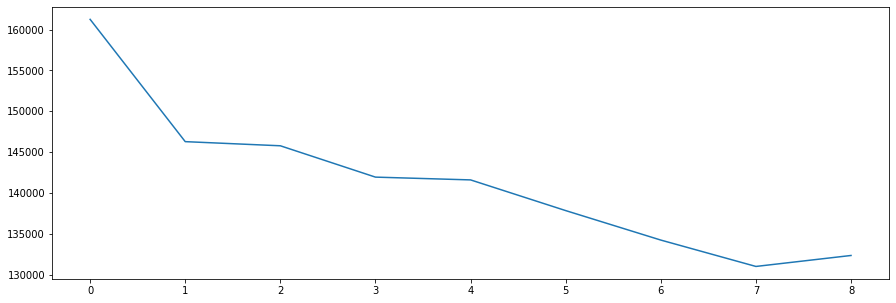

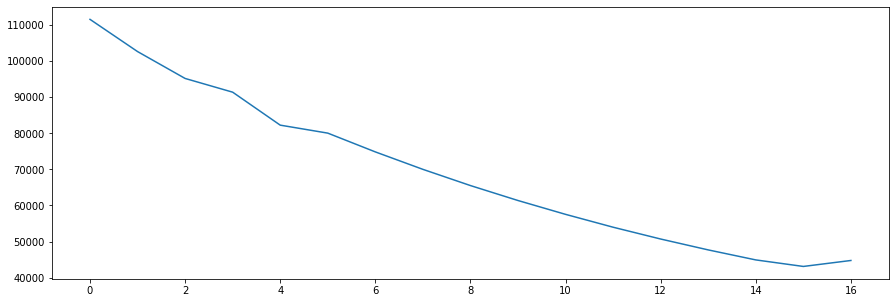

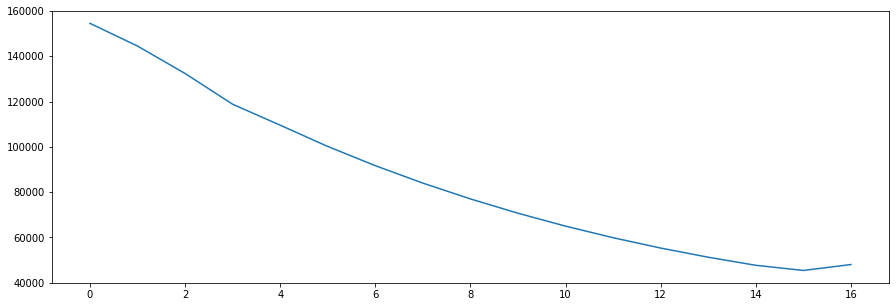

In [9]:
new_model = learn(902, 2000, 850, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(5943.1392) tensor(5943.1392)
epoch: 2
epoch: 3
epoch:   3 loss: 150.0264739990
epoch: 0
tensor(7255.1250) tensor(7255.1250)
epoch: 2
epoch:   2 loss: 1318.9587402344
epoch: 0
tensor(7157.2651) tensor(7146.6548)
epoch:   1 loss: 2167.7988281250
epoch: 0
tensor(7213.9058) tensor(7213.9058)
epoch: 2
epoch:   2 loss: 1904.5969238281
best model hidden size: 250
0.009976084212240704
7.228385719807985


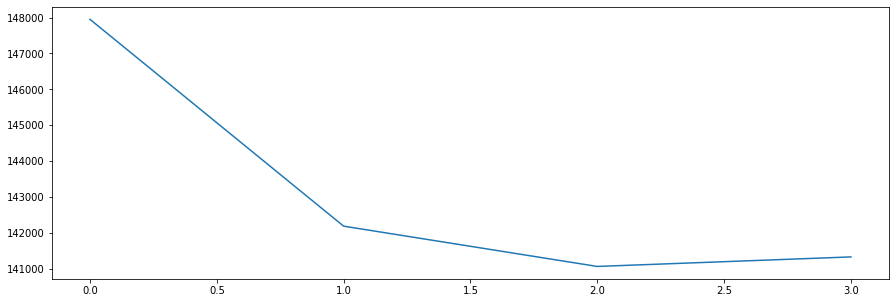

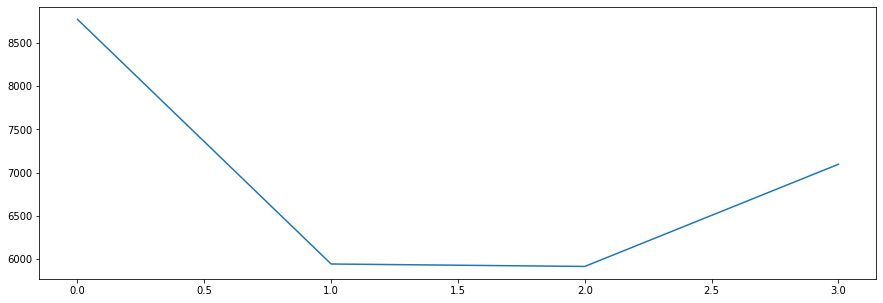

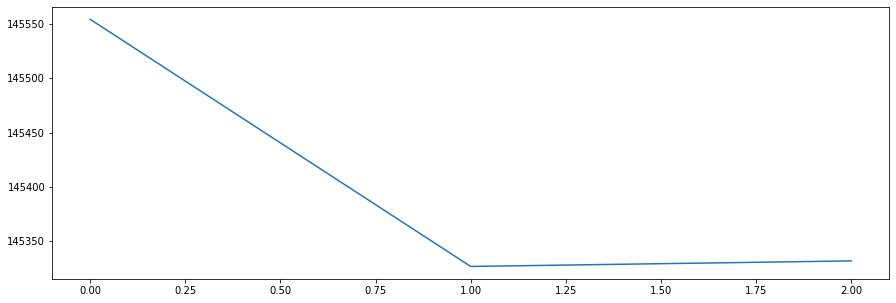

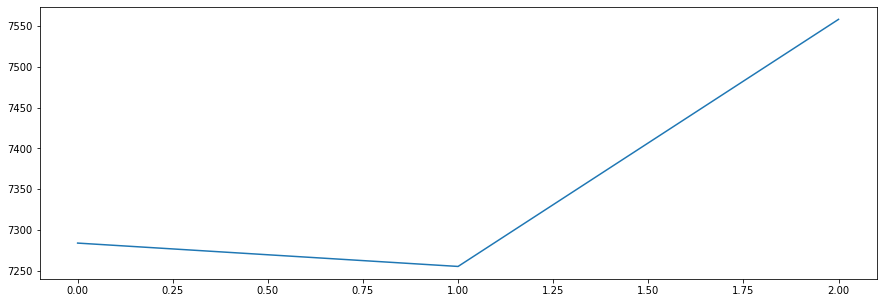

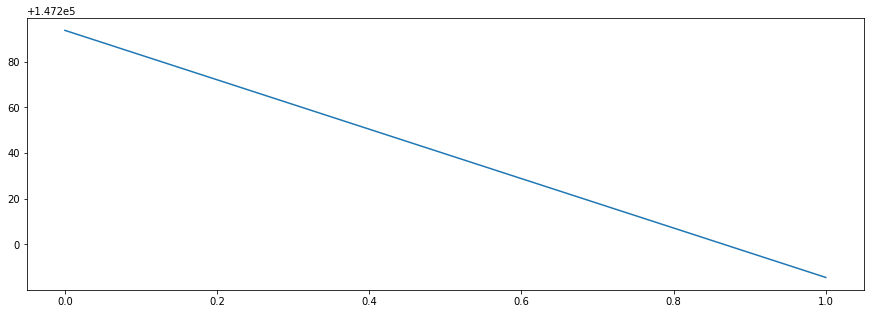

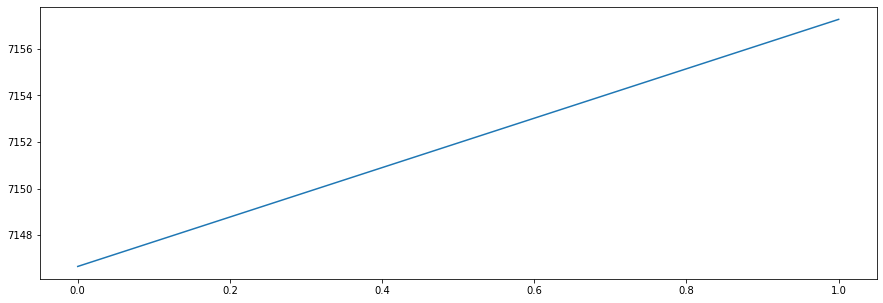

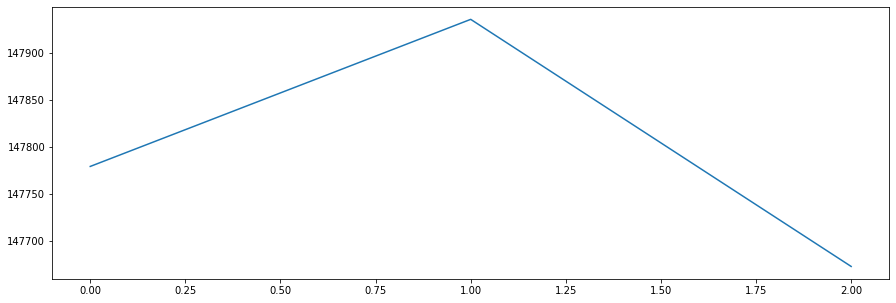

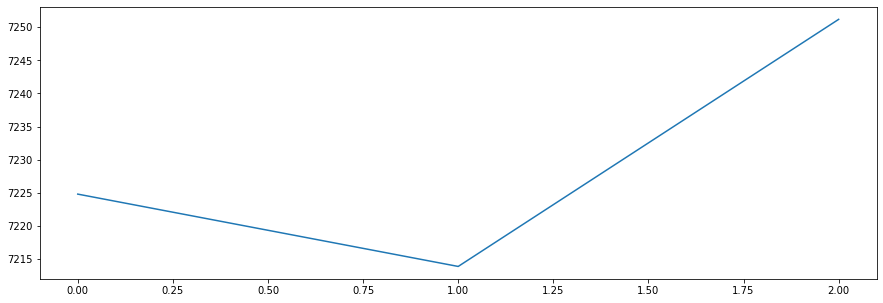

In [8]:
new_model = learn(902, 2000, 900, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(9318.8682) tensor(8958.0703)
epoch:   1 loss: 1736.1676025391
epoch: 0
tensor(8418.4287) tensor(8418.4287)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(8414.5361) tensor(8414.5361)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(8414.1768) tensor(8414.1768)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(8414.0918) tensor(8414.0918)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 3378.0449218750
epoch: 0
tensor(8271.3916) tensor(8271.3916)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(8270.7344) tensor(8270.7344)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(8270.6816) tensor(8270.6816)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(8270.6768) tensor(8270.6758)
epoch:  16 loss: 3897.0024414062
epoch: 0
tensor(8141.2725) tensor(8141.2725)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(8136.9990) tensor(8136.9990)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(8136.5728) tensor(8136.5728)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(8136.4790) tensor(8136.4790)
epoch: 17
epoc

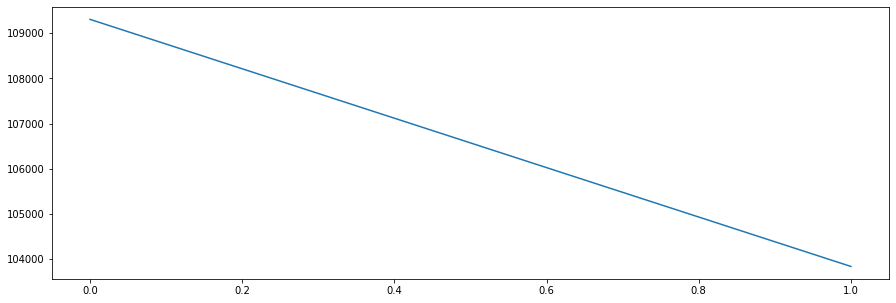

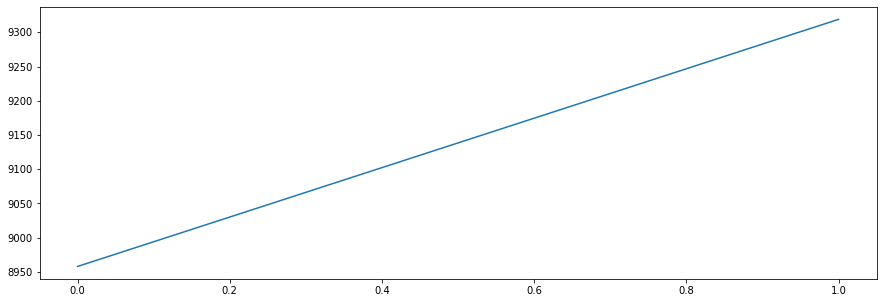

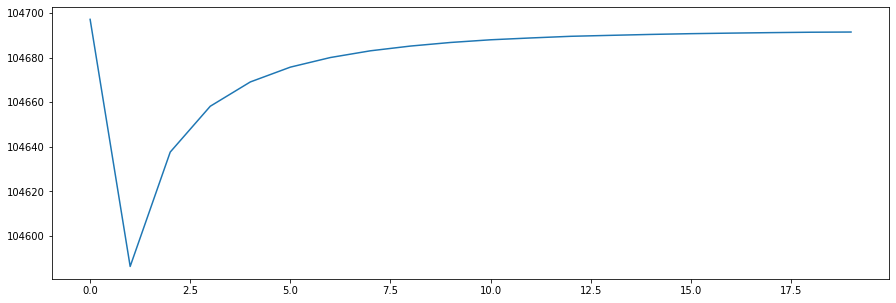

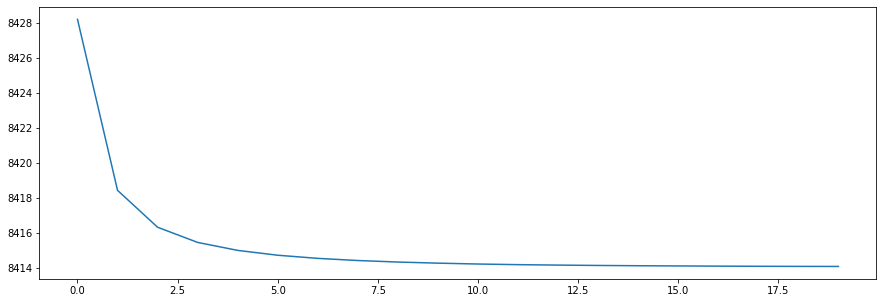

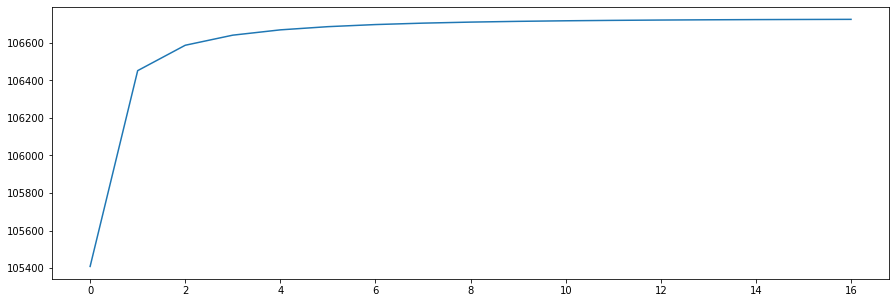

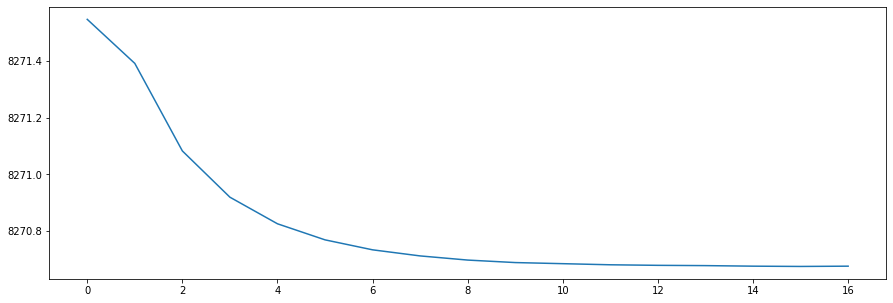

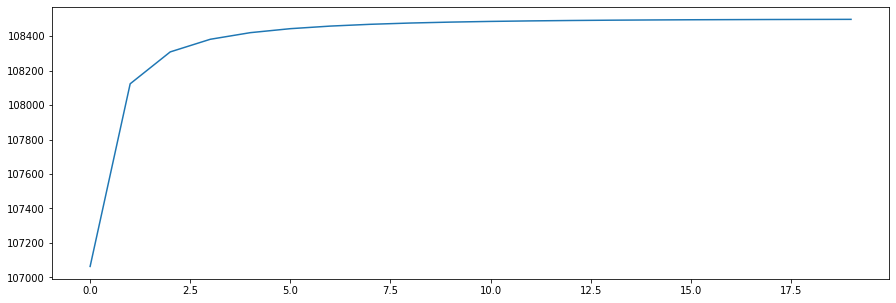

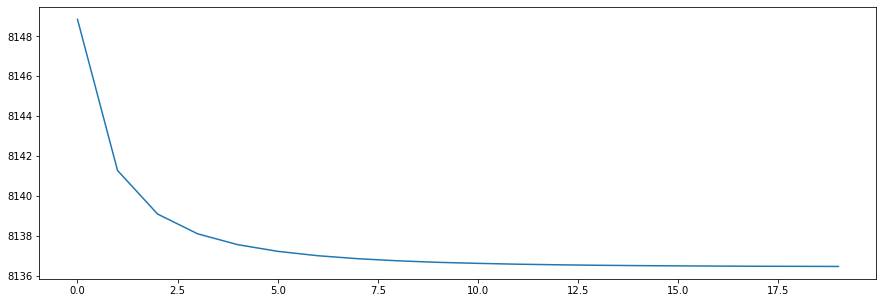

In [7]:
new_model = learn(902, 2000, 950, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(7016.5371) tensor(6973.8428)
epoch:   1 loss: 19593.4023437500
epoch: 0
tensor(4586.4966) tensor(4586.4966)
epoch: 2
epoch:   2 loss: 9170.3046875000
epoch: 0
tensor(9943.6338) tensor(7358.4395)
epoch:   1 loss: 29666.8125000000
epoch: 0
tensor(10219.0117) tensor(2702.3381)
epoch:   1 loss: 30923.7988281250
epoch: 0
tensor(11080.4824) tensor(11080.4824)
epoch: 2
epoch:   2 loss: 33095.3476562500
best model hidden size: 300
0.017062553572485834
12.720158366555298


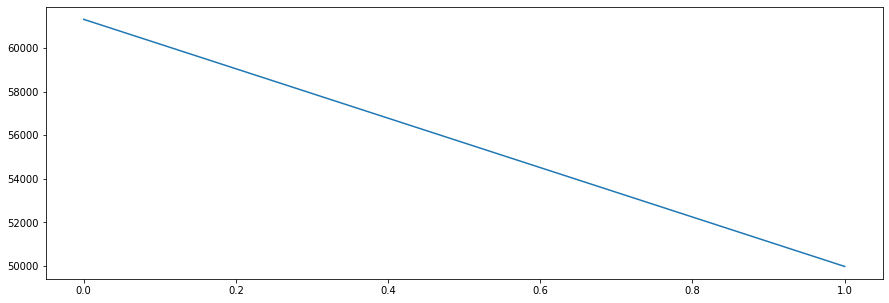

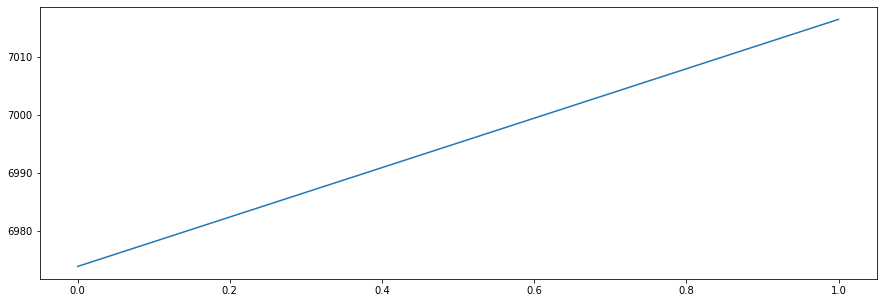

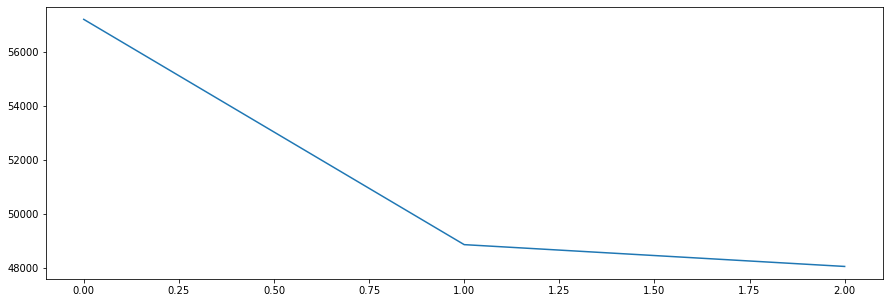

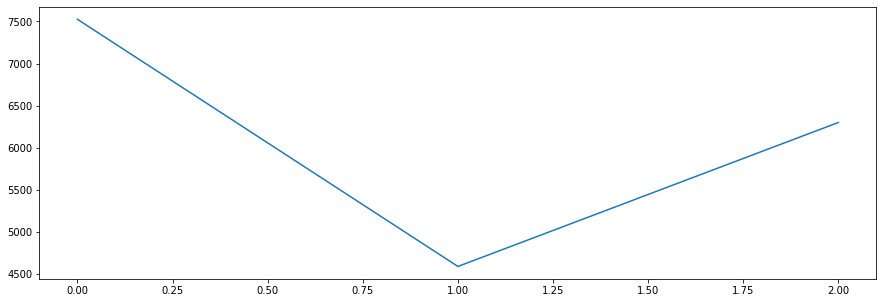

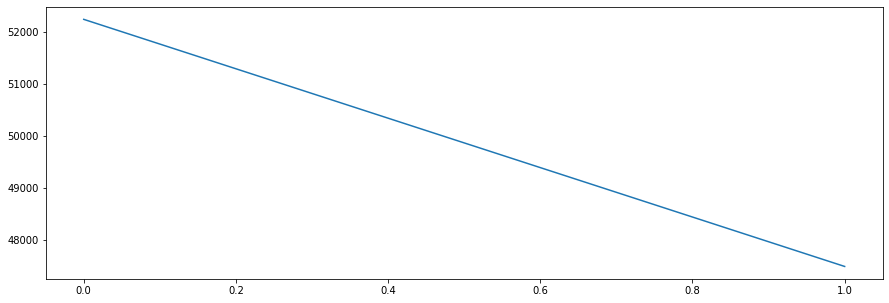

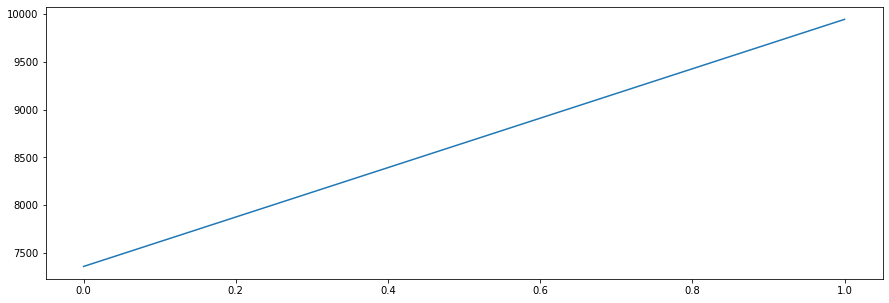

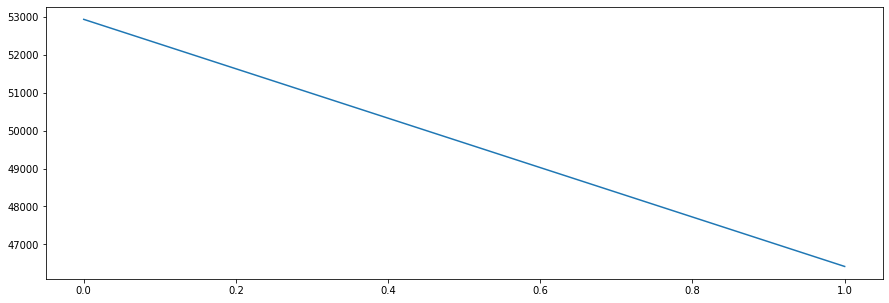

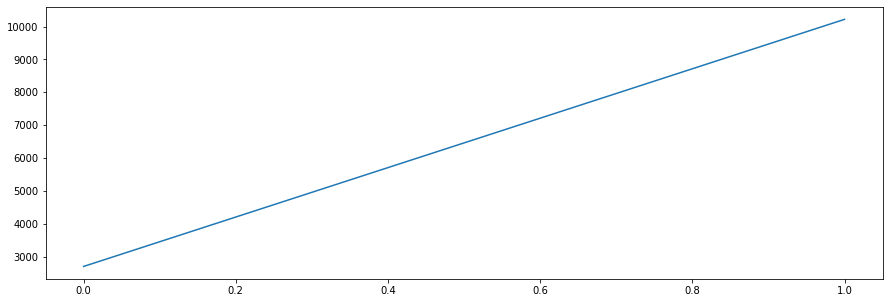

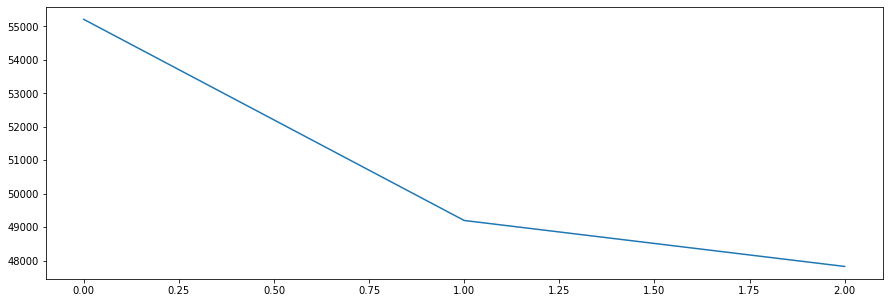

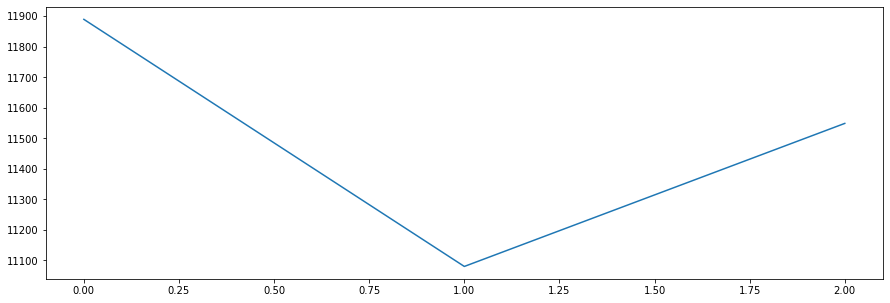

In [7]:
new_model = learn(902, 2000, 1000, 0.2)
# evaluate(new_model)

# 5s

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(375628.9062) tensor(375628.9062)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
tensor(375616.0938) tensor(375616.0938)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(375616.0938) tensor(375616.0938)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(375616.0938) tensor(375616.0938)
epoch: 17
epoch:  17 loss: 349494.8125000000
epoch: 0
bast model hidden size: 50
tensor(375608.3125) tensor(375598.9062)
epoch:   1 loss: 337161.4375000000
epoch: 0
bast model hidden size: 100
bast model hidden size: 100
tensor(375589.6875) tensor(375589.6875)
epoch: 2
bast model hidden size: 100
epoch: 3
epoch:   3 loss: 333701.0625000000
epoch: 0
bast model hidden size: 200
bast model hidden size: 200
tensor(375290.1875) tensor(375290.1875)
epoch: 2
bast model hidden size: 200
epoch: 3
epoch:   3 loss: 334638.4062500000
epoch: 0
bast 

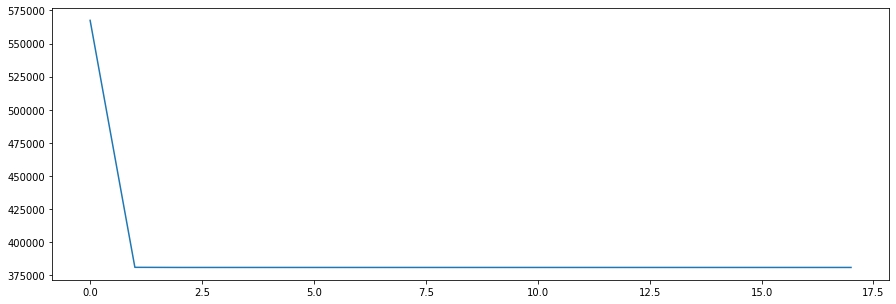

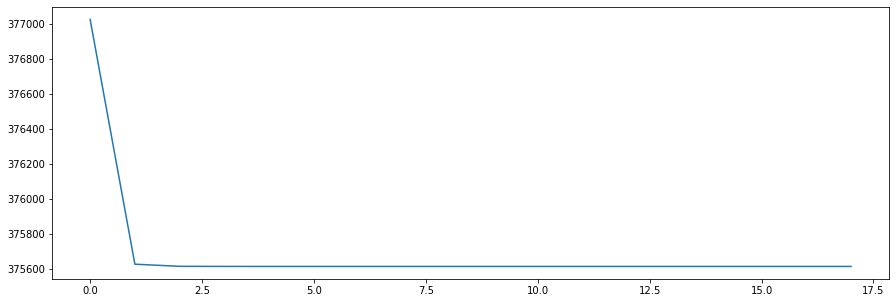

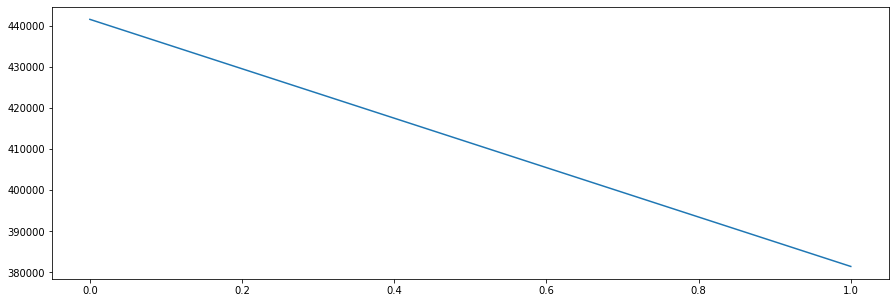

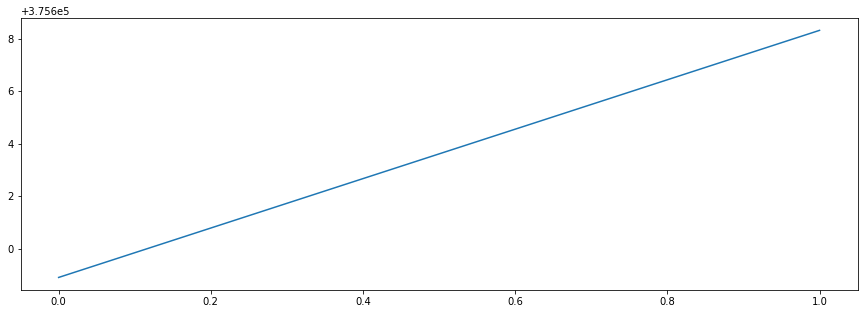

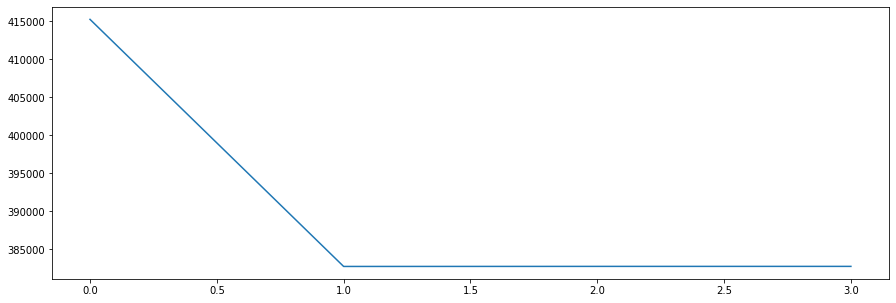

...

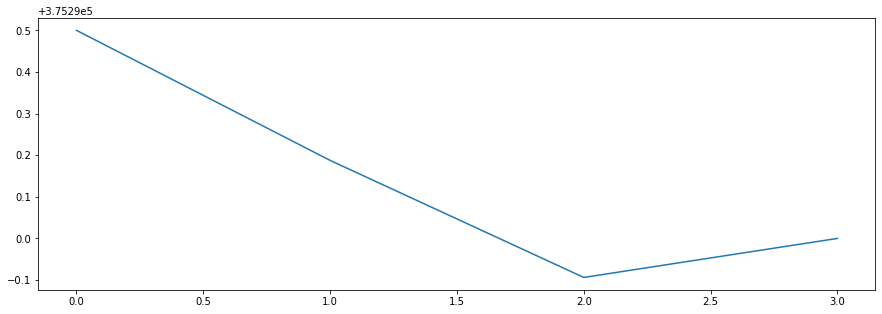

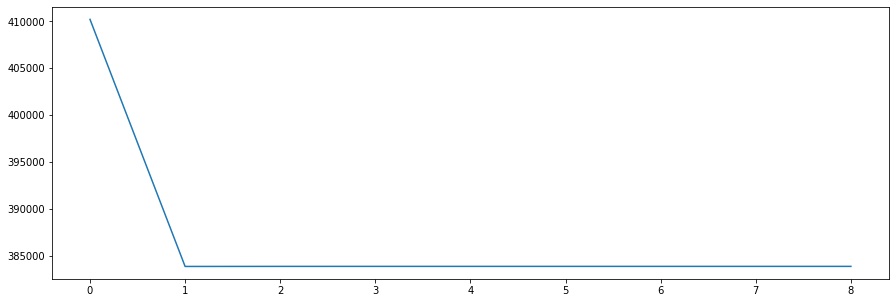

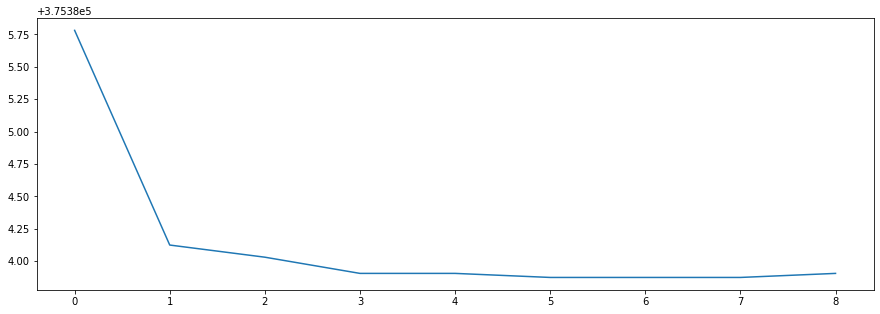

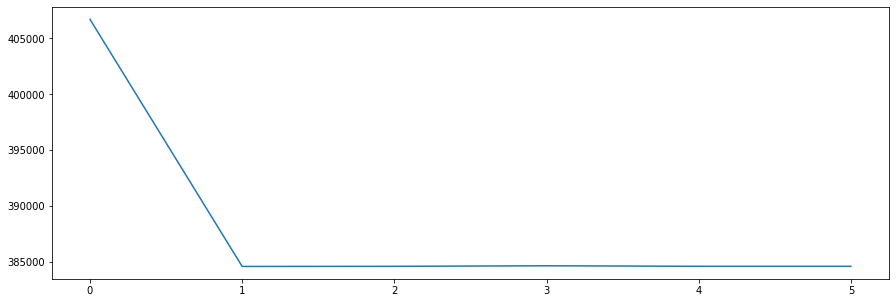

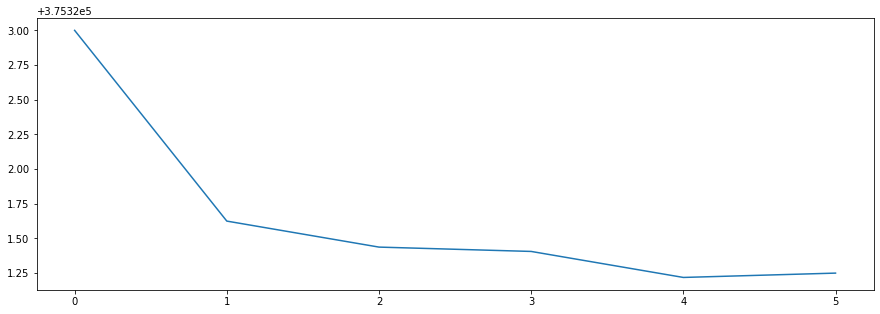

In [103]:
new_model = learn(19, 5000, 50, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(411571.3750) tensor(411571.3750)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(393181.1250) tensor(393181.1250)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
tensor(393156.8125) tensor(393134.8750)
epoch:  11 loss: 98153.8203125000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(393496.1875) tensor(393496.1875)
epoch: 2
epoch:   2 loss: 113551.6640625000
epoch: 0
bast model hidden size: 100
tensor(395417.8438) tensor(394435.2500)
epoch:   1 loss: 132776.6718750000
epoch: 0
bast model hidden size: 200
tensor(402758.3438) tensor(402594.6875)
epoch:   1 loss: 171605.2031250000
epoch: 0
bast model hidden size: 250
tensor(406091.0938) tensor(405975.3438)
epoch

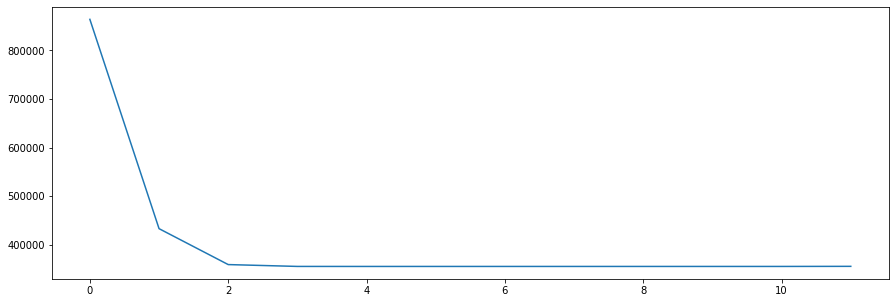

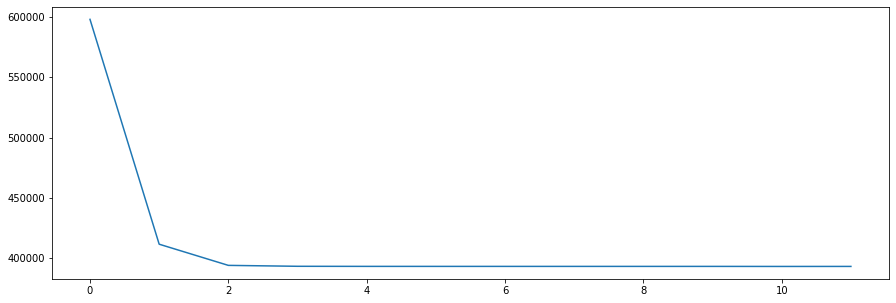

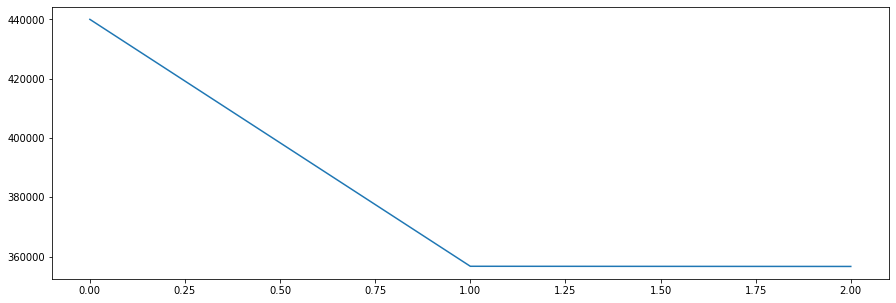

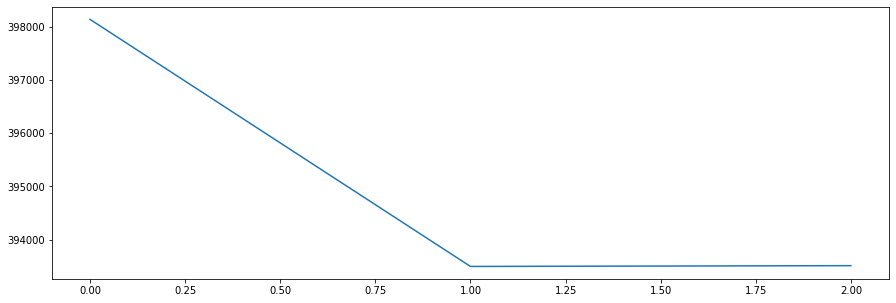

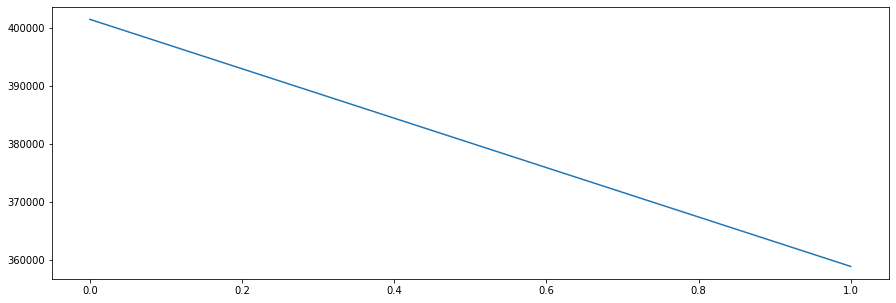

...

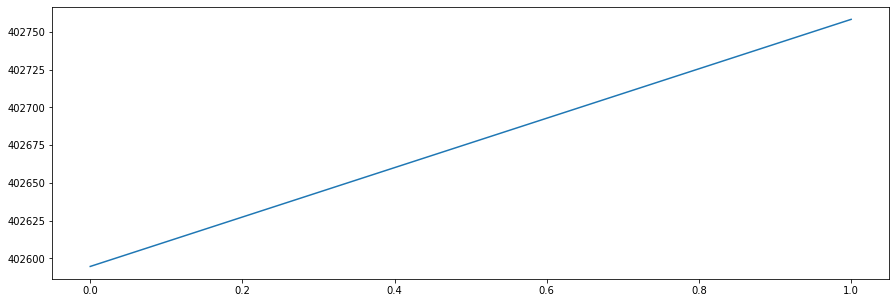

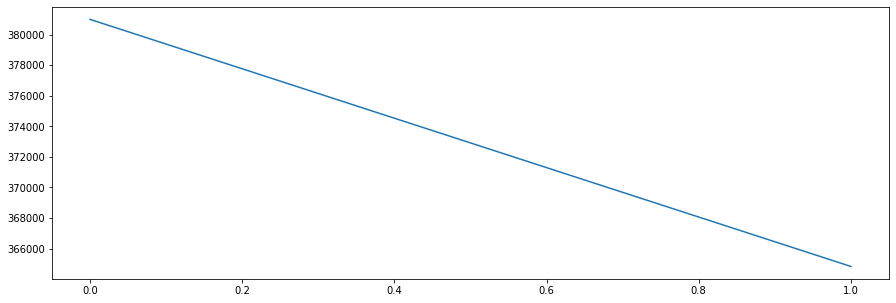

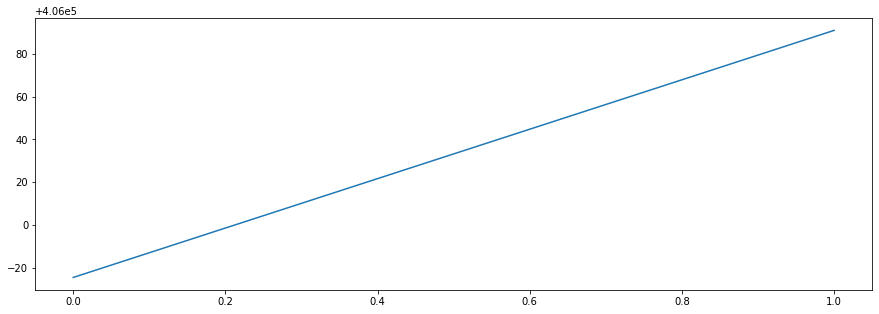

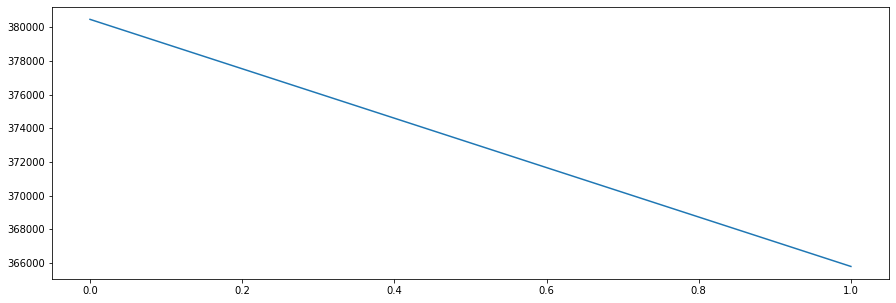

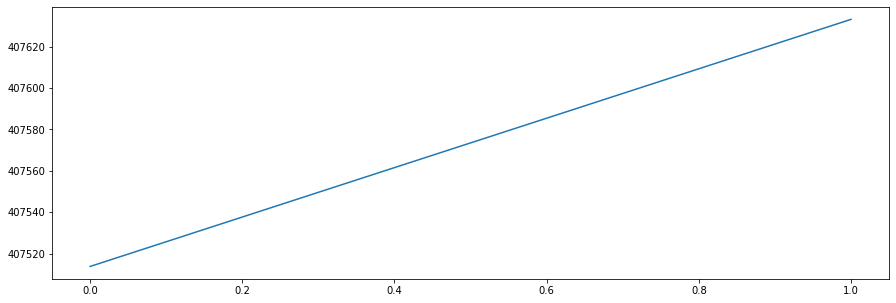

In [104]:
new_model = learn(19, 5000, 100, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(537575.8750) tensor(537575.8750)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(416143.5000) tensor(416143.5000)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(415836.5000) tensor(415836.5000)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(415834.7188) tensor(415834.7188)
epoch: 17
epoch: 18
epoch: 19
epoch:  19 loss: 67582.2968750000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(412907.1250) tensor(412907.1250)
epoch: 2
bast model hidden size: 50
epoch: 3
bast model hidden size: 50
epoch:

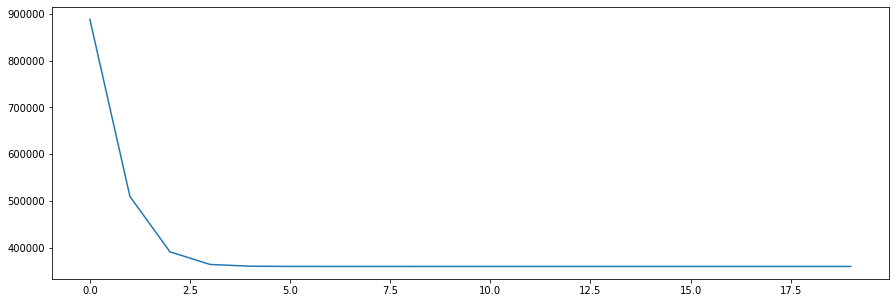

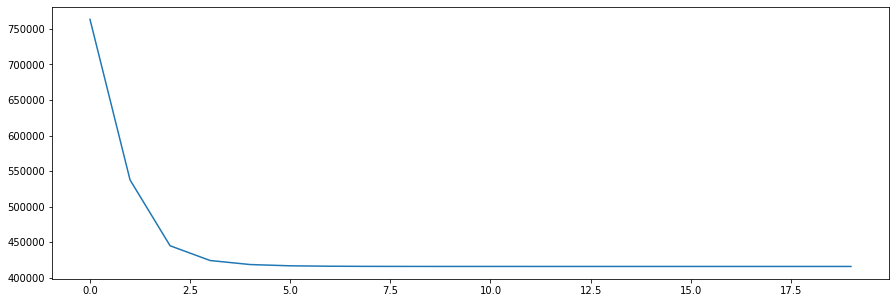

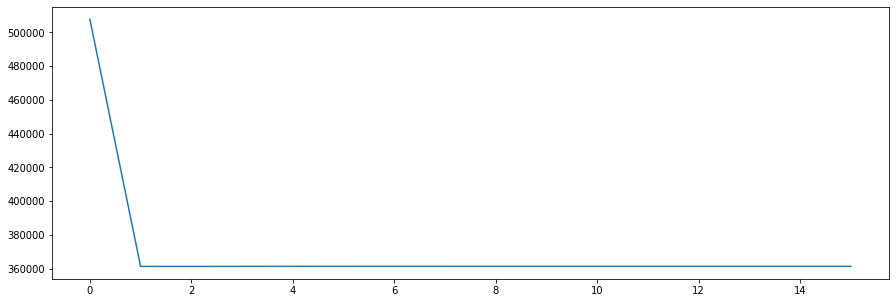

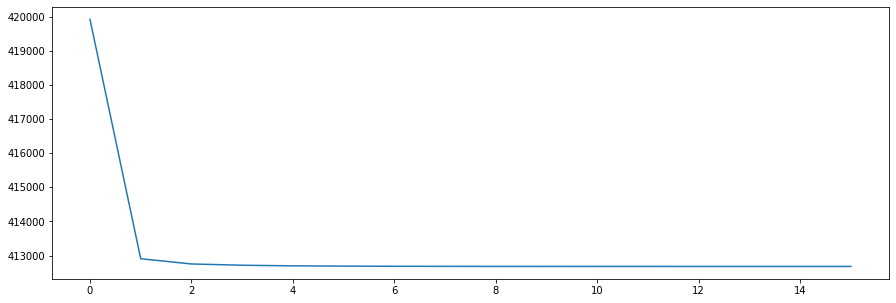

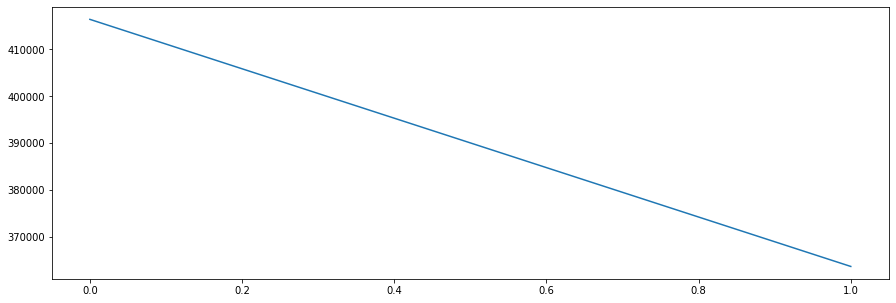

...

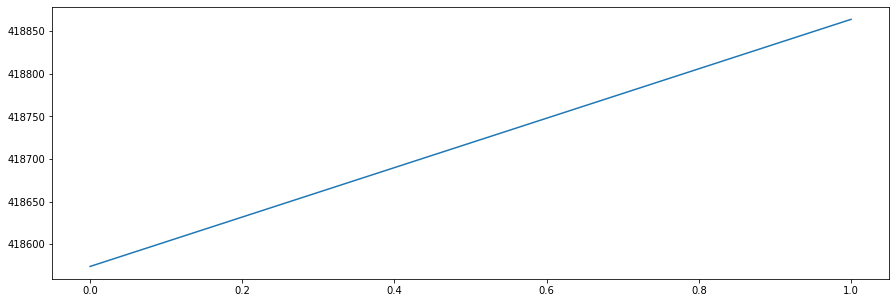

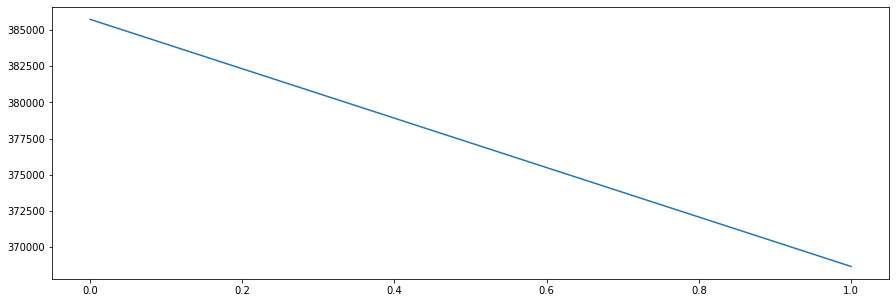

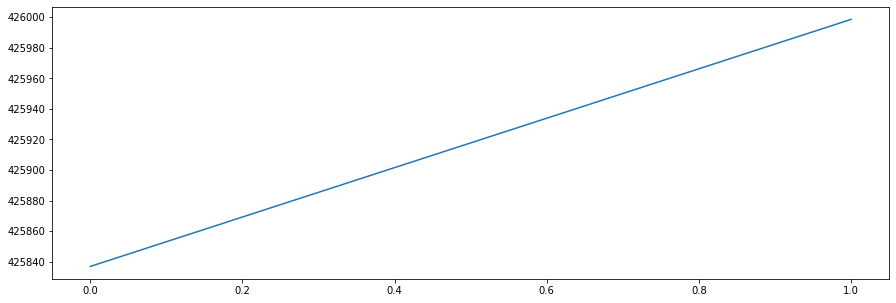

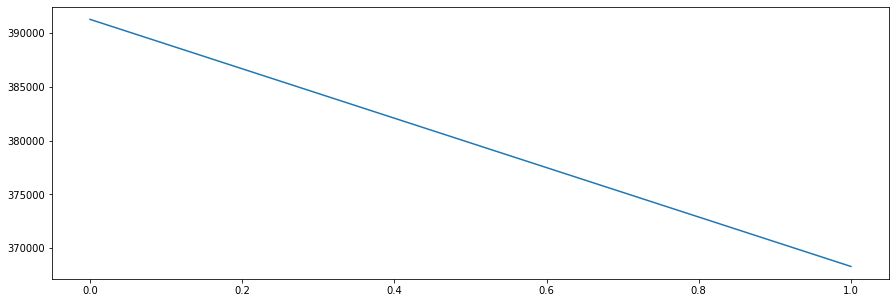

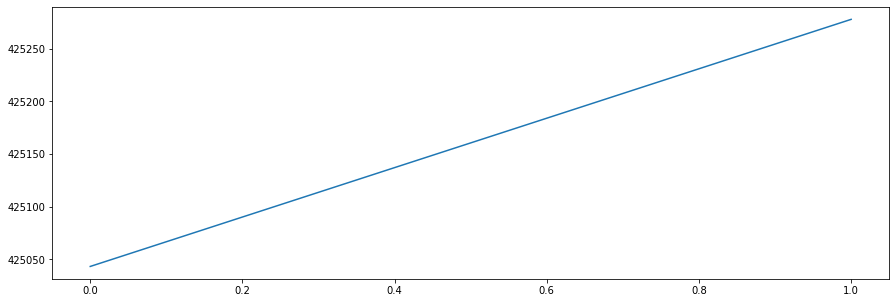

In [105]:
new_model = learn(19, 5000, 150, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(675766.7500) tensor(675766.7500)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(398550.5000) tensor(398550.5000)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
epoch:  10 loss: 457529.6875000000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(398516.4375) tensor(398516.4375)
epoch: 2
epoch:   2 loss: 487800.1250000000
epoch: 0
bast model hidden size: 100
tensor(399382.1875) tensor(399238.4375)
epoch:   1 loss: 496610.5312500000
epoch: 0
bast model hidden size: 200
tensor(399337.9062) tensor(399278.1562)
epoch:   1 loss: 455347.1250000000
epoch: 0
bast model hidden size: 250
tensor(399762.8438) tensor(399731.3438)
epoch:   1 loss: 435962.9375000000
epoch: 0
bast model hidden size: 300

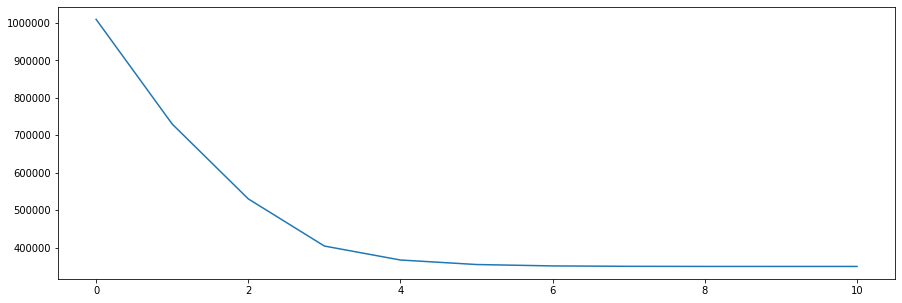

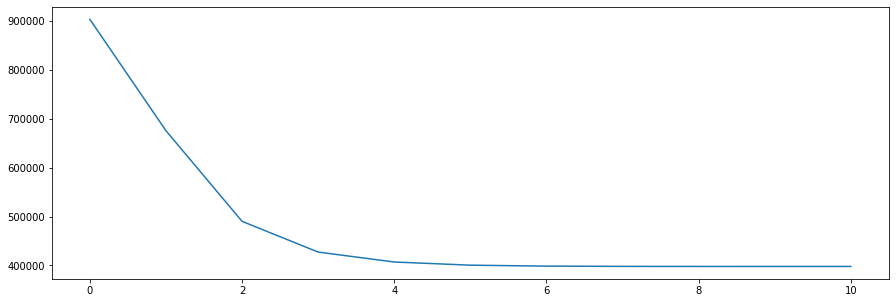

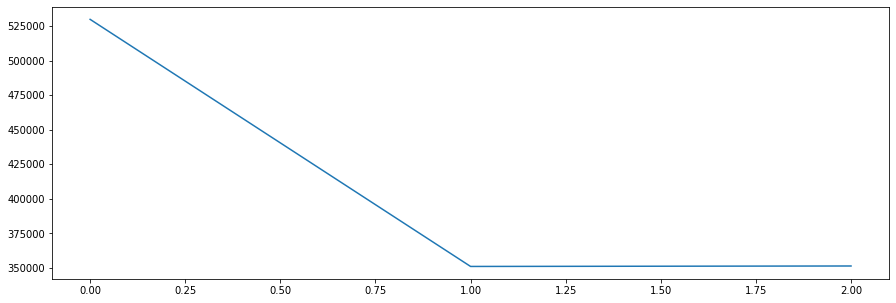

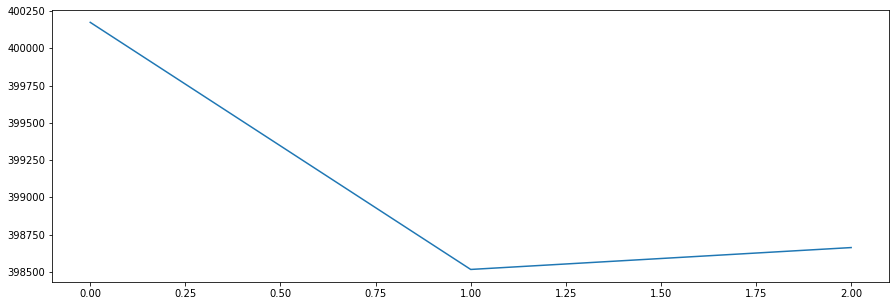

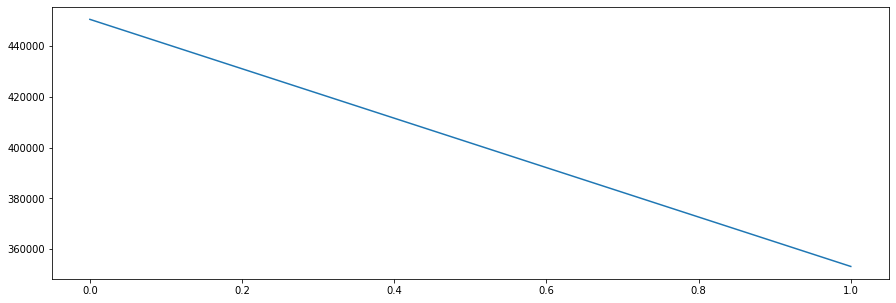

...

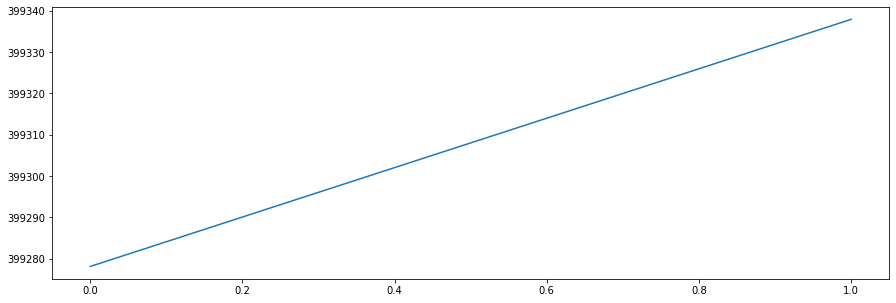

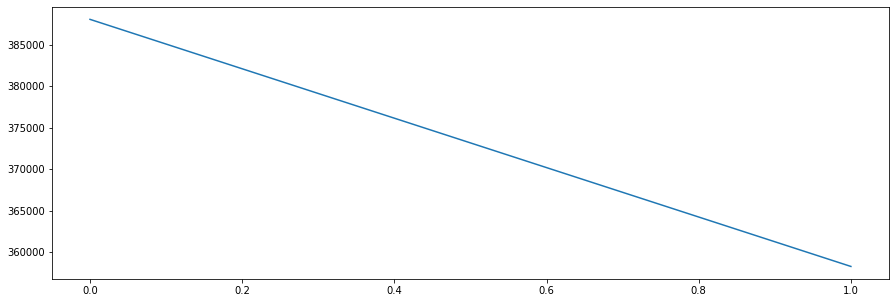

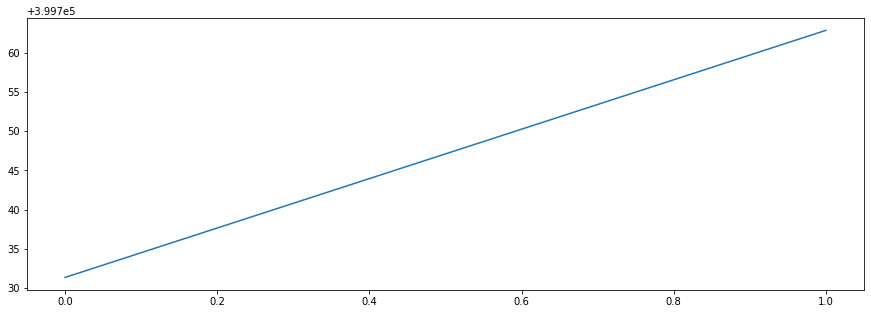

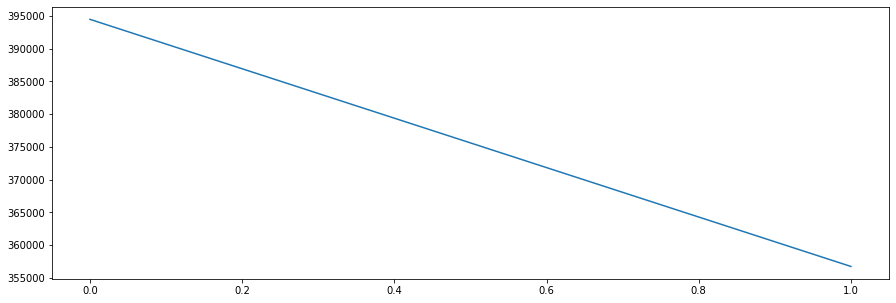

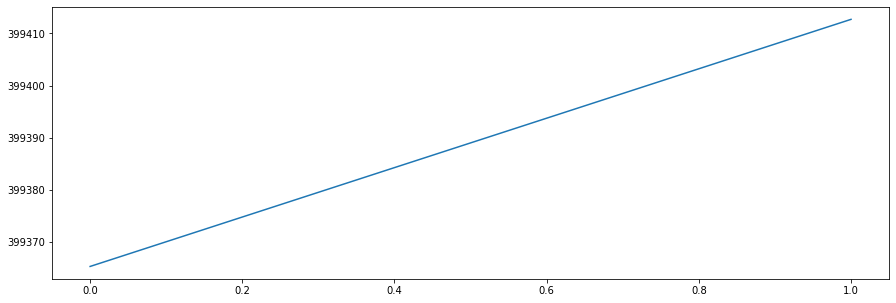

In [106]:
new_model = learn(19, 5000, 200, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(894218.3750) tensor(894218.3750)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(746865.5000) tensor(746865.5000)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(746146.3750) tensor(746146.3750)
epoch: 12
epoch:  12 loss: 701235.1250000000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(755987.) tensor(755987.)
epoch: 2
bast model hidden size: 50
epoch: 3
epoch:   3 loss: 738029.6875000000
epoch: 0
bast model hidden size: 100
tensor(769006.4375) tensor(768813.8750)
epoch:   1 loss: 784729.0625000000
epoch: 0
bast model hidden size: 200
tensor(787013.6875) tensor(786413.8125)
epoch:   1 loss: 843288.3750000000
epoch: 0
bast mo

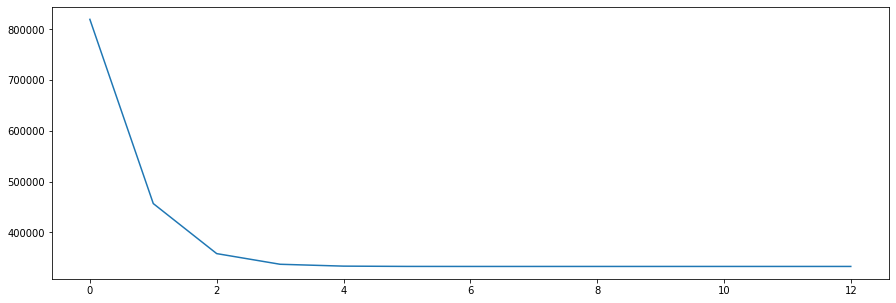

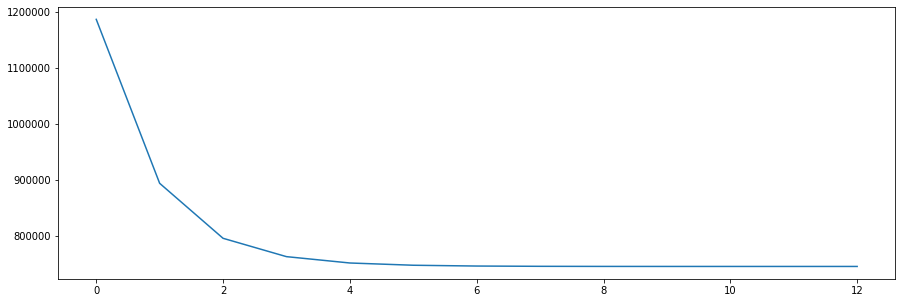

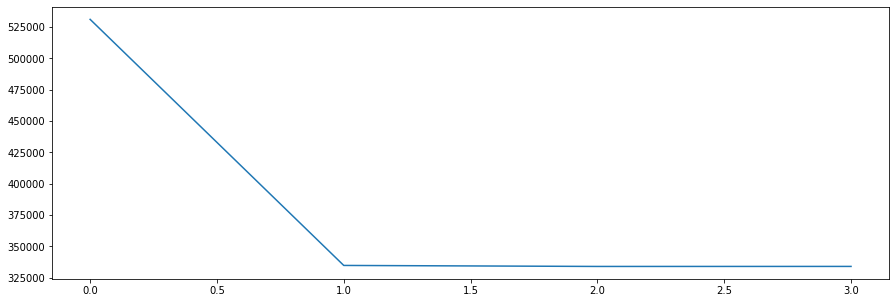

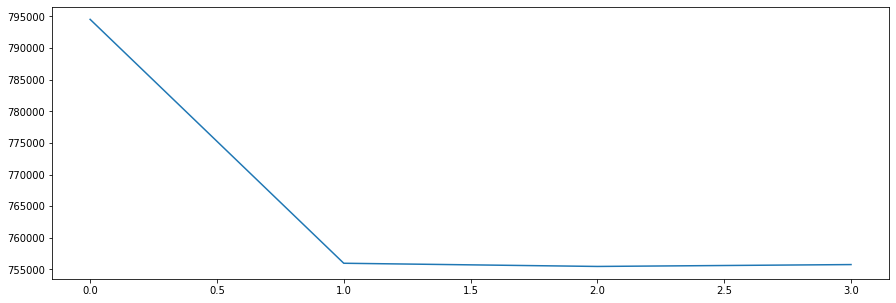

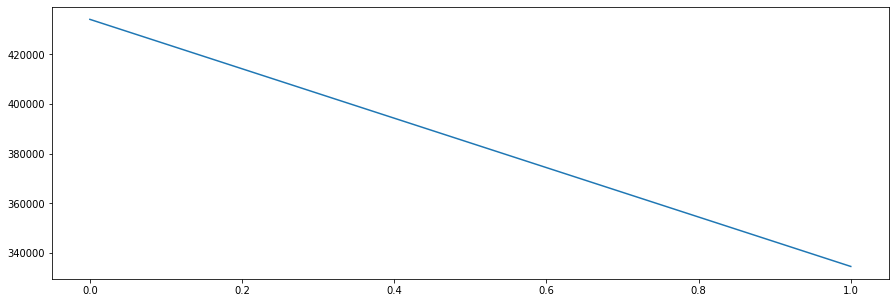

...

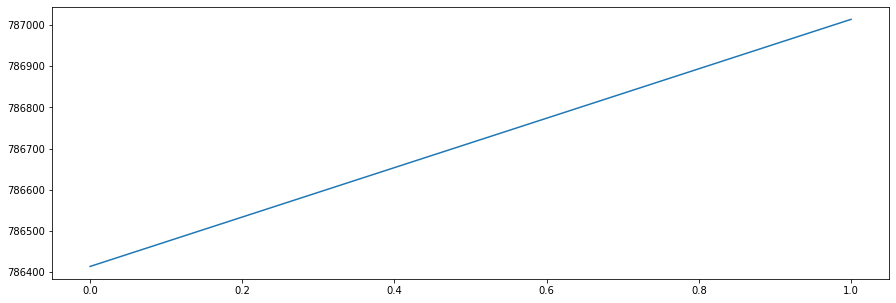

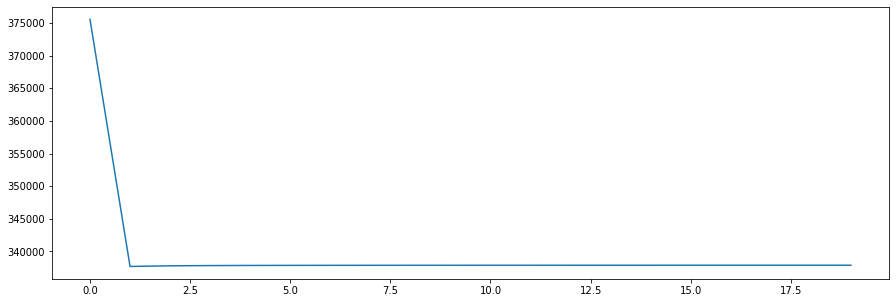

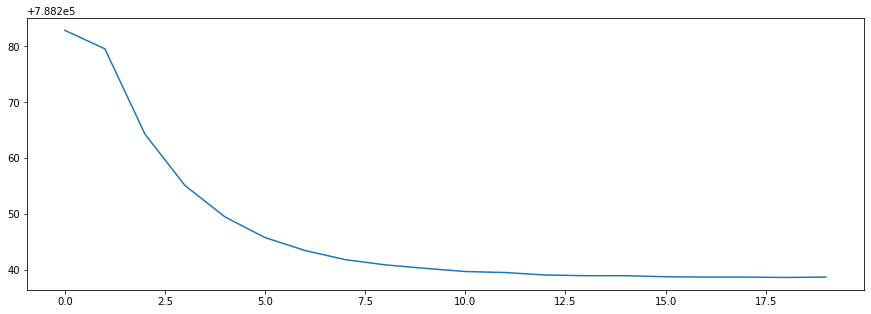

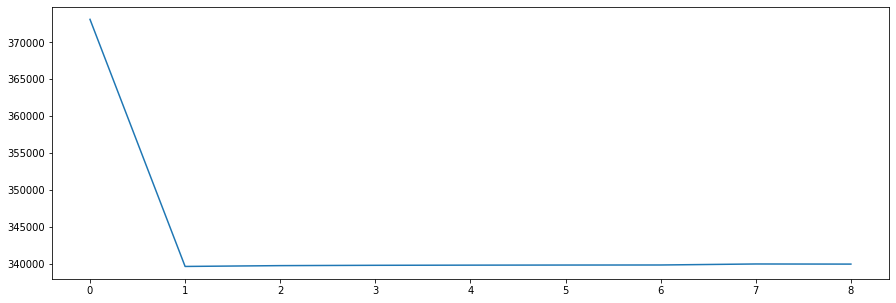

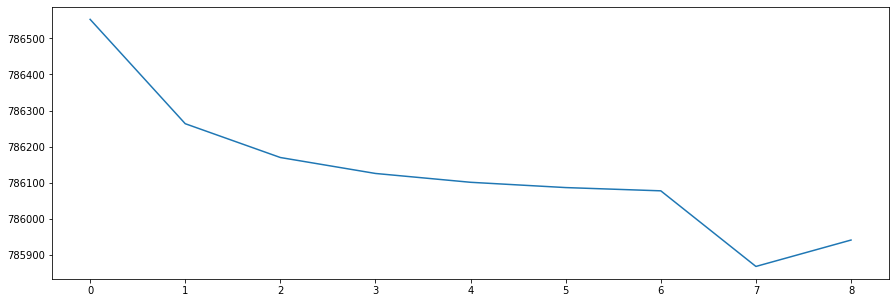

In [107]:
new_model = learn(19, 5000, 250, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(763723.2500) tensor(763723.2500)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(392909.8750) tensor(392909.8750)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(360537.8750) tensor(360537.8750)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(357312.3750) tensor(357312.3750)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 28937.9277343750
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(356012.6875) tensor(356012.687

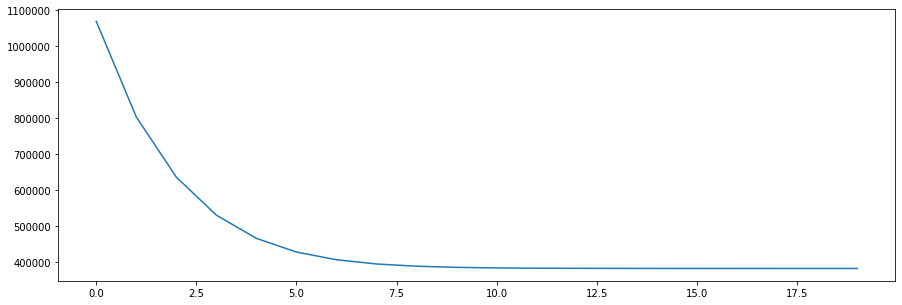

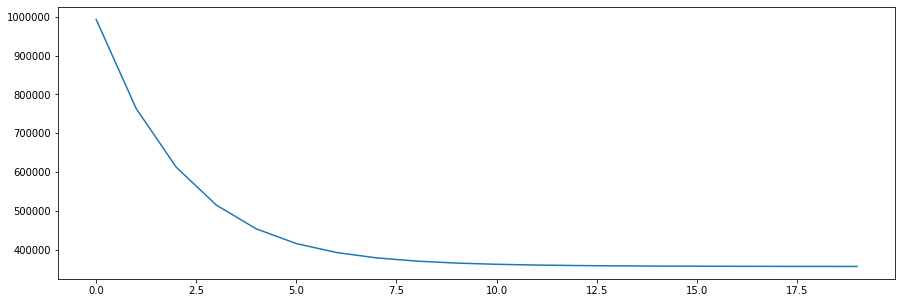

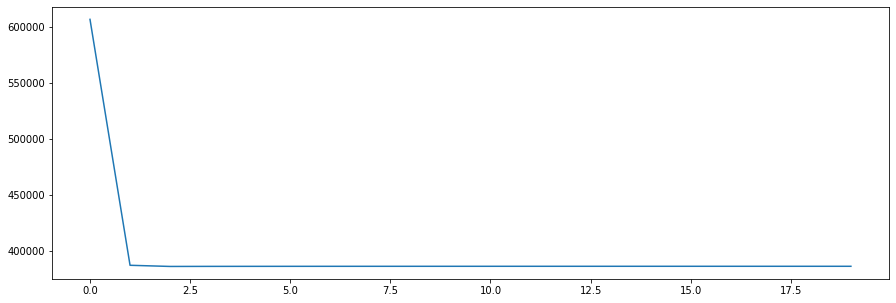

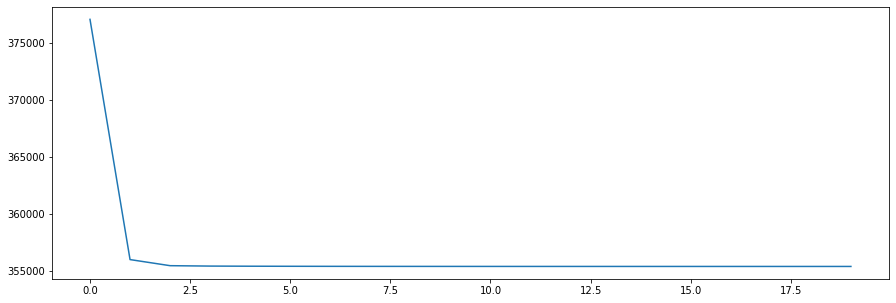

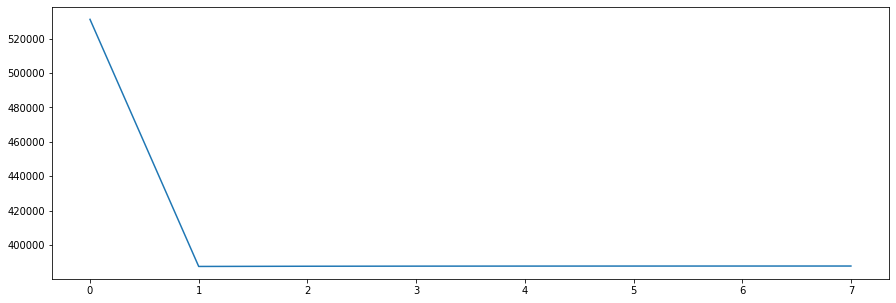

...

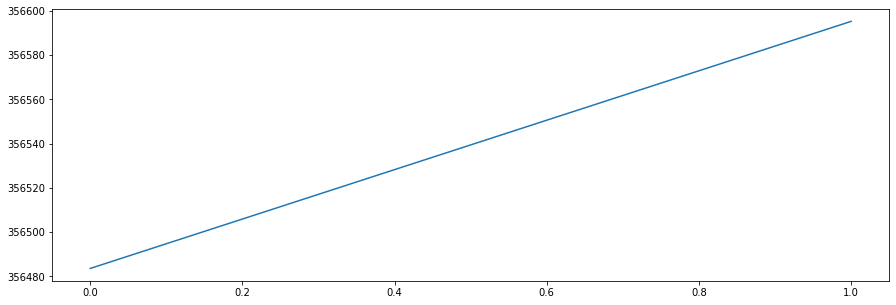

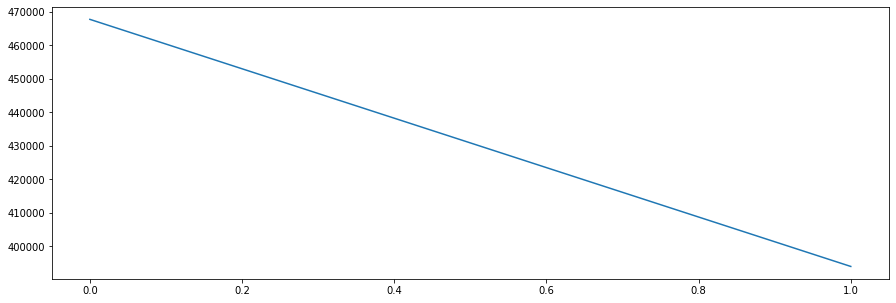

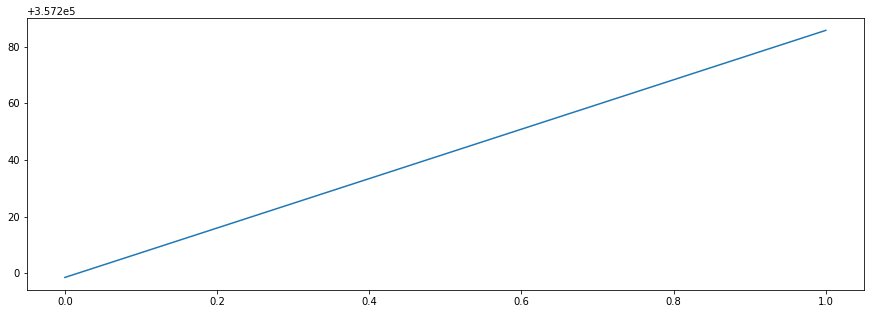

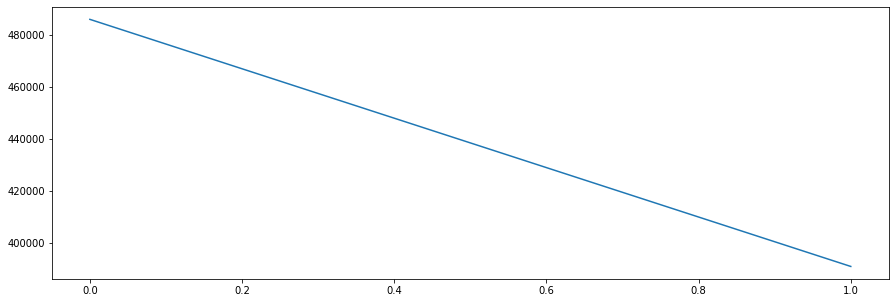

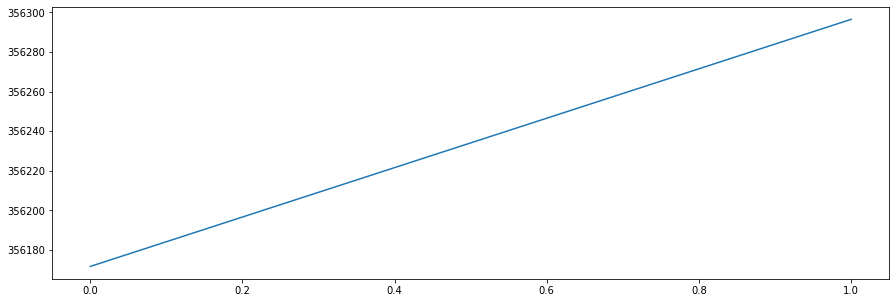

In [108]:
new_model = learn(19, 5000, 300, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(474577.8750) tensor(474577.8750)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
tensor(323983.8438) tensor(319700.8750)
epoch:   6 loss: 56442.6289062500
epoch: 0
bast model hidden size: 50
tensor(337566.8125) tensor(320906.4375)
epoch:   1 loss: 91851.1484375000
epoch: 0
bast model hidden size: 100
tensor(344477.8750) tensor(335815.5312)
epoch:   1 loss: 106403.7031250000
epoch: 0
bast model hidden size: 200
tensor(345816.6562) tensor(345596.0625)
epoch:   1 loss: 108820.9062500000
epoch: 0
bast model hidden size: 250
tensor(346934.3125) tensor(346640.6875)
epoch:   1 loss: 110939.7734375000
epoch: 0
bast model hidden size: 300
tensor(352534.3750) tensor(351160.2188)
epoch:   1 loss: 121617.4140625000
0.04213392661335079
92.50408020560964


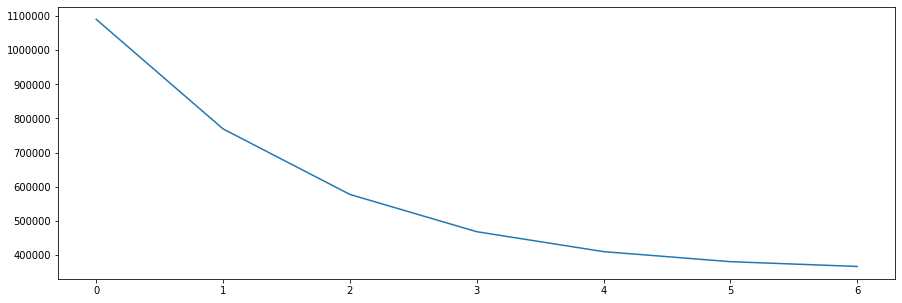

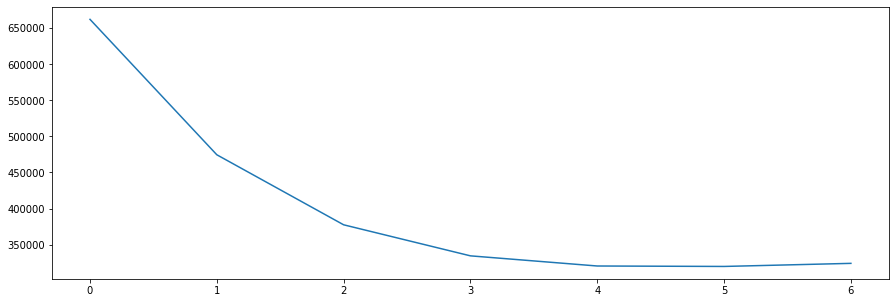

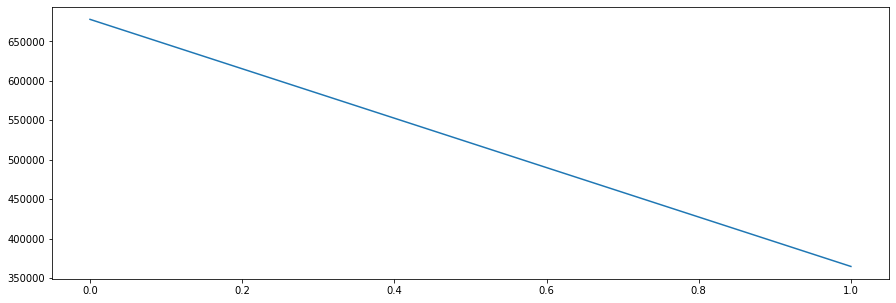

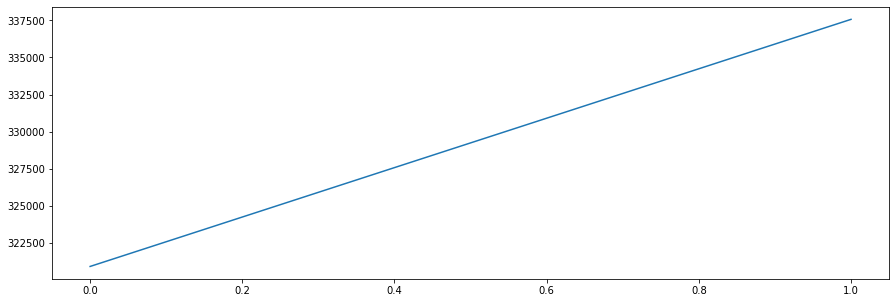

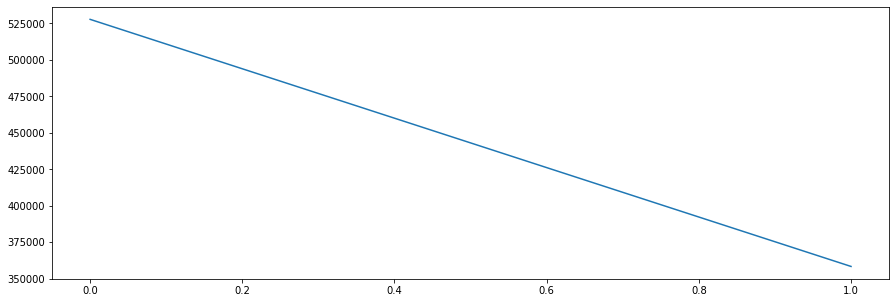

...

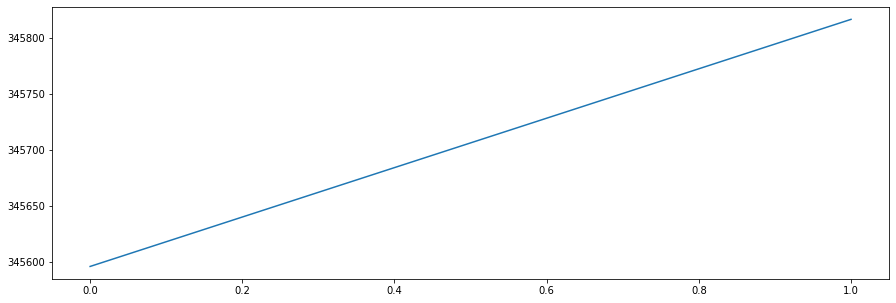

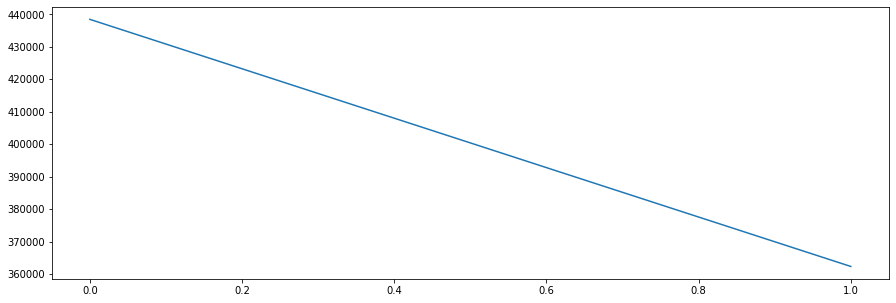

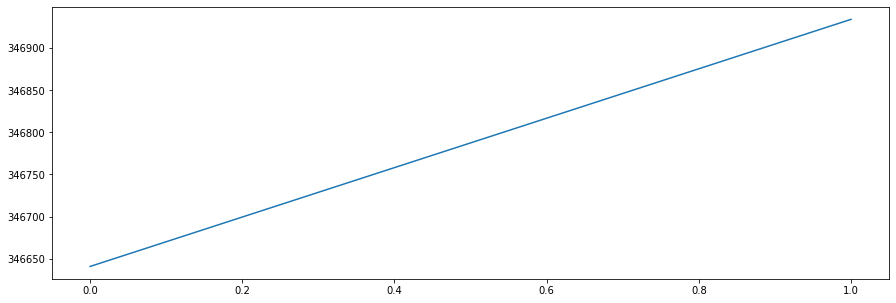

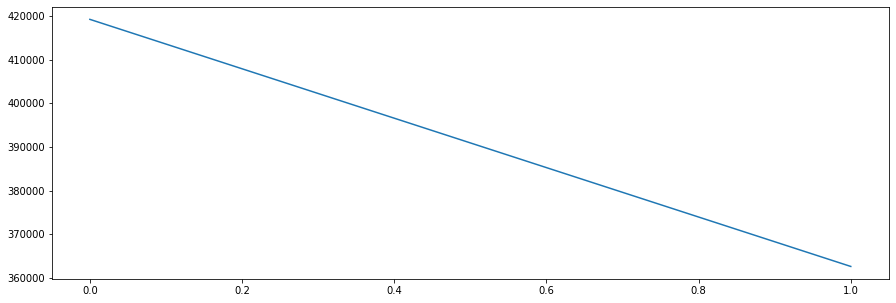

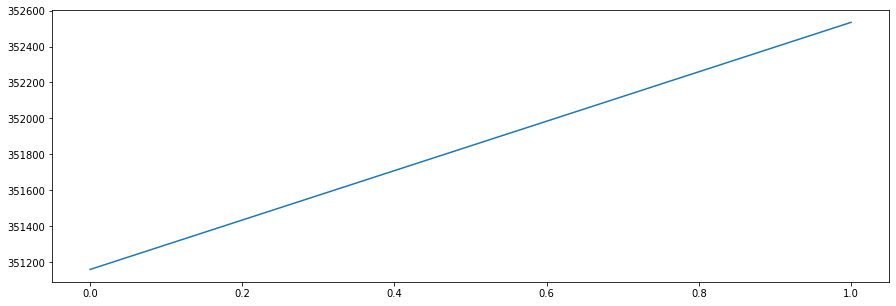

In [109]:
new_model = learn(19, 5000, 350, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(732208.6250) tensor(732208.6250)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(386101.8750) tensor(386101.8750)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(367261.3438) tensor(367261.3438)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(365867.7188) tensor(365867.7188)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 15322.9023437500
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(378380.0938) tensor(378380.093

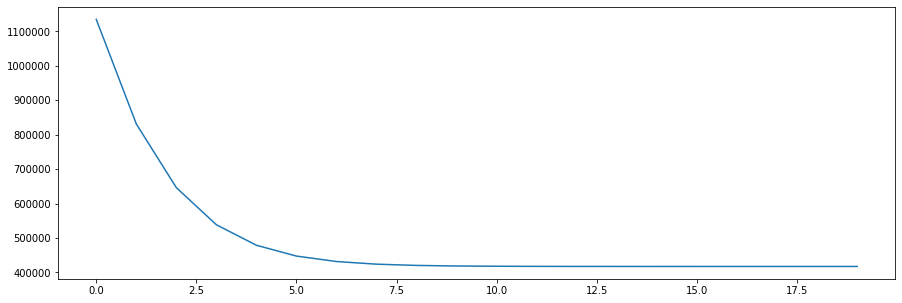

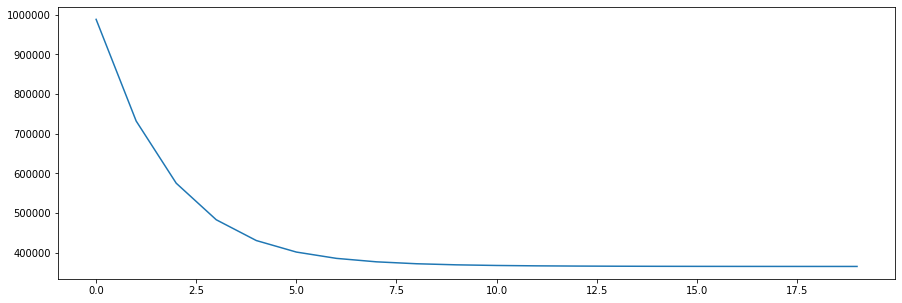

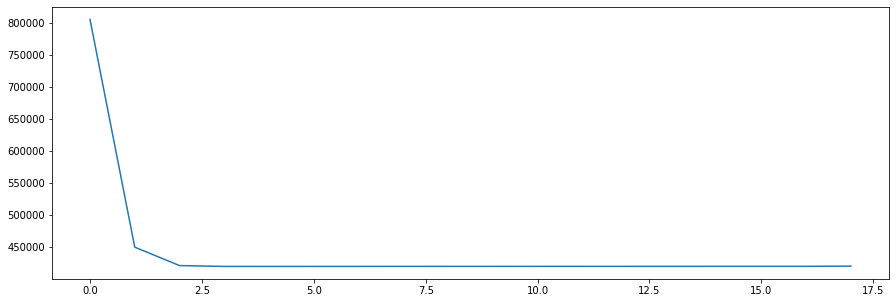

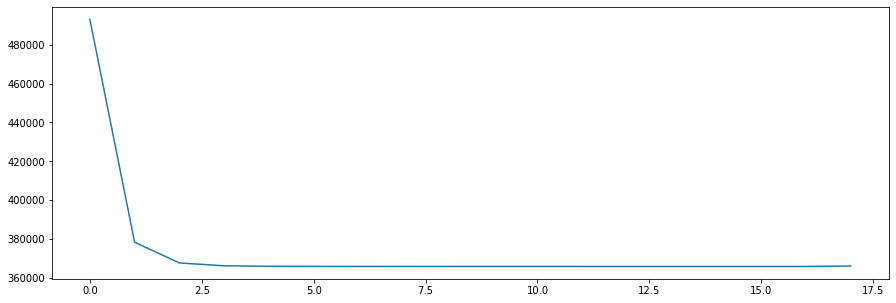

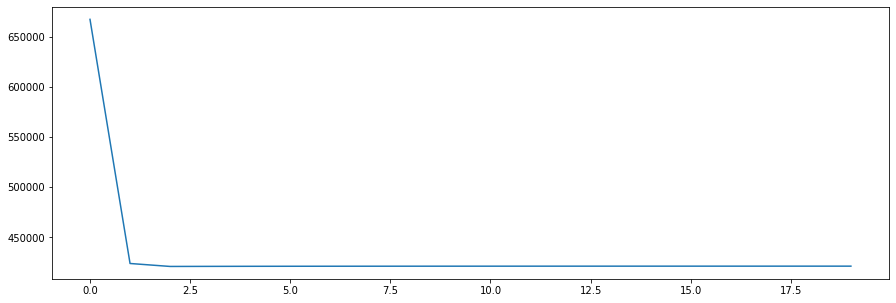

...

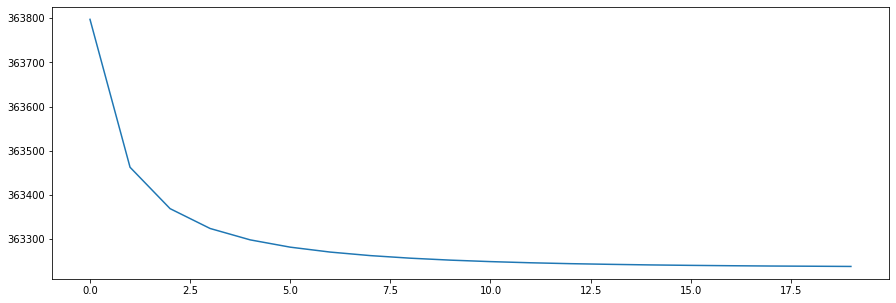

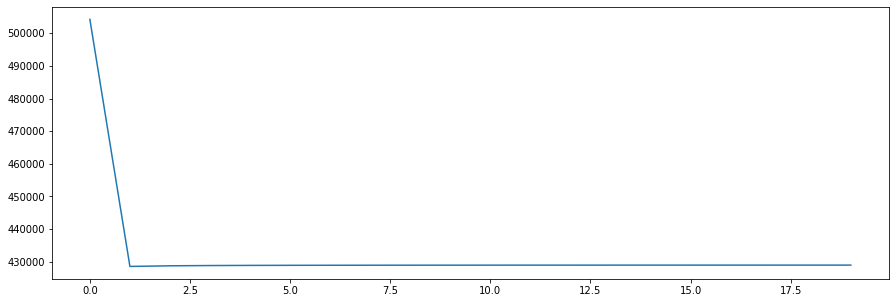

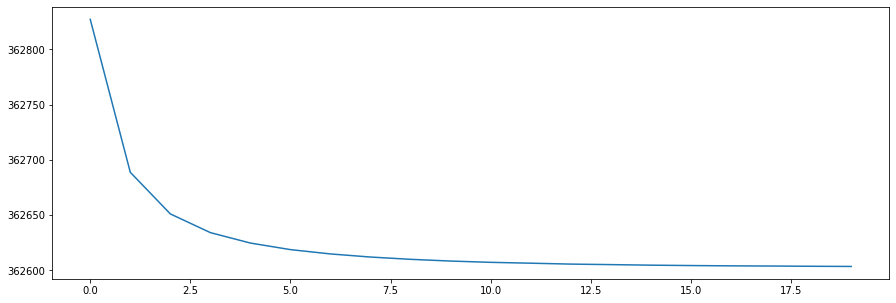

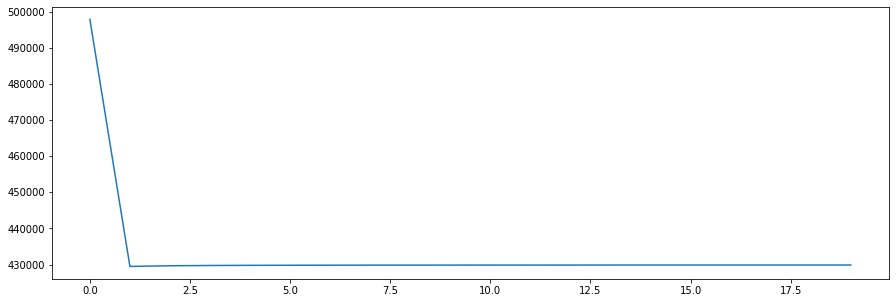

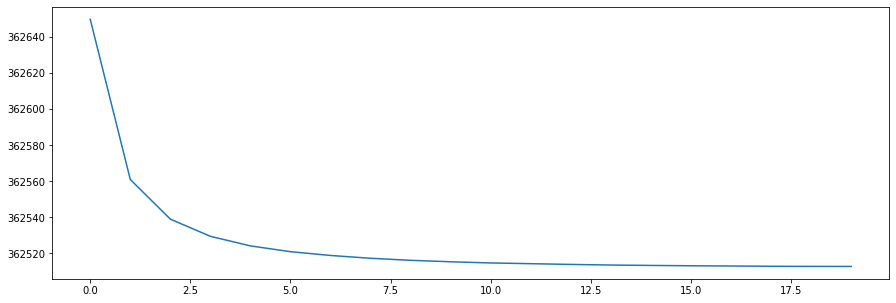

In [110]:
new_model = learn(19, 5000, 400, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(1348988.7500) tensor(1348988.7500)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(785814.) tensor(785814.)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(696735.2500) tensor(696735.2500)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(683556.6875) tensor(683556.6875)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 41215.0937500000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(702126.2500) tensor(702126.2500)
epo

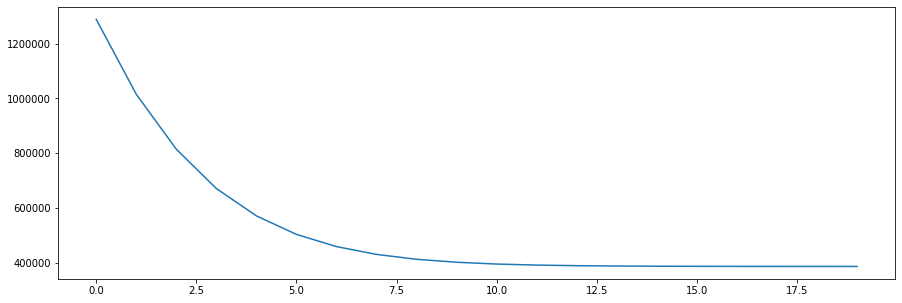

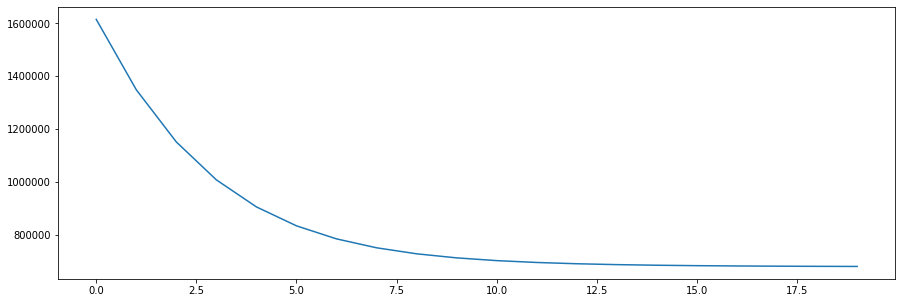

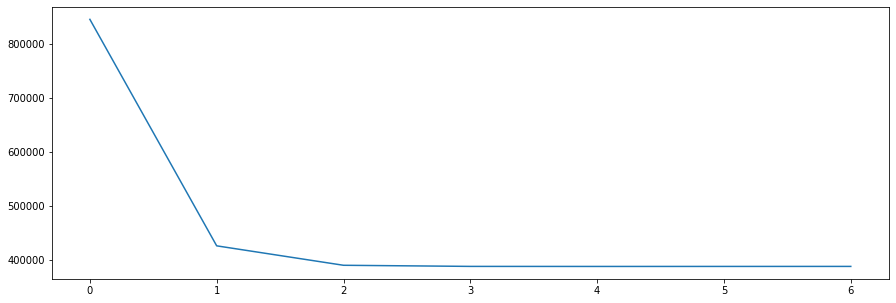

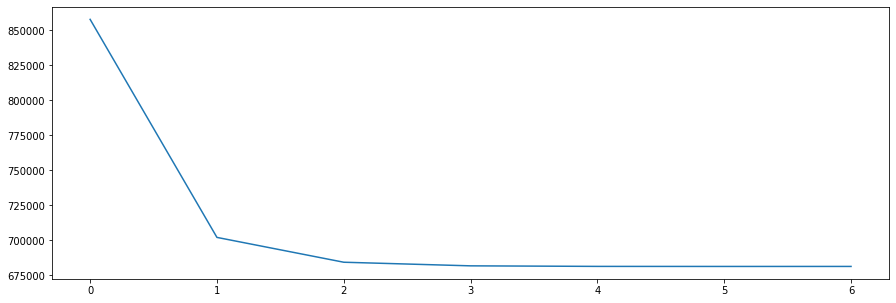

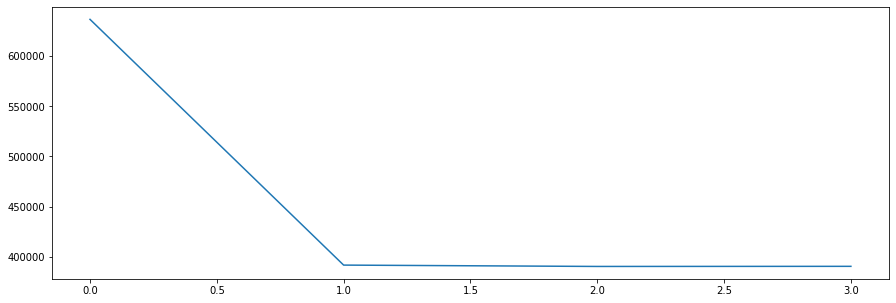

...

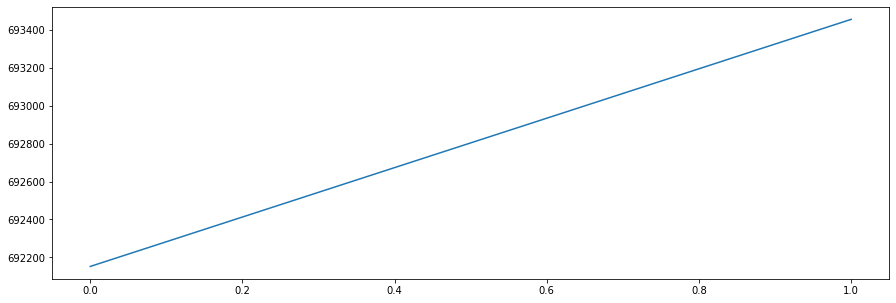

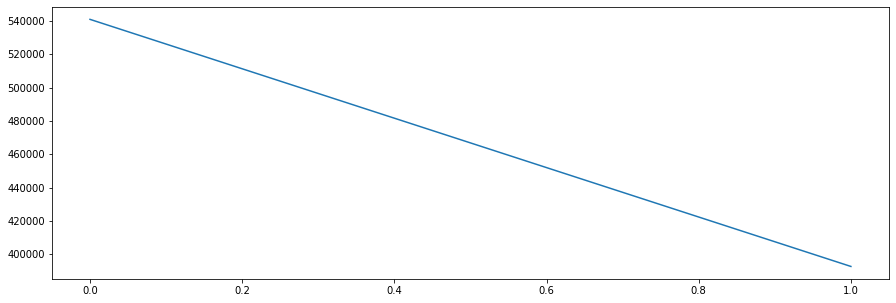

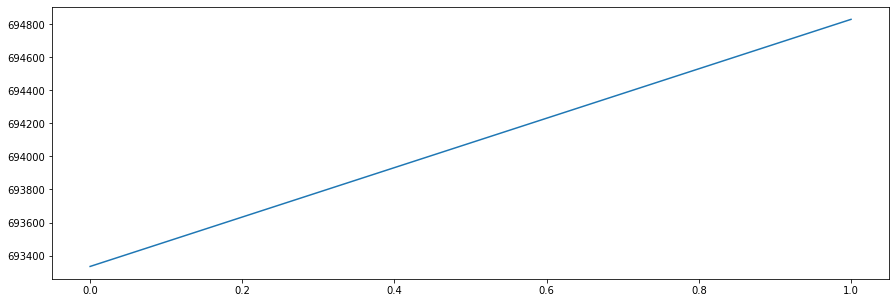

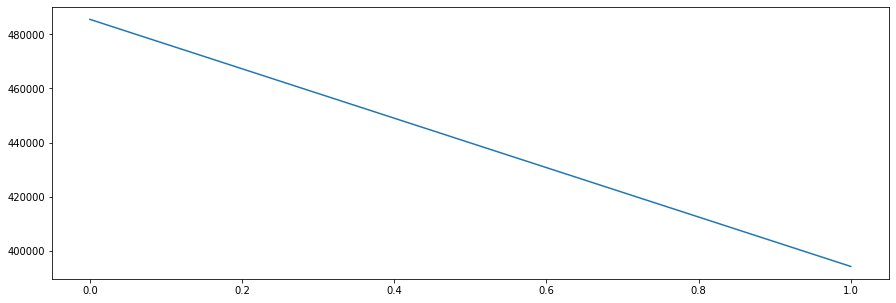

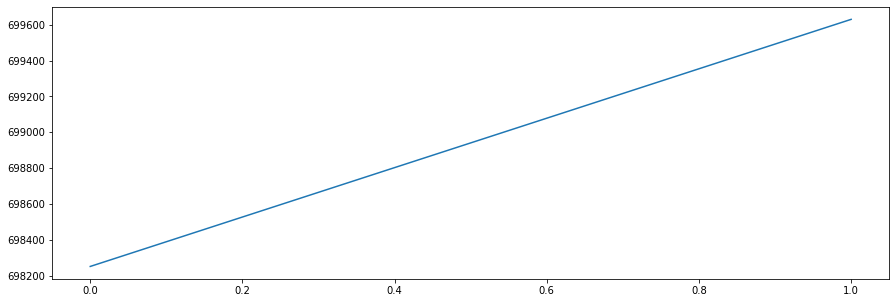

In [111]:
new_model = learn(19, 5000, 450, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(644418.7500) tensor(644418.7500)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(344981.7188) tensor(344981.7188)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
epoch:   9 loss: 445211.5937500000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(340665.1875) tensor(340665.1875)
epoch: 2
epoch:   2 loss: 409652.6250000000
epoch: 0
bast model hidden size: 100
bast model hidden size: 100
tensor(344191.6562) tensor(344191.6562)
epoch: 2
epoch:   2 loss: 382965.4375000000
epoch: 0
bast model hidden size: 200
tensor(346679.) tensor(341750.1250)
epoch:   1 loss: 385323.6875000000
epoch: 0
bast model hidden size: 250
tensor(347369.8125) tensor(344650.5625)
epoch:   1 loss: 382031.8750000000
epoch: 0
bast model hidden size: 300
ten

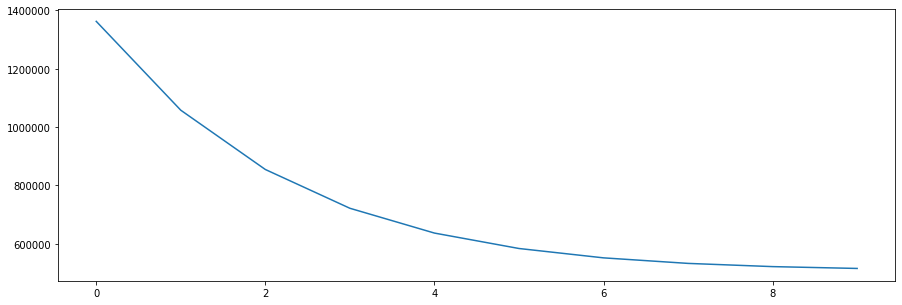

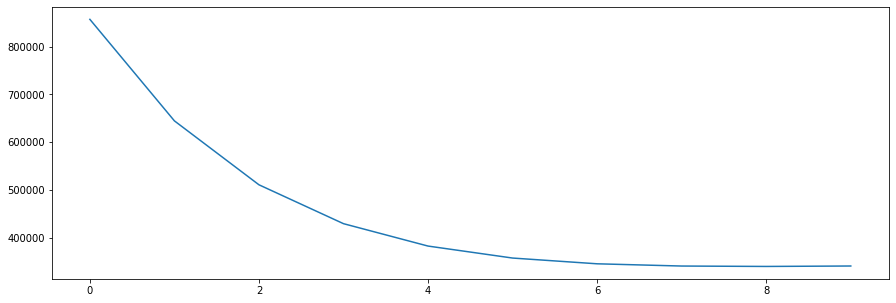

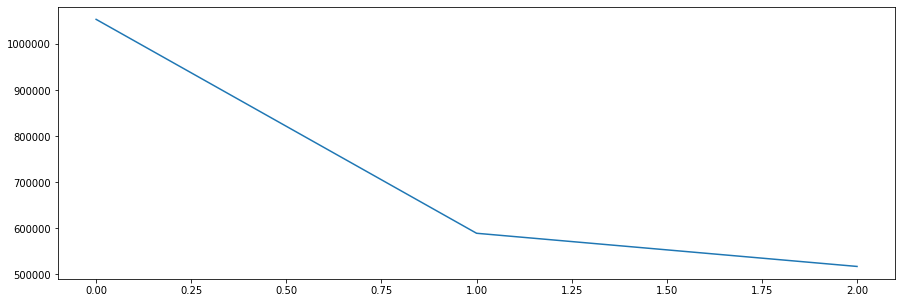

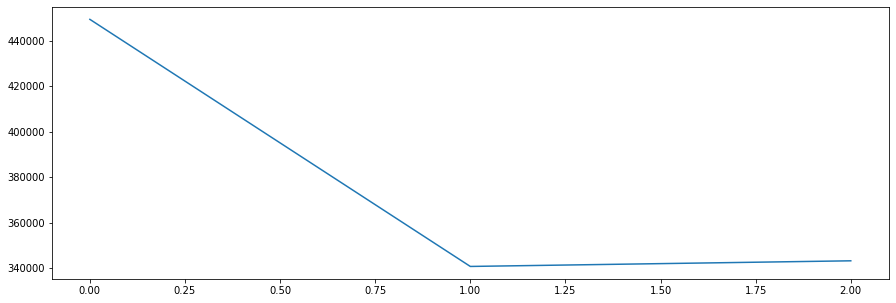

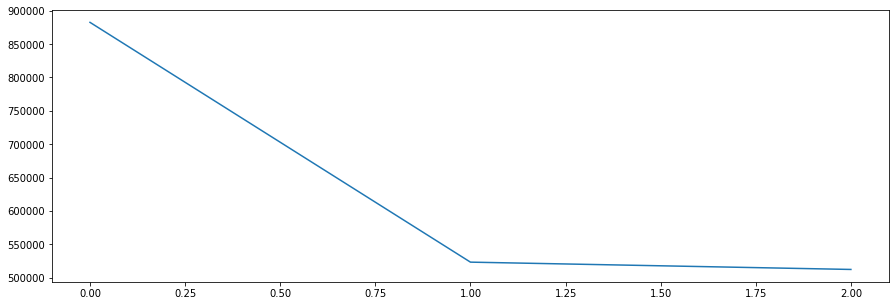

...

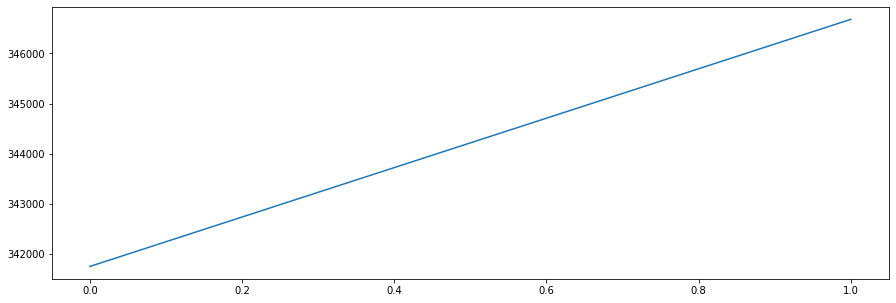

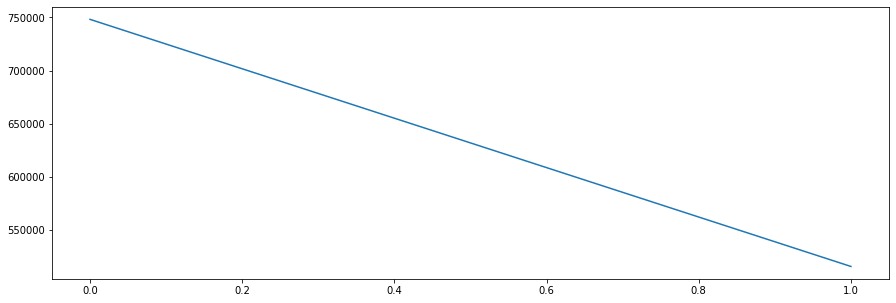

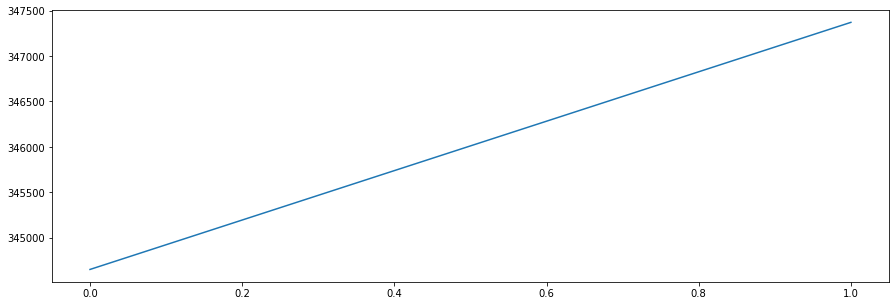

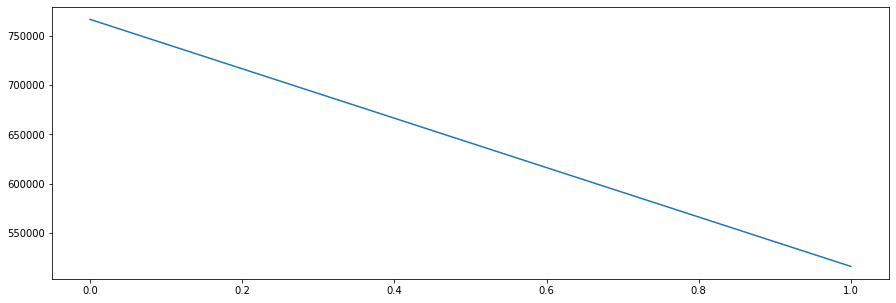

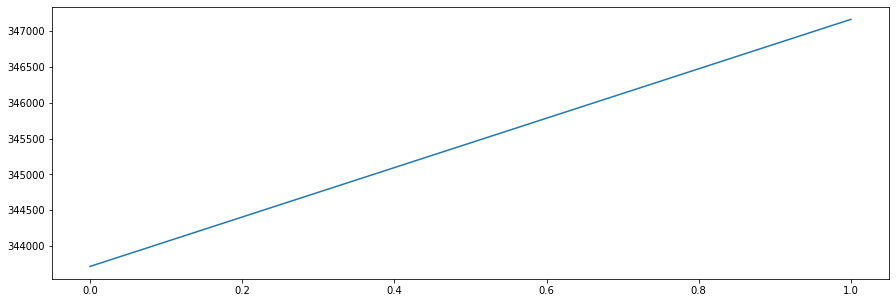

In [112]:
new_model = learn(19, 5000, 500, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(729054.0625) tensor(729054.0625)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(382686.6250) tensor(382686.6250)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(318709.6875) tensor(318709.6875)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
epoch:  14 loss: 492367.0312500000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(325514.7188) tensor(325514.7188)
epoch: 2
bast model hidden size: 50
epoch: 3
epoch:   3 loss: 574946.3125000000
epoch: 0
bast model hidden size: 100
bast model hidden size: 100
tensor(321153.8438) tensor(321153.8438)
epoch: 2
epoch:   2 loss: 581070.5000000000
epoch: 0


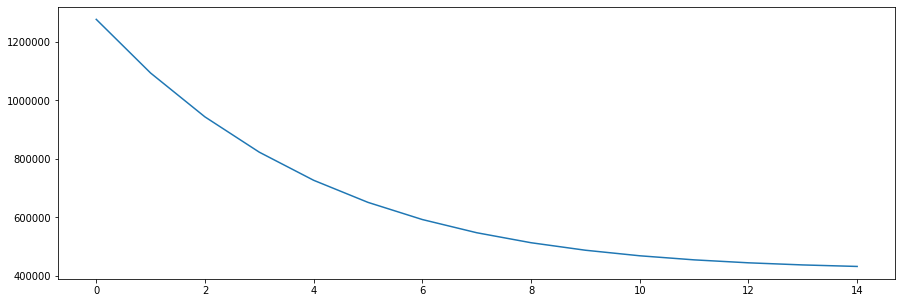

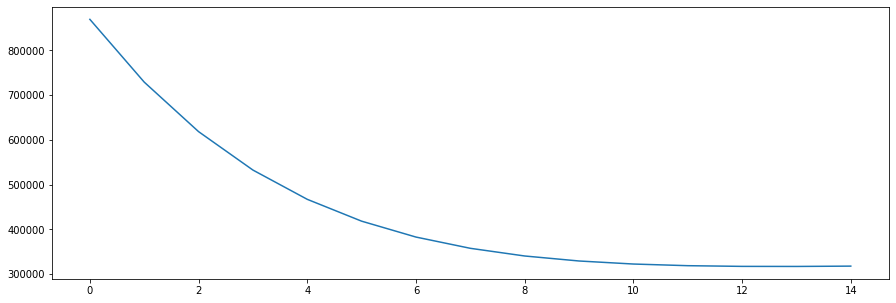

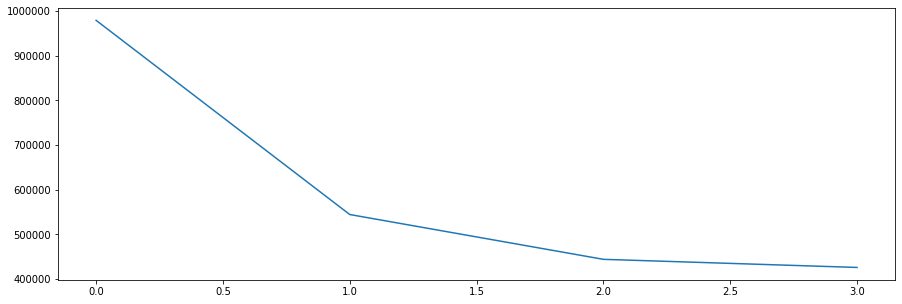

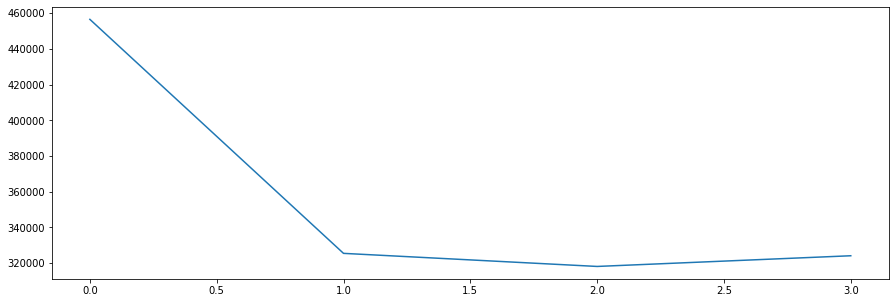

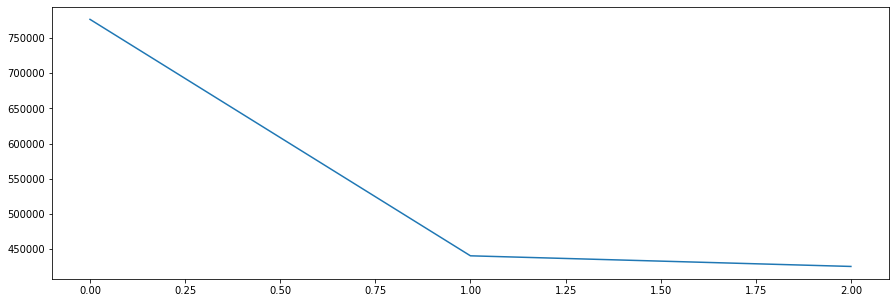

...

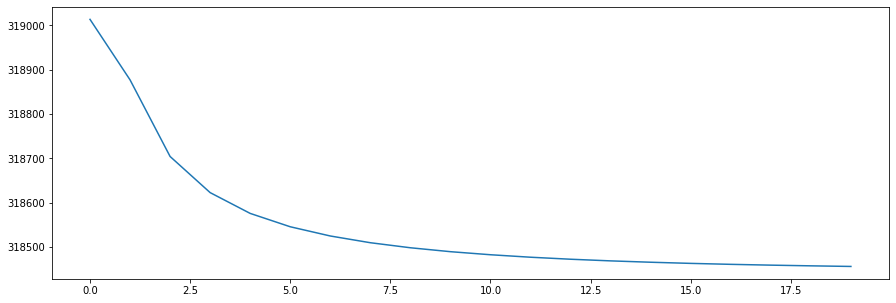

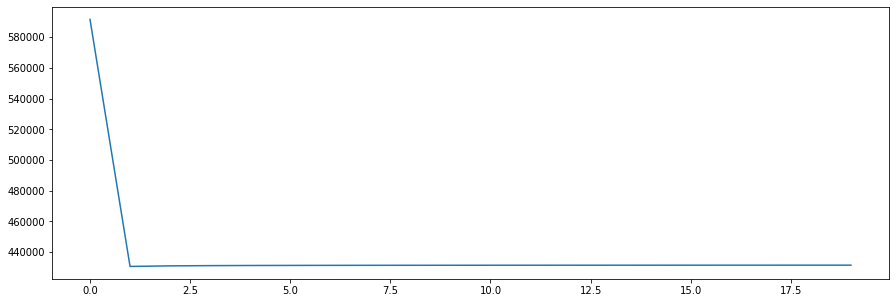

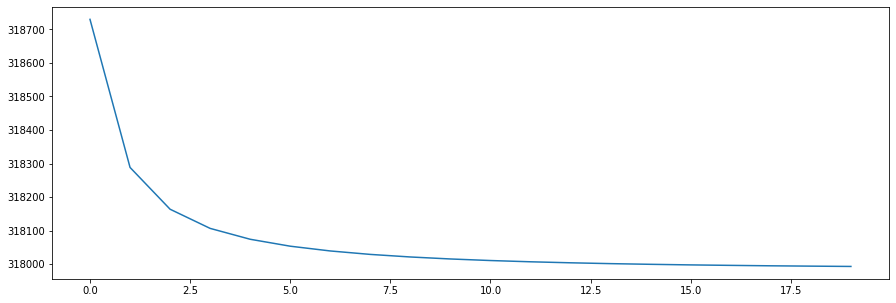

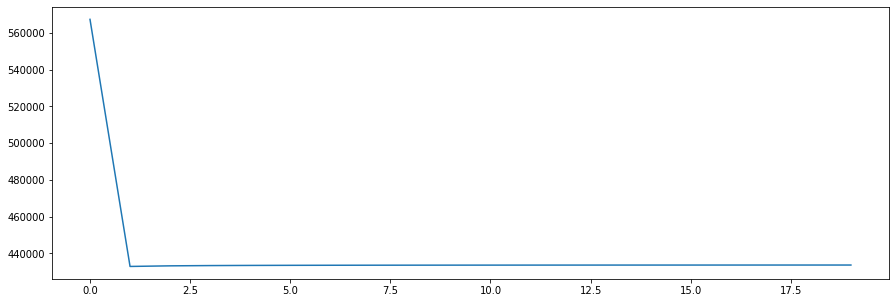

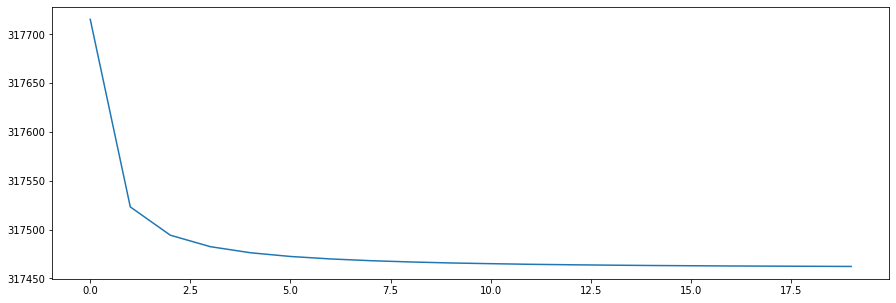

In [113]:
new_model = learn(19, 5000, 550, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(1636787.6250) tensor(1636787.6250)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(1012137.0625) tensor(1012137.0625)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(872315.8750) tensor(872315.8750)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(841810.3750) tensor(841810.3750)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 54911.5820312500
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(1045642.5000) tensor(10456

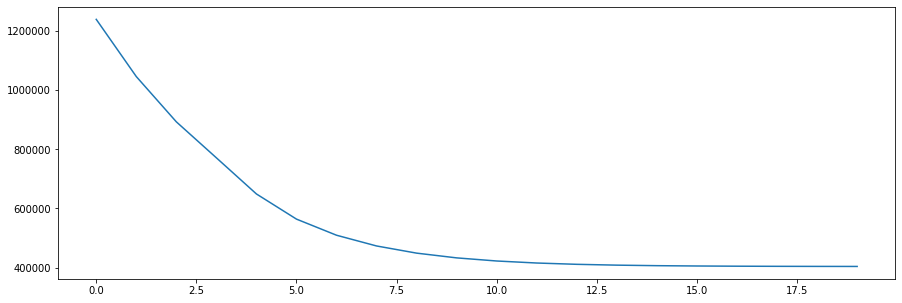

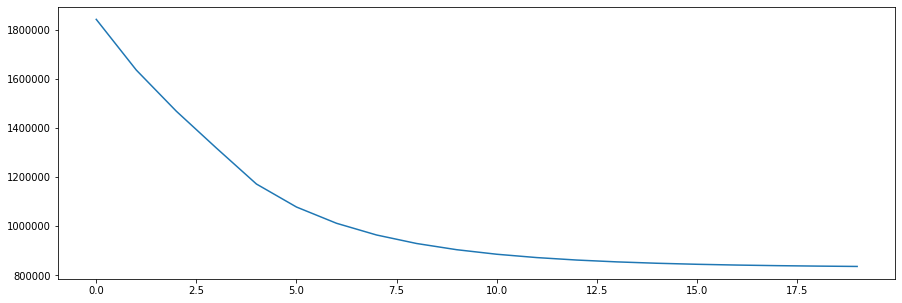

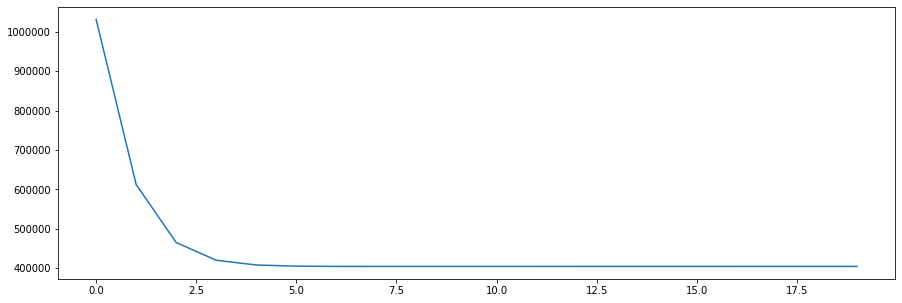

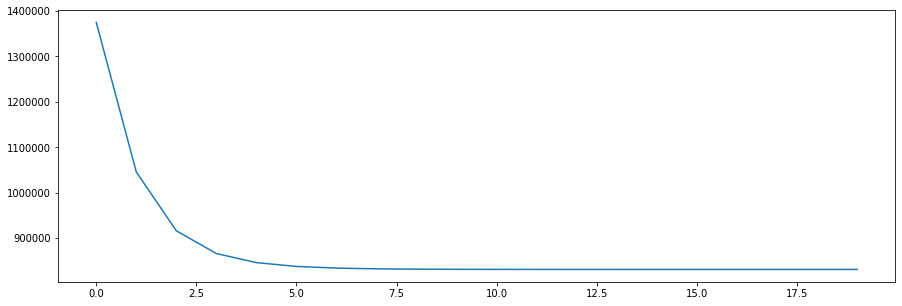

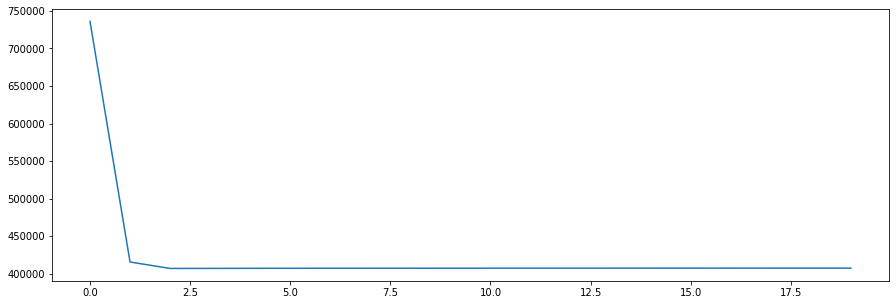

...

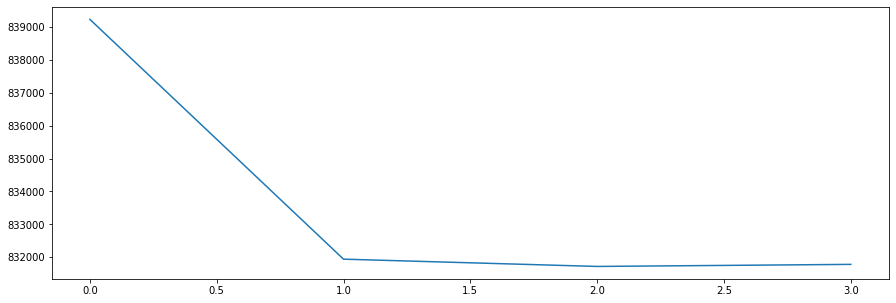

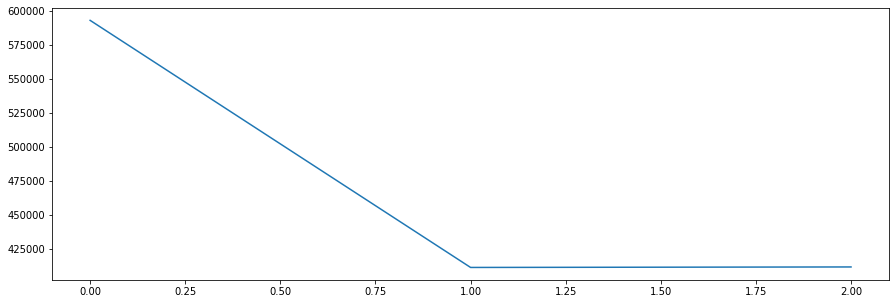

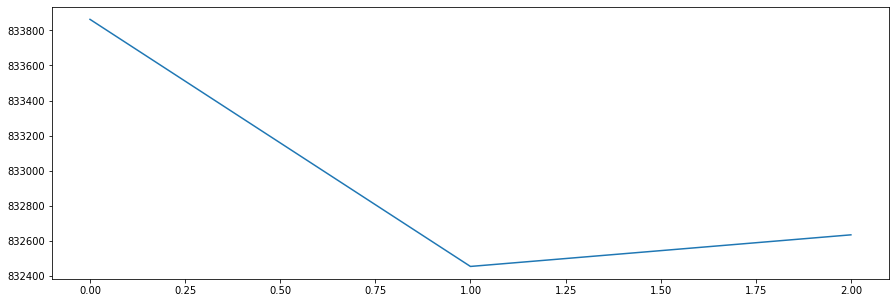

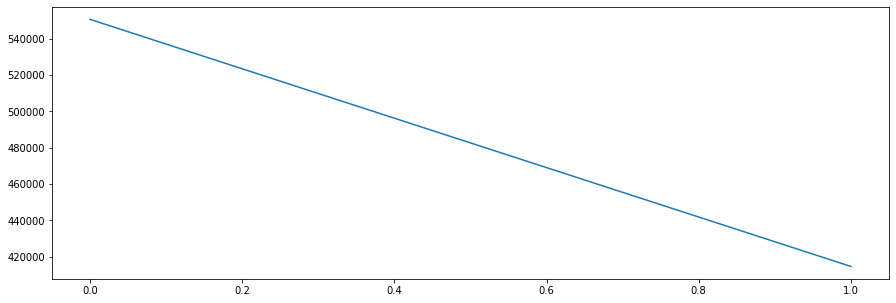

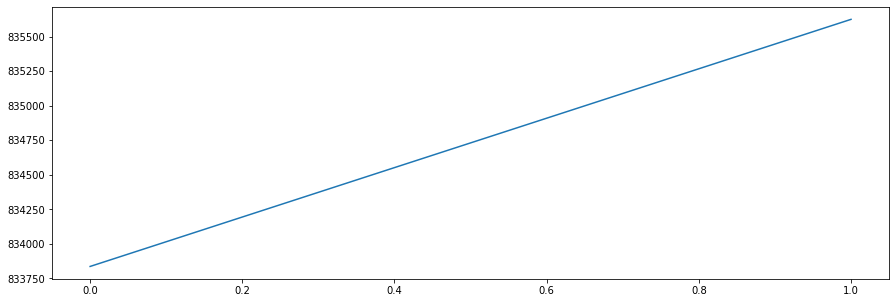

In [114]:
new_model = learn(19, 5000, 600, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(488383.8438) tensor(488383.8438)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(269996.7500) tensor(269996.7500)
epoch: 7
epoch:   7 loss: 402709.8437500000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(285180.6250) tensor(285180.6250)
epoch: 2
bast model hidden size: 50
epoch: 3
epoch:   3 loss: 585998.1250000000
epoch: 0
bast model hidden size: 100
tensor(319436.3438) tensor(270778.5312)
epoch:   1 loss: 649672.0625000000
epoch: 0
bast model hidden size: 200
tensor(358928.2500) tensor(342326.5312)
epoch:   1 loss: 776739.6250000000
epoch: 0
bast model hidden size: 250
tensor(358685.8125) tensor(354045.0312)
epoch:   1 loss: 775761.1250000000
epoch: 0
bast model hidden size: 300
bast model hidden size: 300
tensor(356958.0625) tensor(356958.0625)
epoc

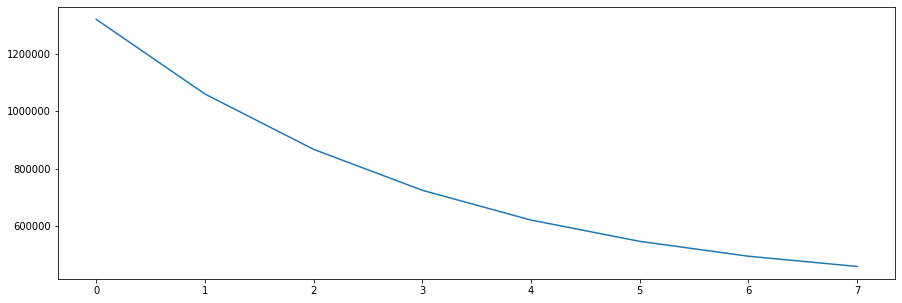

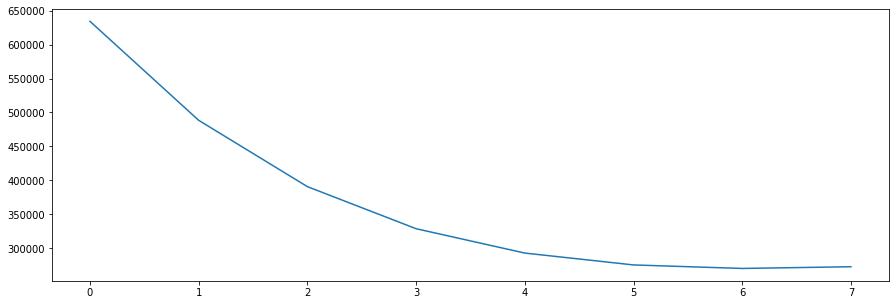

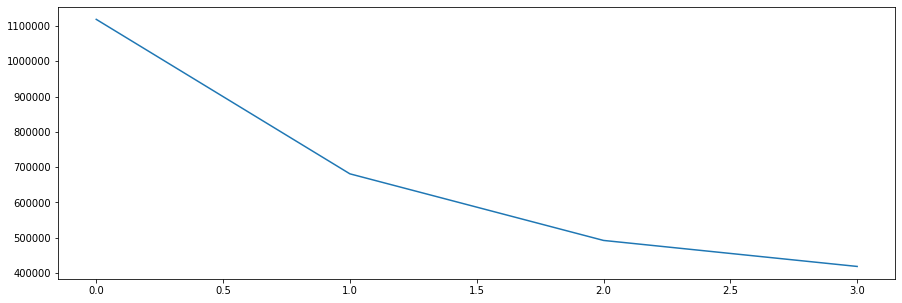

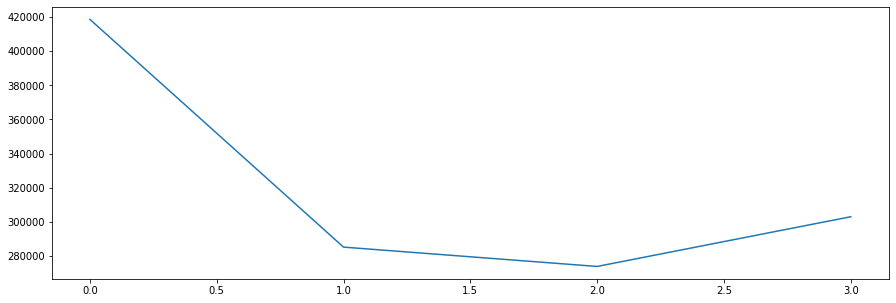

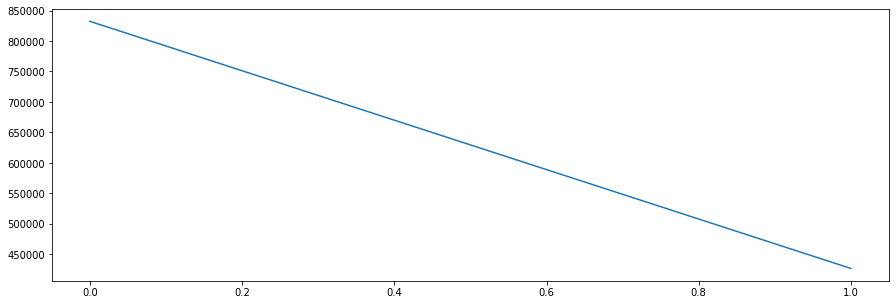

...

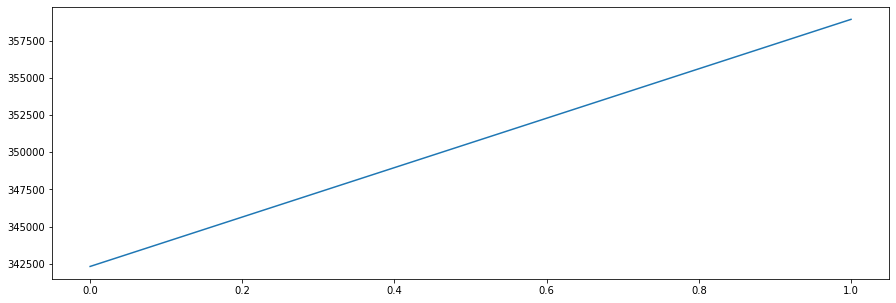

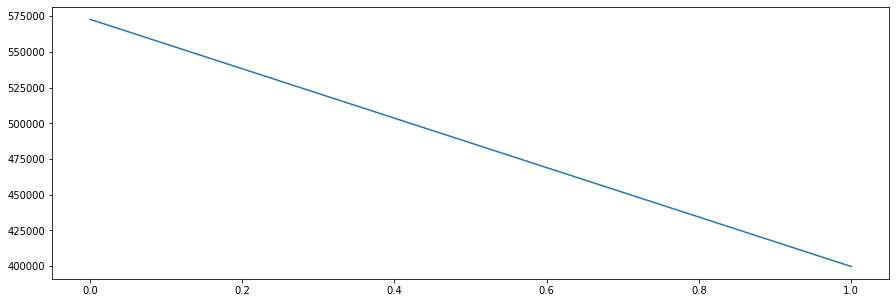

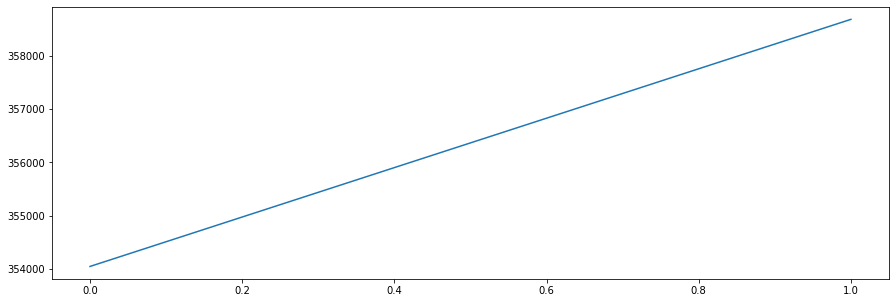

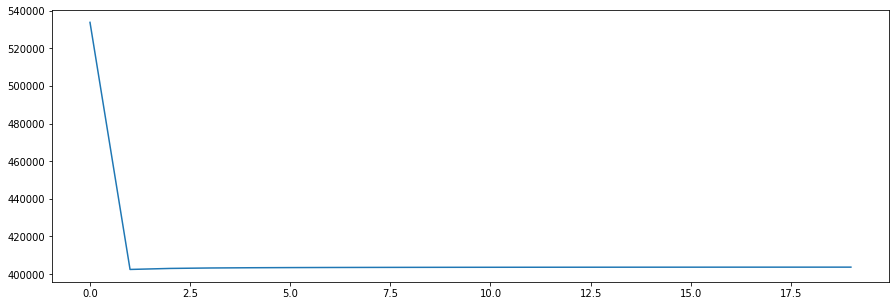

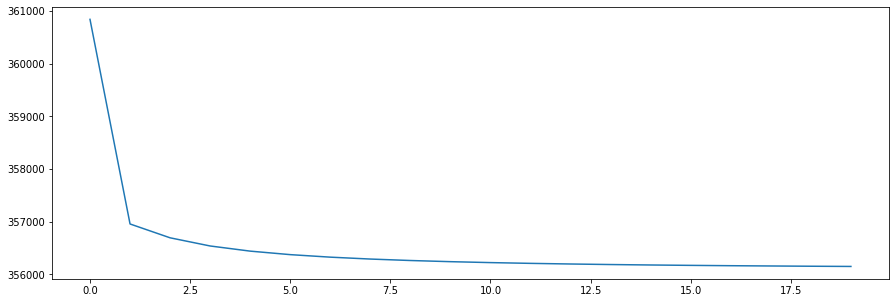

In [115]:
new_model = learn(19, 5000, 650, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(983491.1250) tensor(983491.1250)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(493055.8438) tensor(493055.8438)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(396468.5312) tensor(396468.5312)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(379596.8438) tensor(379596.8438)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 89675.0156250000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(551438.8125) tensor(551438.812

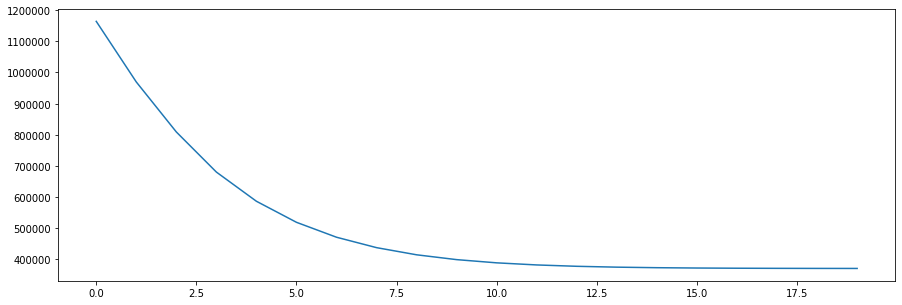

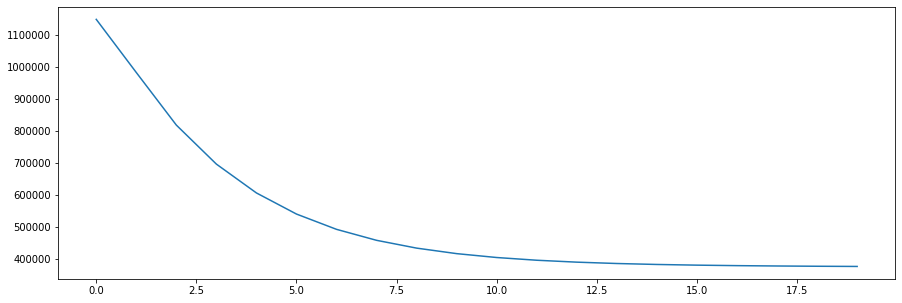

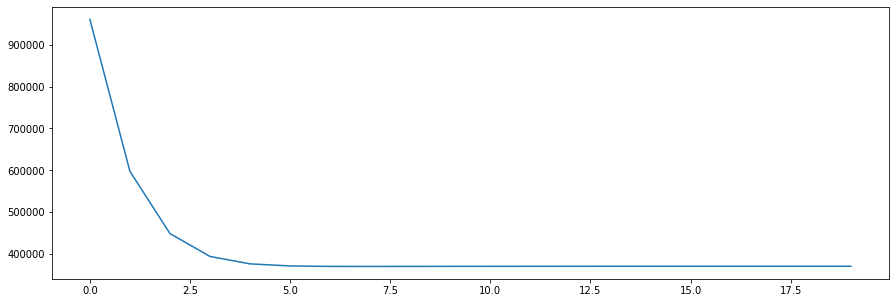

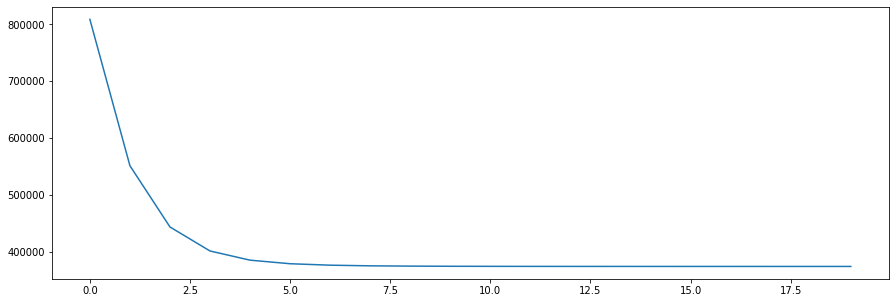

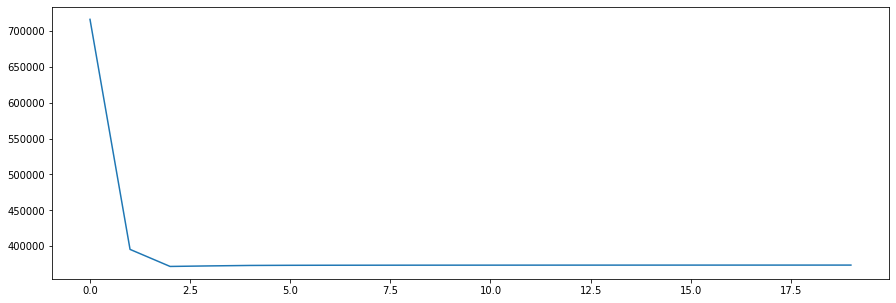

...

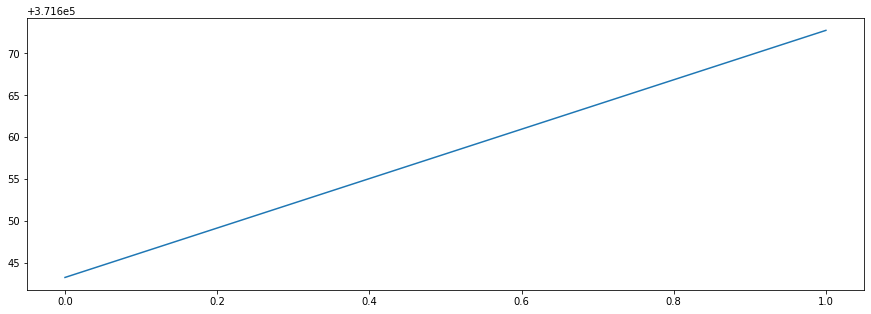

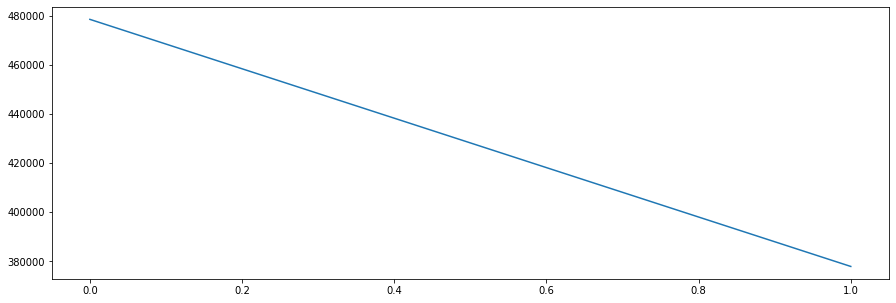

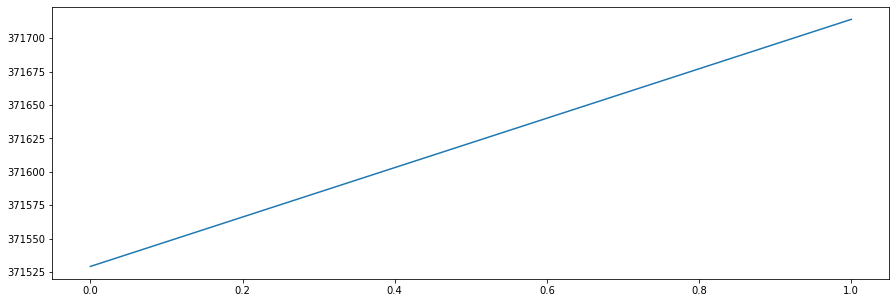

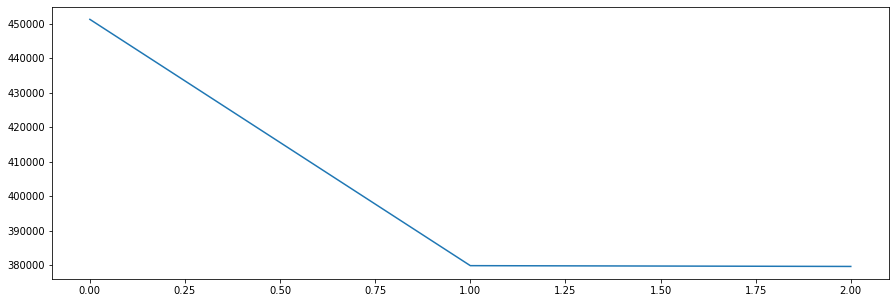

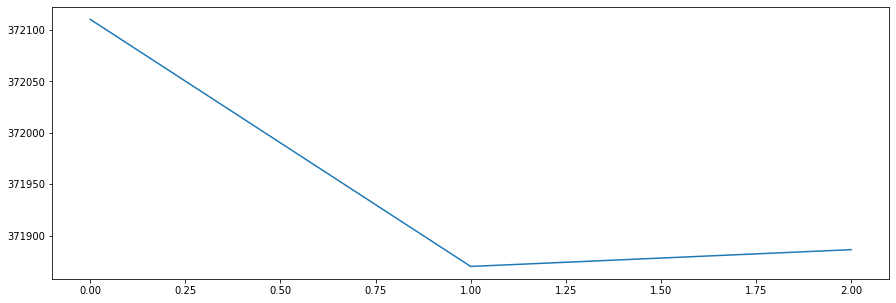

In [116]:
new_model = learn(19, 5000, 700, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(1308367.) tensor(1308367.)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(882075.3750) tensor(882075.3750)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(678930.3750) tensor(678930.3750)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(592856.8125) tensor(592856.8125)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 897501.8750000000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(686737.9375) tensor(686737.9375)
ep

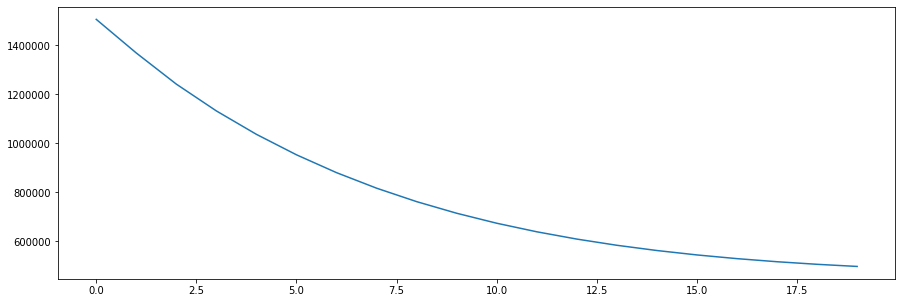

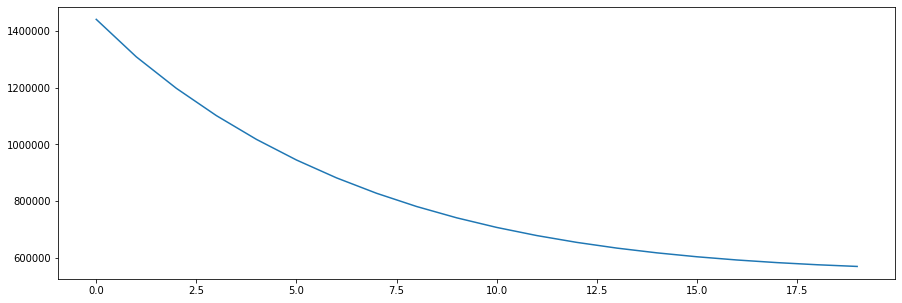

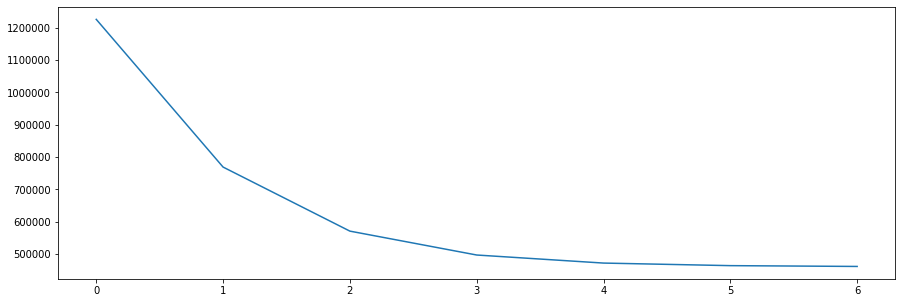

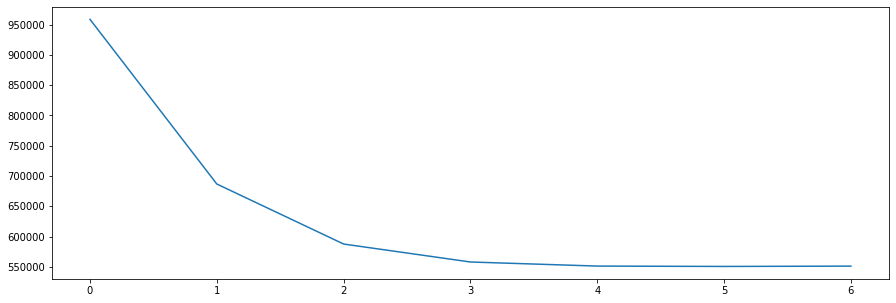

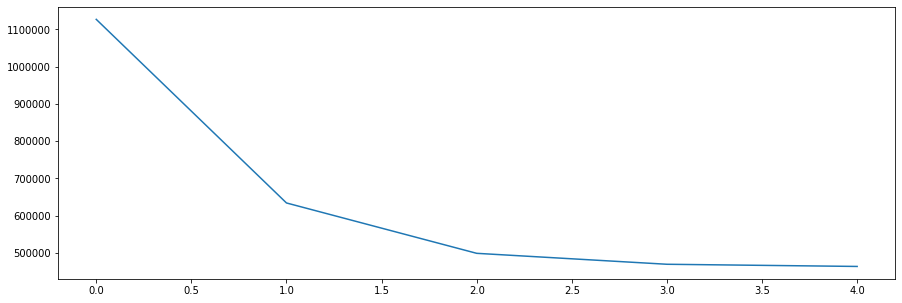

...

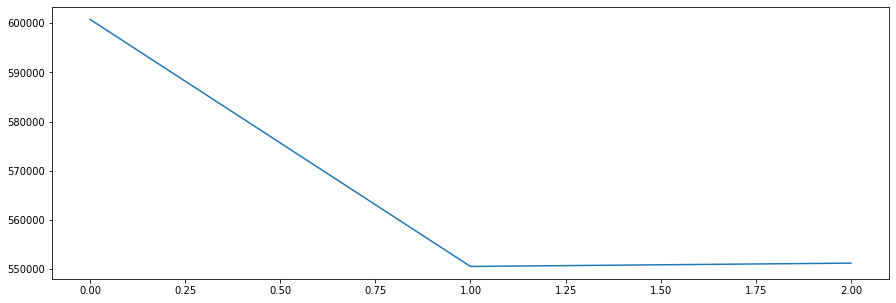

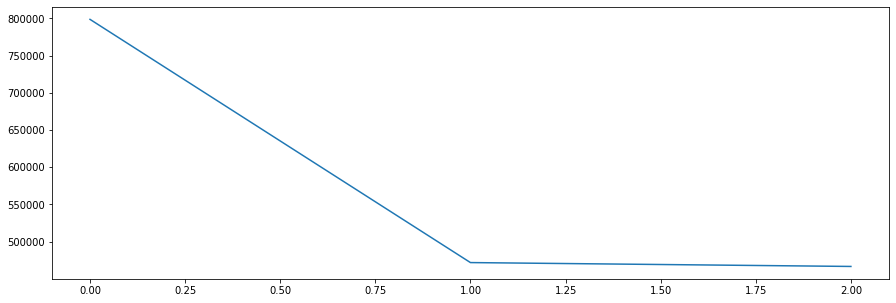

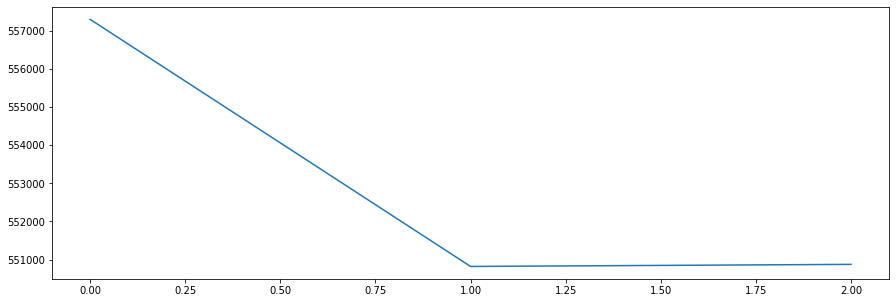

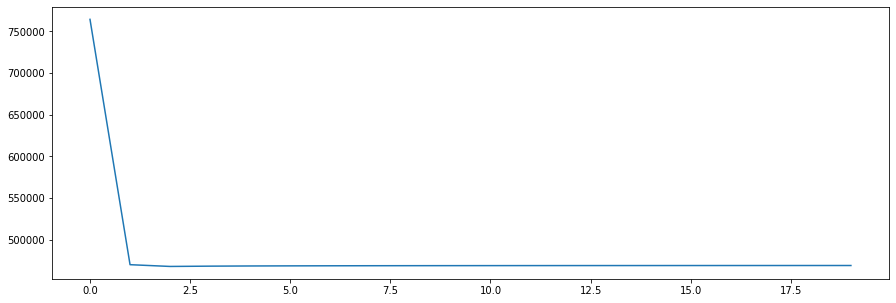

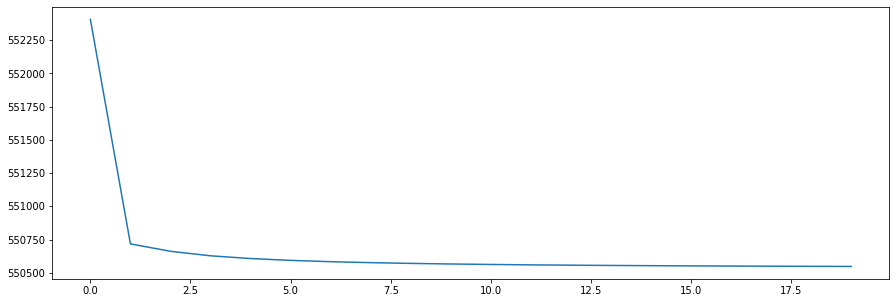

In [117]:
new_model = learn(19, 5000, 750, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(923256.8750) tensor(923256.8750)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(556312.5625) tensor(556312.5625)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(415483.5938) tensor(415483.5938)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(367986.2812) tensor(367986.2812)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 7345.3164062500
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(450422.1562) tensor(450422.1562

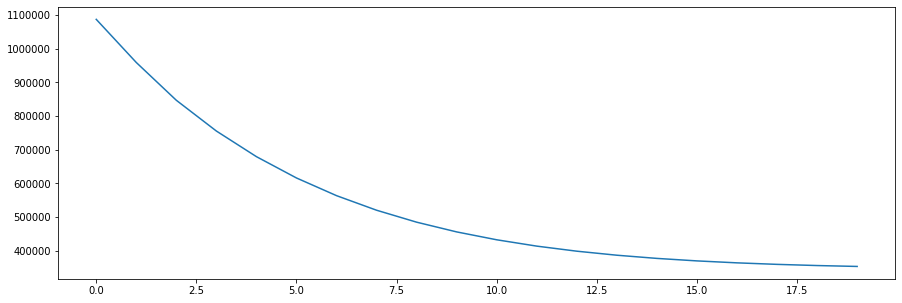

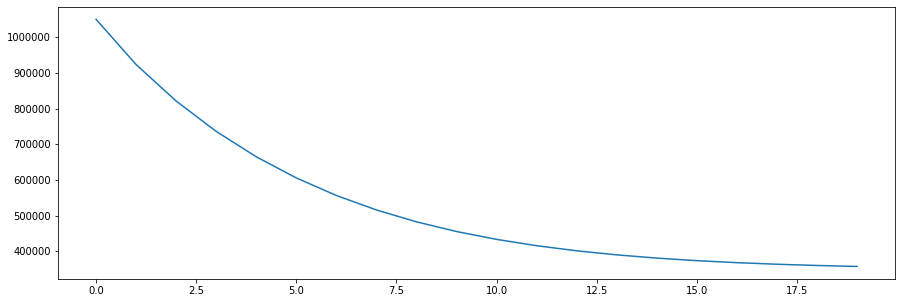

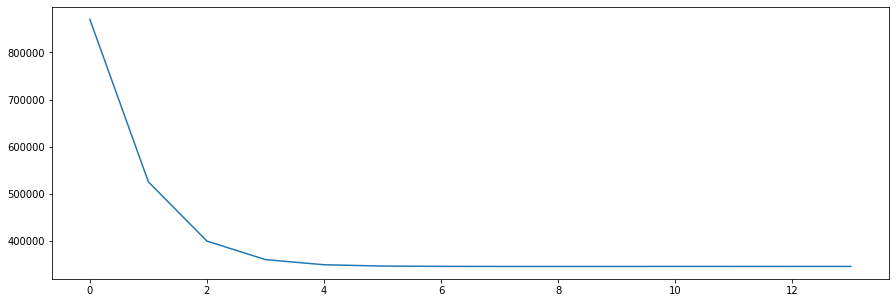

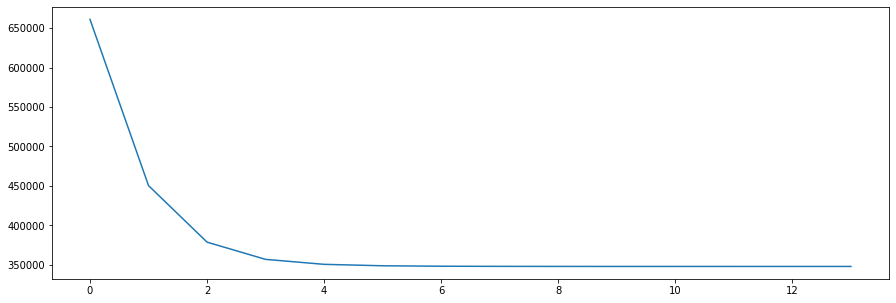

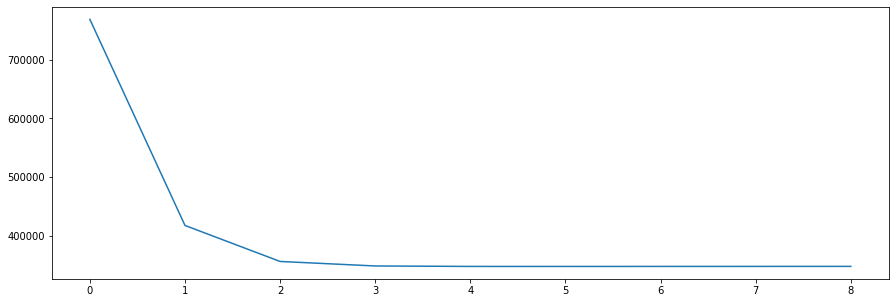

...

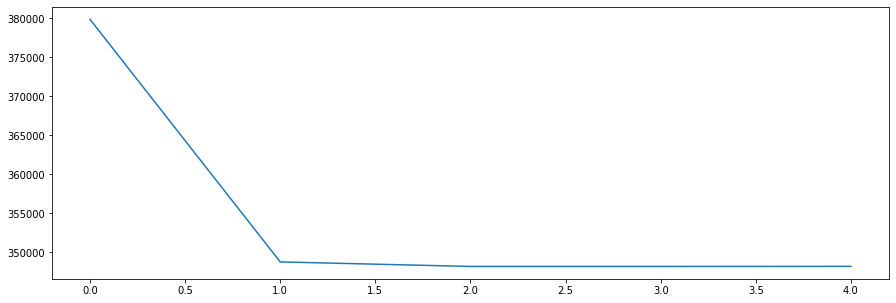

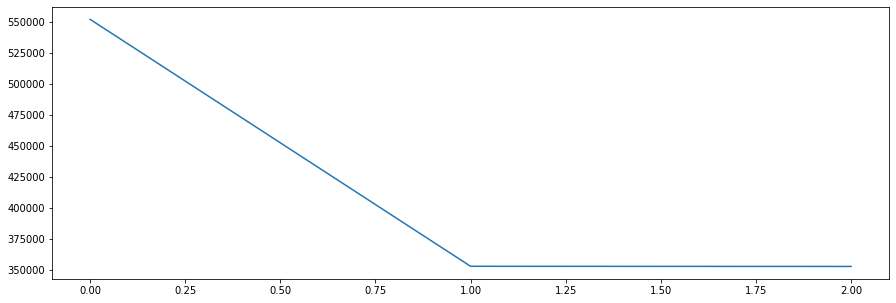

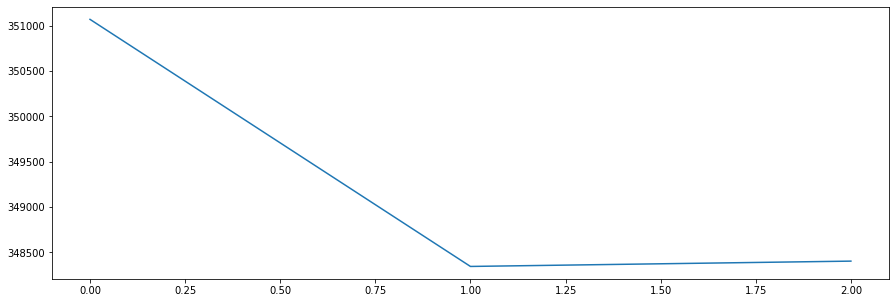

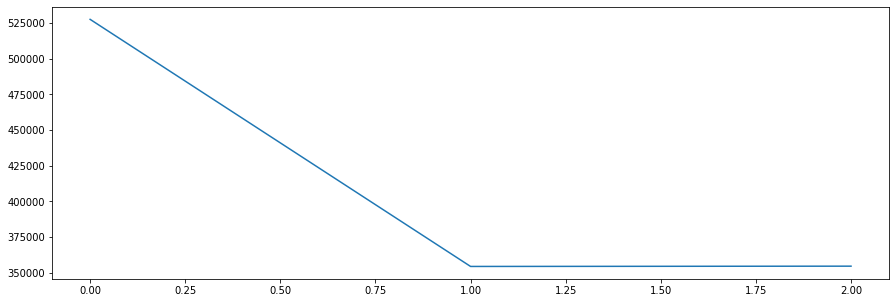

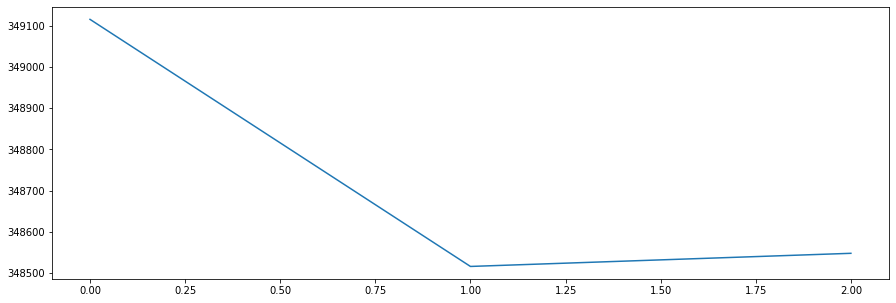

In [118]:
new_model = learn(19, 5000, 800, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(1094532.5000) tensor(1094532.5000)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(656353.6250) tensor(656353.6250)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(493488.2812) tensor(493488.2812)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(436921.) tensor(436921.)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 24270.6679687500
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(652867.7500) tensor(652867.7500)
epo

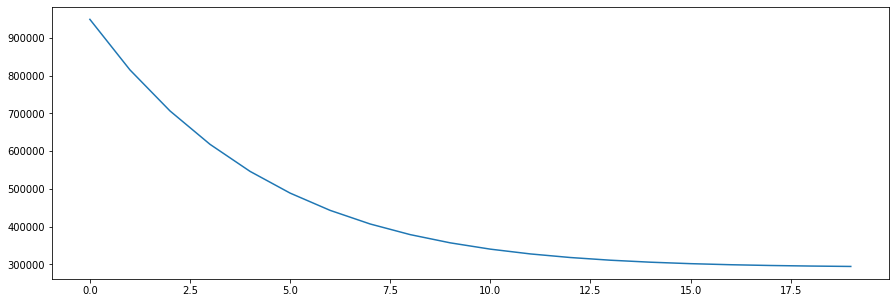

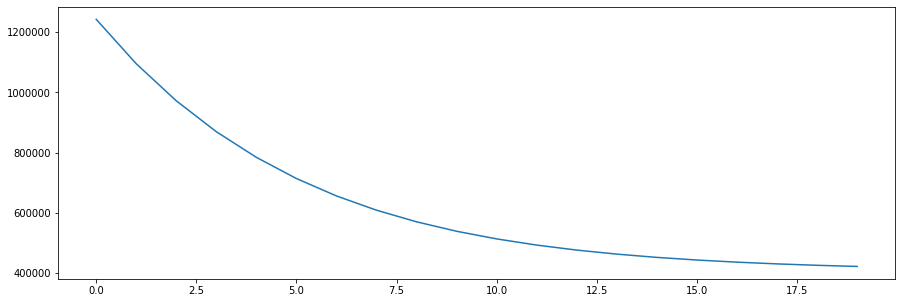

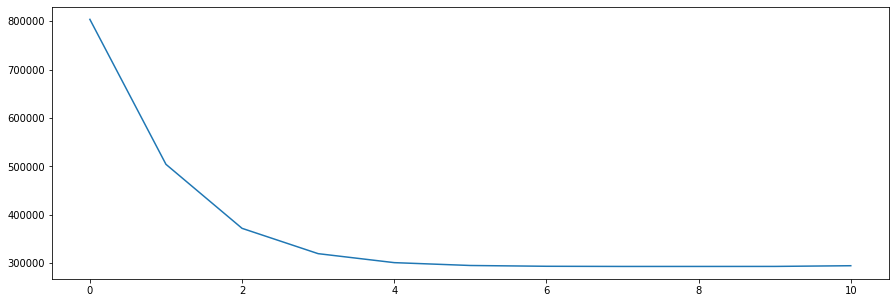

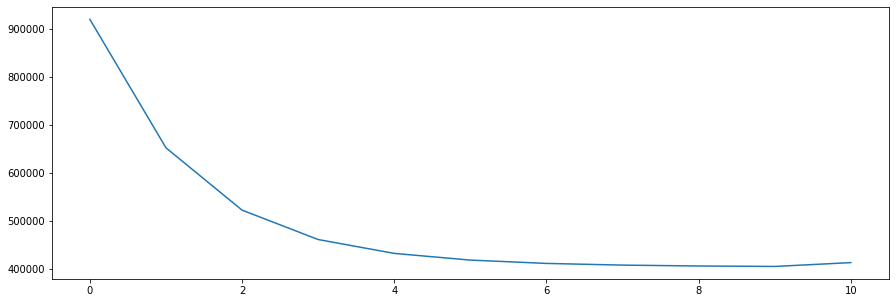

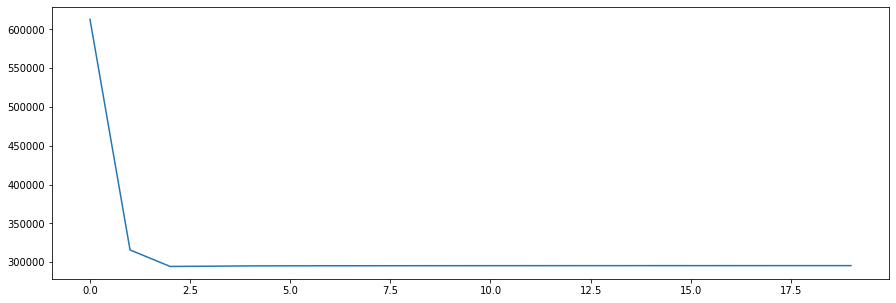

...

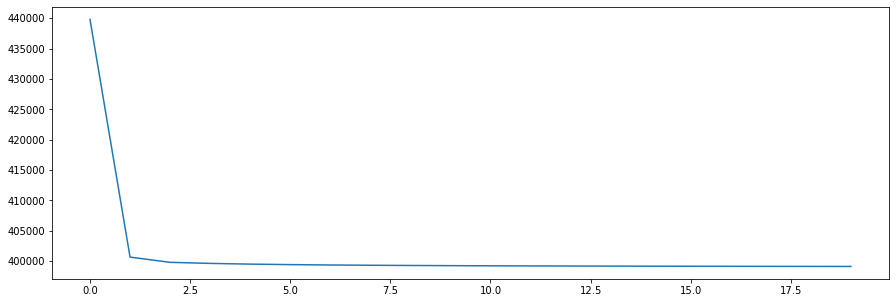

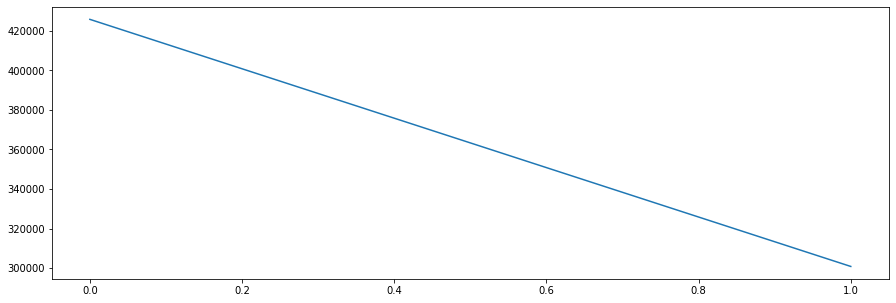

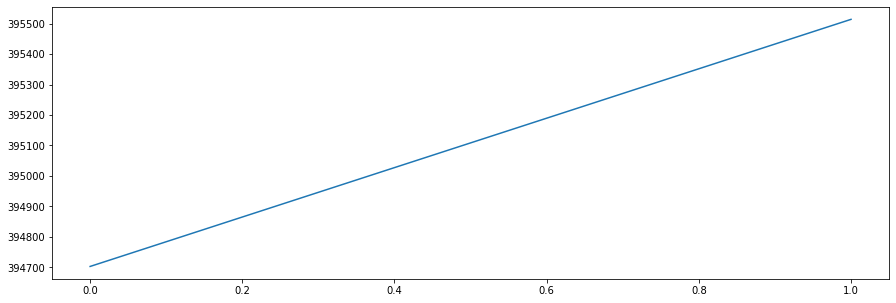

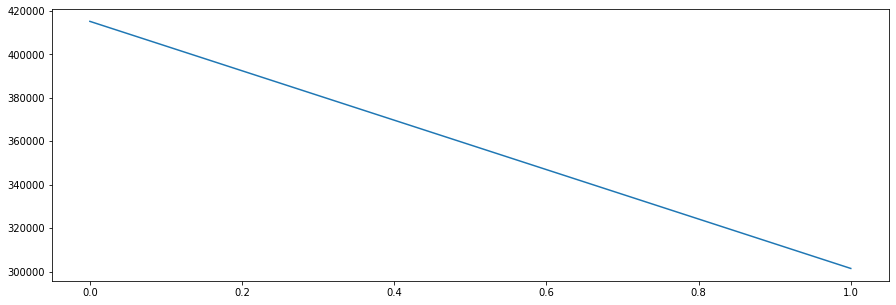

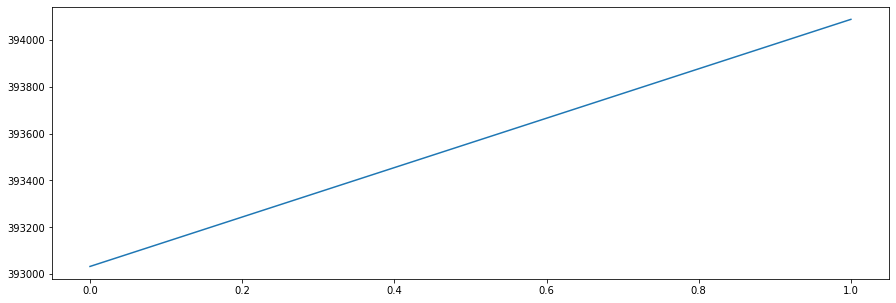

In [119]:
new_model = learn(19, 5000, 850, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(1188454.1250) tensor(1188454.1250)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(810255.) tensor(810255.)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(636727.1250) tensor(636727.1250)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(573282.4375) tensor(573282.4375)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 541986.1250000000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(713063.8125) tensor(713063.8125)
ep

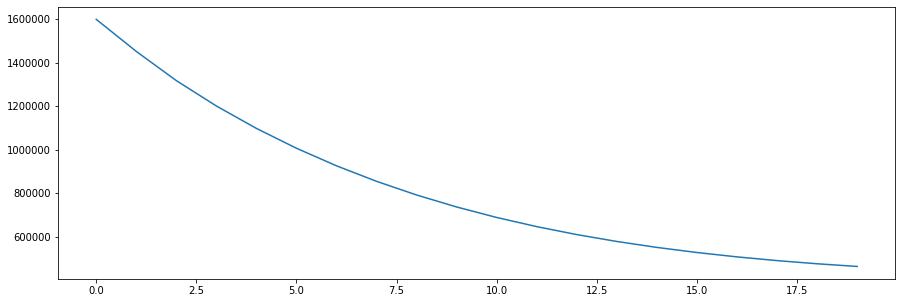

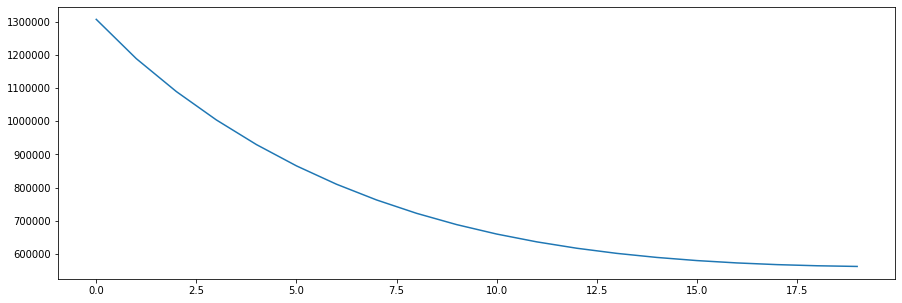

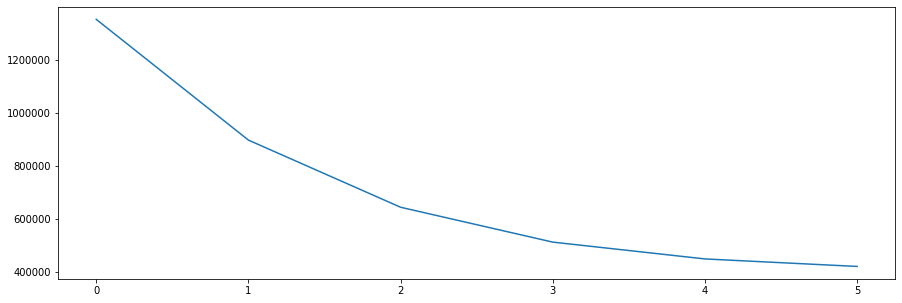

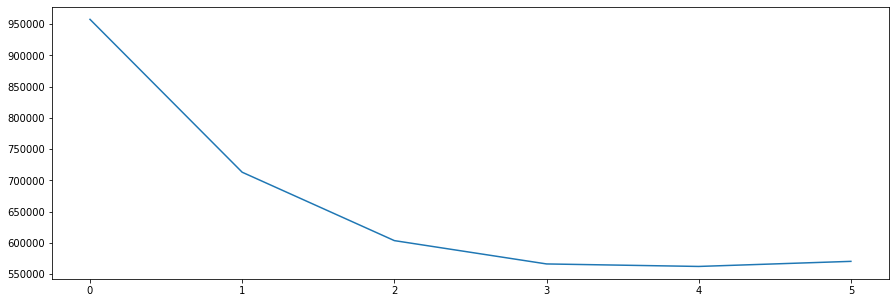

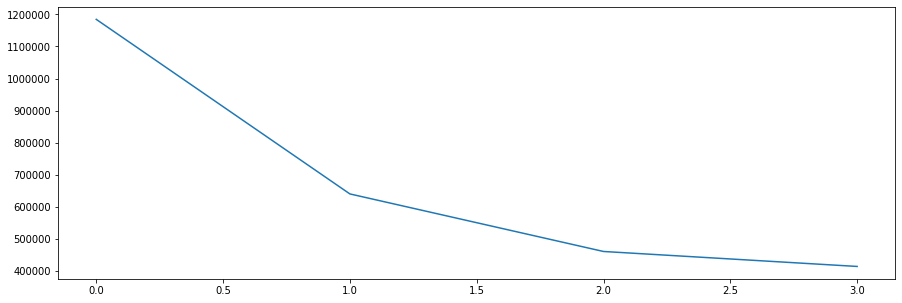

...

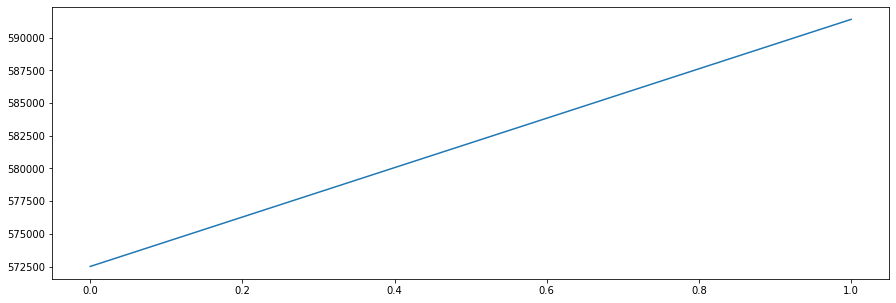

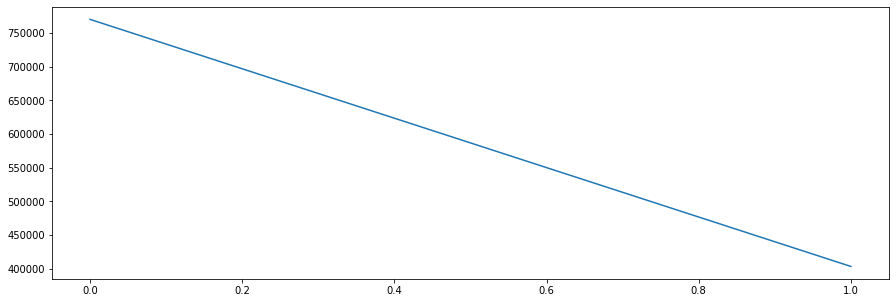

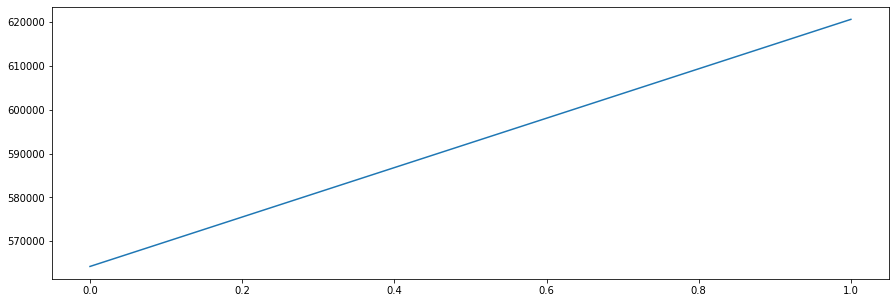

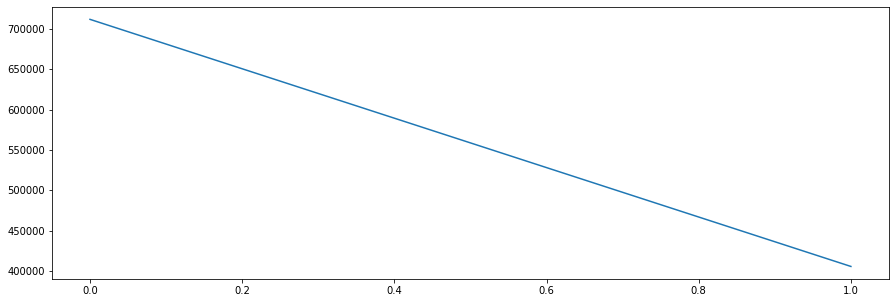

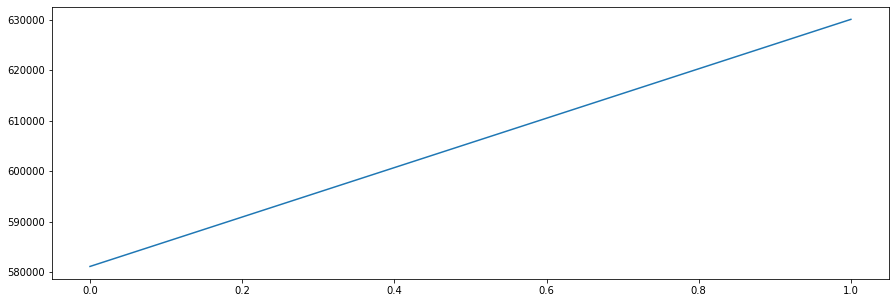

In [120]:
new_model = learn(19, 5000, 900, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(839361.2500) tensor(839361.2500)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(526602.0625) tensor(526602.0625)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(353175.1875) tensor(353175.1875)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(292816.6250) tensor(292816.6250)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 97788.6796875000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(558798.6250) tensor(558798.625

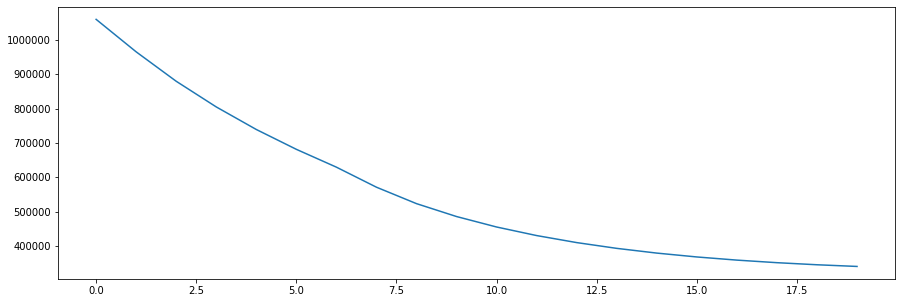

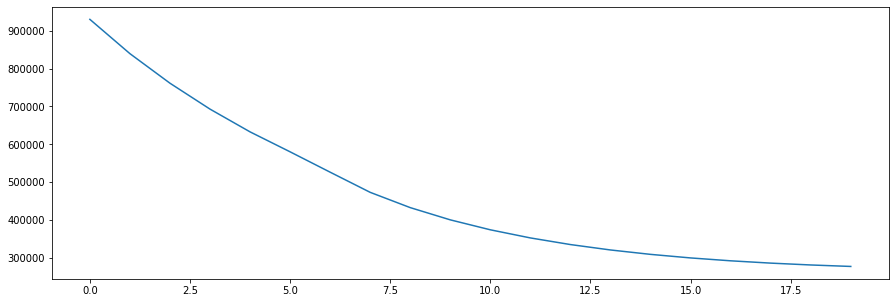

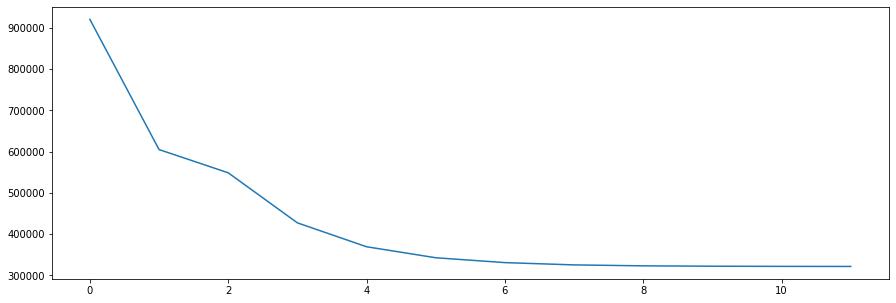

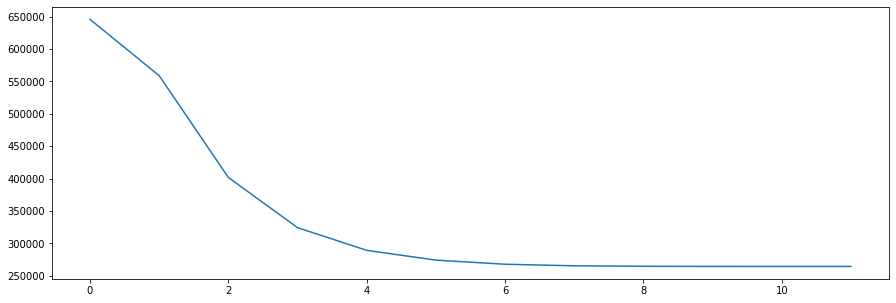

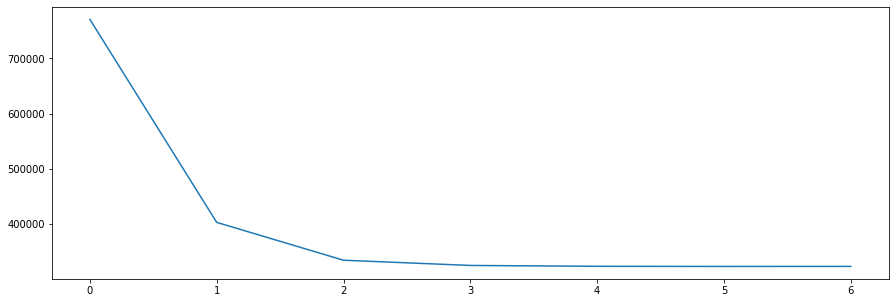

...

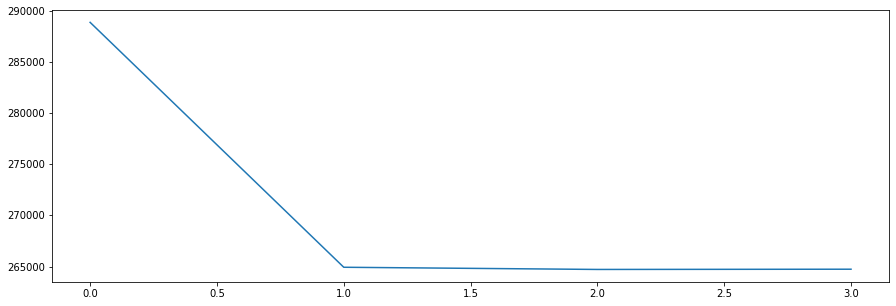

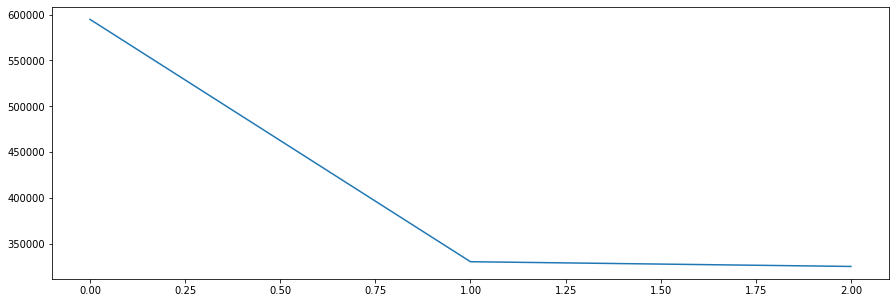

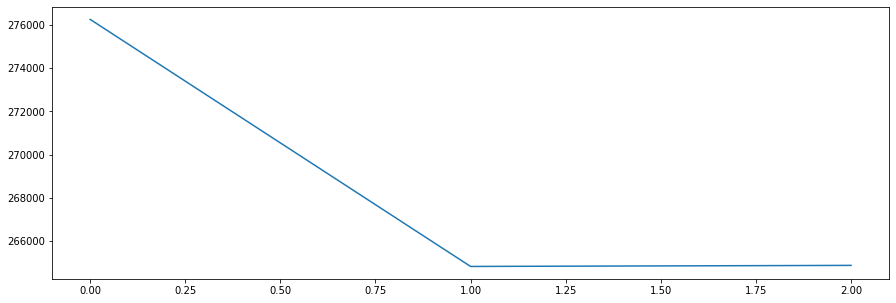

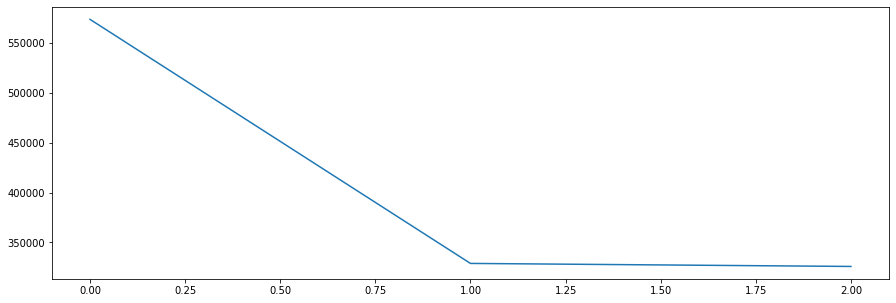

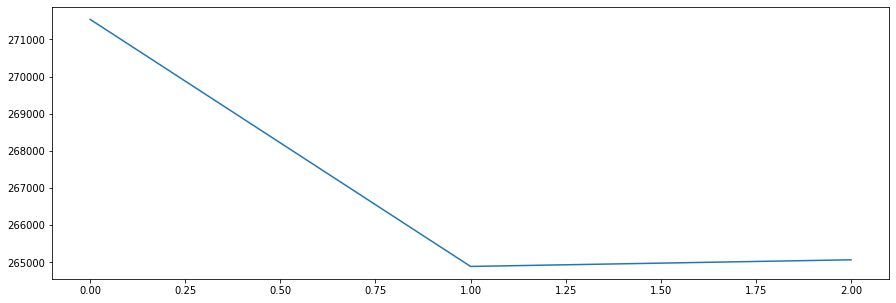

In [121]:
new_model = learn(19, 5000, 950, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(1209868.2500) tensor(1209868.2500)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(841523.8750) tensor(841523.8750)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(624643.1250) tensor(624643.1250)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(502234.3125) tensor(502234.3125)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 829008.5625000000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(769637.6250) tensor(769637.

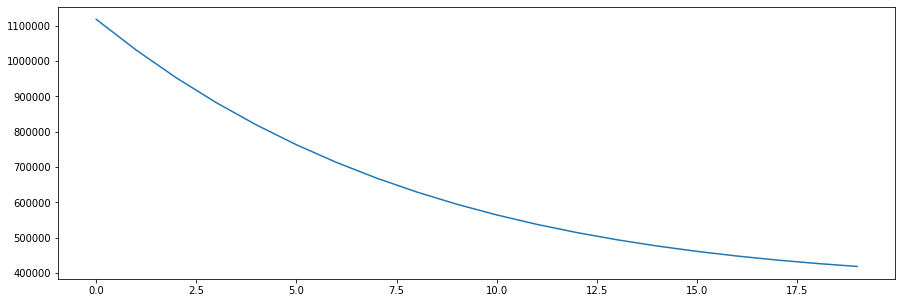

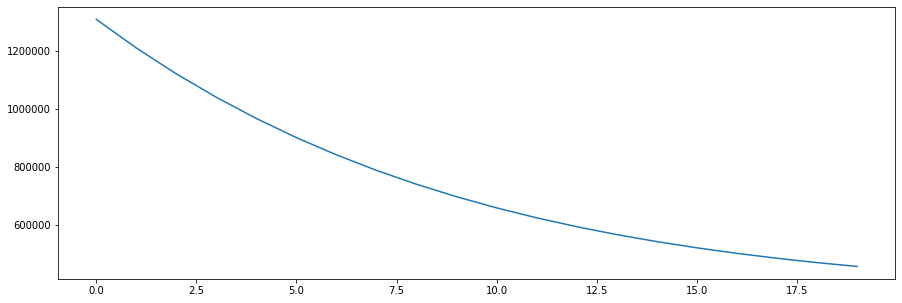

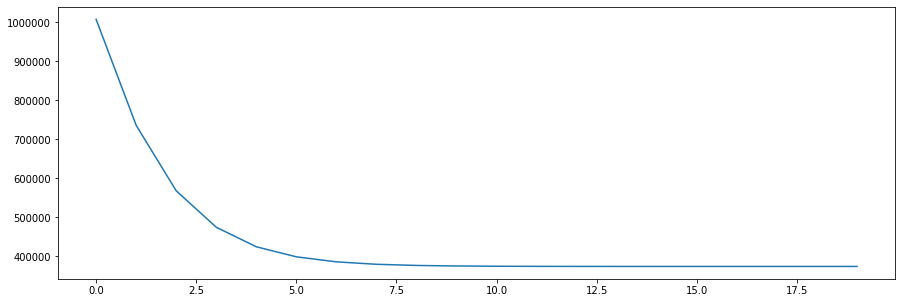

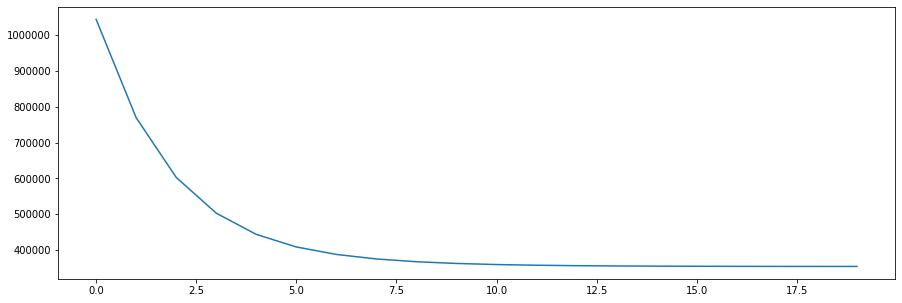

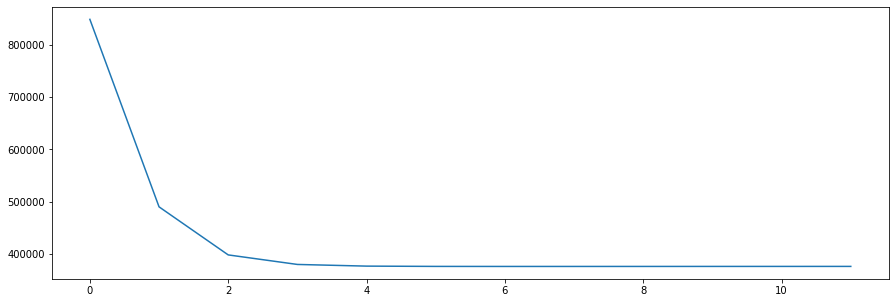

...

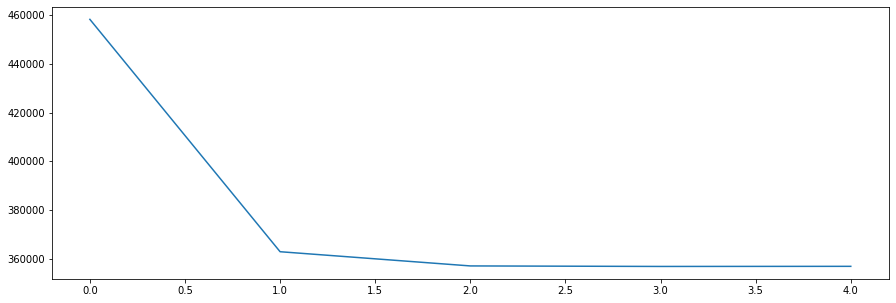

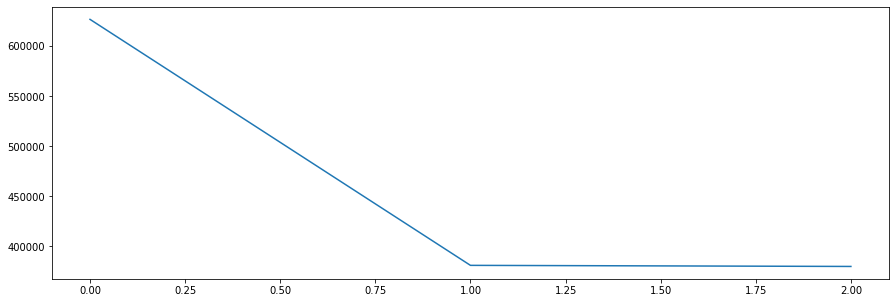

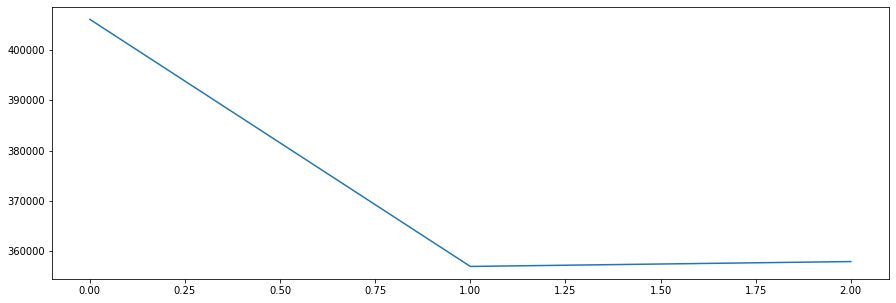

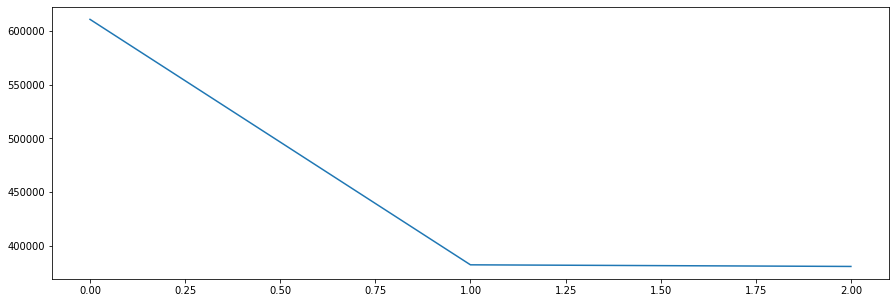

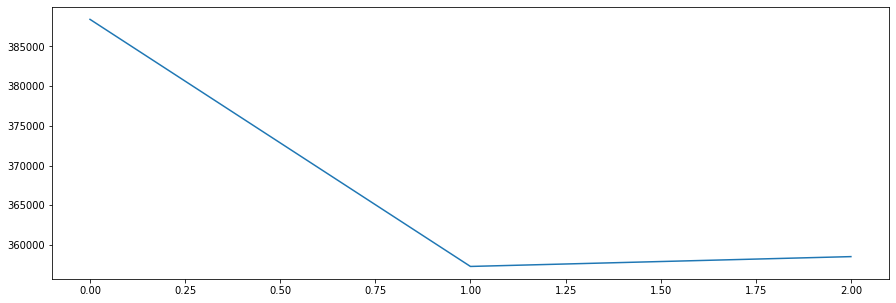

In [122]:
new_model = learn(19, 5000, 1000, 0.2)
# evaluate(new_model)

# 15s

Data is ready
epoch: 0
tensor(360687.7188) tensor(360687.7188)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(360652.2188) tensor(360646.0312)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(360652.2188) tensor(360646.0312)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(360652.2188) tensor(360646.0312)
epoch: 17
epoch: 18
epoch: 19
epoch: 20
tensor(360652.2188) tensor(360646.0312)
epoch: 22
epoch: 23
epoch: 24
epoch: 25
tensor(360652.2188) tensor(360646.0312)
epoch: 27
epoch: 28
epoch: 29
epoch: 30
tensor(360652.2188) tensor(360646.0312)
epoch: 32
epoch: 33
epoch: 34
epoch: 35
tensor(360652.2188) tensor(360646.0312)
epoch: 37
epoch: 38
epoch: 39
epoch: 40
tensor(360652.2188) tensor(360646.0312)
epoch: 42
epoch: 43
epoch: 44
epoch: 45
tensor(360652.2188) tensor(360646.0312)
epoch: 47
epoch: 48
epoch: 49
epoch:  49 loss: 5303193.0000000000
epoch: 0
tensor(374438.1562) tensor(374154.2188)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(374526.1562) tensor(374154.2188)
epoch: 7
epoch: 8
epoch: 9
epoch:

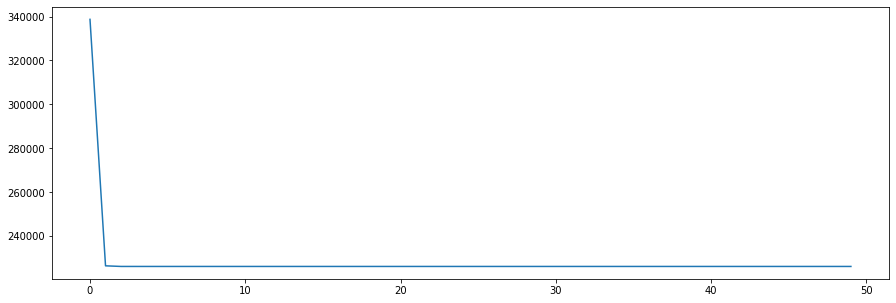

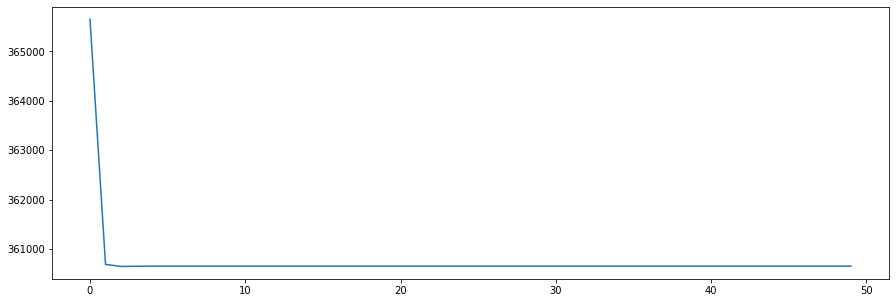

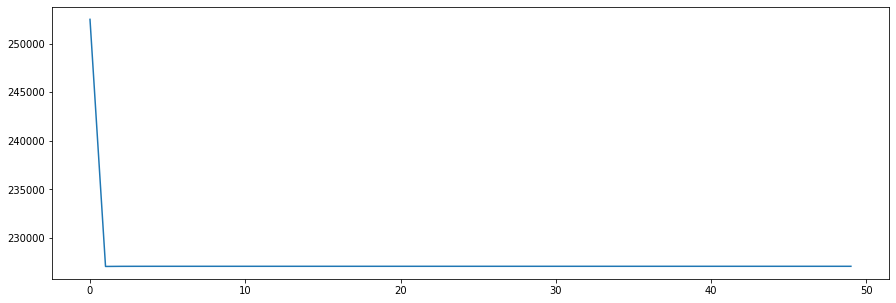

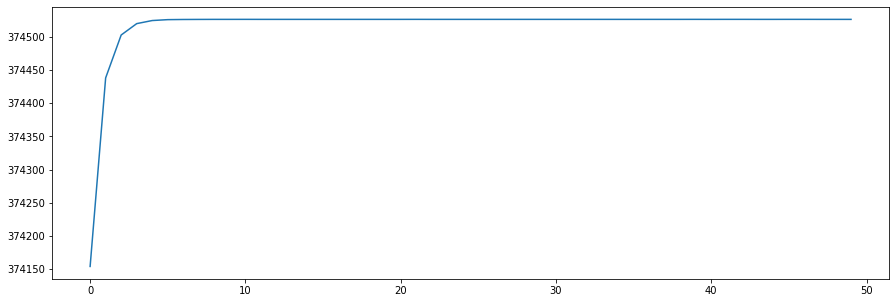

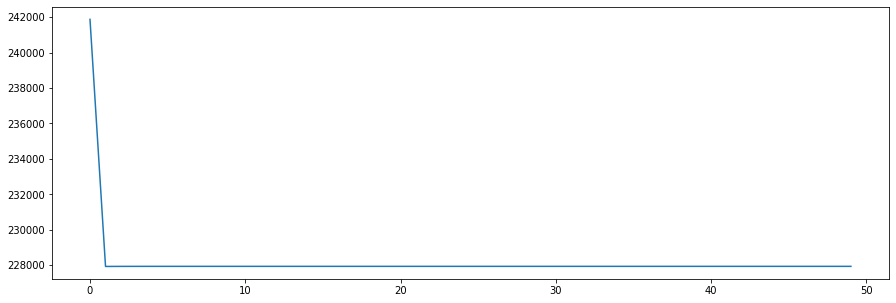

...

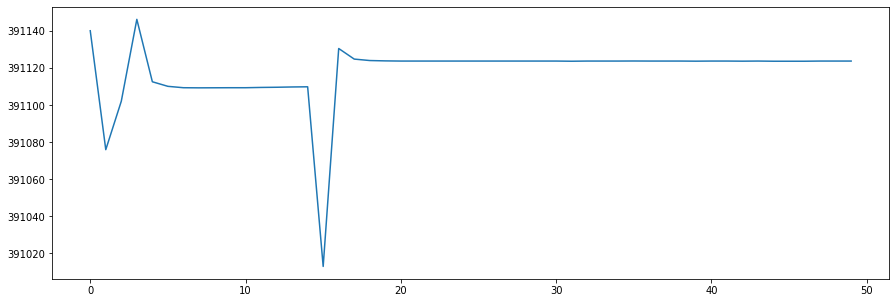

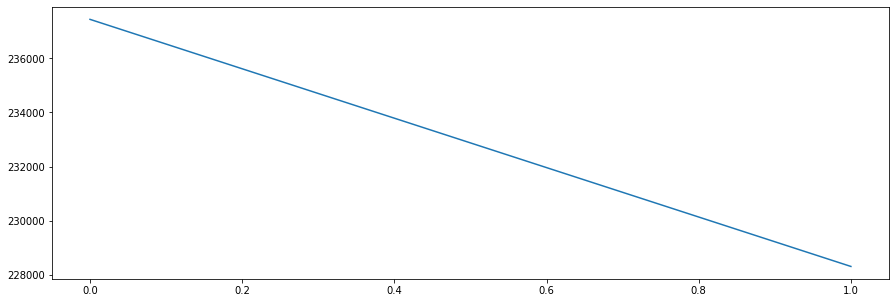

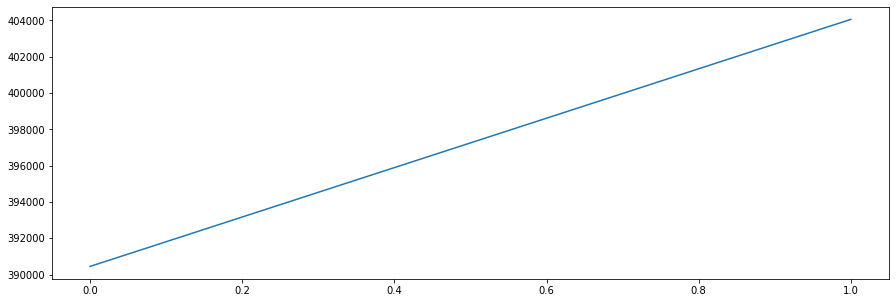

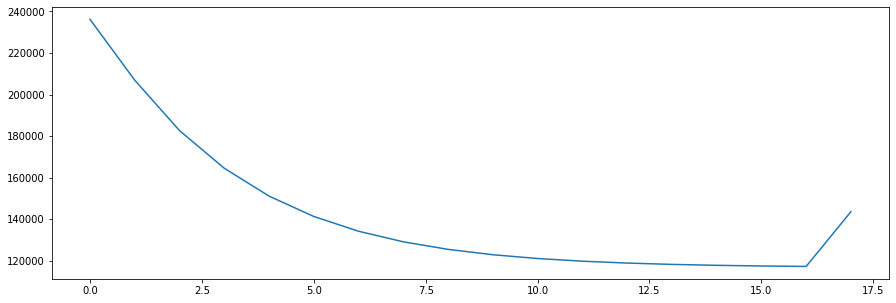

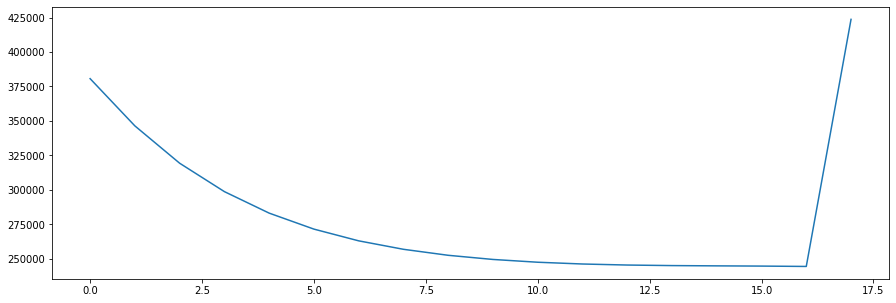

In [67]:
new_model = learn(20, 15000, 50, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(215986.7969) tensor(215986.7969)
epoch: 2
epoch: 3
epoch:   3 loss: 9371.6220703125
epoch: 0
tensor(219789.2969) tensor(219338.6875)
epoch:   1 loss: 3684.4226074219
epoch: 0
tensor(220202.4844) tensor(220199.5625)
epoch:   1 loss: 3382.0976562500
epoch: 0
tensor(219317.3594) tensor(219317.3594)
epoch: 2
epoch:   2 loss: 4057.5568847656
epoch: 0
tensor(218349.9219) tensor(218292.5156)
epoch:   1 loss: 4942.6088867188
epoch: 0
tensor(216811.2188) tensor(216811.2188)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(216635.5625) tensor(216635.5625)
epoch: 7
epoch:   7 loss: 6942.3828125000
0.09935222858141024
128.32223488824658


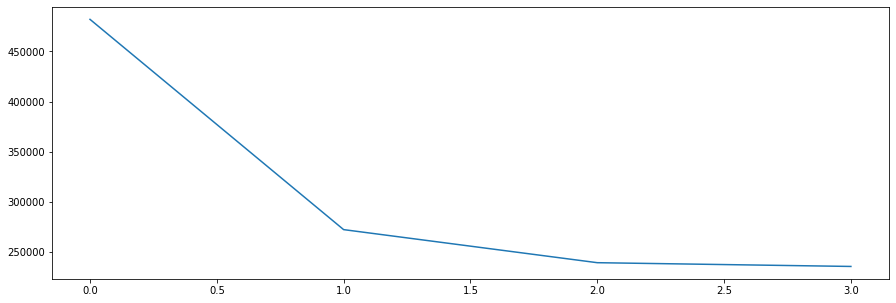

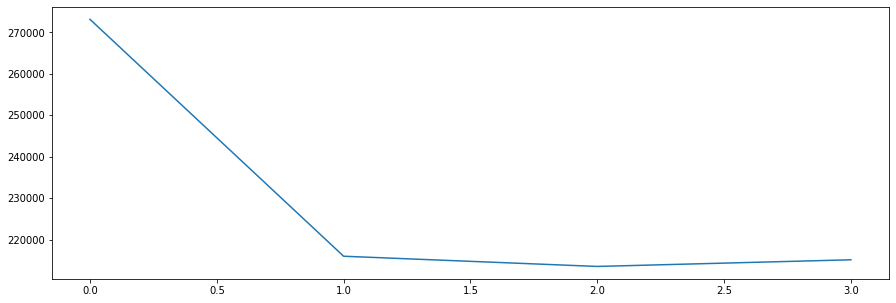

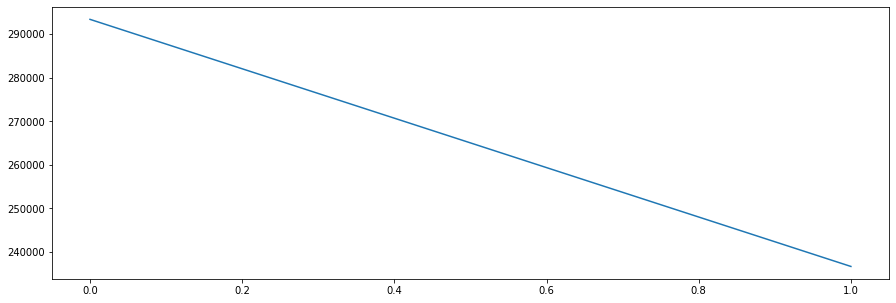

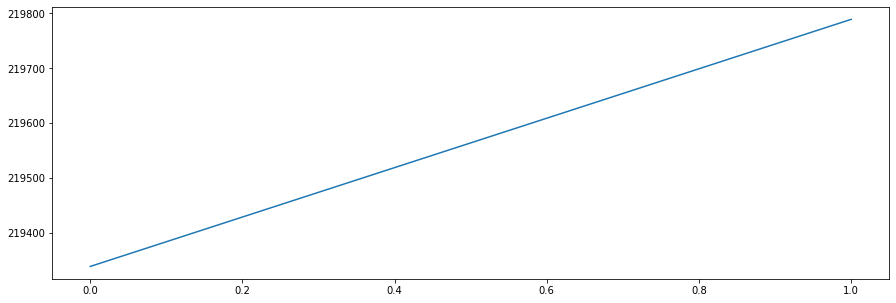

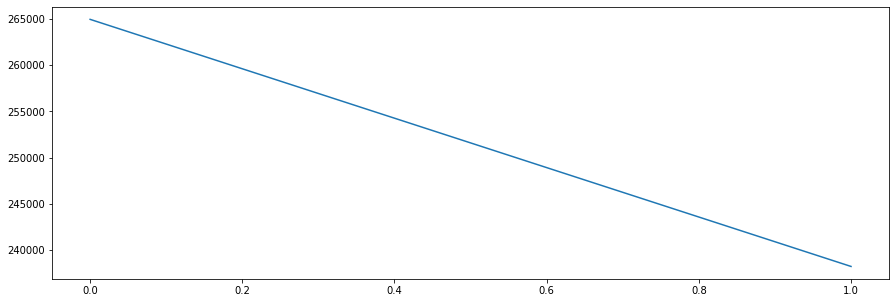

...

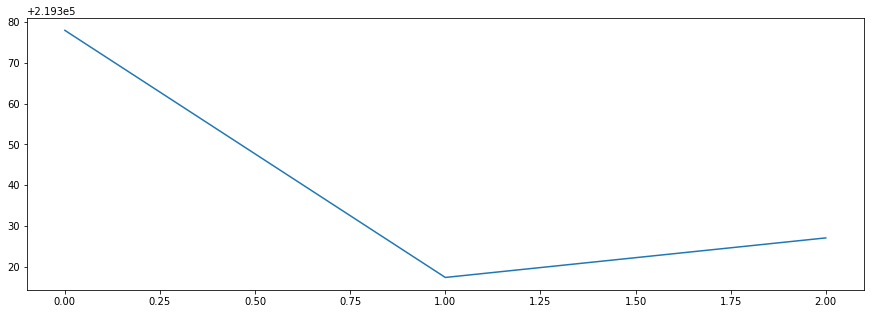

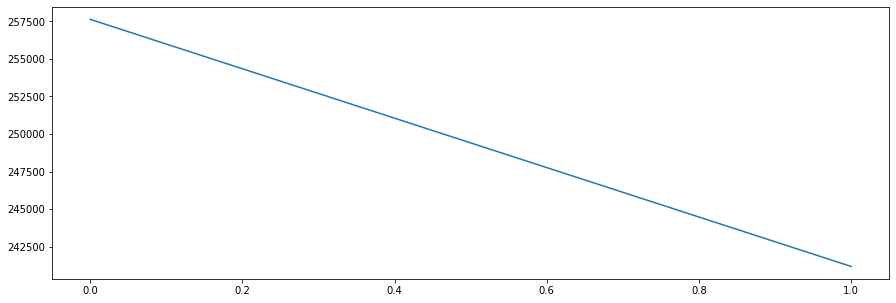

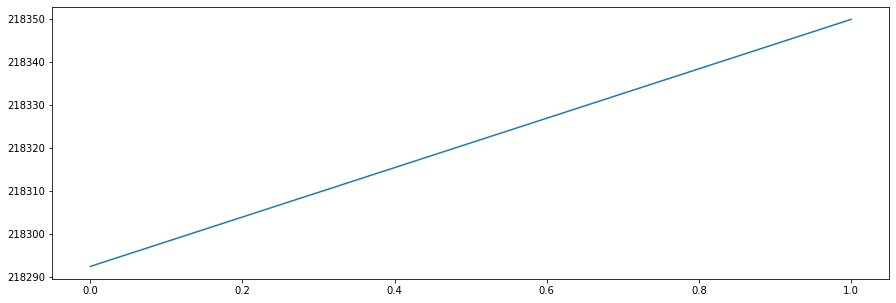

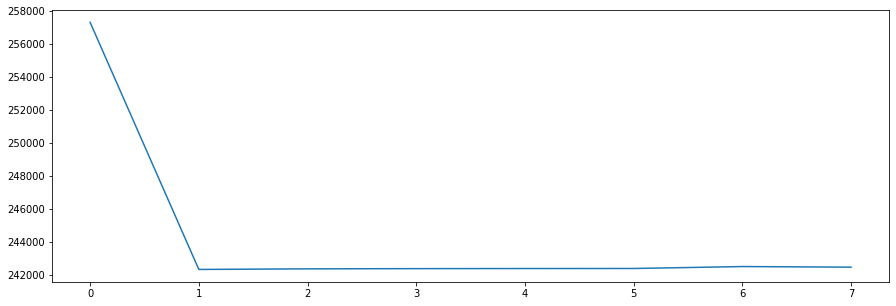

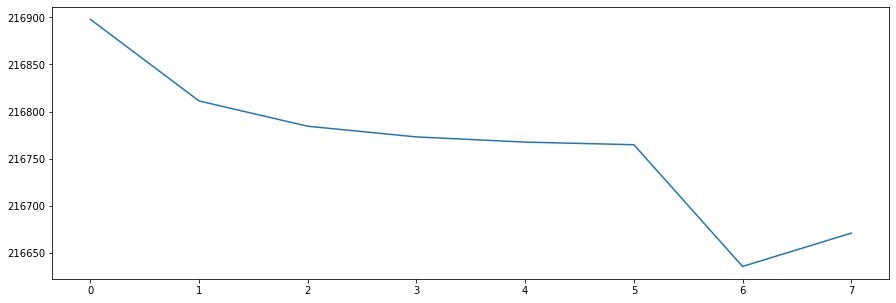

In [70]:
new_model = learn(20, 15000, 100, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(176829.9844) tensor(176829.9844)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(166573.0781) tensor(166573.0781)
epoch: 7
epoch: 8
epoch:   8 loss: 116957.2265625000
epoch: 0
tensor(168872.5469) tensor(168872.5469)
epoch: 2
epoch:   2 loss: 141984.7031250000
epoch: 0
tensor(177341.6094) tensor(176901.8906)
epoch:   1 loss: 184208.3906250000
epoch: 0
tensor(183657.0156) tensor(183429.1250)
epoch:   1 loss: 207123.0625000000
epoch: 0
tensor(189176.6250) tensor(188935.6562)
epoch:   1 loss: 224776.0625000000
epoch: 0
tensor(191951.9844) tensor(191947.8906)
epoch:   1 loss: 233135.2031250000
0.05450670533424288
108.22381585890135


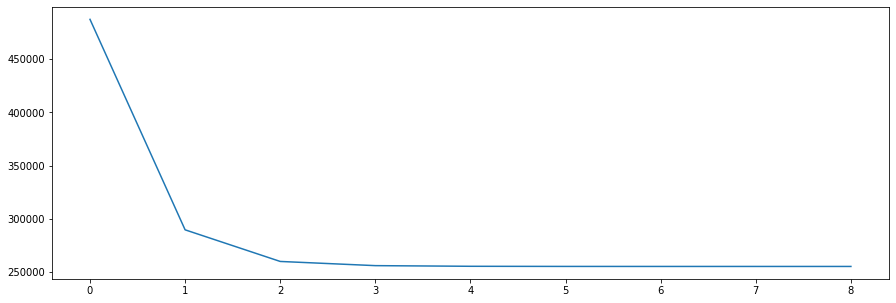

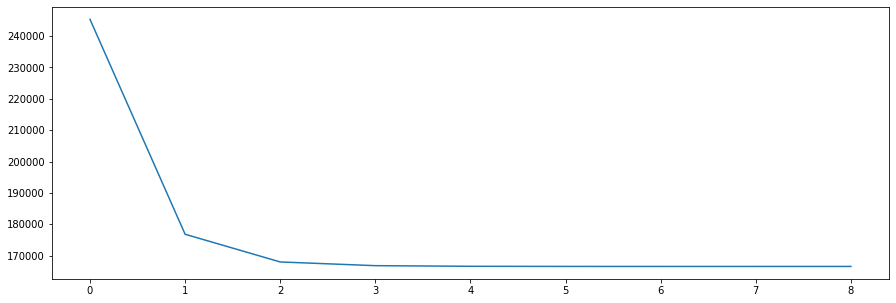

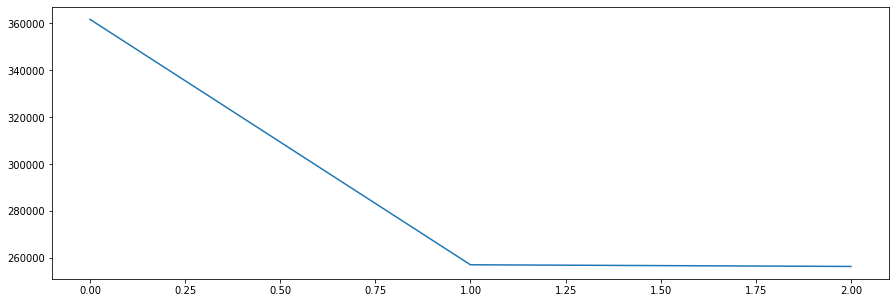

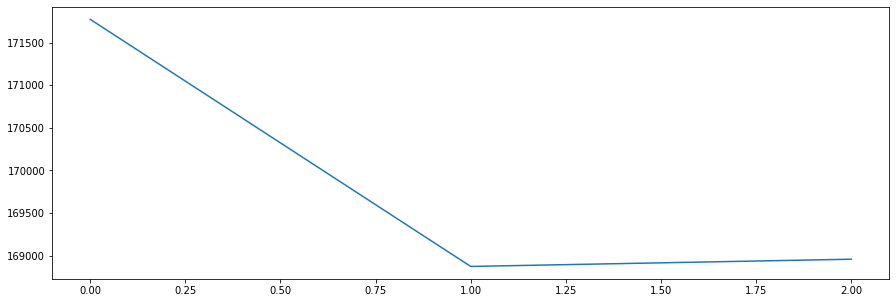

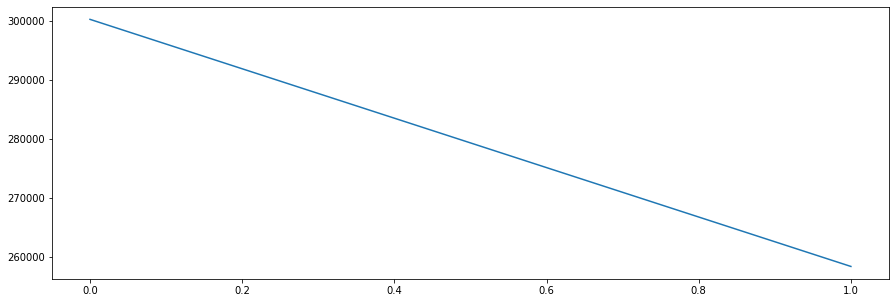

...

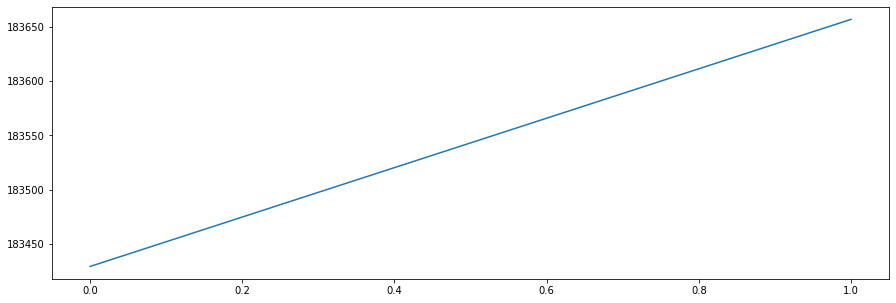

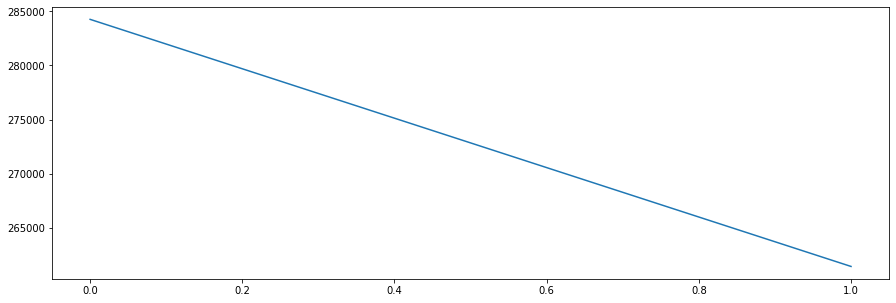

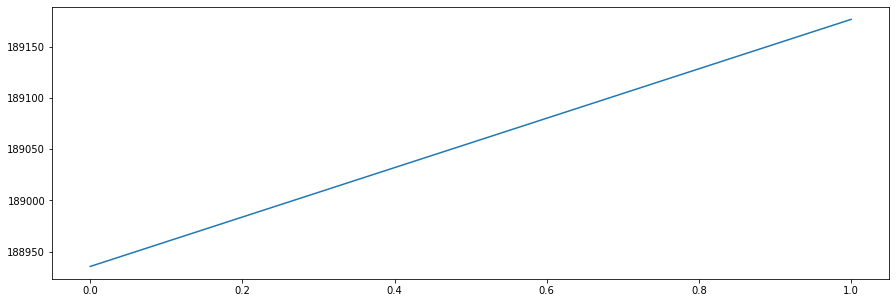

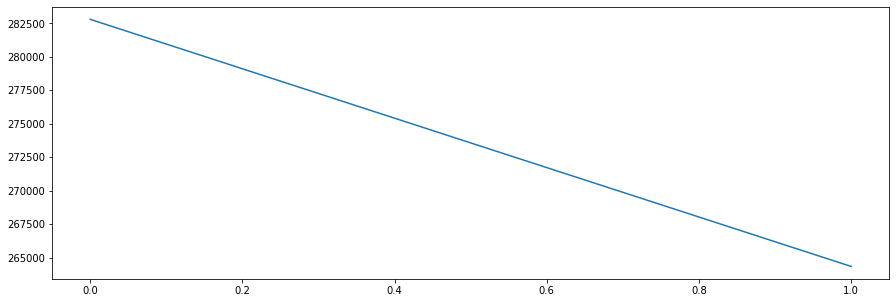

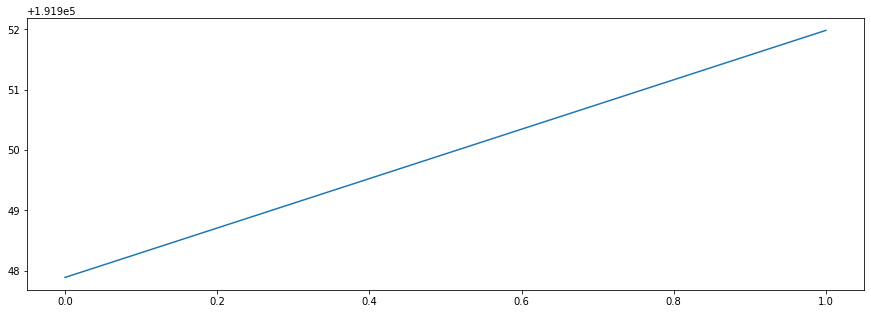

In [71]:
new_model = learn(20, 15000, 150, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(454319.7812) tensor(454319.7812)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(293987.9062) tensor(293987.9062)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(286670.3125) tensor(286670.3125)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(286423.) tensor(286423.)
epoch: 17
epoch: 18
epoch: 19
epoch: 20
tensor(286411.9062) tensor(286411.9062)
epoch: 22
epoch: 23
epoch: 24
epoch:  24 loss: 1749139.0000000000
epoch: 0
tensor(287824.2188) tensor(287824.2188)
epoch: 2
epoch: 3
epoch: 4
epoch:   4 loss: 1759514.0000000000
epoch: 0
tensor(287565.0312) tensor(287565.0312)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(287503.9688) tensor(287503.9688)
epoch: 7
epoch: 8
epoch: 9
epoch: 10
tensor(287496.0312) tensor(287496.0312)
epoch: 12
epoch: 13
epoch: 14
epoch: 15
tensor(287494.3125) tensor(287494.3125)
epoch: 17
epoch: 18
epoch: 19
epoch: 20
tensor(287493.8125) tensor(287493.8125)
epoch: 22
epoch: 23
epoch: 24
epoch:  24 loss: 1756479.7500000000
epoch: 0
tensor(283407.562

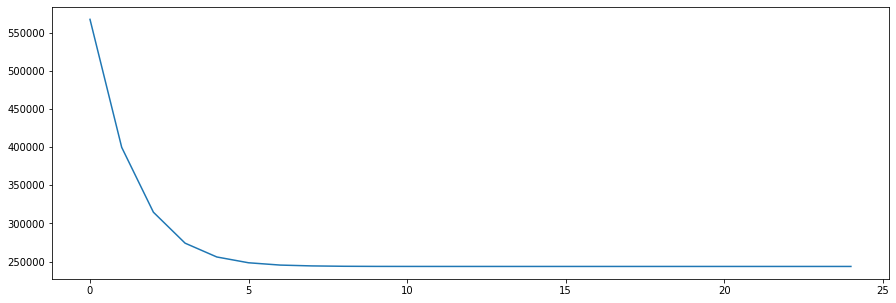

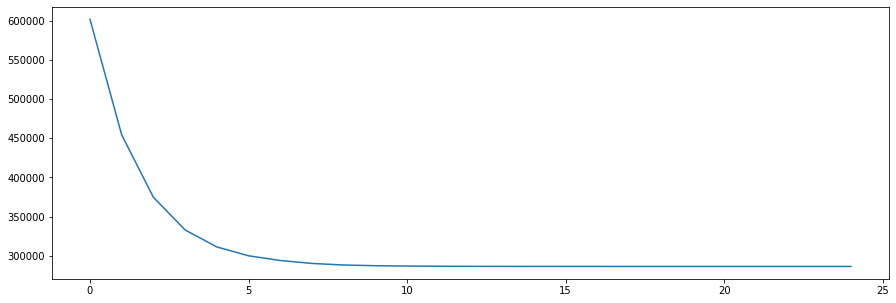

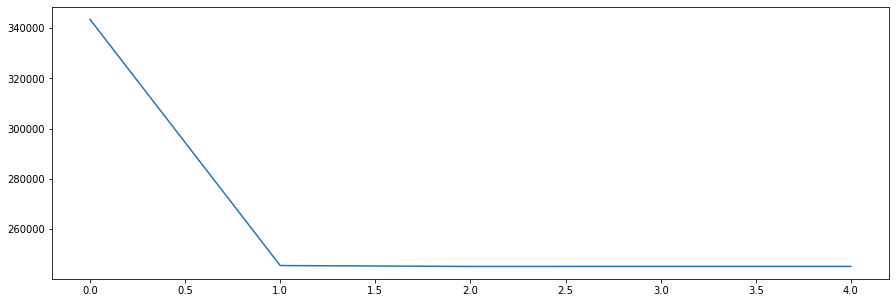

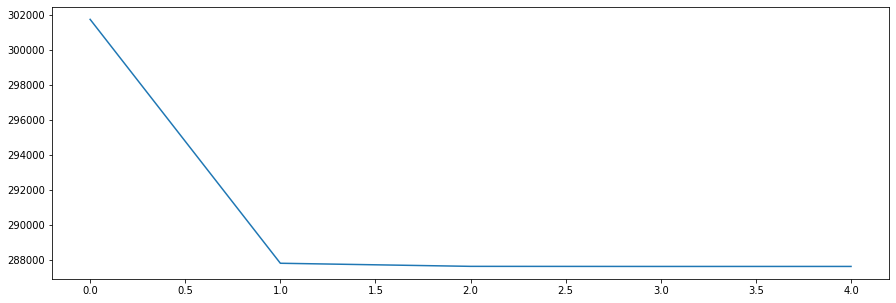

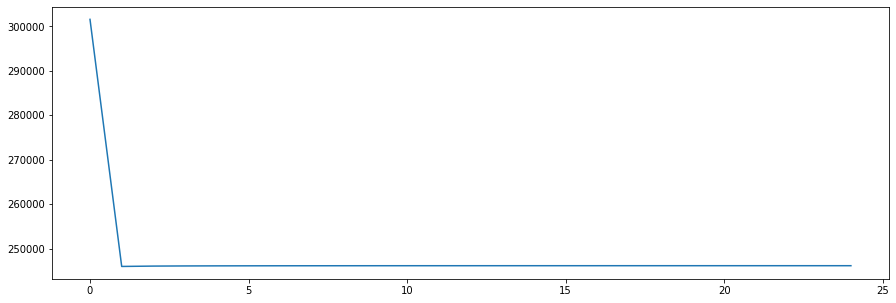

...

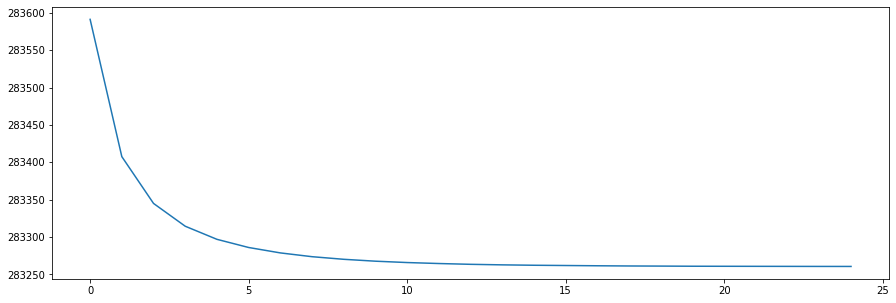

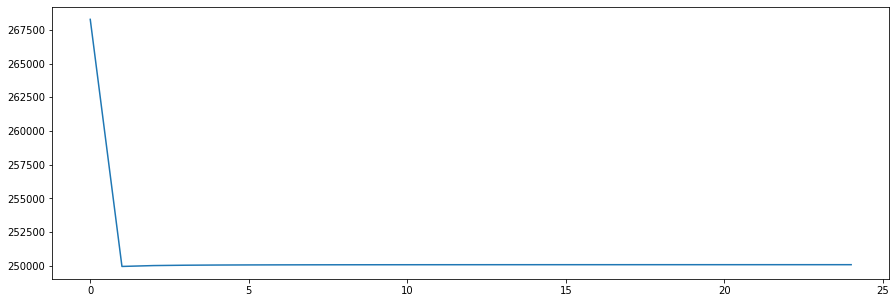

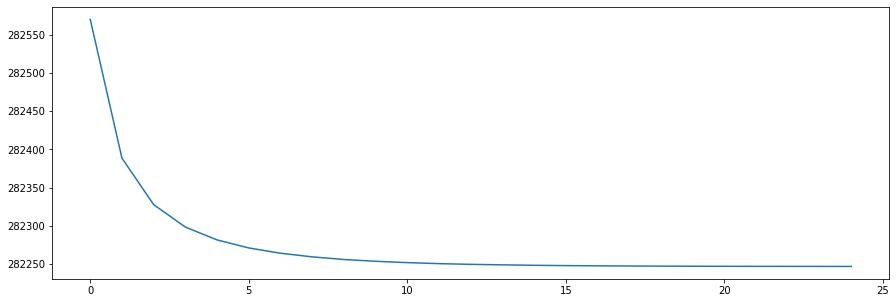

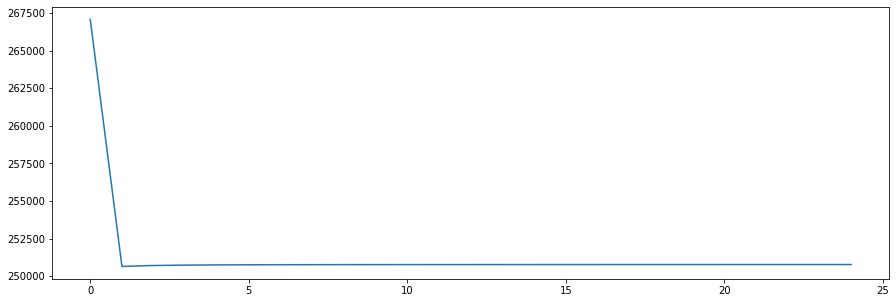

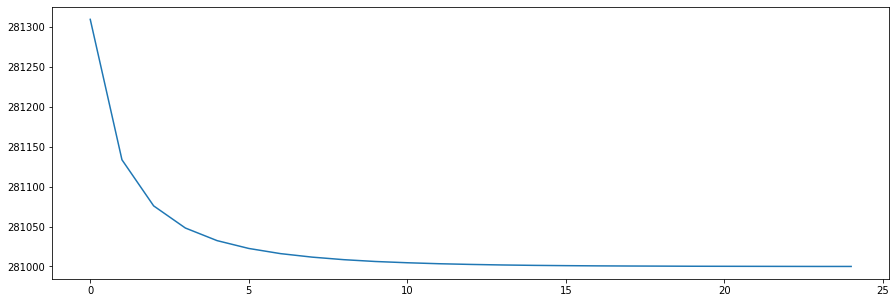

In [72]:
new_model = learn(20, 15000, 200, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(278168.) tensor(278168.)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(154072.7656) tensor(154072.7656)
epoch: 7
epoch: 8
epoch:   8 loss: 19424.2050781250
epoch: 0
tensor(155367.1719) tensor(155367.1719)
epoch: 2
epoch:   2 loss: 7226.0786132812
epoch: 0
tensor(162223.9531) tensor(160490.3906)
epoch:   1 loss: 5759.1162109375
epoch: 0
tensor(167198.7188) tensor(166853.5781)
epoch:   1 loss: 3761.5983886719
epoch: 0
tensor(169061.7031) tensor(168740.1562)
epoch:   1 loss: 3089.0041503906
epoch: 0
tensor(174399.) tensor(174214.0312)
epoch:   1 loss: 1585.8541259766
0.04693769802913035
73.43533238050317


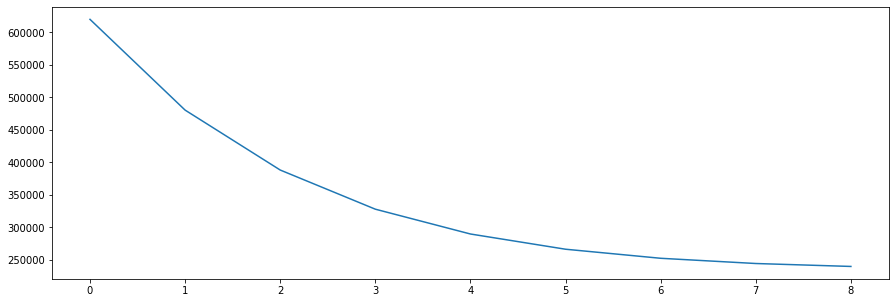

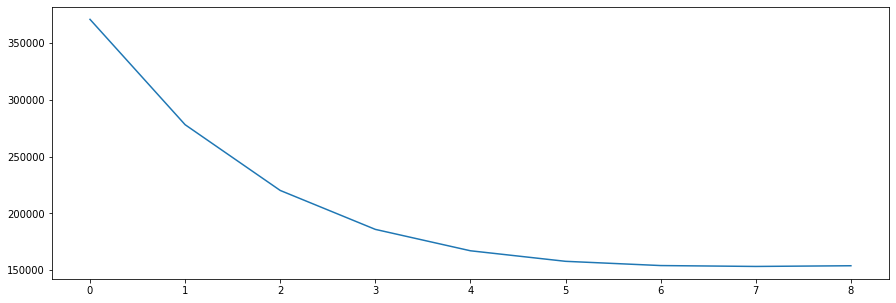

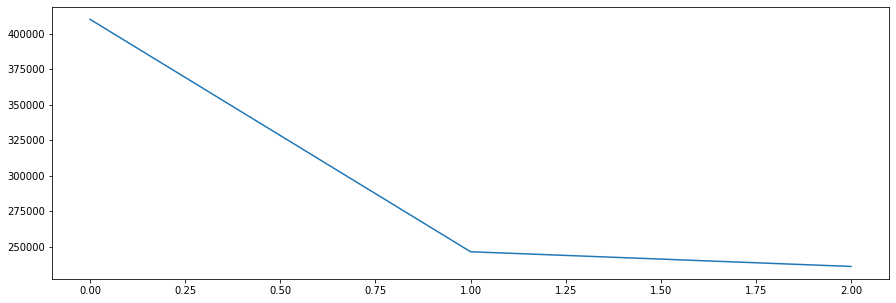

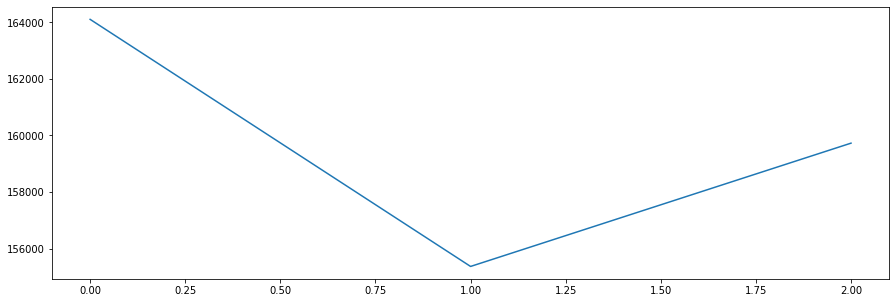

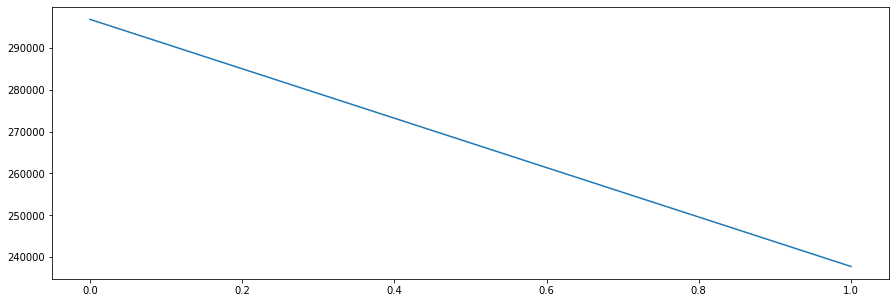

...

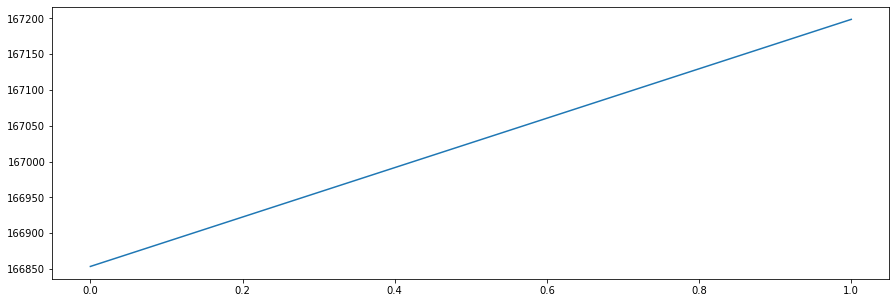

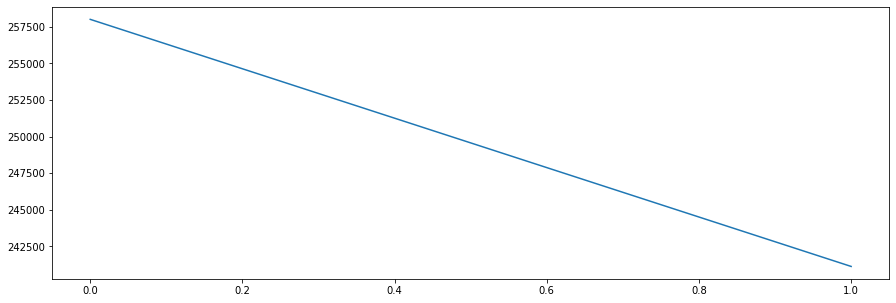

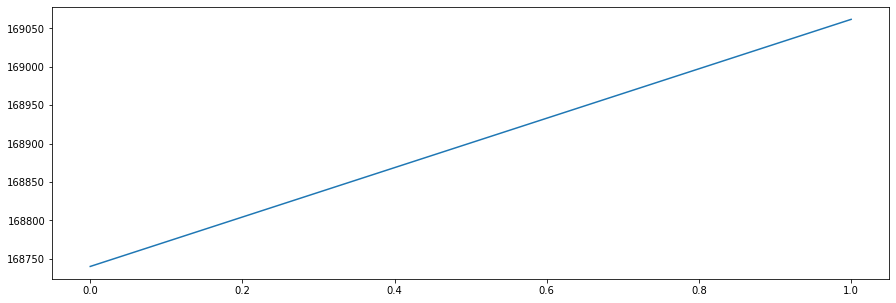

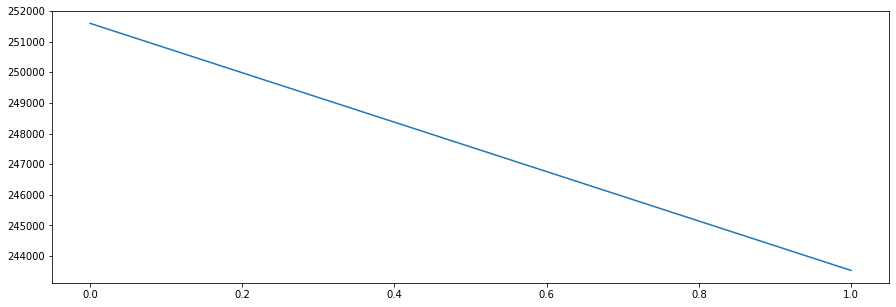

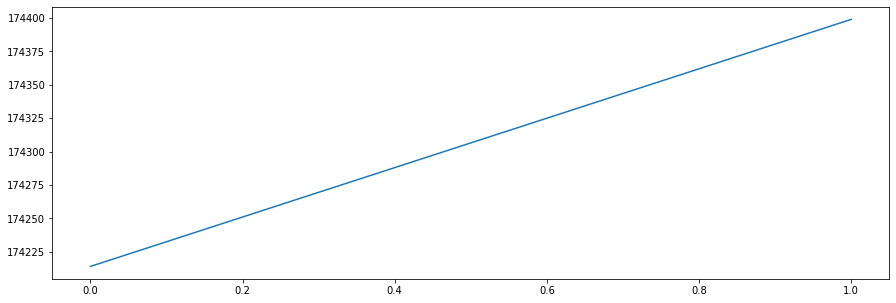

In [73]:
new_model = learn(20, 15000, 250, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(274201.2500) tensor(274201.2500)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(133930.4375) tensor(133930.4375)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
epoch:   9 loss: 70041.5234375000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(130325.3984) tensor(130325.3984)
epoch: 2
epoch:   2 loss: 253788.6250000000
epoch: 0
bast model hidden size: 100
tensor(131572.2812) tensor(129605.4531)
epoch:   1 loss: 242821.9375000000
epoch: 0
bast model hidden size: 200
bast model hidden size: 200
tensor(128408.0234) tensor(128408.0234)
epoch: 2
bast model hidden size: 200
epoch: 3
bast model hidden size: 200
epoch: 4
bast model hidden size: 200
epoch: 5
bast model hidden size: 200
bast model hidden size: 200
tensor(128315.195

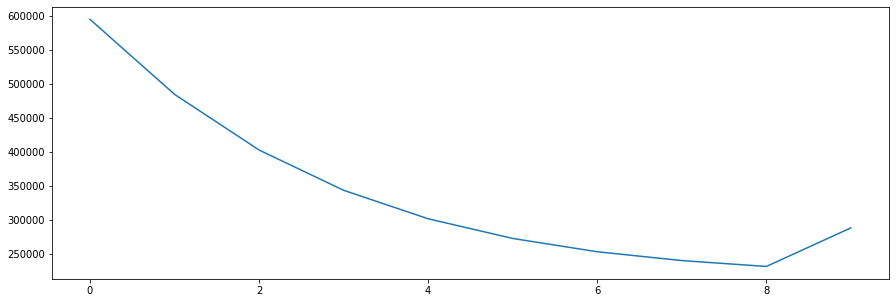

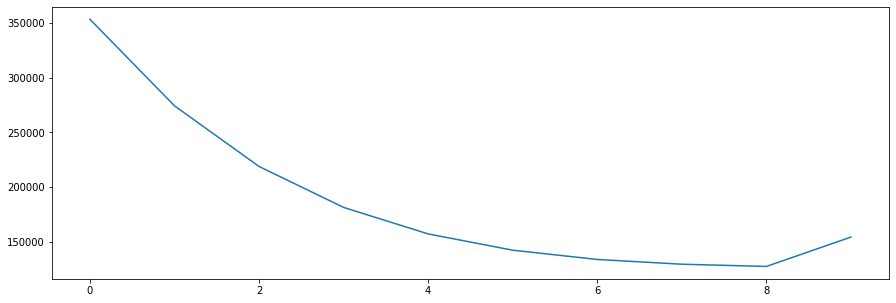

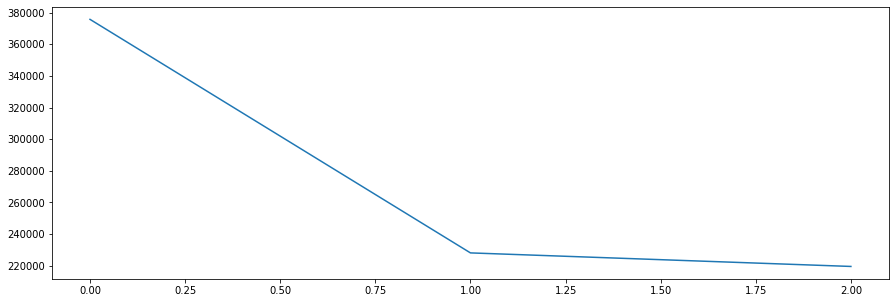

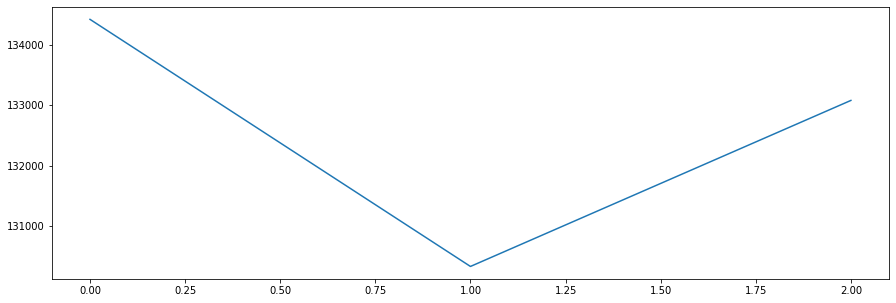

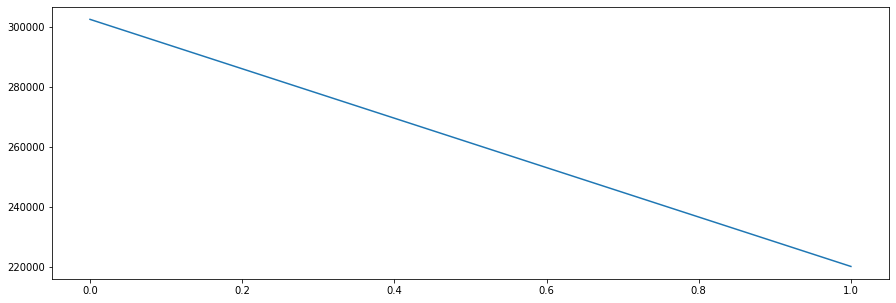

...

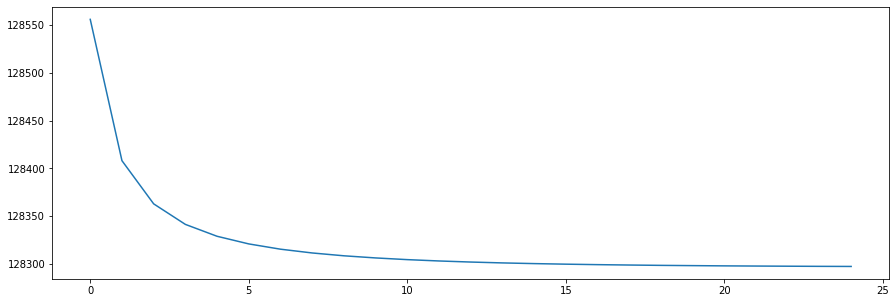

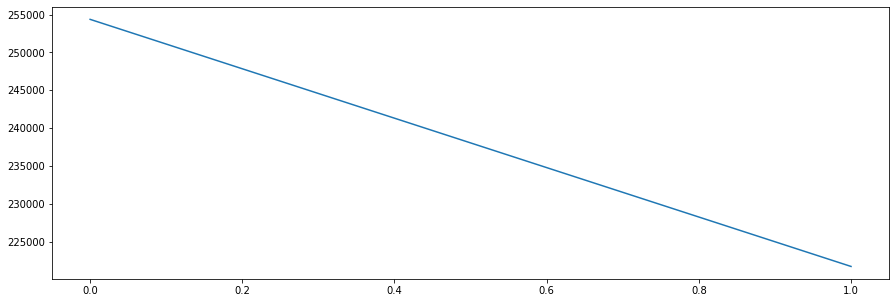

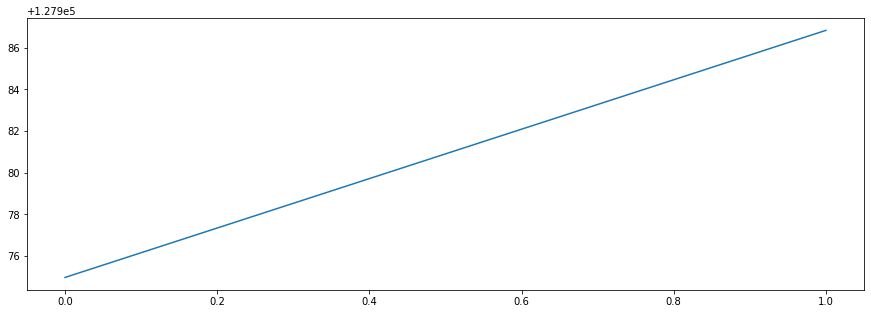

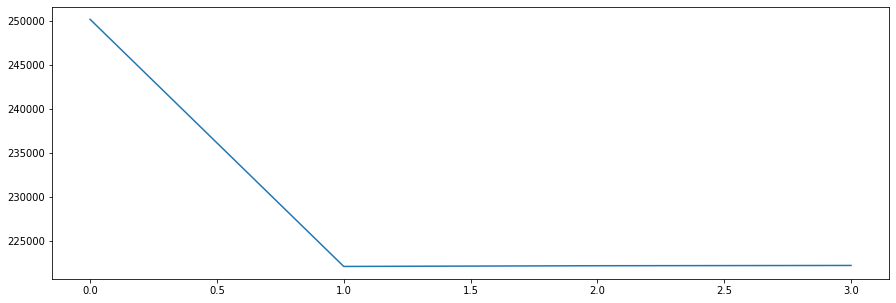

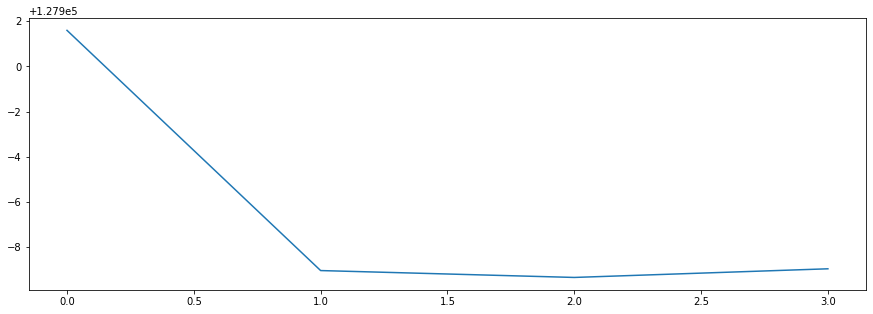

In [76]:
new_model = learn(20, 15000, 300, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(397338.) tensor(397338.)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(235162.2656) tensor(235162.2656)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(222064.6094) tensor(222064.6094)
epoch: 12
epoch:  12 loss: 235477.6093750000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(222697.6875) tensor(222697.6875)
epoch: 2
epoch:   2 loss: 250850.8906250000
epoch: 0
bast model hidden size: 100
bast model hidden size: 100
tensor(223840.3594) tensor(223840.3594)
epoch: 2
epoch:   2 loss: 261510.9687500000
epoch: 0
bast model hidden size: 200
tensor(225299.5625) tensor(225065.0781)
epoch:   1 loss: 254972.7031250000
epoch: 0
bast m

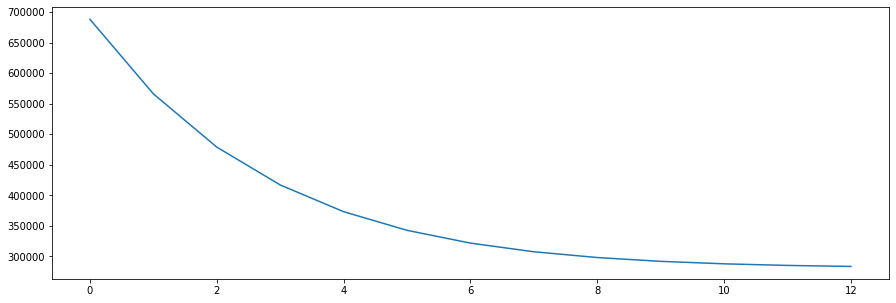

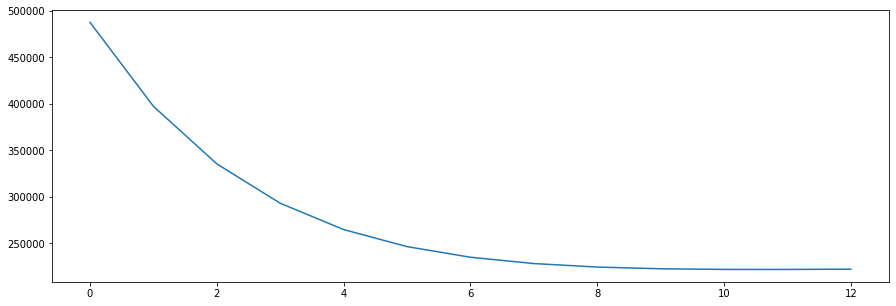

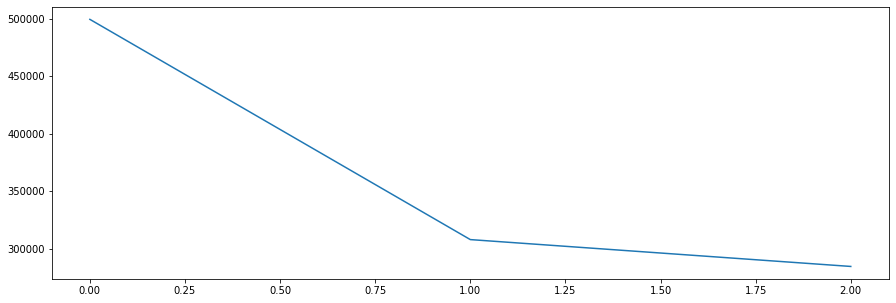

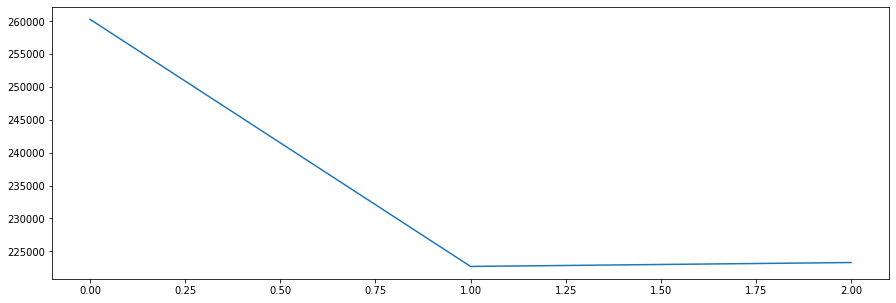

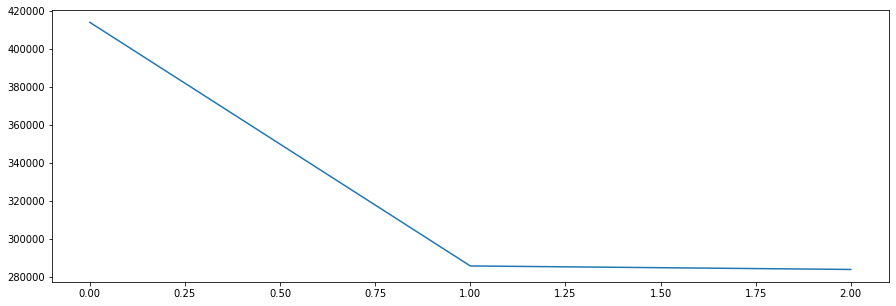

...

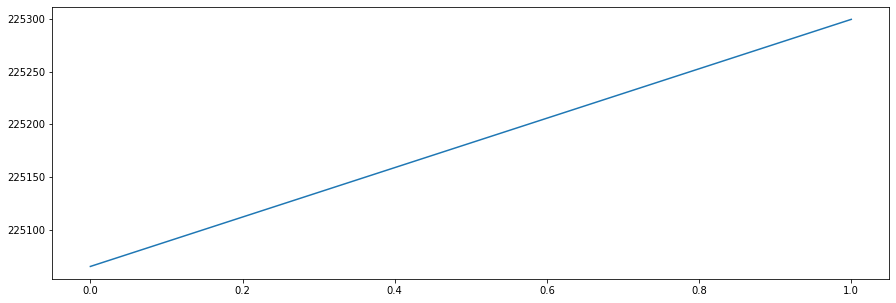

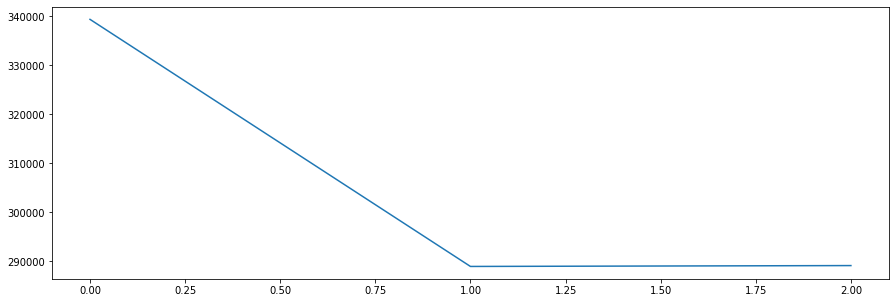

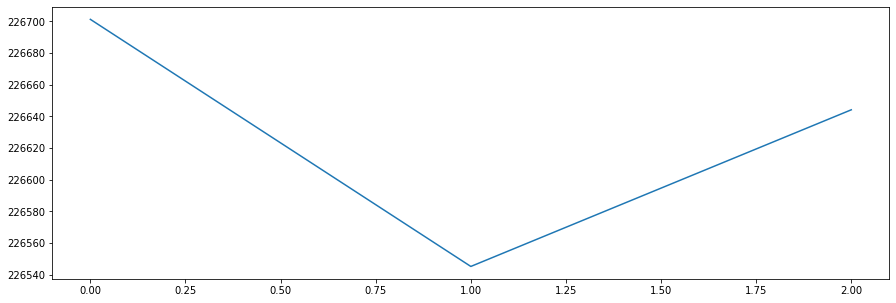

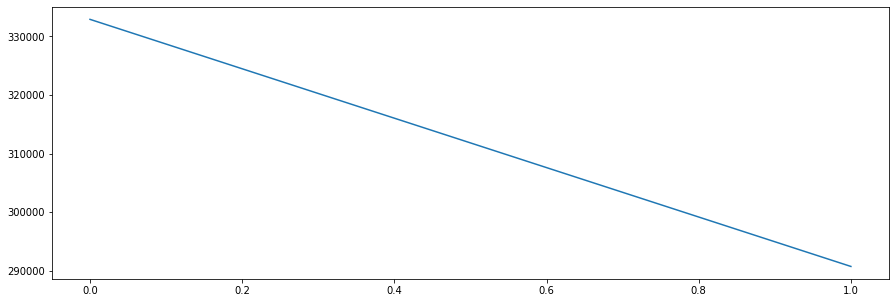

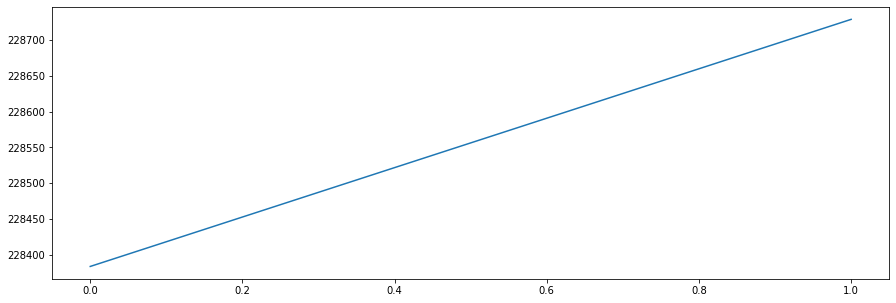

In [77]:
new_model = learn(20, 15000, 350, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(636968.1875) tensor(636968.1875)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(331698.3438) tensor(331698.3438)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(266777.0625) tensor(266777.0625)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(254127.9688) tensor(254127.9688)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch: 20
bast model hidden size: 10
bast model hidden size: 10
tensor(251130.6719) tensor(251130.6719)
epoch: 22
bast model hidden si

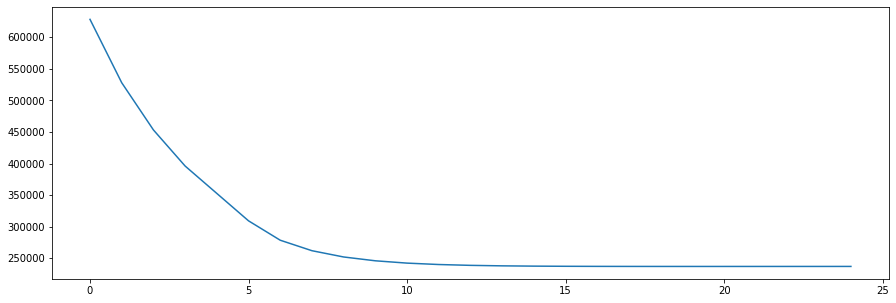

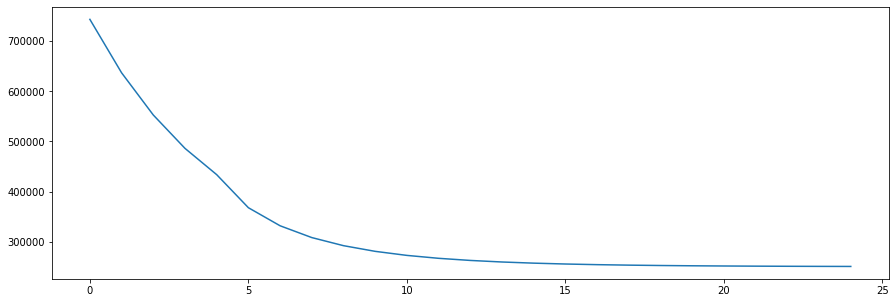

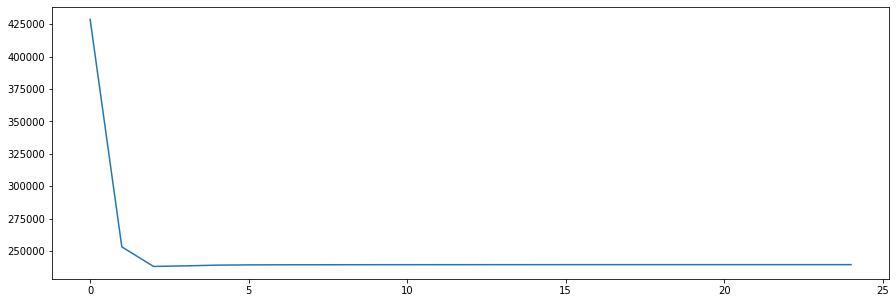

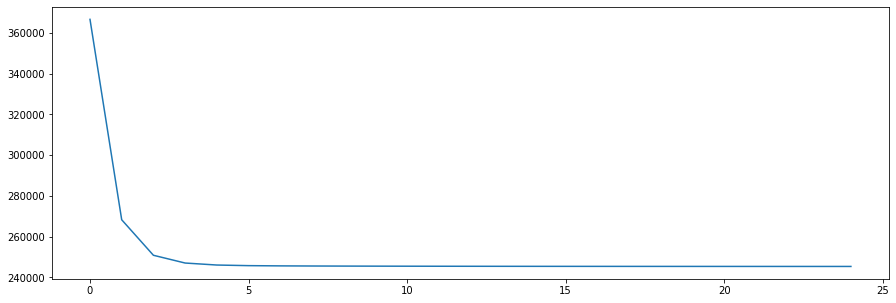

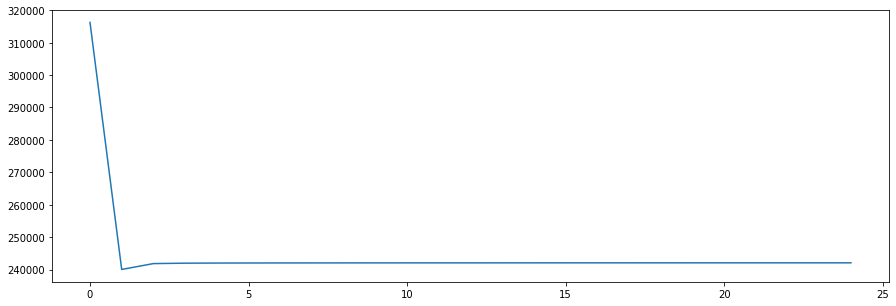

...

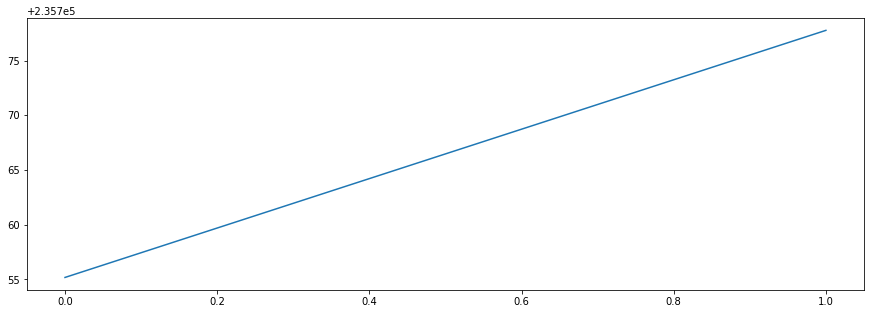

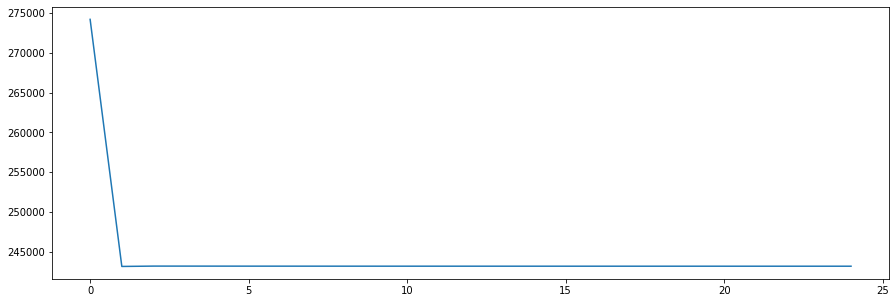

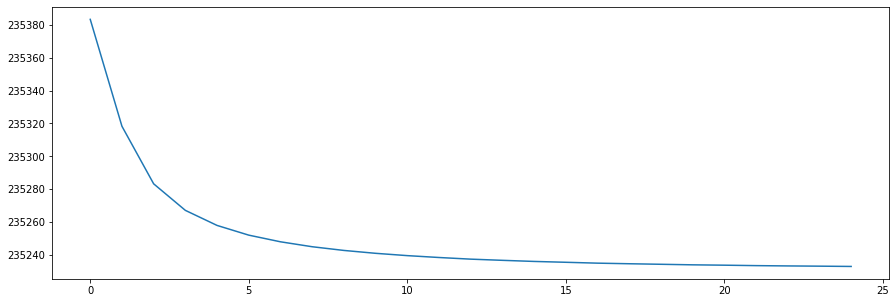

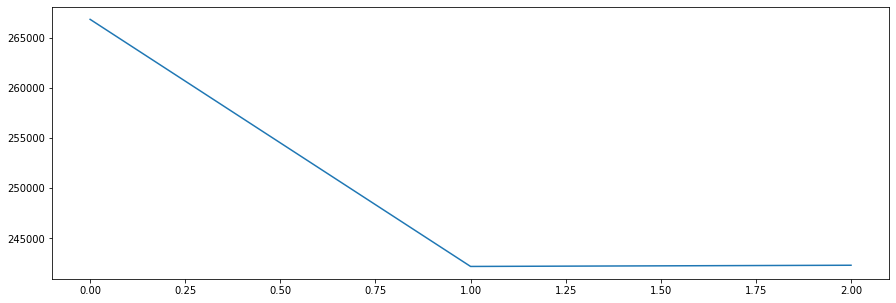

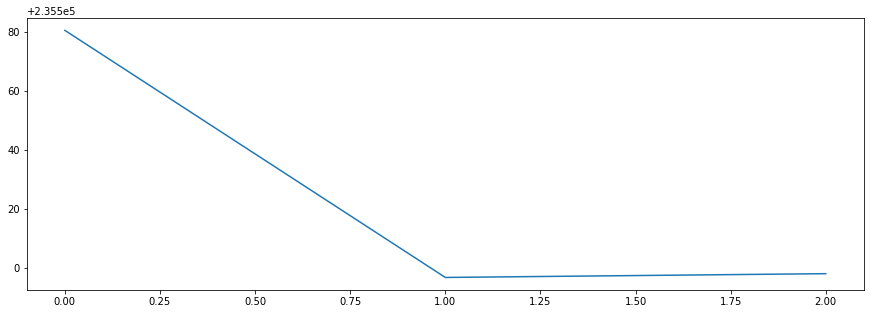

In [78]:
new_model = learn(20, 15000, 400, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(582400.7500) tensor(582400.7500)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(334129.3750) tensor(334129.3750)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(176593.3906) tensor(176593.3906)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(147486.9375) tensor(147486.9375)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch: 20
bast model hidden size: 10
bast model hidden size: 10
tensor(140701.7812) tensor(140701.7812)
epoch: 22
bast model hidden si

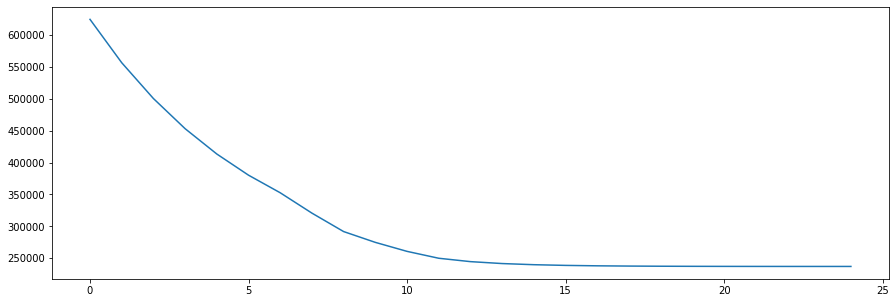

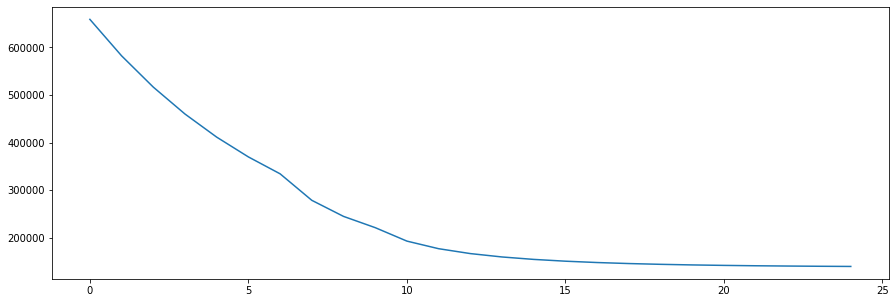

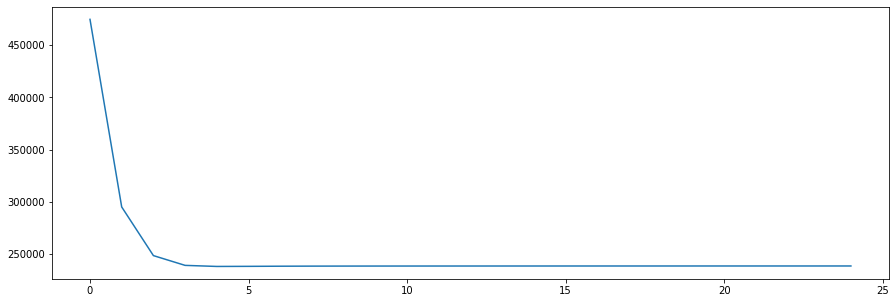

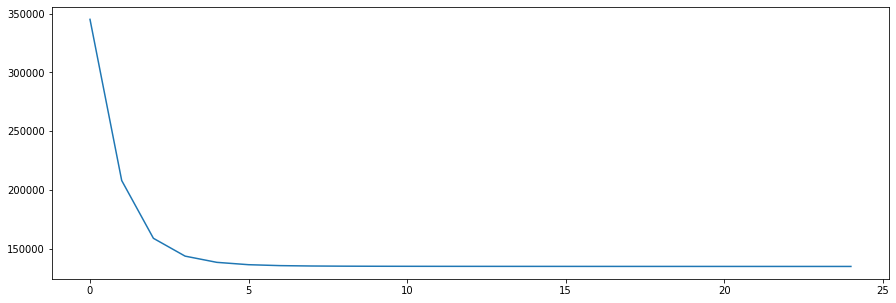

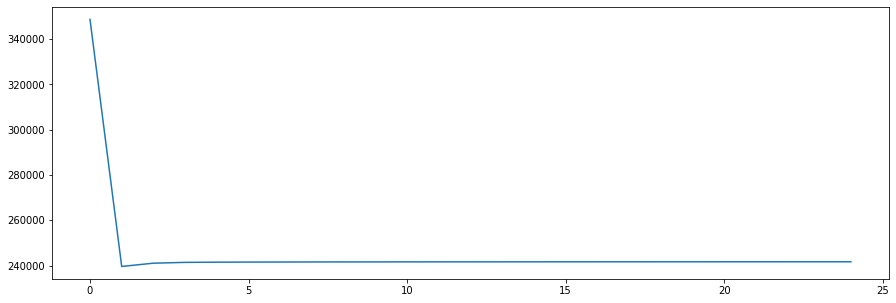

...

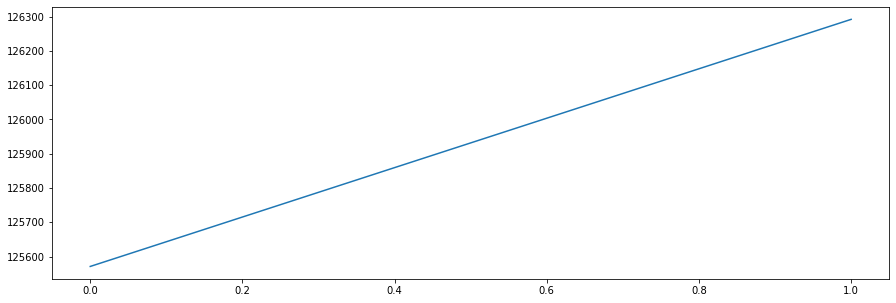

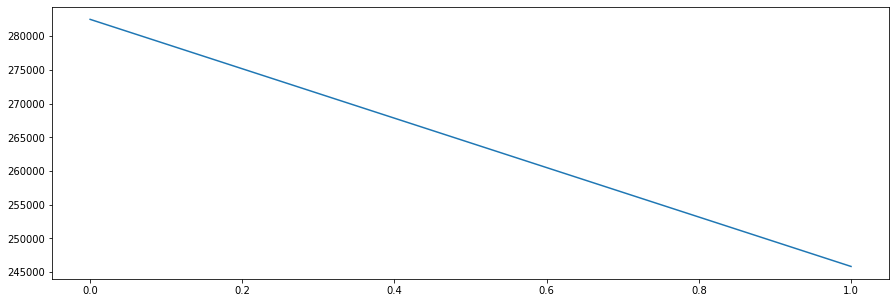

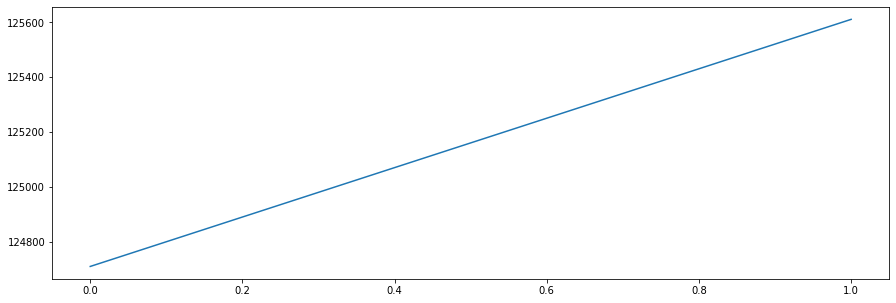

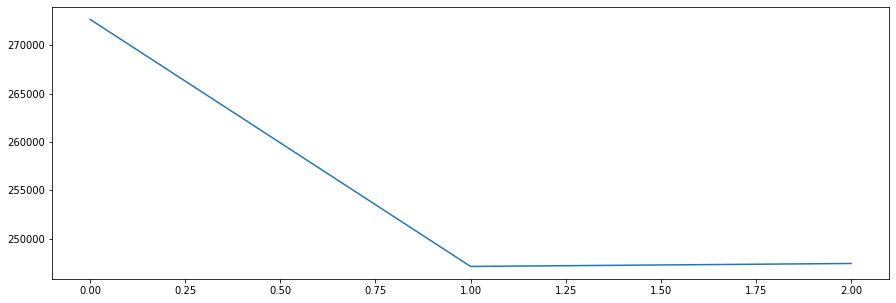

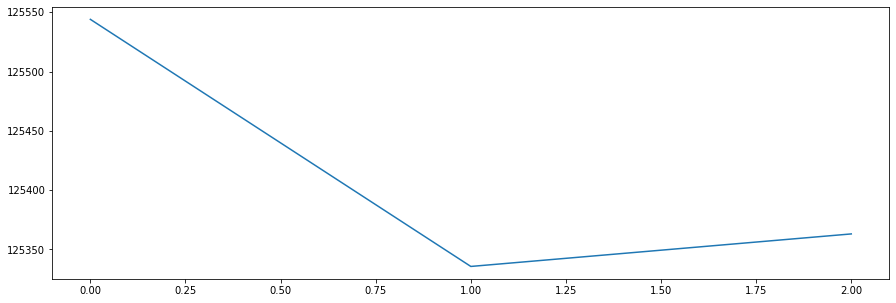

In [79]:
new_model = learn(20, 15000, 450, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(453367.4688) tensor(453367.4688)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(241662.4375) tensor(241662.4375)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(155982.2812) tensor(155982.2812)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(129954.4609) tensor(129954.4609)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 84337.2890625000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(160068.4219) tensor(160068.421

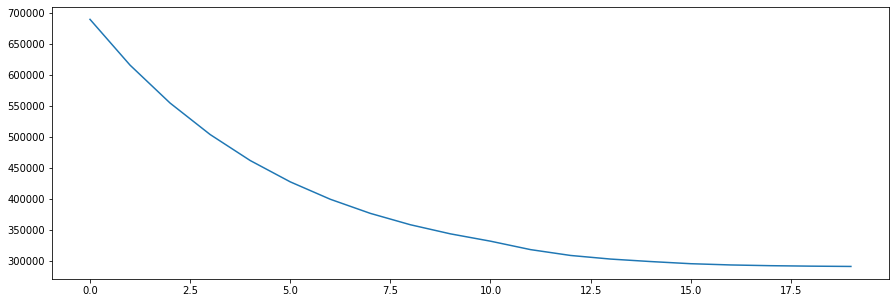

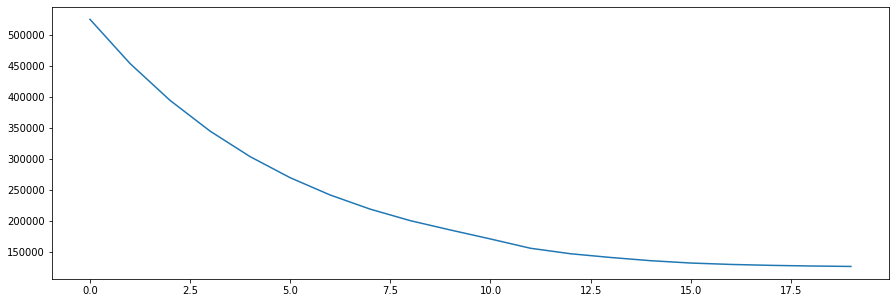

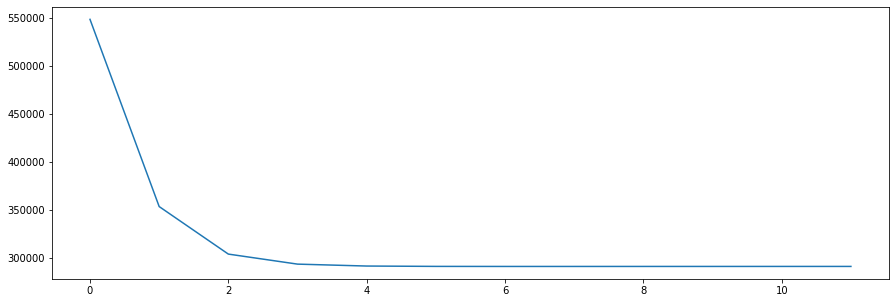

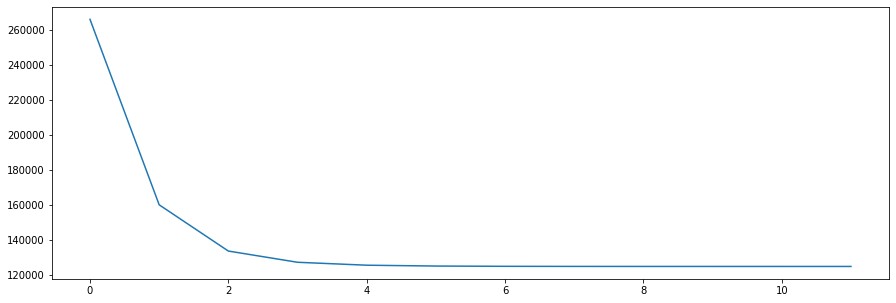

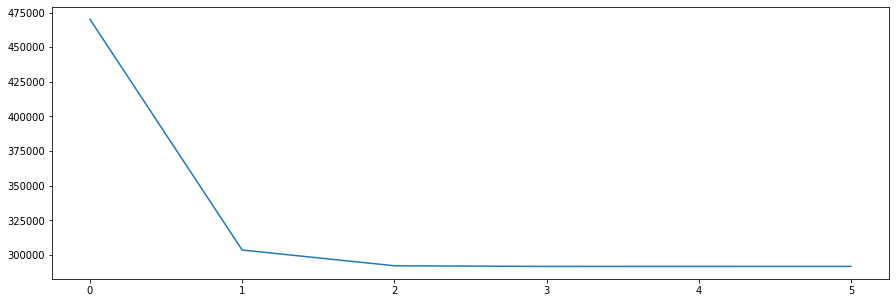

...

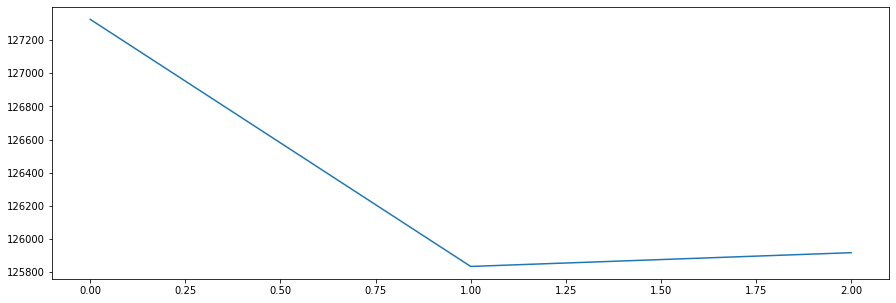

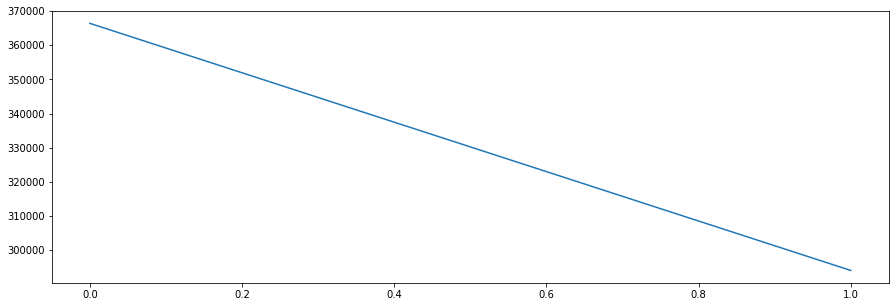

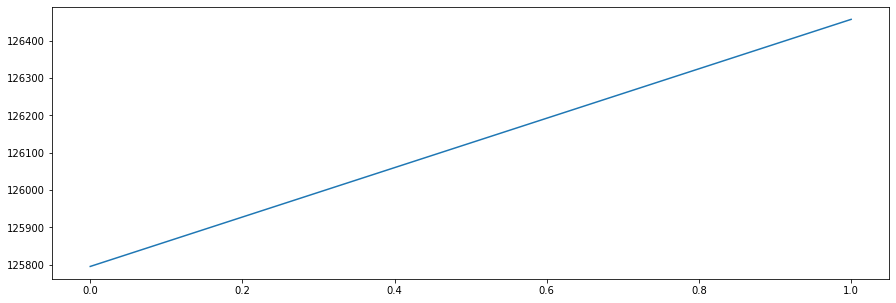

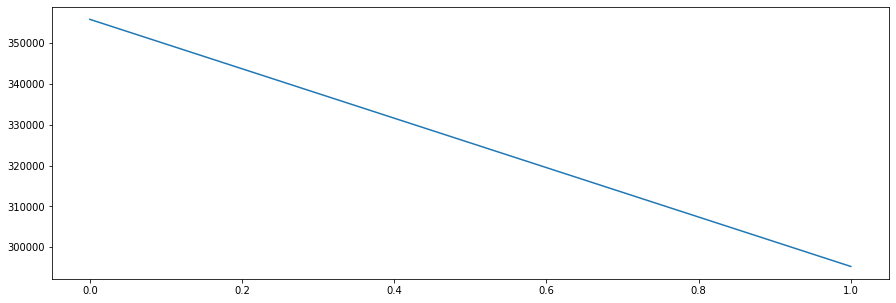

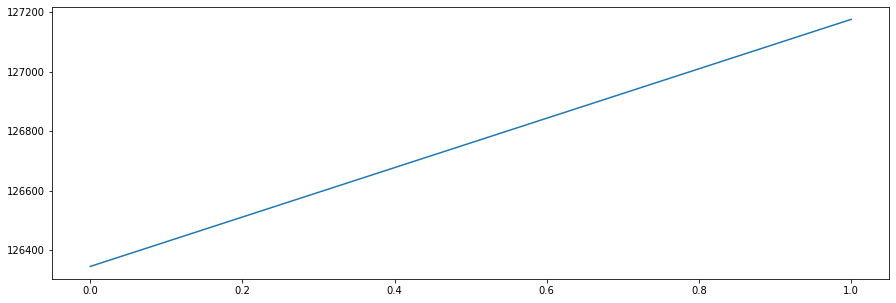

In [92]:
new_model = learn(20, 15000, 500, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(737713.6875) tensor(737713.6875)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(451091.1562) tensor(451091.1562)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(343958.8750) tensor(343958.8750)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(305899.7812) tensor(305899.7812)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 2537717.0000000000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(417998.7812) tensor(417998.7

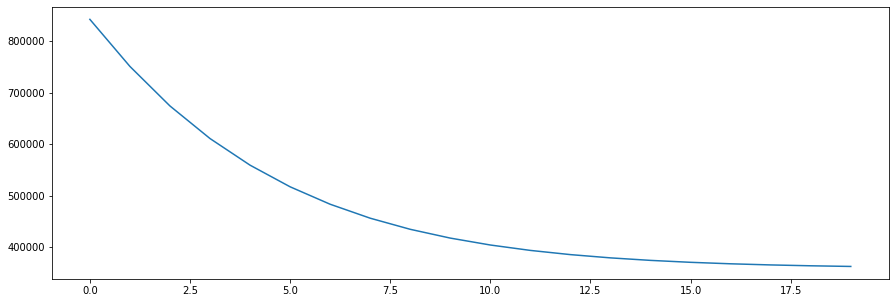

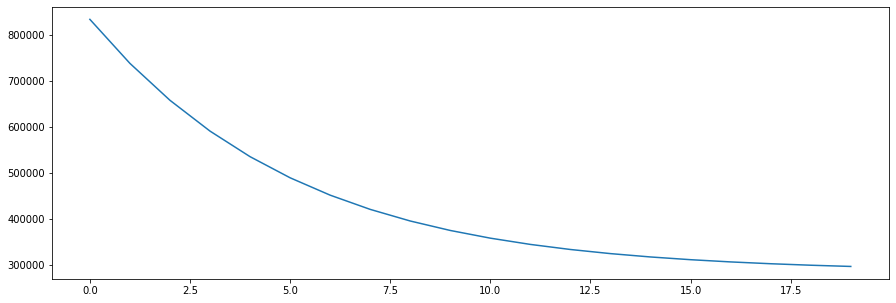

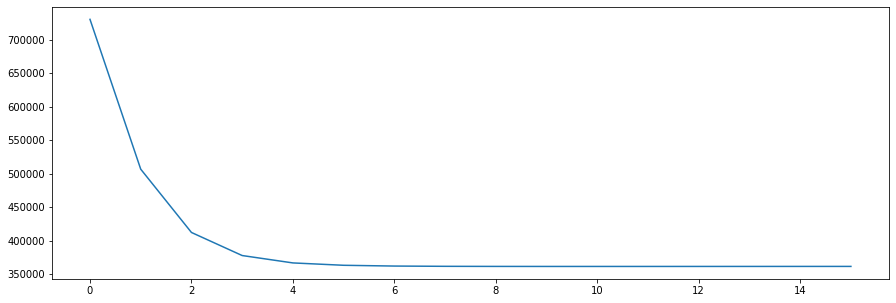

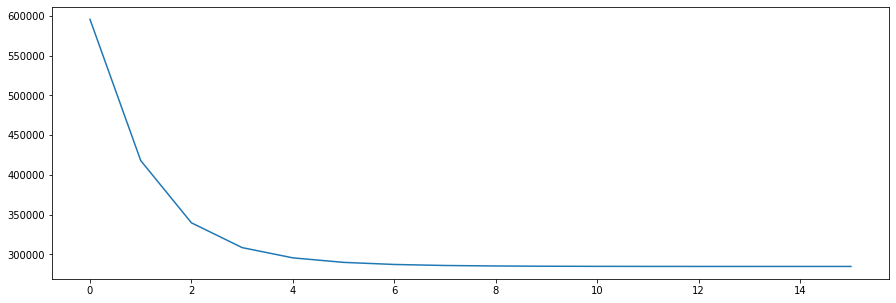

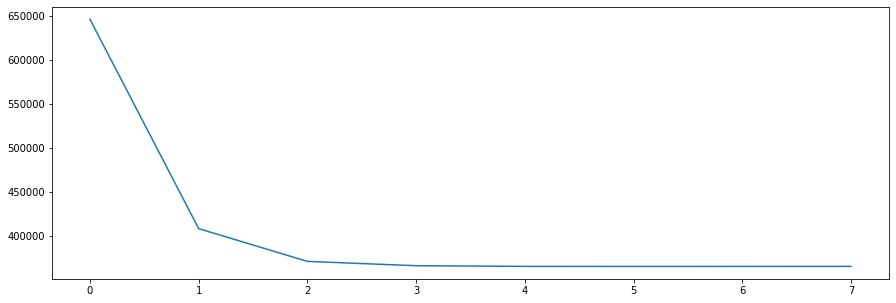

...

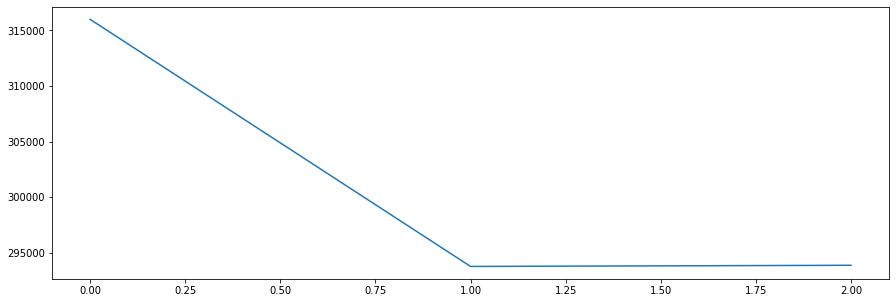

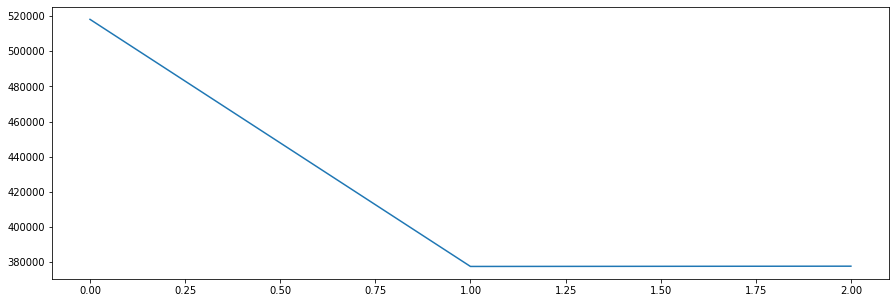

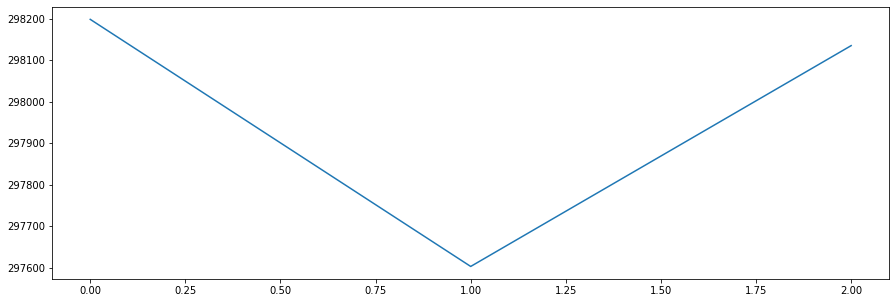

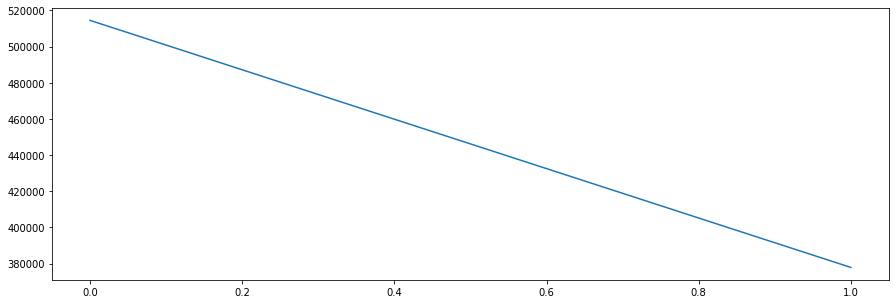

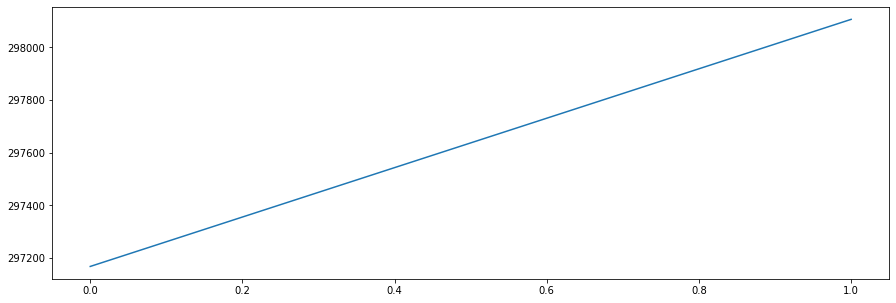

In [93]:
new_model = learn(20, 15000, 550, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(953956.6250) tensor(953956.6250)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(762068.7500) tensor(762068.7500)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(649163.1250) tensor(649163.1250)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(605083.5000) tensor(605083.5000)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 184428.7656250000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(649565.) tensor(649565.)
epoc

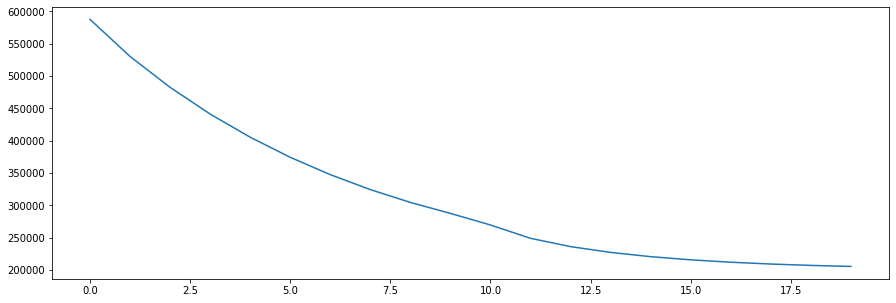

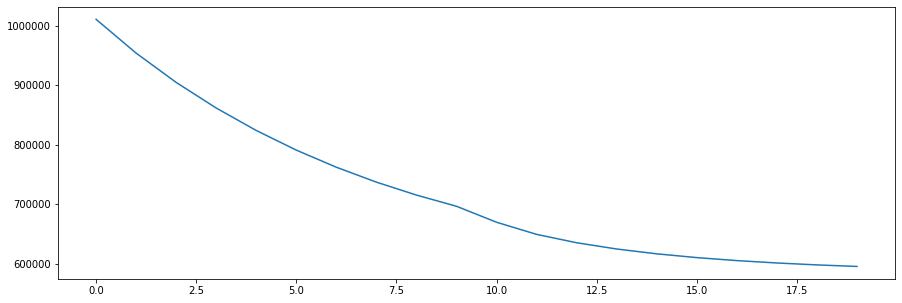

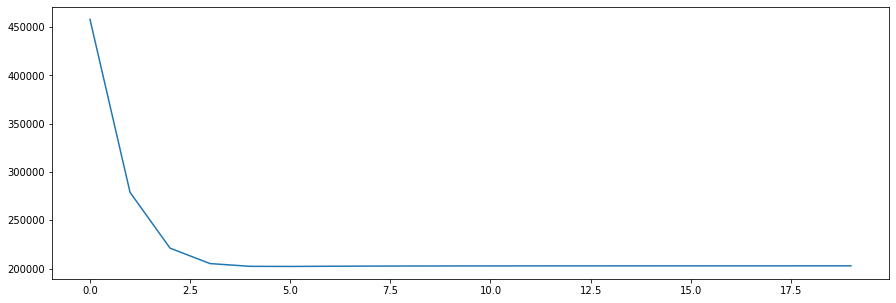

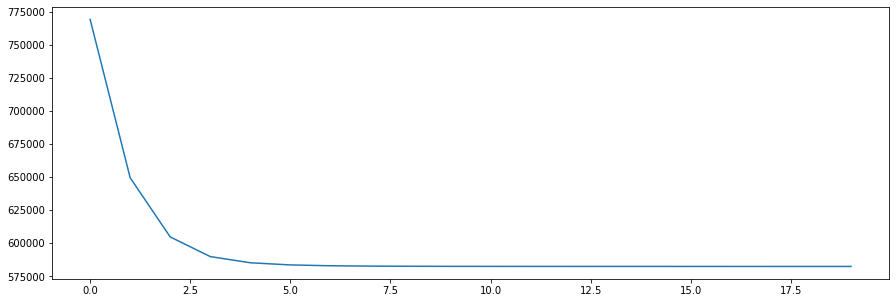

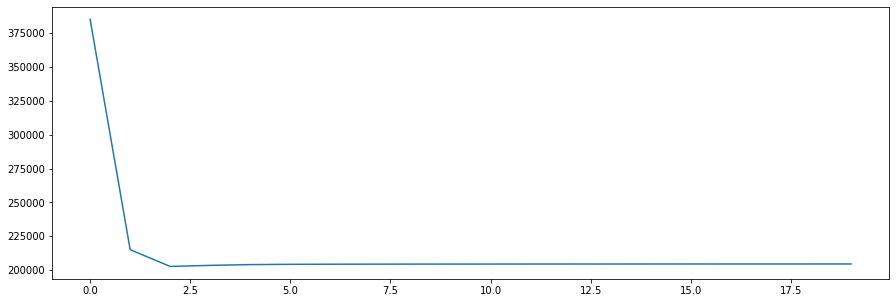

...

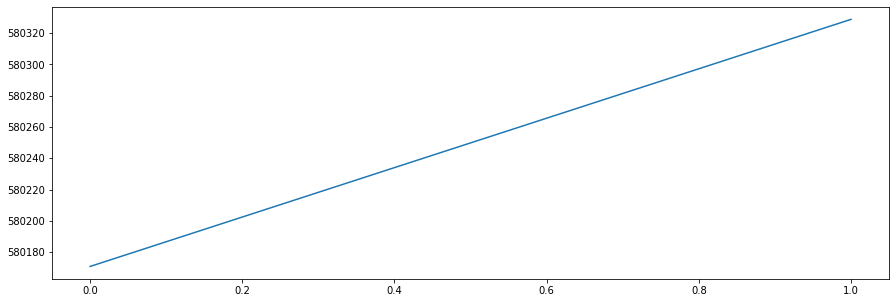

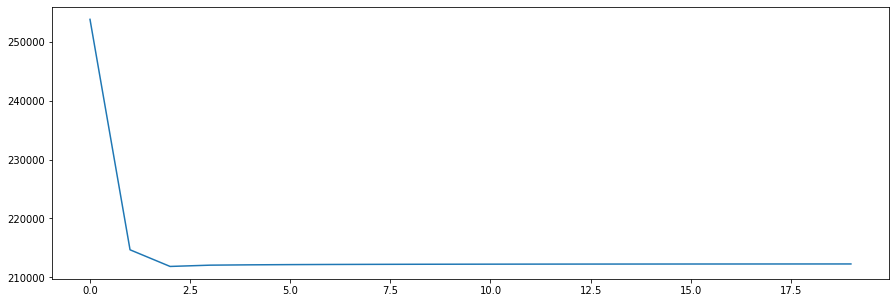

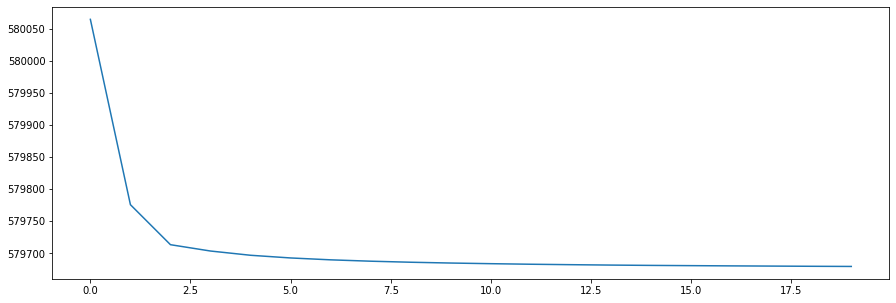

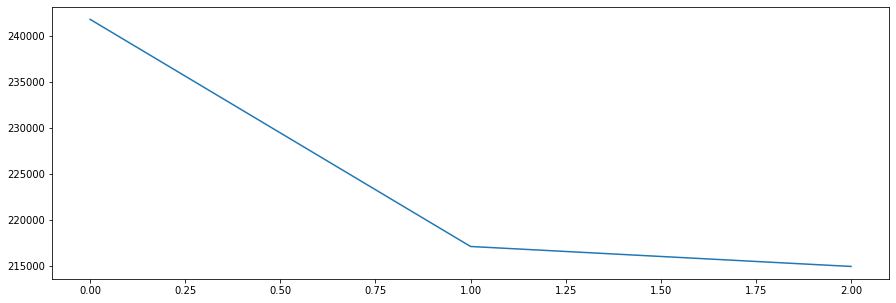

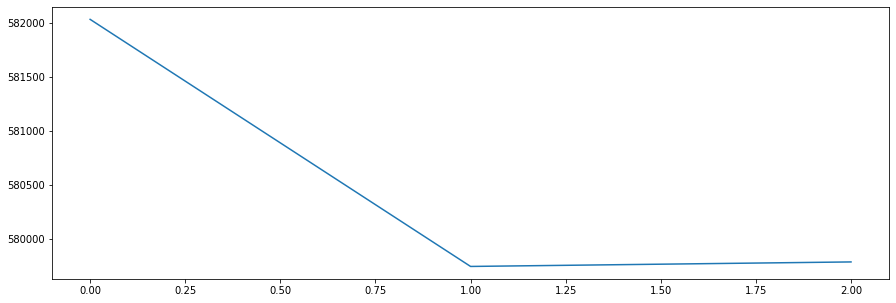

In [94]:
new_model = learn(20, 15000, 600, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(370280.5000) tensor(370280.5000)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(243277.0938) tensor(243277.0938)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(183948.0312) tensor(183948.0312)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(163452.8125) tensor(163452.8125)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 153055.7500000000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(197014.2188) tensor(197014.21

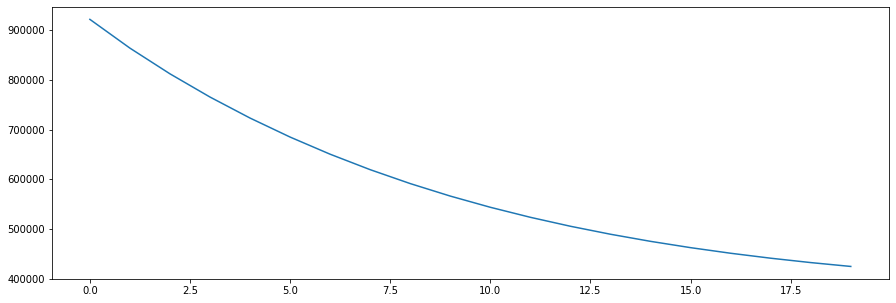

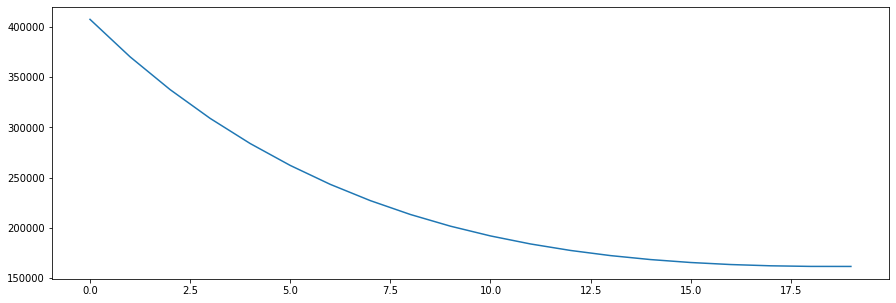

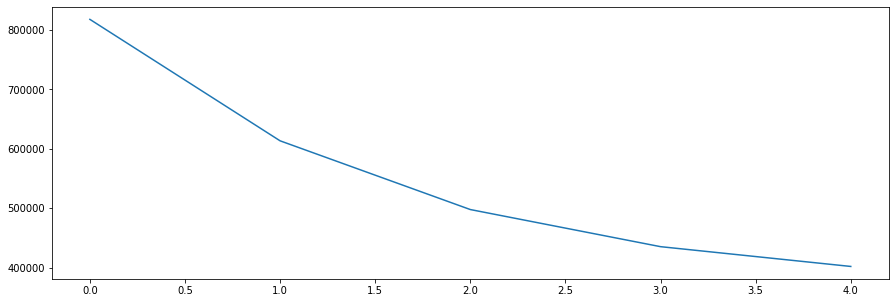

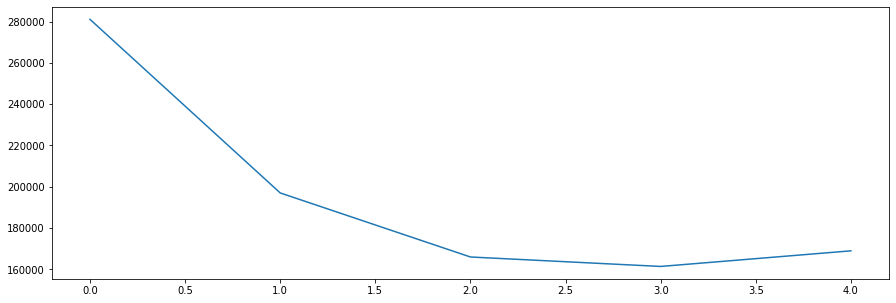

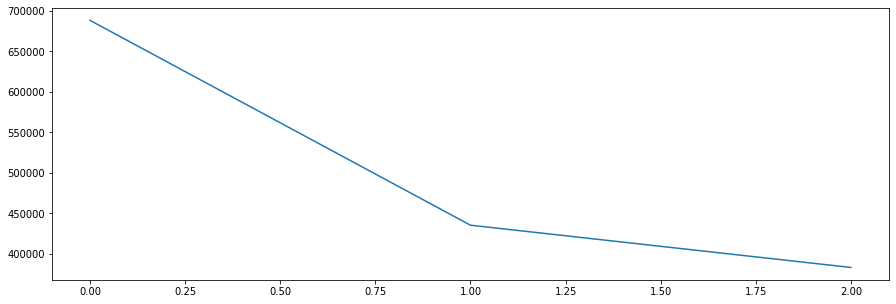

...

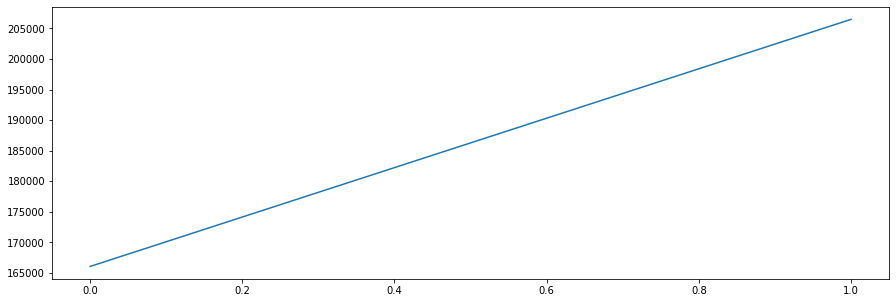

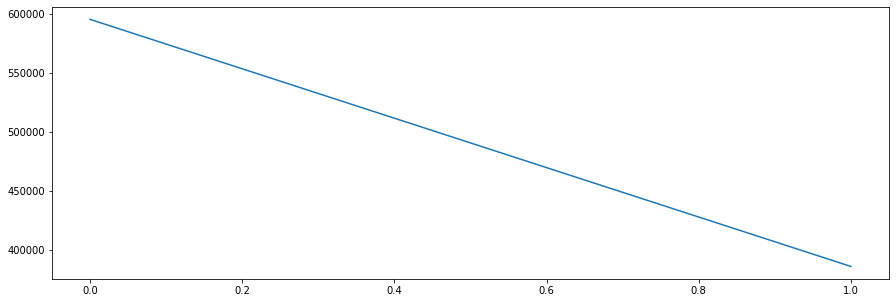

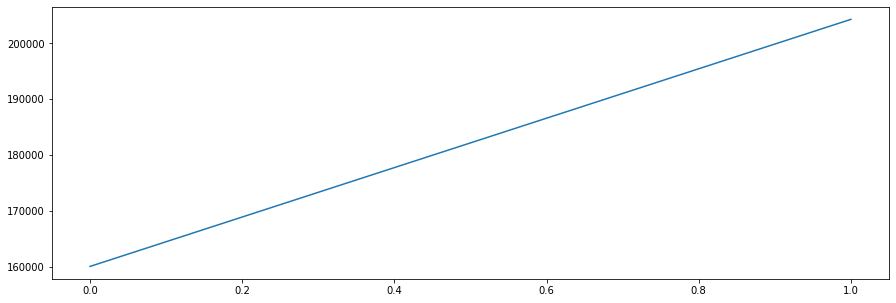

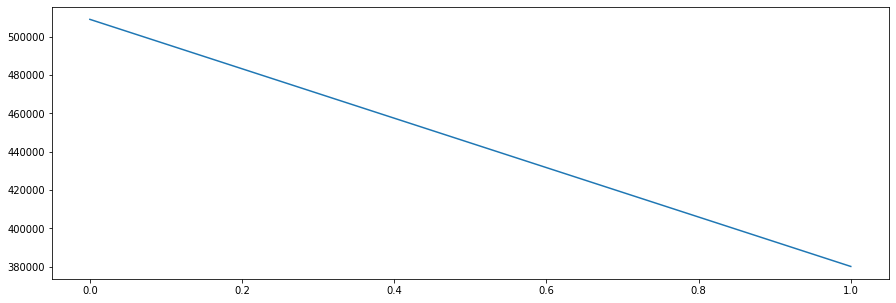

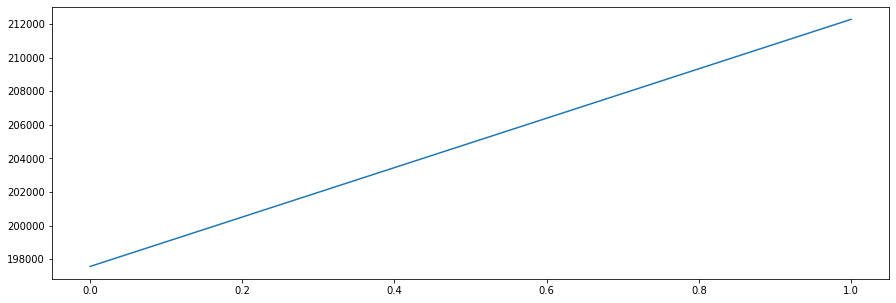

In [95]:
new_model = learn(20, 15000, 650, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(317157.1562) tensor(317157.1562)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(165501.6875) tensor(165501.6875)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(130945.2969) tensor(130945.2969)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
epoch:  14 loss: 73594.2656250000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(175399.1406) tensor(175399.1406)
epoch: 2
bast model hidden size: 50
epoch: 3
bast model hidden size: 50
epoch: 4
epoch:   4 loss: 66081.1718750000
epoch: 0
bast model hidden size: 100
bast model hidden size: 100
tensor(130408.1719) tensor(130408.1719)
epoch: 2
epoch:   2

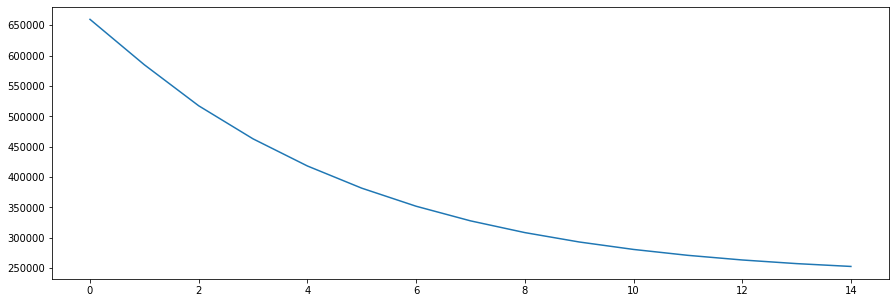

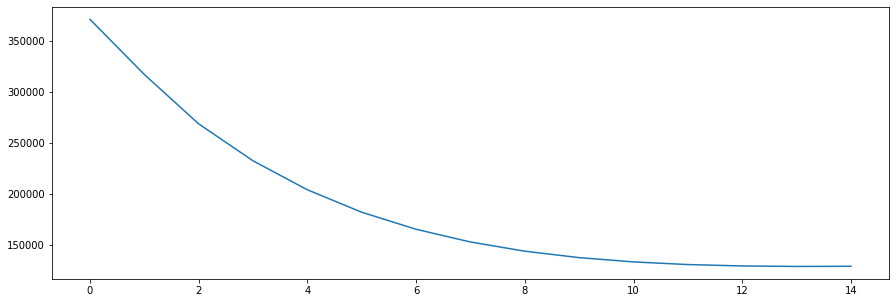

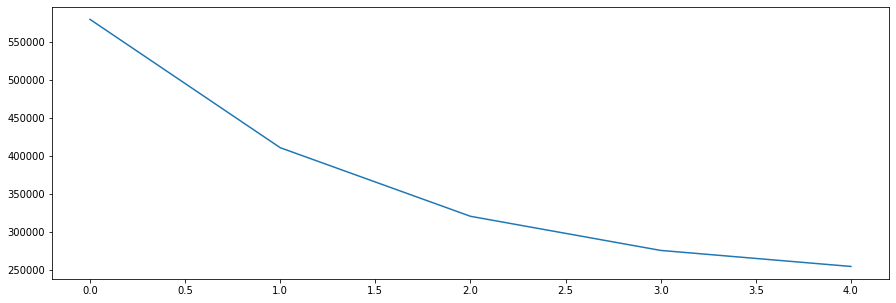

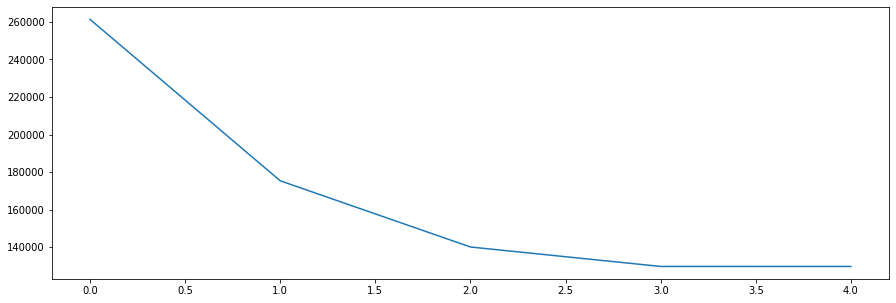

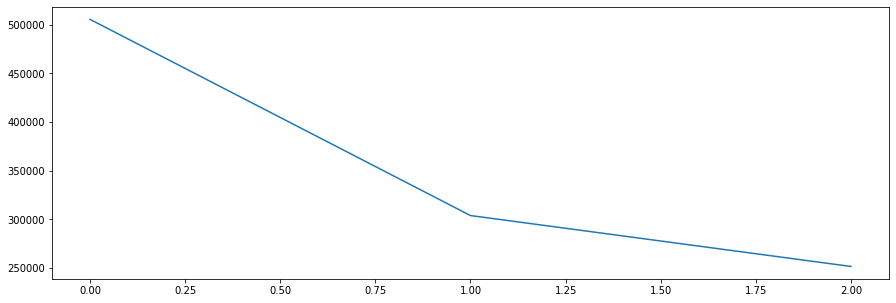

...

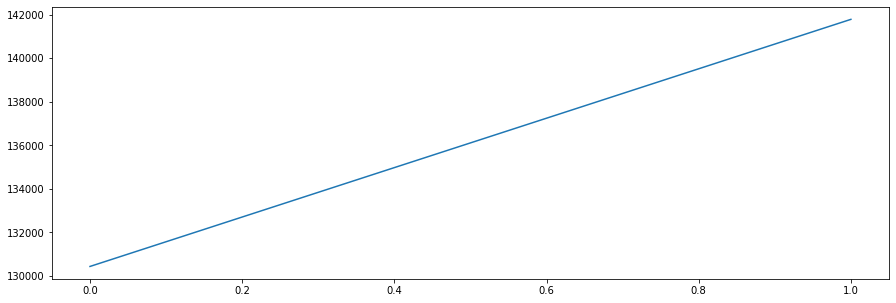

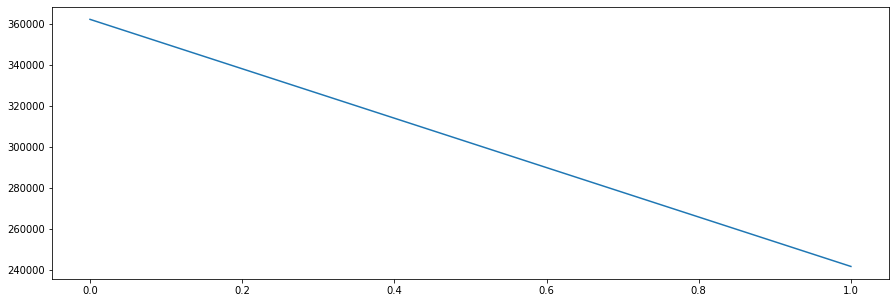

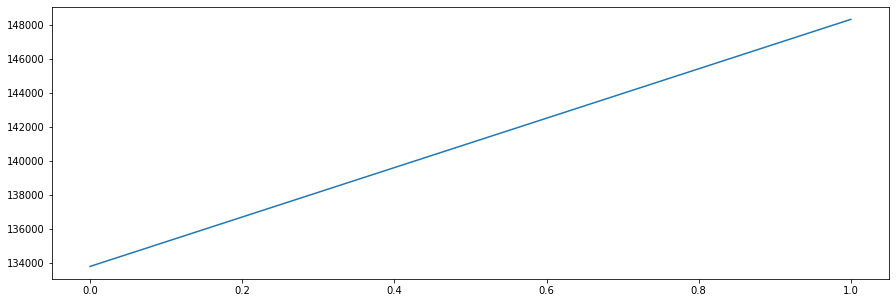

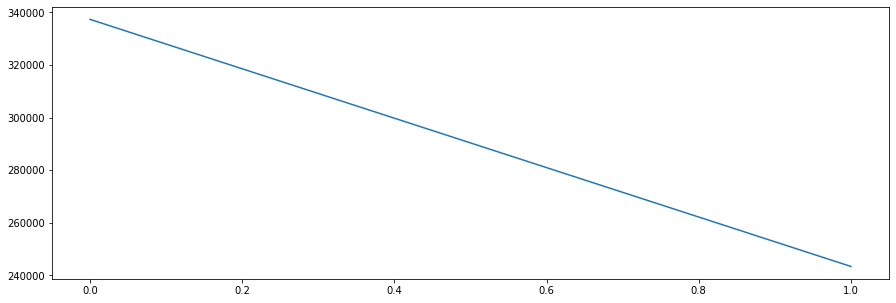

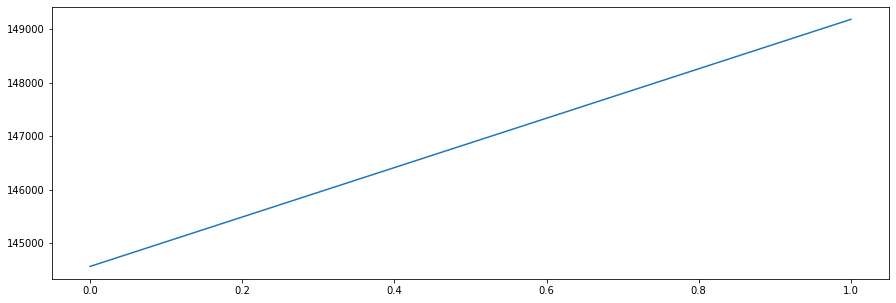

In [96]:
new_model = learn(20, 15000, 700, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(561971.6875) tensor(561971.6875)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(491955.1875) tensor(491955.1875)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(432457.8750) tensor(432457.8750)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(382191.7500) tensor(382191.7500)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 1008405.0000000000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(346092.3750) tensor(346092.3

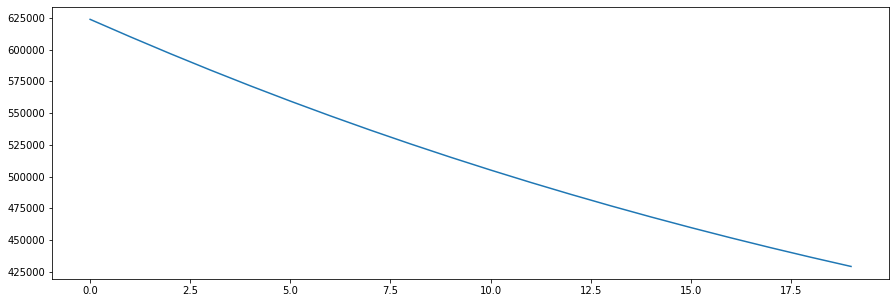

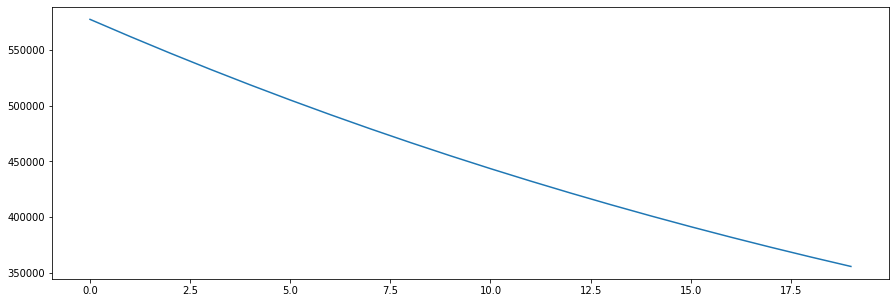

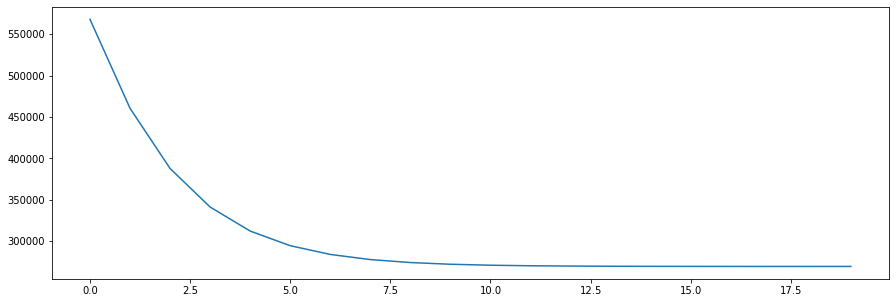

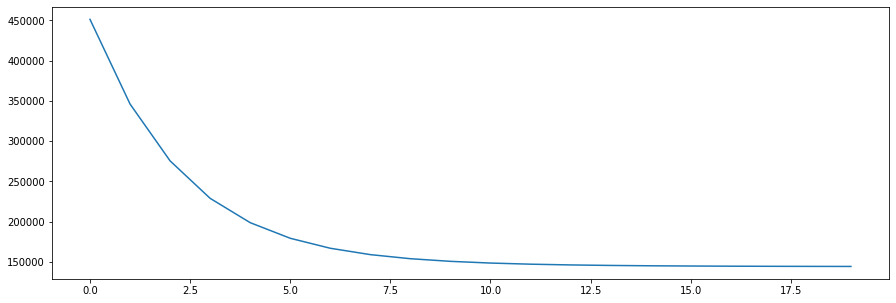

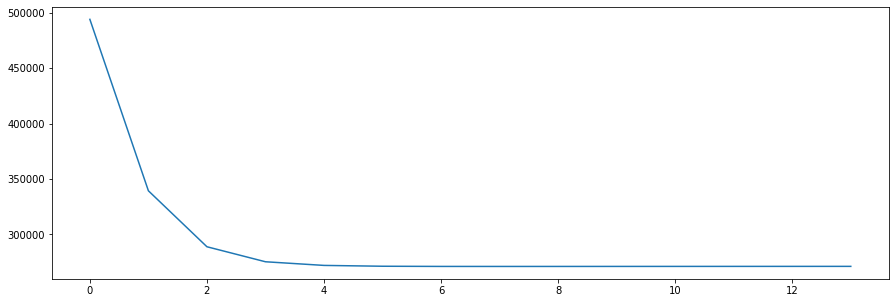

...

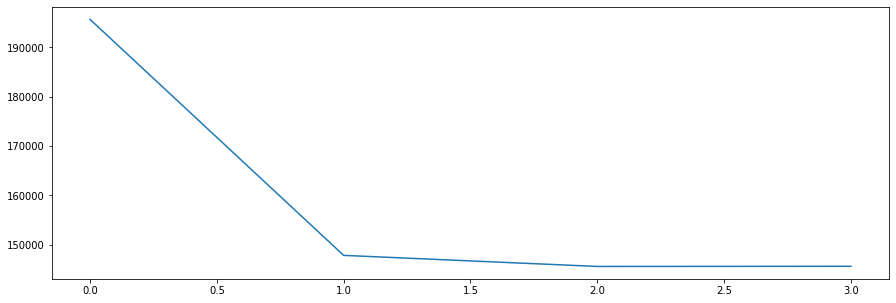

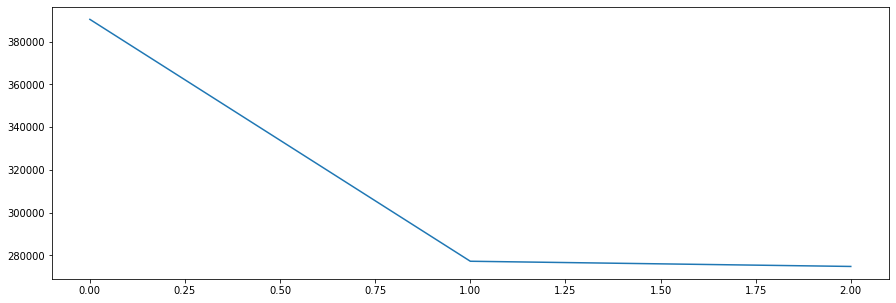

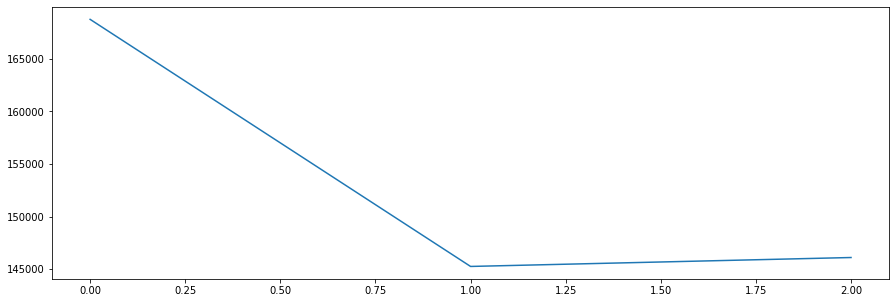

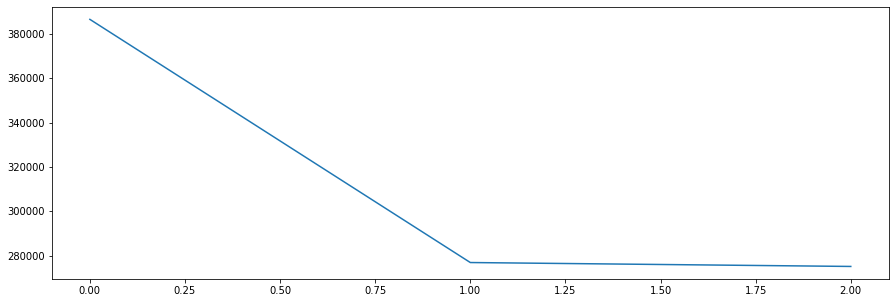

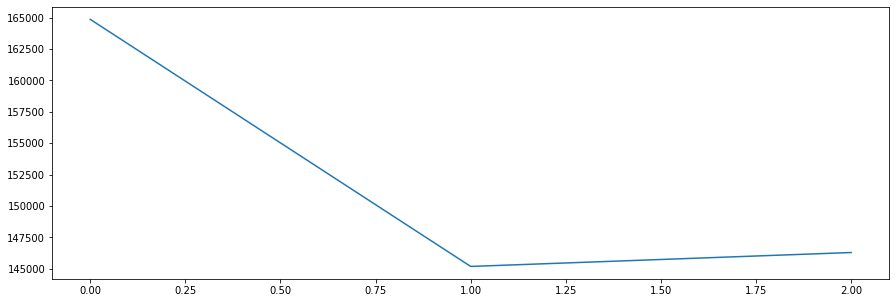

In [97]:
new_model = learn(20, 15000, 750, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(402428.0938) tensor(402428.0938)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(271332.9062) tensor(271332.9062)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(194968.4531) tensor(194968.4531)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(152969.6406) tensor(152969.6406)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 77858.7734375000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(227246.5781) tensor(227246.578

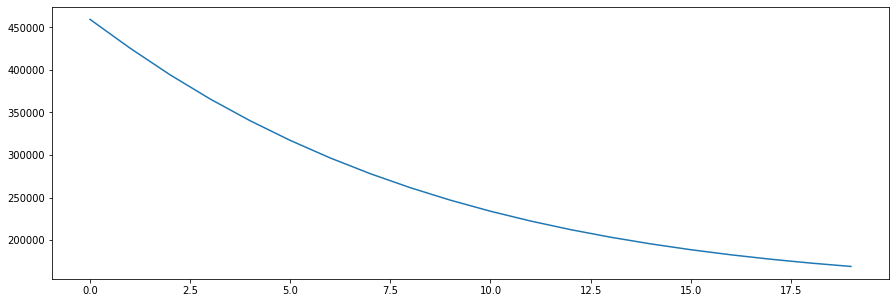

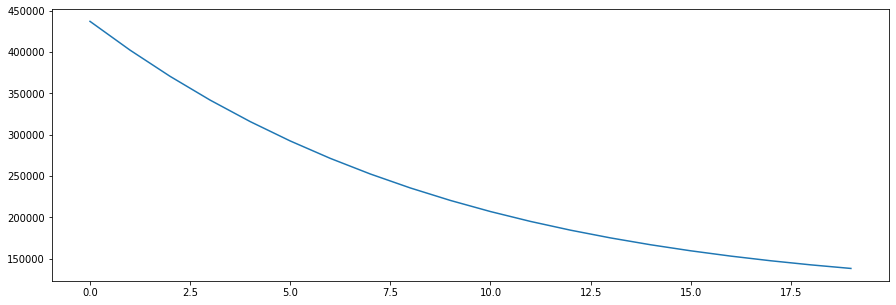

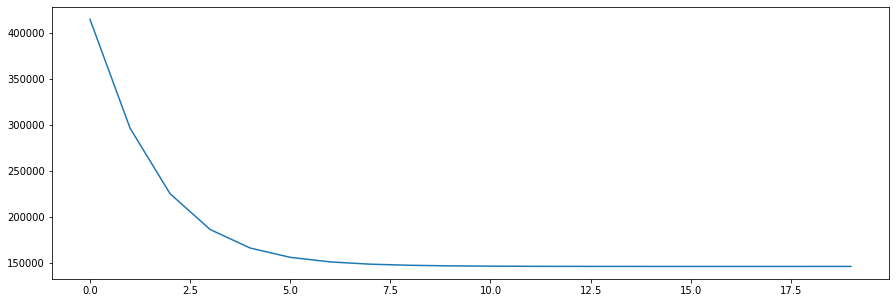

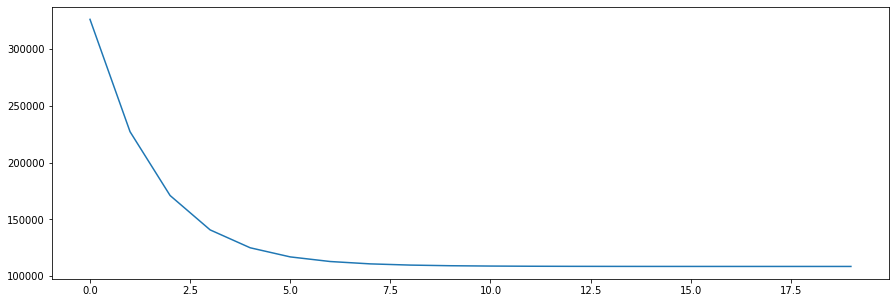

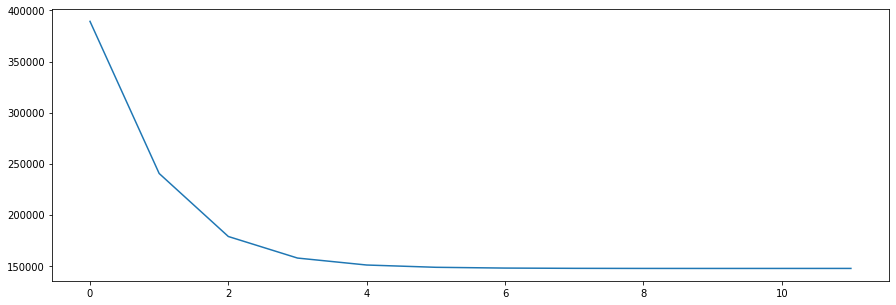

...

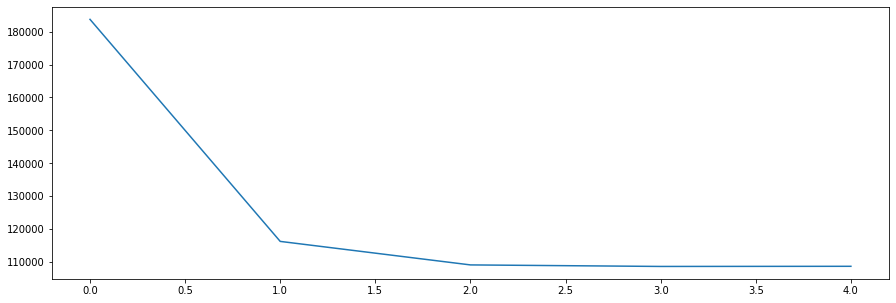

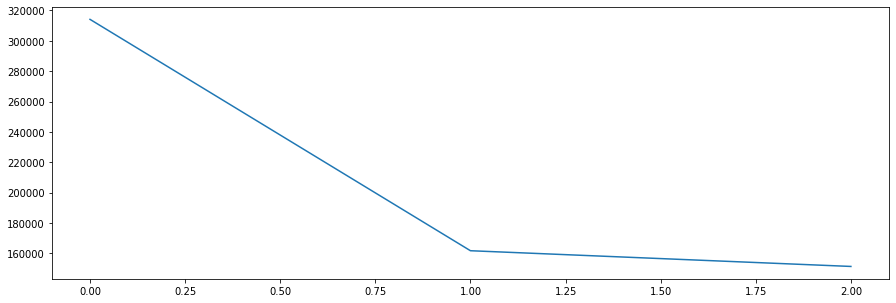

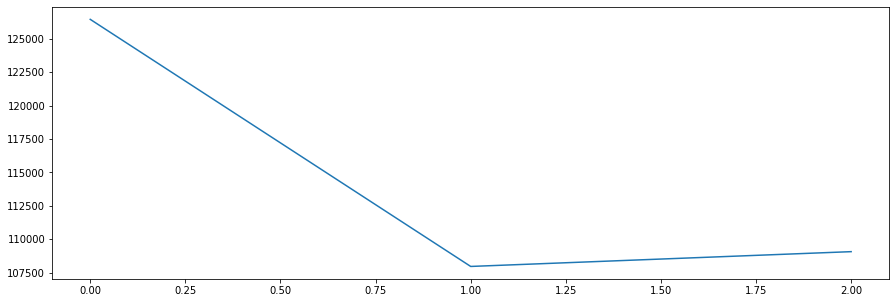

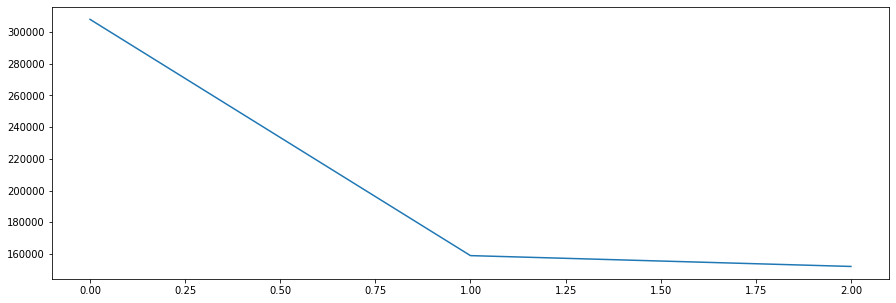

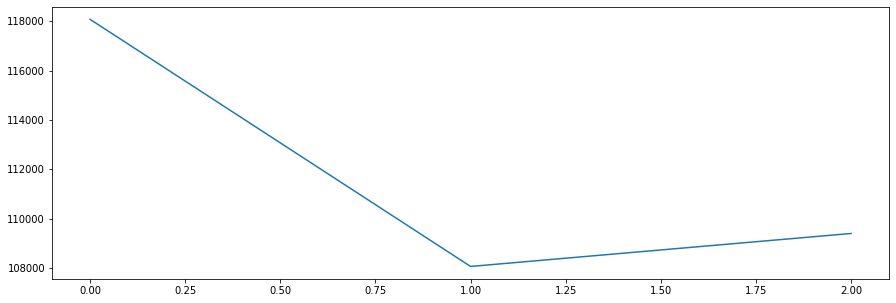

In [98]:
new_model = learn(20, 15000, 800, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(317957.5938) tensor(317957.5938)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(273318.4062) tensor(273318.4062)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(235871.1875) tensor(235871.1875)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(204550.4375) tensor(204550.4375)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 376303.2500000000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(143318.0156) tensor(143318.01

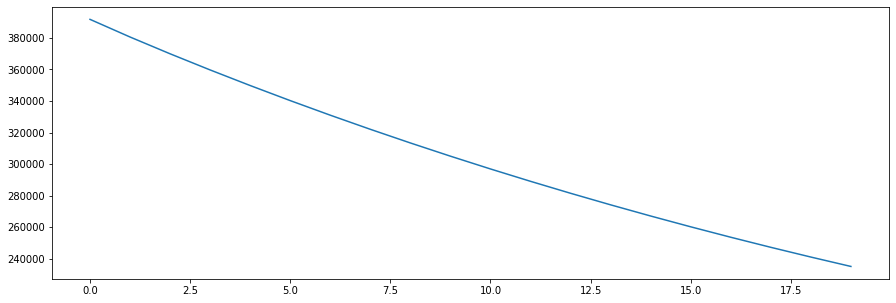

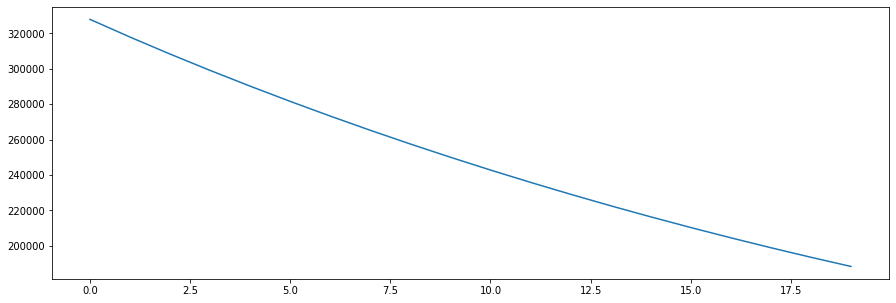

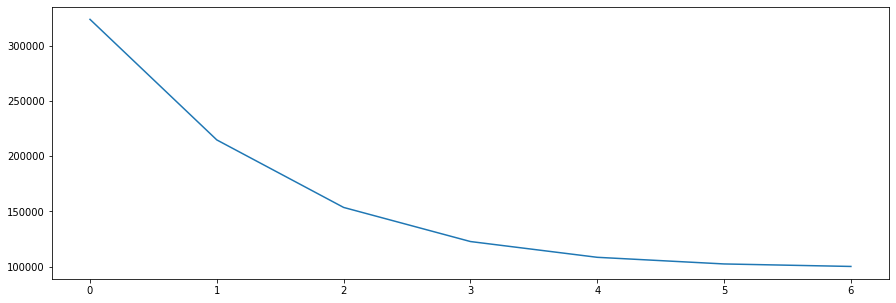

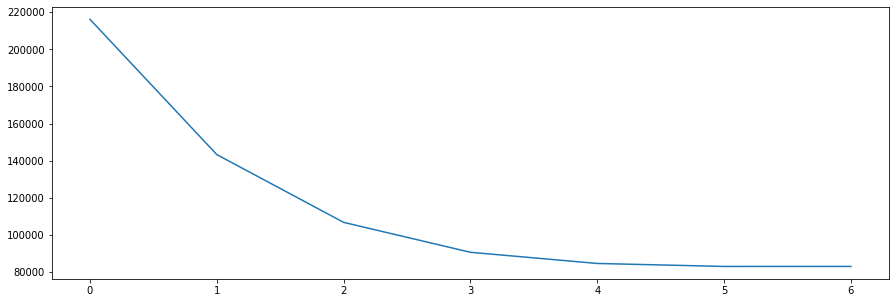

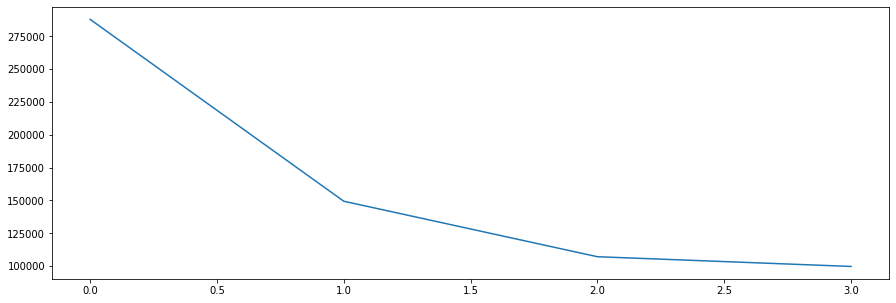

...

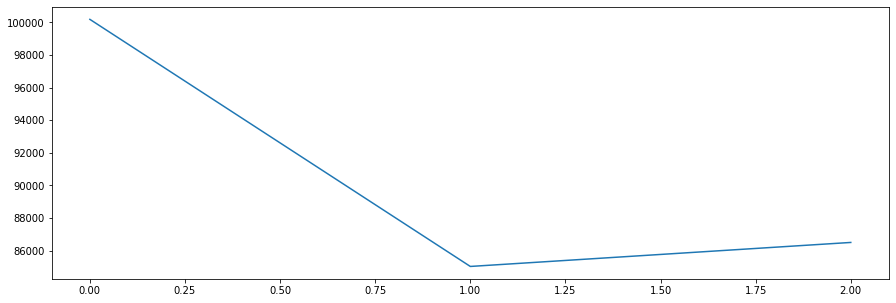

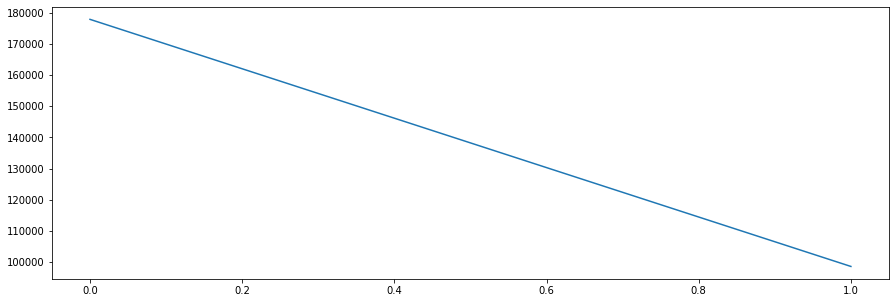

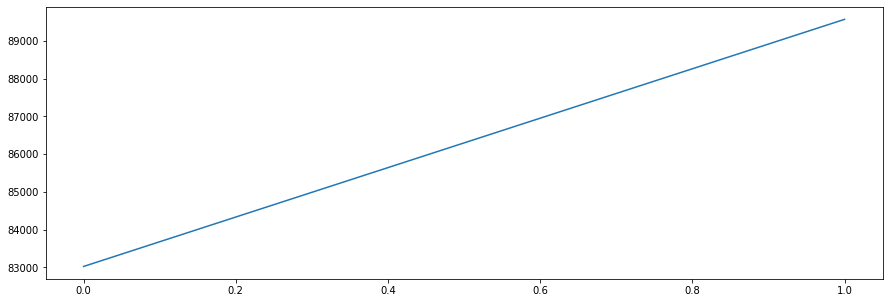

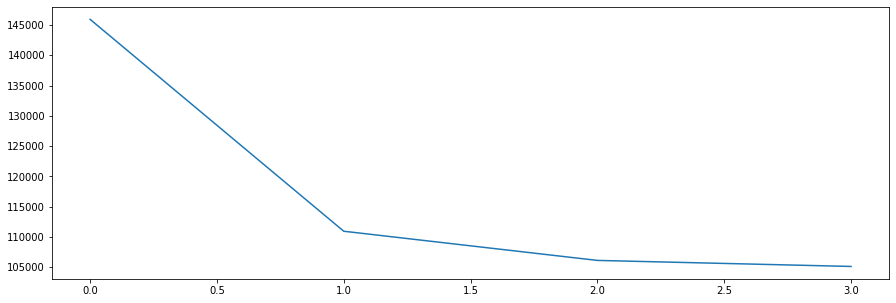

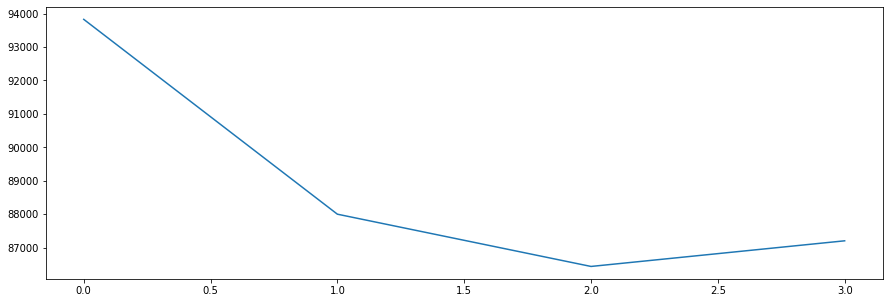

In [99]:
new_model = learn(20, 15000, 850, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(762764.3750) tensor(762764.3750)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(664636.2500) tensor(664636.2500)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(580978.8125) tensor(580978.8125)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(510133.8438) tensor(510133.8438)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 610235.9375000000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(468493.0938) tensor(468493.09

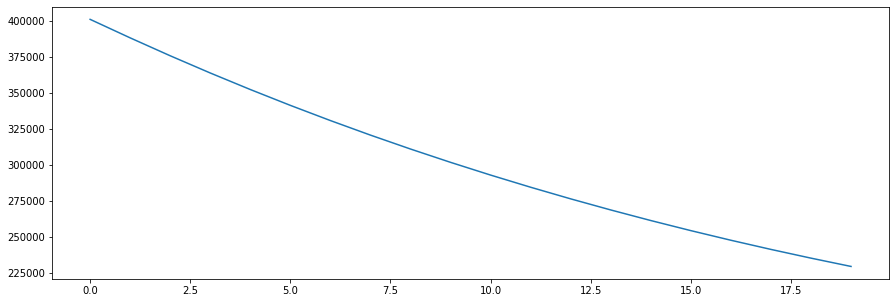

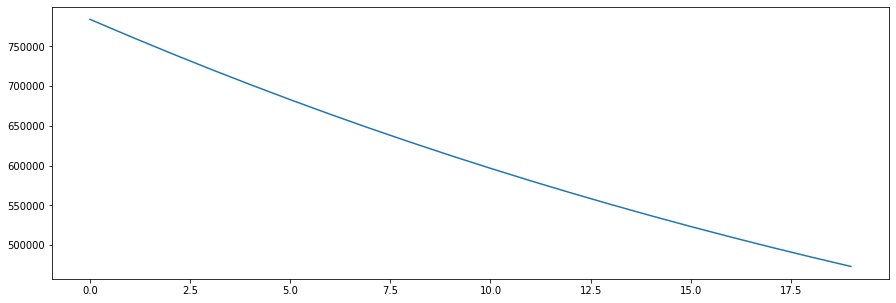

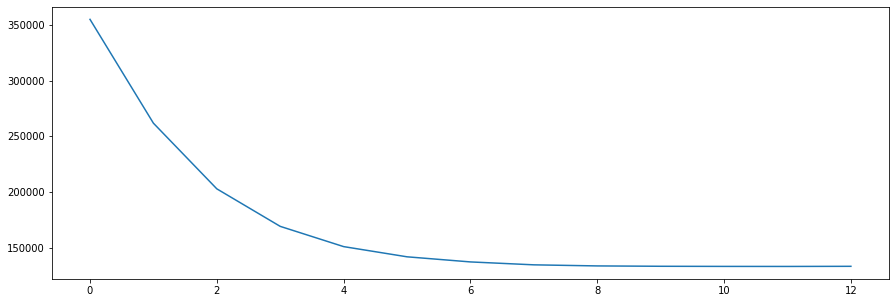

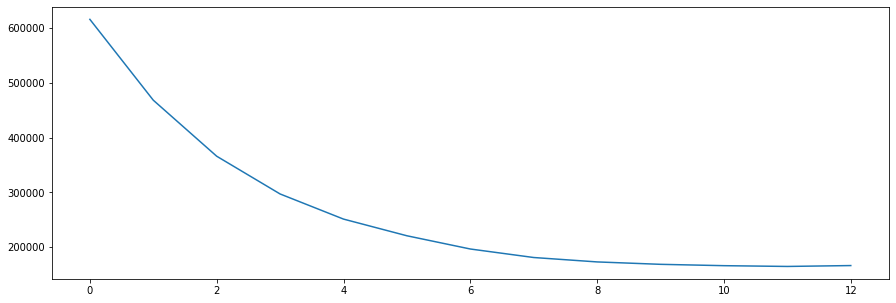

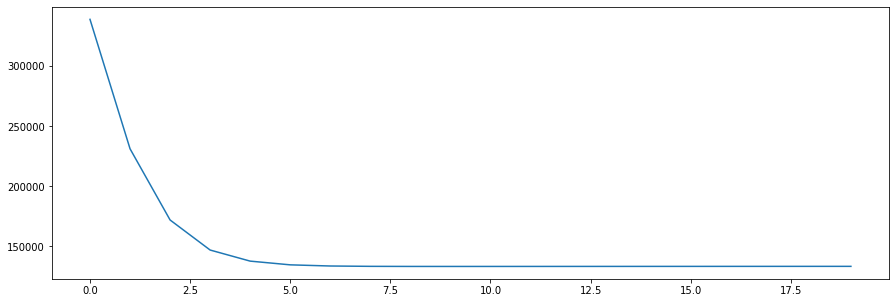

...

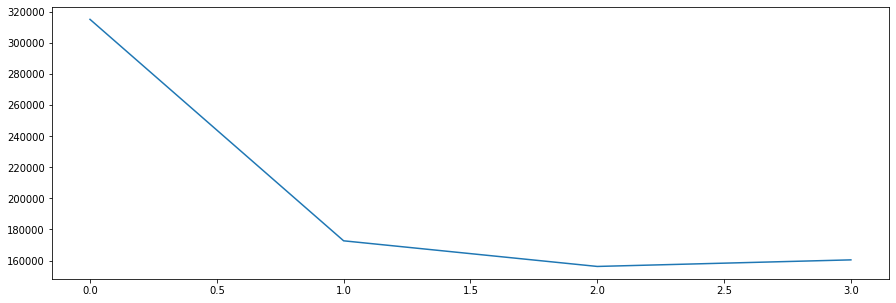

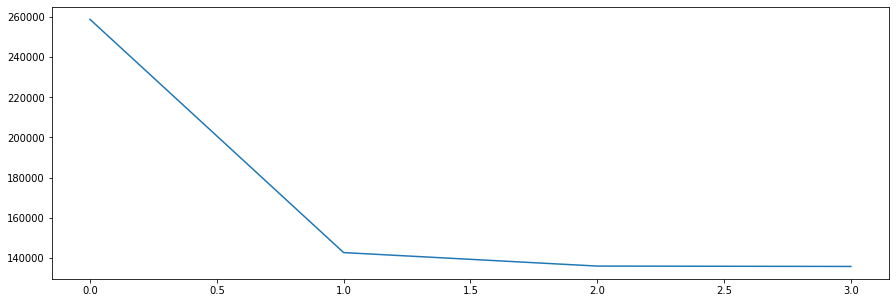

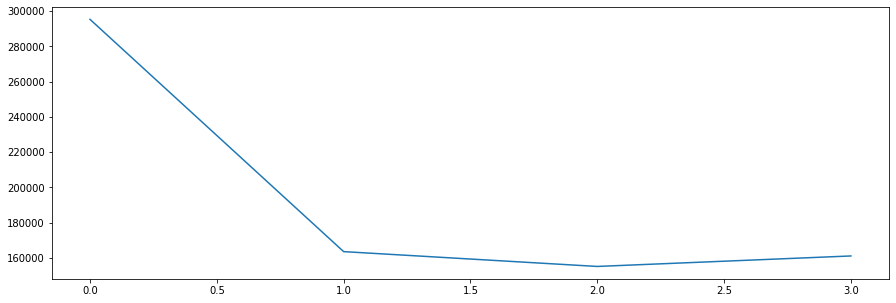

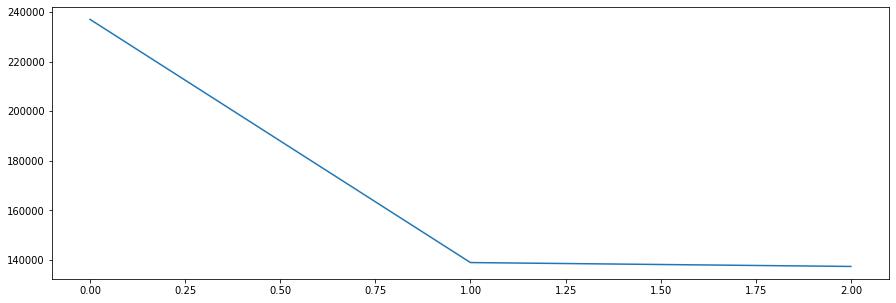

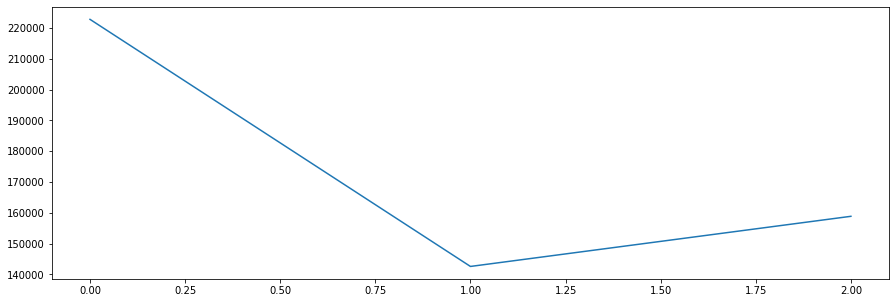

In [100]:
new_model = learn(20, 15000, 900, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
bast model hidden size: 10
bast model hidden size: 10
tensor(625246.3125) tensor(625246.3125)
epoch: 2
bast model hidden size: 10
epoch: 3
bast model hidden size: 10
epoch: 4
bast model hidden size: 10
epoch: 5
bast model hidden size: 10
bast model hidden size: 10
tensor(526627.8125) tensor(526627.8125)
epoch: 7
bast model hidden size: 10
epoch: 8
bast model hidden size: 10
epoch: 9
bast model hidden size: 10
epoch: 10
bast model hidden size: 10
bast model hidden size: 10
tensor(445935.6875) tensor(445935.6875)
epoch: 12
bast model hidden size: 10
epoch: 13
bast model hidden size: 10
epoch: 14
bast model hidden size: 10
epoch: 15
bast model hidden size: 10
bast model hidden size: 10
tensor(381203.5000) tensor(381203.5000)
epoch: 17
bast model hidden size: 10
epoch: 18
bast model hidden size: 10
epoch: 19
bast model hidden size: 10
epoch:  19 loss: 222260.5000000000
epoch: 0
bast model hidden size: 50
bast model hidden size: 50
tensor(389589.0625) tensor(389589.06

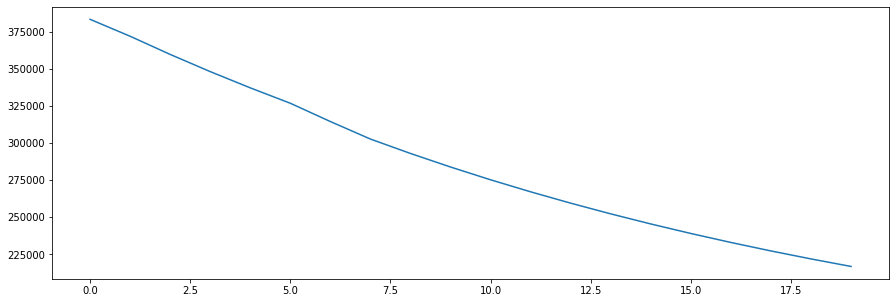

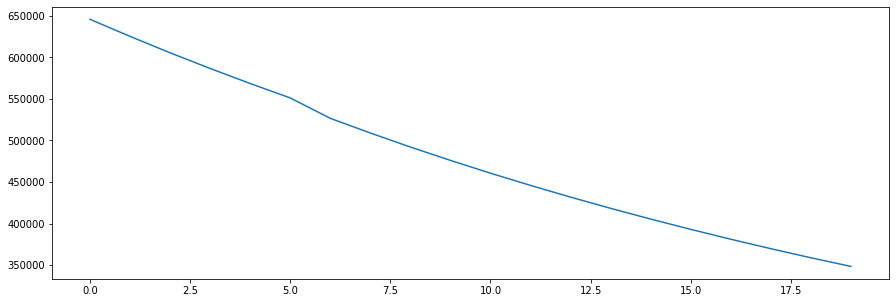

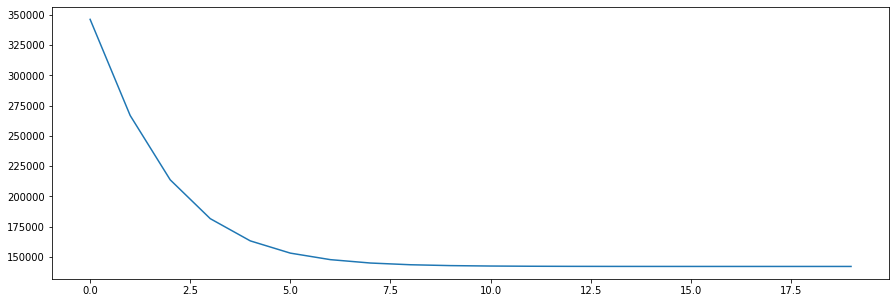

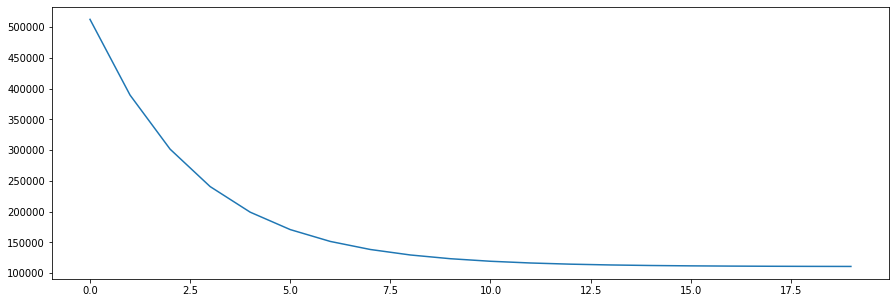

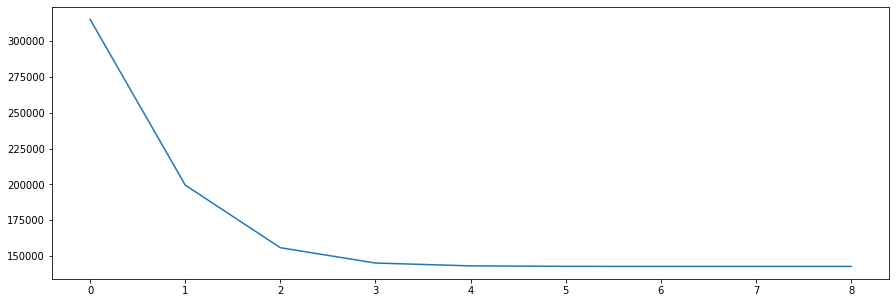

...

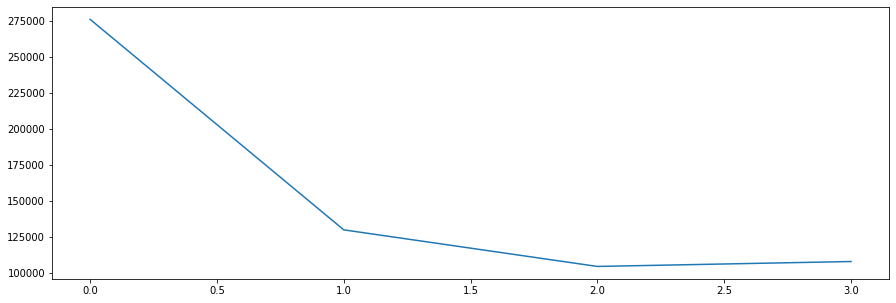

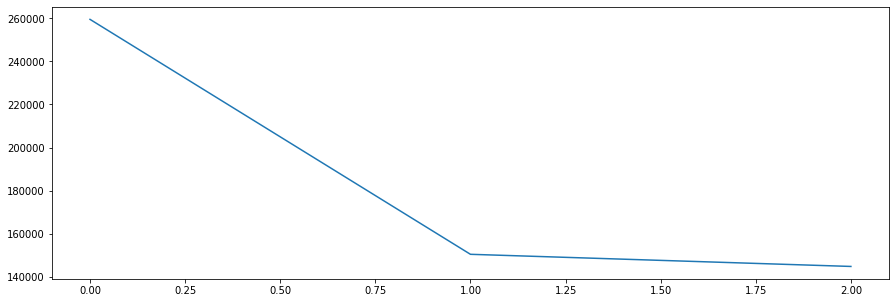

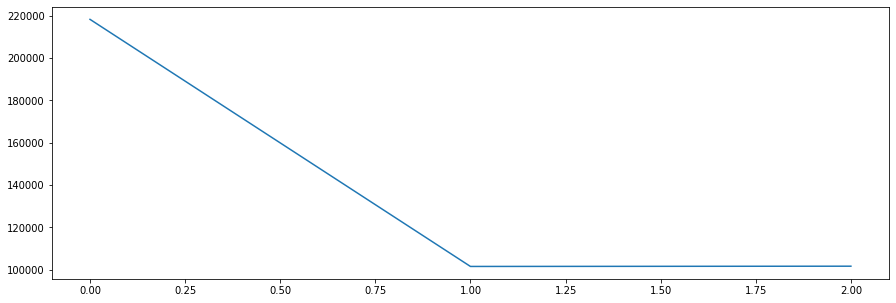

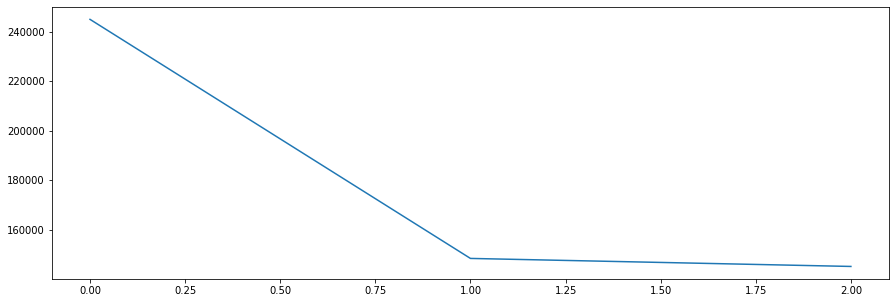

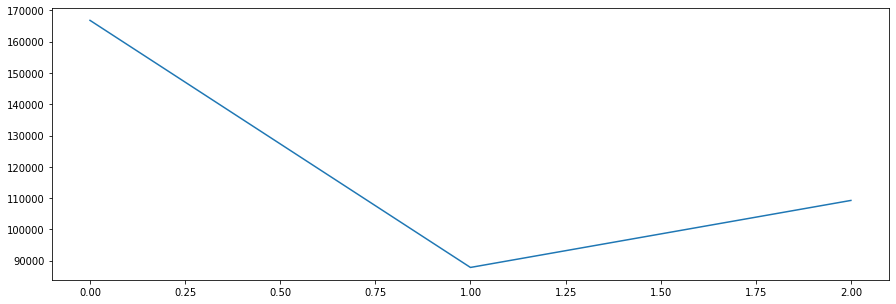

In [101]:
new_model = learn(20, 15000, 950, 0.2)
# evaluate(new_model)

Data is ready
epoch: 0
tensor(185902.3906) tensor(185902.3906)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(111715.9219) tensor(111715.9219)
epoch: 7
epoch: 8
epoch:   8 loss: 86013.4843750000
epoch: 0
tensor(112255.0703) tensor(112255.0703)
epoch: 2
epoch:   2 loss: 99485.5703125000
epoch: 0
tensor(116680.8906) tensor(114503.2500)
epoch:   1 loss: 126070.9140625000
epoch: 0
tensor(114432.5391) tensor(114432.5391)
epoch: 2
epoch: 3
epoch:   3 loss: 94729.2890625000
epoch: 0
tensor(115155.5781) tensor(114600.7109)
epoch:   1 loss: 117593.1875000000
best model hidden size: 300
0.007617678530574441
36.04335356718435


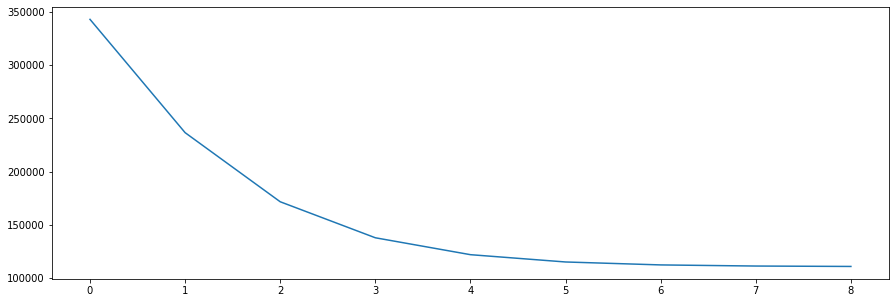

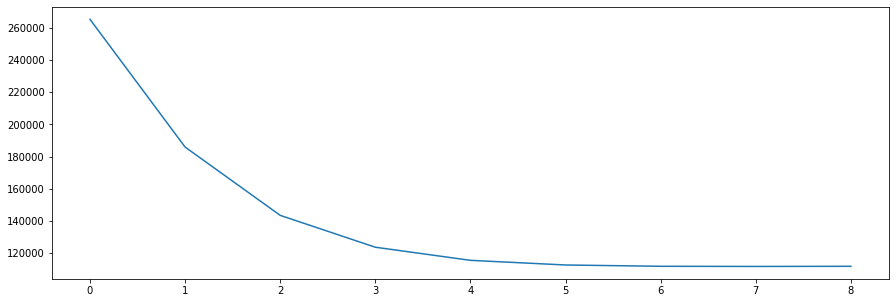

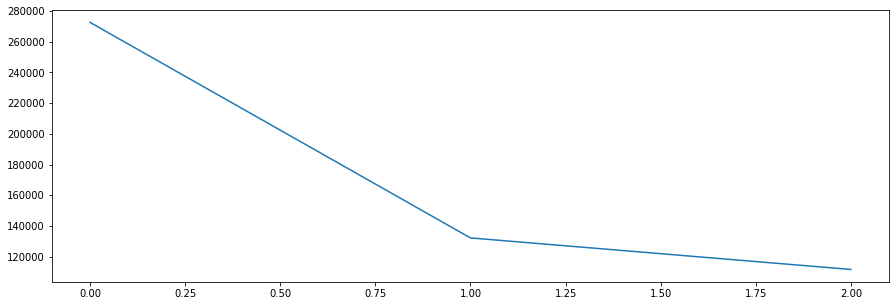

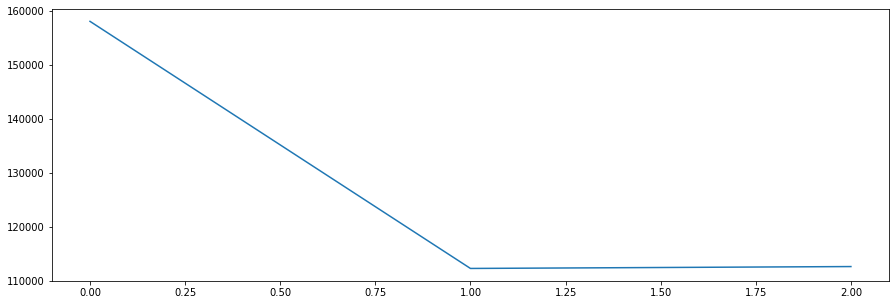

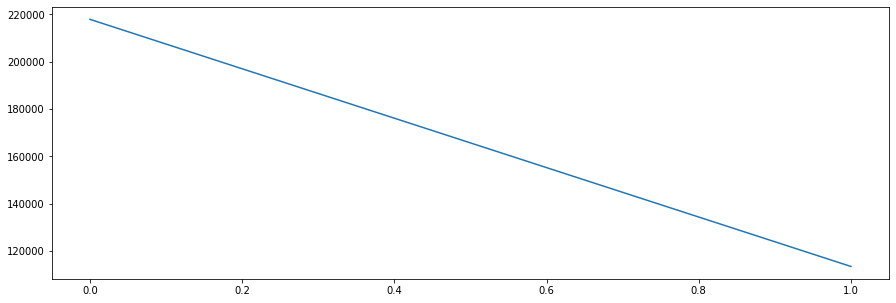

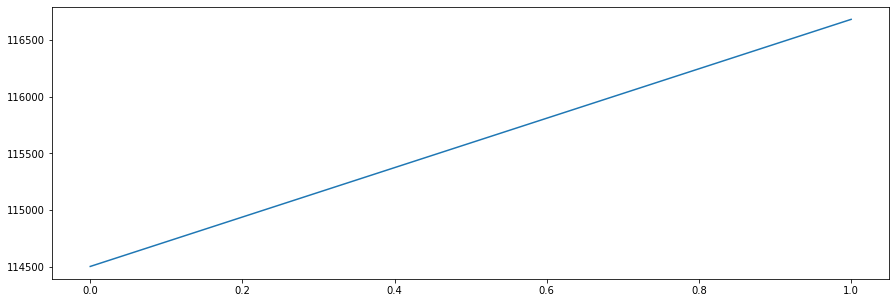

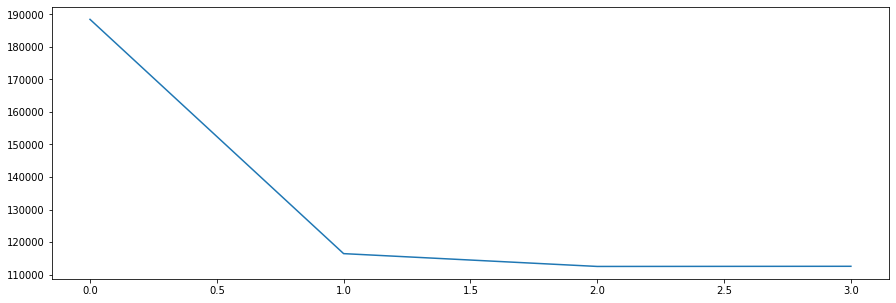

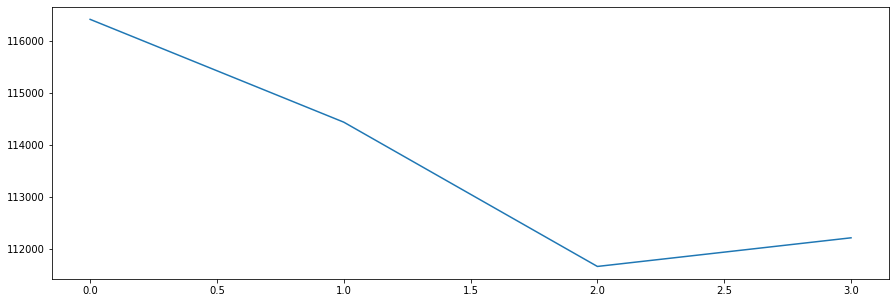

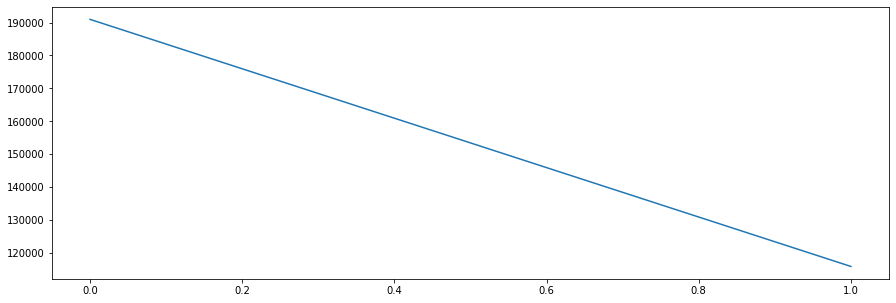

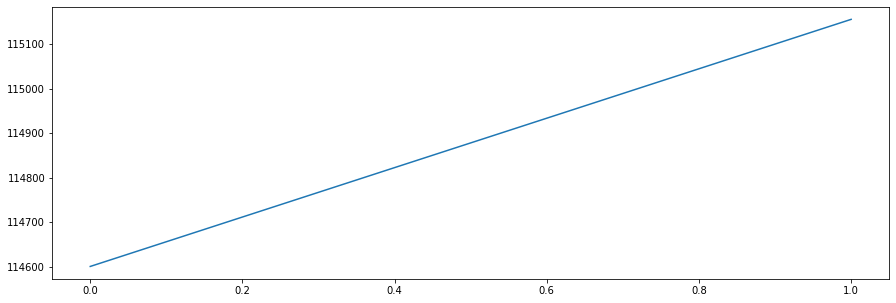

In [125]:
new_model = learn(20, 15000, 1000, 0.4)
# evaluate(new_model)

In [10]:
def learn(num, count, data_len, lr=0.01):
    num = [str(i) for i in range(num)]
    p1 = [read_csv('ics_data_preprocessed/06_Smart_Meter_45/P1/' + str(count) + '/' + n + '.csv', squeeze=True, parse_dates=['ts'], index_col='ts') for n in num]
    
    p1 = [prepare_data(df, data_len) for df in p1]
    p1 = sum(p1, [])
    p1 = [df.values.tolist() for df in p1]
    
    train, test = train_test_split(p1, test_size=0.2, random_state=42)
    train_data_normalized = train
    test_data_normalized = test
    
    train_data, val_data = train_test_split(train_data_normalized, test_size=0.15, random_state=42)
    train_data = torch.FloatTensor(train_data)
    val_data = torch.FloatTensor(val_data)
    test_data = torch.FloatTensor(test_data_normalized)
    
    X_train = train_data[:, :-10]
    y_train = train_data[:, -10:]
    X_val = val_data[:, :-10]
    y_val = val_data[:, -10:]
    X_test = test_data[:, :-10]
    y_test = test_data[:, -10:]
    
    print("Data is ready")
    
    best_model = LSTM()
    loss_function = nn.MSELoss()
    
    best_hidden_layer_size = 50
    
    for hidden_layer_size in [300]:
        losses = []
        val_losses = []
    
        model = LSTM(hidden_layer_size=hidden_layer_size)
        optimizer = torch.optim.Adam(model.parameters(), lr=0.2)
    
        epochs = 20
        
        for i in range(epochs):
            if i%5 != 1:
                print("epoch:", i)
            model.train()
            
            losses_tmp = []
            for (seq, labels) in zip(X_train, y_train):
                optimizer.zero_grad()
                model.hidden_cell = (torch.zeros(1, 1, model.hidden_layer_size),
                                     torch.zeros(1, 1, model.hidden_layer_size))

                y_pred = model(seq)

                single_loss = loss_function(y_pred, labels)
                losses_tmp.append(single_loss)
                single_loss.backward()
                optimizer.step()
            
            losses.append(sum(losses_tmp) / len(losses_tmp))
            
            model.eval()

            with torch.no_grad():
                val_lo = []
                for (seq, labels) in zip(X_val, y_val):
                    y_pred = model(seq)

                    single_loss = loss_function(y_pred, labels)
                    val_lo.append(single_loss)

                if (len(val_losses) == 0) or ((sum(val_lo) / len(val_lo)) < min(val_losses)):
                    best_hidden_layer_size = hidden_layer_size
                    best_model = model
                
                val_losses.append(sum(val_lo) / len(val_lo))
            
            if (len(val_losses) > 0 and i%5 == 1):
                print(val_losses[-1], min(val_losses))
            if (len(val_losses) > 1) and (val_losses[-1] != min(val_losses)) and ((abs(val_losses[-1] - min(val_losses)) < 0.01) or (val_losses[-1] > min(val_losses))):
                break

        print(f'epoch: {i:3} loss: {single_loss.item():10.10f}')
        
        print("tmp best model hidden size:", best_hidden_layer_size)
    
        predictions = []
        best_model.eval()
        with torch.no_grad():
            predictions = [best_model(seq) for (seq, labels) in zip(X_test, y_test)]
        pred = [torch.cat((i, j)) for (i, j) in zip(X_test, predictions)]
        actual_predictions = np.array([np.array(i) for i in pred])
        mape = [np.mean(np.abs(actual_predictions[i] - test[i])/np.abs(test[i])) for i in range(len(test))]
        print(sum(mape) / len(mape))
        rmse = [np.mean((actual_predictions[i] - test[i])**2)**.5 for i in range(len(test))]
        print(sum(rmse) / len(rmse))
        
        plt.figure()
        plt.plot(losses)
        plt.figure()
        plt.plot(val_losses)
        
    print("best model hidden size:", best_hidden_layer_size)
    

    
    return best_model
     

In [9]:
num = [str(i) for i in range(19)]
p1 = [read_csv('ics_data_preprocessed/06_Smart_Meter_45/P1/5000/' + n + '.csv', squeeze=True, parse_dates=['ts'], index_col='ts') for n in num]
    
p1 = [prepare_data(df, 1000) for df in p1]
p1 = sum(p1, [])
p1 = [df.values.tolist() for df in p1]
    
train, test = train_test_split(p1, test_size=0.2, random_state=42)
train_data_normalized = train
test_data_normalized = test
    
train_data, val_data = train_test_split(train_data_normalized, test_size=0.15, random_state=42)
train_data = torch.FloatTensor(train_data)
val_data = torch.FloatTensor(val_data)
test_data = torch.FloatTensor(test_data_normalized)
    
X_train = train_data[:, :-10]
y_train = train_data[:, -10:]
X_val = val_data[:, :-10]
y_val = val_data[:, -10:]
X_test = test_data[:, :-10]
y_test = test_data[:, -10:]
    
print("Data is ready")
    
loss_function = nn.MSELoss()
    
val_losses = []
    
best_hidden_layer_size = 300
    

losses = []
        
    
best_model = LSTM(hidden_layer_size=best_hidden_layer_size)
model = LSTM(hidden_layer_size=best_hidden_layer_size)
optimizer = torch.optim.Adam(model.parameters(), lr=0.2)
    
epochs = 1000
    
for i in range(epochs):
    model.train()
            
    optimizer.zero_grad()
    
    model.hidden_cell = (torch.zeros(1, 1, model.hidden_layer_size),
                        torch.zeros(1, 1, model.hidden_layer_size))
            
    y_pred = model(X_train)
    single_loss = loss_function(y_pred, y_train)
    losses.append(single_loss)
            
    single_loss.backward()
    optimizer.step()
            
            
    model.eval()

    with torch.no_grad():
        y_pred = model(X_val)

        single_loss = loss_function(y_pred, y_val)

        if (len(val_losses) == 0) or (single_loss < min(val_losses)):

            best_model = model
                
        val_losses.append(single_loss)

    
print("best model hidden size:", best_hidden_layer_size)
    
predictions = []
best_model.eval()
with torch.no_grad():
    predictions = [best_model(seq) for (seq, labels) in zip(X_test, y_test)]
pred = [torch.cat((i, j)) for (i, j) in zip(X_test, predictions)]
actual_predictions = np.array([np.array(i) for i in pred])
mape = [np.mean(np.abs(actual_predictions[i] - test[i])/np.abs(test[i])) for i in range(len(test))]
print(sum(mape) / len(mape))
rmse = [np.mean((actual_predictions[i] - test[i])**2)**.5 for i in range(len(test))]
print(sum(rmse) / len(rmse))

Data is ready


RuntimeError: input.size(-1) must be equal to input_size. Expected 1, got 990

Data is ready
epoch: 0
tensor(356850.8438) tensor(356850.8438)
epoch: 2
epoch:   2 loss: 519857.0000000000
tmp best model hidden size: 300
0.012050124663191573
67.27699040815975
best model hidden size: 300


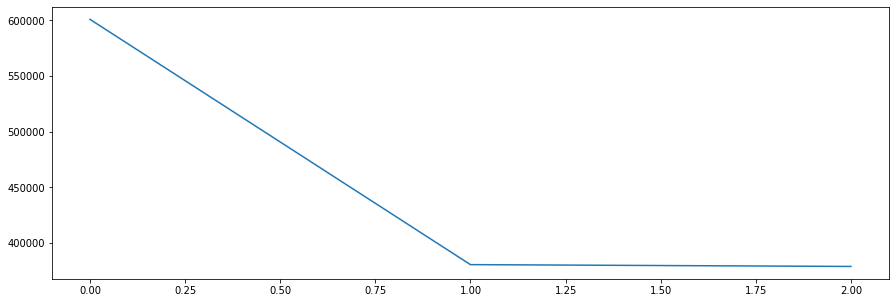

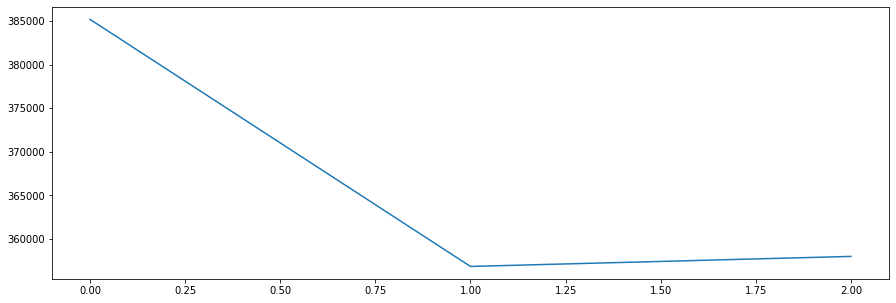

In [11]:
new_model = learn(19, 5000, 1000, 0.2)

In [12]:
predictions = []
new_model.eval()
with torch.no_grad():
    predictions = [new_model(seq) for (seq, labels) in zip(X_test, y_test)]
pred = [torch.cat((i, j)) for (i, j) in zip(X_test, predictions)]
actual_predictions = np.array([np.array(i) for i in pred])
mape = [np.mean(np.abs(actual_predictions[i] - test[i])/np.abs(test[i])) for i in range(len(test))]
print(sum(mape) / len(mape))
rmse = [np.mean((actual_predictions[i] - test[i])**2)**.5 for i in range(len(test))]
print(sum(rmse) / len(rmse))

0.012050124663191573
67.27699040815975


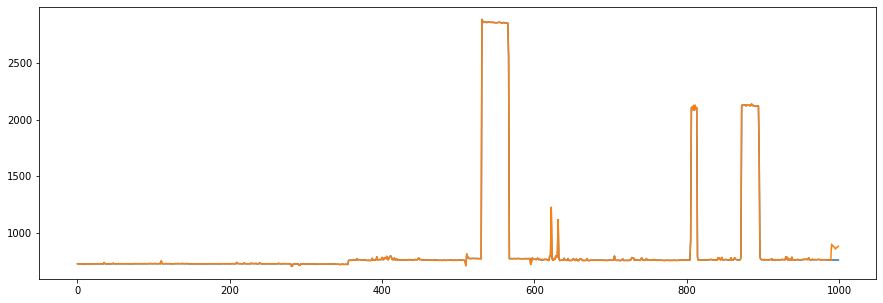

In [28]:
n = 15
plt.plot(test_data[n].numpy())
plt.plot(actual_predictions[n])

Data is ready
epoch: 0
tensor(433847.5312) tensor(433847.5312)
epoch: 2
epoch: 3
epoch: 4
epoch: 5
tensor(325122.2500) tensor(325122.2500)
epoch: 7
epoch: 8
epoch:   8 loss: 320143.7812500000
tmp best model hidden size: 300
0.005836069274905064
4.835042690048226
best model hidden size: 300


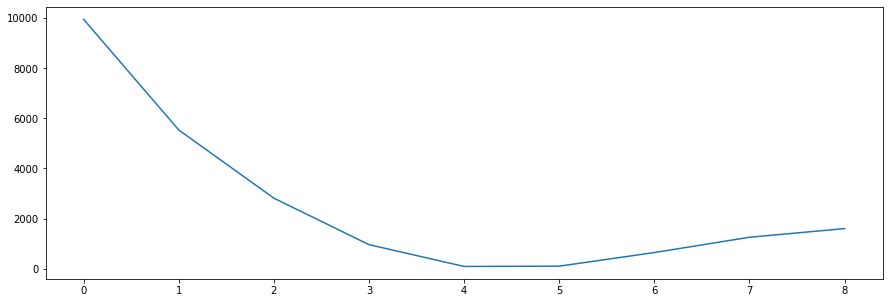

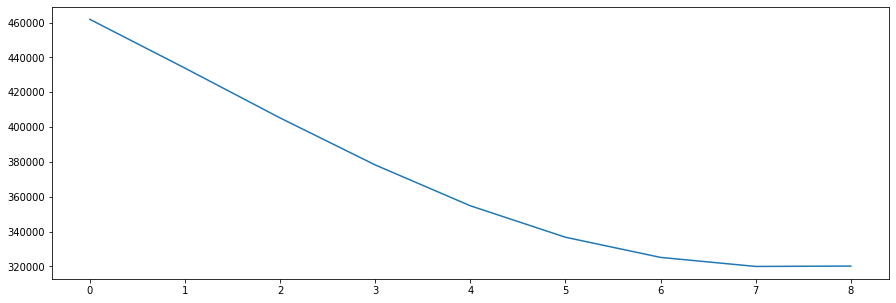

In [30]:
new_model = learn(22, 1000, 700, 0.2)

In [31]:
predictions = []
new_model.eval()
with torch.no_grad():
    predictions = [new_model(seq) for (seq, labels) in zip(X_test, y_test)]
pred = [torch.cat((i, j)) for (i, j) in zip(X_test, predictions)]
actual_predictions = np.array([np.array(i) for i in pred])
mape = [np.mean(np.abs(actual_predictions[i] - test[i])/np.abs(test[i])) for i in range(len(test))]
print(sum(mape) / len(mape))
rmse = [np.mean((actual_predictions[i] - test[i])**2)**.5 for i in range(len(test))]
print(sum(rmse) / len(rmse))

0.007248858859538579
104.20284462760097


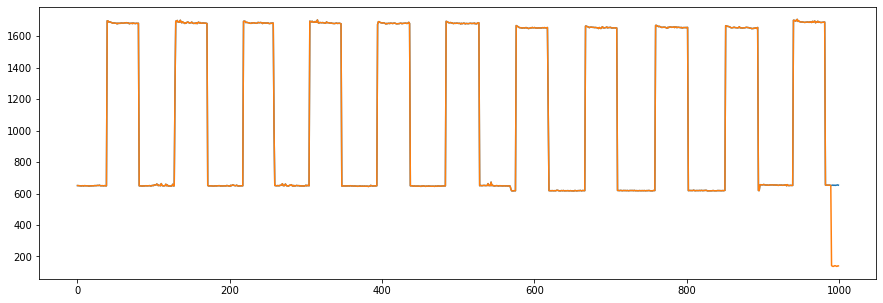

In [42]:
n = 1
plt.plot(test_data[n].numpy())
plt.plot(actual_predictions[n])

650.375